<a href="https://colab.research.google.com/github/arpanbiswas52/pcVAEBO_pyrochlore/blob/main/data/pcVAEBO__Ho2Ti2O7(2D).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Automated Refinement of the Structure parameters of Ho2Ti2O7

- The simulation of generating diffraction data is conducted from GSAS2 software




#Problem Description

Build a physically constrained Variational Autoencoder (pcVAE) assisted BO framework-

- Here we have an experimental set up of refinement of structure parameters of Spin Ice model, to match the experimental results of X-ray diffraction.

- The goal is to do an automated experiment set up through BO model- where we sequnetially learn and adaptively sample towards region of best structure parameters (theory-experiment matching).

- In this notebook, we set up the BO with 2 control parameters $OccTi$, $OccHo$ -- based on the earlier 4D explorations presented in other notebook. https://github.com/arpanbiswas52/pcVAEBO_pyrochlore/blob/main/data/pcVAEBO__Ho2Ti2O7.ipynb

- The other 6 parameters are fixed in this case.


In [ ]:
# NECESSARY MODULES

!pip install botorch
!pip install gpytorch
!pip install smt
!pip install scikit-image
!pip install numpy==1.26.4
!pip install scipy==1.14.0
!pip install matplotlib
!pip install pillow==10.3.0
!pip install torchvision

In [ ]:
#@title Imports
import torch
from torchvision import datasets, transforms
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import pickle
import random
from skimage.transform import resize
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Import GP and BoTorch functions
import gpytorch as gpt
from botorch.models import SingleTaskGP, ModelListGP
#from botorch.models import gpytorch
from botorch.fit import fit_gpytorch_model
from botorch.models.gpytorch import GPyTorchModel
from botorch.utils import standardize
from gpytorch.distributions import MultivariateNormal
from gpytorch.kernels import ScaleKernel, RBFKernel, MaternKernel, PiecewisePolynomialKernel, PeriodicKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import ConstantMean, LinearMean
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf
from botorch.acquisition import qExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.sampling import IIDNormalSampler
from botorch.sampling import SobolQMCNormalSampler
from gpytorch.likelihoods.likelihood import Likelihood
from gpytorch.constraints import GreaterThan
from botorch.generation import get_best_candidates, gen_candidates_torch
from botorch.optim import gen_batch_initial_conditions
from gpytorch.models import ExactGP

from smt.sampling_methods import LHS
from torch.optim import SGD
from torch.optim import Adam
from scipy.stats import norm
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

# Import GSAS modules
import os
import sys
sys.path.insert(0, os.path.expanduser(r"C:\Users\USER\gsas2full\GSAS-II\GSASII"))
import GSASIIscriptable as G2sc
from gsas import gsas
import torch.nn as nn

import io
import contextlib
#For experimental analysis

#import WSe2_Target_Extractor as target - Talk to sumner can we import this?

In [ ]:
# Define the Variational Autoencoder (VAE) architecture
class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1000),
            nn.ReLU(),
            nn.Linear(1000, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
        )
        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, 1000),
            nn.ReLU(),
            nn.Linear(1000, input_dim),
        )

    def encode(self, x):
        h = self.encoder(x)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        logvar = torch.clamp(logvar, min=-10, max=10)  # Clamp to prevent large values
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        decoded = self.decoder(z)
        return torch.abs(decoded)  # Apply absolute value to ensure non-negative outputs

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        reconstructed = self.decode(z)
        return reconstructed, mu, logvar

# Define loss function
def loss_function(reconstructed, original, mu, logvar):
    reconstruction_loss = nn.functional.mse_loss(reconstructed, original, reduction='sum')
    kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return reconstruction_loss + kl_divergence

# Initialize weights with Xavier initialization
def init_weights(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)

# Function to train the VAE with loss tracking for convergence plot
def train_vae(vae, dataloader, epochs=2000, lr=0.0001):
    optimizer = optim.Adam(vae.parameters(), lr=lr)
    vae.train()
    loss_history = []  # To store loss for each epoch

    for epoch in range(epochs):
        train_loss = 0
        for batch in dataloader:
            batch_data = batch[0]
            optimizer.zero_grad()
            reconstructed, mu, logvar = vae(batch_data)

            # Calculate the loss
            loss = loss_function(reconstructed, batch_data, mu, logvar)

            # Check for NaN or Inf loss
            if torch.isnan(loss) or torch.isinf(loss):
                print("NaN or Inf loss encountered, stopping training.")
                return

            loss.backward()
            torch.nn.utils.clip_grad_norm_(vae.parameters(), max_norm=1.0)  # Clip gradients
            optimizer.step()
            train_loss += loss.item()

        avg_loss = train_loss / len(dataloader.dataset)
        loss_history.append(avg_loss)  # Append average loss of this epoch
        print(f'Epoch {epoch + 1}, Loss: {avg_loss:.4f}')

    # Plot convergence curve
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, epochs + 1), loss_history, label="Training Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Convergence Curve (Epoch vs. Loss)")
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
# Empty arrays to store F_obs and F_calc reflection lists
# Make sure to run this code block again when re-running code to reset arrays and iteration
# Iteration is just for .gpx filenames, you can ignore it if need be or set it const in gsas script
Fobs = []
Fcalc = []
iteration = 0

# Loading the VAE model, pretrained with X-ray data

- The notebook for the VAE model training and analysis can be found at <Arpan- Joseph, add the link for the VAE final notebook>

In [ ]:
vae = torch.load("vae_full_model.pth", weights_only=False)
#vae = torch.load("vae_full_model.pth")

# Design objective function integrating with pretrained VAE

In [ ]:
def func_obj(X, fixed_param, iteration, pre_trained_model):
    # Run GSAS once to get Fobs_i and Fcalc_i
    #chisq, Fobs_i, Fcalc_i, iteration = gsas(X, fixed_param, iteration)
    _, Fobs_i, Fcalc_i, iteration = gsas(X, fixed_param, iteration)

    # Scaling
    # Scaling
    F_obs_arr = np.asarray(Fobs_i, dtype=float)
    obs_arr = (F_obs_arr * 1000) / F_obs_arr[452]

    F_calc_arr = np.asarray(Fcalc_i, dtype=float)
    calc_arr = (F_calc_arr * 1000) / F_calc_arr[452]

    # Latent representation
    vae.eval()
    with torch.no_grad():
        obs_tensor = torch.tensor(obs_arr, dtype=torch.float32).unsqueeze(0)
        mu_o, logvar_o = pre_trained_model.encode(obs_tensor)
        latent_obs = vae.reparameterize(mu_o, logvar_o).squeeze(0)

        calc_tensor = torch.tensor(calc_arr, dtype=torch.float32).unsqueeze(0)
        mu_c, logvar_c = pre_trained_model.encode(calc_tensor)

        num_samples = 10000 # we are sampling 10,000 times from the latent space
        latent_dim = 7 # same as the latent dimension of the pre-trained model
        latent_samples = torch.zeros((num_samples, latent_dim), dtype=torch.float32)

        for k in range(num_samples):
            z_c = vae.reparameterize(mu_c, logvar_c).squeeze(0)
            latent_samples[k] = z_c

        sum_latents_calc = torch.sum(latent_samples, dim=0)
        mean_latent_calc = sum_latents_calc / num_samples

    # chi-square calculation
    diff = latent_obs - mean_latent_calc
    chisq_l = torch.sqrt(torch.sum(diff**2) / (latent_dim - 1))
    print('latent_obs:', latent_obs)
    print('mean_latent_calc:', mean_latent_calc)

    ####################################################################################################################
        # Cal chisq_scaled
    diff  = F_obs_arr - F_calc_arr
    chisq = np.sqrt(np.sum(diff**2) / (len(obs_arr) - 1))
    chisq = chisq/1000
    print('chisq_scaled:', chisq)


    """
    plt.figure()
    plt.scatter(Fobs_i, Fcalc_i, alpha=0.7, s=10, label='Data Points')
    min_val = min(min(Fobs_i), min(Fcalc_i))
    max_val = max(max(Fobs_i), max(Fcalc_i))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='y = x')

    plt.xlabel('unscaled Fobs_i')
    plt.ylabel('unscaled Fcalc_i')
    plt.title('unscaled Fobs_i vs unscaled Fcalc_i')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    """
    ####################################################################################################################

    # Fobs_i, Fcalc_i plot in the original space
    plt.figure()
    plt.scatter(obs_arr, calc_arr, alpha=0.7, s=10, label='Data Points')
    min_val = min(min(obs_arr), min(calc_arr))
    max_val = max(max(obs_arr), max(obs_arr))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='y = x')

    plt.xlabel('Fobs_i')
    plt.ylabel('calc_i')
    plt.title('Fobs_i vs Fcalc_i')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure()
    for k in range(num_samples):
        plt.plot(range(latent_dim), latent_samples[k], alpha=0.1, linewidth=0.2)
    plt.xlabel('Latent Dimension Index')
    plt.ylabel('Latent Values')
    plt.title('10,000 Latent Realizations')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    # 10 of the the latent realizations
    print("First 10 latent vectors from the VAE:")
    for i in range(10):
        print(f"Sample {i+1}: {latent_samples[i].tolist()}")

    print("chisq_l:", chisq_l)
    return chisq_l, chisq

In [ ]:
# Calling GSAS script
# def func_obj(X, fixed_param, iteration):
    # chisq, Fobs_i, Fcalc_i, iteration = gsas(X, fixed_param, iteration)

    # Fobs.append(Fobs_i)
    # Fcalc.append(Fcalc_i)

    # return chisq

Below section defines the list of functions (user calls these functions during analysis):
1. Gaussian Process
2. Optimimize Hyperparameter of Gaussian Process (using Adam optimizer)
3. Posterior means and variance computation
4. Acquistion functions for BO- Expected Improvmement

In [ ]:
class SimpleCustomGP(ExactGP, GPyTorchModel):
    _num_outputs = 1  # to inform GPyTorchModel API

    def __init__(self, train_X, train_Y):
        # squeeze output dim before passing train_Y to ExactGP
        super().__init__(train_X, train_Y.squeeze(-1), GaussianLikelihood())
        self.mean_module = ConstantMean()
        #self.mean_module = LinearMean(train_X.shape[-1])
        self.covar_module = ScaleKernel(
            #base_kernel=MaternKernel(nu=0.5, ard_num_dims=train_X.shape[-1]),
            #base_kernel=RBFKernel(ard_num_dims=train_X.shape[-1]),
            # base_kernel=PeriodicKernel(ard_num_dims=train_X.shape[-1])
            base_kernel = PiecewisePolynomialKernel(power = 2, ard_num_dims=train_X.shape[-1]),
        )
        self.to(train_X)  # make sure we're on the right device/dtype

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)


#Optimize Hyperparameters of GP#
def optimize_hyperparam_trainGP(train_X, train_Y):
    # Gp model fit

    gp_surro = SimpleCustomGP(train_X, train_Y)
    gp_surro = gp_surro.double()
    gp_surro.likelihood.noise_covar.register_constraint("raw_noise", GreaterThan(1e-1))
    mll1 = ExactMarginalLogLikelihood(gp_surro.likelihood, gp_surro)
    # fit_gpytorch_model(mll)
    mll1 = mll1.to(train_X)
    gp_surro.train()
    gp_surro.likelihood.train()
    ## Here we use Adam optimizer with learning rate =0.1, user can change here with different algorithm and/or learning rate for each GP
    optimizer1 = Adam([{'params': gp_surro.parameters()}], lr=0.1, weight_decay = 0.01)
    #optimizer1 = SGD([{'params': gp_surro.parameters()}], lr=0.0001)

    NUM_EPOCHS = 300

    for epoch in range(NUM_EPOCHS):
        # clear gradients
        optimizer1.zero_grad()
        # forward pass through the model to obtain the output MultivariateNormal
        output1 = gp_surro(train_X)
        # Compute negative marginal log likelihood
        loss1 = - mll1(output1, gp_surro.train_targets)
        # back prop gradients
        loss1.backward(retain_graph=True)
        # print last iterations
        if (epoch + 1) > NUM_EPOCHS: #Stopping the print for now
            print("GP Model trained:")
            print("Iteration:" + str(epoch + 1))
            print("Loss:" + str(loss1.item()))
            # print("Length Scale:" +str(gp_PZO.covar_module.base_kernel.lengthscale.item()))
            print("noise:" + str(gp_surro.likelihood.noise.item()))

        optimizer1.step()

    gp_surro.eval()
    gp_surro.likelihood.eval()
    return gp_surro



#GP posterior predictions#
def cal_posterior(gp_surro, test_X, X, norm=False):
    X1, X2 = X[0], X[1]
    X1, X2 = torch.meshgrid(X1, X2, indexing='ij')  # Use indexing='ij' for clarity

    if norm == "True":
        X1 = (X1 - torch.min(X1)) / (torch.max(X1) - torch.min(X1))
        X2 = (X2 - torch.min(X2)) / (torch.max(X2) - torch.min(X2))

    y_pred_means_mat = torch.empty(len(test_X), 1)
    y_pred_means_mesh = torch.empty(X1.shape)
    y_pred_vars_mat = torch.empty(len(test_X), 1)
    y_pred_vars_mesh = torch.empty(X1.shape)
    t_X = torch.empty(1, test_X.shape[1])

    with torch.no_grad(), gpt.settings.max_lanczos_quadrature_iterations(32), \
         gpt.settings.fast_computations(covar_root_decomposition=False, log_prob=False, solves=True), \
         gpt.settings.max_cg_iterations(100), \
         gpt.settings.max_preconditioner_size(80), \
         gpt.settings.num_trace_samples(128):

        for t in range(len(test_X)):
            for i in range(test_X.shape[1]):
                t_X[:, i] = test_X[t, i]
            y_pred_surro = gp_surro.posterior(t_X)
            y_pred_means_mat[t, 0] = y_pred_surro.mean
            y_pred_vars_mat[t, 0] = y_pred_surro.variance

        for i in range(X1.shape[0]):
            for j in range(X1.shape[1]):
                t_X[:, 0] = X1[i, j]
                t_X[:, 1] = X2[i, j]
                y_pred_surro = gp_surro.posterior(t_X)
                y_pred_means_mesh[i, j] = y_pred_surro.mean
                y_pred_vars_mesh[i, j] = y_pred_surro.variance

    y_pred_means = [y_pred_means_mat, y_pred_means_mesh]
    y_pred_vars = [y_pred_vars_mat, y_pred_vars_mesh]
    return y_pred_means, y_pred_vars


#EI acquistion function#
def acqmanEI(y_means, y_vars, train_Y, ieval, ismin=False):


    y_means = y_means.detach().numpy()
    y_vars = y_vars.detach().numpy()
    y_std = np.sqrt(y_vars)
    if ismin == "True":
        train_Y = - train_Y
        y_means = - y_means
    fmax = train_Y.max()
    fmax = fmax.detach().numpy()
    best_value = fmax
    EI_val = np.zeros(len(y_vars))
    Z = np.zeros(len(y_vars))
    eta = 0.01

    for i in range(0, len(y_std)):
        if (y_std[i] <=0):
            EI_val[i] = 0
        else:
            Z[i] =  (y_means[i]-best_value-eta)/y_std[i]
            EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])

    # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
    EI_val[ieval] = -1
    acq_val = np.max(EI_val)
    acq_cand = [k for k, j in enumerate(EI_val) if j == acq_val]
    #print(acq_val)
    print("EI:",EI_val)
    #print("ymeans:",y_means)
    #print("best value:", best_value)
    return acq_cand, acq_val, EI_val

#Other list of functions-

1. Evaluate initial data and normalize all data
2. Evaluate functions for new data and augment data

In [ ]:
def normalize_get_initialdata_SpinIce(X, fix_params, num, m):
    # Cartesian product from only X[0] and X[1]
    X_feas = torch.empty((X[0].shape[0] * X[1].shape[0], 2))
    k = 0
    for t1 in range(X[0].shape[0]):
        for t2 in range(X[1].shape[0]):
            X_feas[k, 0] = X[0][t1]
            X_feas[k, 1] = X[1][t2]
            k += 1

    # Normalize X
    X_feas_norm = torch.empty_like(X_feas)
    for i in range(X_feas.shape[1]):
        X_feas_norm[:, i] = (X_feas[:, i] - torch.min(X_feas[:, i])) / (torch.max(X_feas[:, i]) - torch.min(X_feas[:, i]))

    # Select random starting samples
    np.random.seed(0)
    idx = np.random.randint(0, len(X_feas), num)
    train_X = X_feas[idx]
    train_X_norm = X_feas_norm[idx]

    # Known good parameter (same 2D shape)
    #a = torch.tensor([0.661541, 0.918248])
    #a_norm = torch.empty((1, X_feas.shape[1]))
    #for i in range(X_feas.shape[1]):
        #a_norm[0, i] = (a[i] - torch.min(X_feas[:, i])) / (torch.max(X_feas[:, i]) - torch.min(X_feas[:, i]))

    # Append it
    #train_X = torch.vstack((train_X, a))
    #train_X_norm = torch.vstack((train_X_norm, a_norm))

    # Output placeholders
    train_Y = torch.empty((train_X.shape[0], 1))
    train_chisq = torch.empty((train_X.shape[0], 1))

    # Evaluate training points
    x = torch.empty((1, train_X.shape[1]))
    for i in range(train_X.shape[0]):
        x[0] = train_X[i]
        print("Function eval #" + str(m + 1))
        train_Y[i, 0], train_chisq[i, 0] = func_obj(x, fix_params, iteration, pre_trained_model=vae)
        m += 1

    return X_feas, X_feas_norm, train_X, train_X_norm, train_Y, train_chisq, idx, m

In [ ]:
################################Augment data - Existing training data with new evaluated data################################
def augment_newdata_SpinIce(acq_X, acq_X_norm, train_X, train_X_norm, train_Y, train_chisq, fix_params, m):

    nextX = acq_X
    nextX_norm = acq_X_norm
    #train_X_norm = torch.cat((train_X_norm, nextX_norm), 0)
    #train_X_norm = train_X_norm.double()
    train_X_norm = torch.vstack((train_X_norm, nextX_norm))
    train_X = torch.vstack((train_X, nextX))

    x = torch.empty((1,train_X.shape[1]))
    for j in range(0, train_X.shape[1]):
        x[0, j] = train_X[-1, j]


    print("Function eval #" + str(m + 1))
    next_feval = torch.empty(1, 1)
    next_chisq = torch.empty(1, 1)
    next_feval[0, 0], next_chisq[0, 0] = func_obj(x, fix_params, iteration, pre_trained_model = vae) # pass to the function where we will connect to experiments
    train_Y = torch.vstack((train_Y, next_feval))
    train_chisq= torch.vstack((train_chisq, next_chisq))

    m = m + 1
    return train_X, train_X_norm, train_Y, train_chisq, m

In [ ]:
def plot_iteration_results(train_X, train_X_norm, train_Y, test_X, test_X_norm,
                           y_pred_means, y_pred_vars, fix_params, i):
    y_pred_means_mat, y_pred_means_mesh = y_pred_means
    y_pred_vars_mat, y_pred_vars_mesh = y_pred_vars

    # Rescale GP predictions to match the scale of train_Y
    y_pred_means_mat = y_pred_means_mat * (torch.max(train_Y) - torch.min(train_Y)) + torch.min(train_Y)
    y_pred_means_mesh = y_pred_means_mesh * (torch.max(train_Y) - torch.min(train_Y)) + torch.min(train_Y)

    # Find best evaluated and best predicted point
    best_Y = torch.min(train_Y)
    ind_eval = torch.argmin(train_Y)
    X_opt = train_X[ind_eval].unsqueeze(0)
    X_opt_norm = train_X_norm[ind_eval].unsqueeze(0)

    best_estY = torch.min(y_pred_means_mat)
    ind_gp = torch.argmin(y_pred_means_mat)
    X_opt_GP = test_X[ind_gp].unsqueeze(0)
    X_opt_GP_norm = test_X_norm[ind_gp].unsqueeze(0)

    print("#########################################################")
    print(f"Current best solutions at iteration: {i}")
    print("Best params among evaluated samples:", X_opt, torch.round(best_Y, decimals=2))
    print("Best params from GP map:", X_opt_GP, torch.round(best_estY, decimals=2))


    from mpl_toolkits.axes_grid1 import make_axes_locatable

    fig, ax = plt.subplots(2, 1, figsize=(10, 8))

    # Define these BEFORE using them
    ymeans_2d = torch.round(y_pred_means_mesh, decimals=2)
    yvars_2d = torch.round(y_pred_vars_mesh, decimals=2)

    # Plot GP mean
    im1 = ax[0].imshow(ymeans_2d.detach().numpy(), origin='lower', cmap='viridis',extent=(0.9, 1.1, 0.9, 1.1))
    ax[0].scatter(train_X[:, 1], train_X[:, 0], c=train_Y.squeeze(), cmap='Reds', edgecolor='black')
    ax[0].set_title("OccHo vs OccTi: GP Mean")
    ax[0].set_xlabel("OccHo")
    ax[0].set_ylabel("OccTi")

    from mpl_toolkits.axes_grid1 import make_axes_locatable
    divider0 = make_axes_locatable(ax[0])
    cax0 = divider0.append_axes("right", size="5%", pad=0.3)
    fig.colorbar(im1, cax=cax0, orientation='vertical')

    # Plot GP variance
    im2 = ax[1].imshow(yvars_2d.detach().numpy(), origin='lower', cmap='viridis', extent=(0.9, 1.1, 0.9, 1.1))
    ax[1].set_title("OccHo vs OccTi: GP Variance")
    ax[1].set_xlabel("OccHo")
    ax[1].set_ylabel("OccTi")

    divider1 = make_axes_locatable(ax[1])
    cax1 = divider1.append_axes("right", size="5%", pad=0.3)
    fig.colorbar(im2, cax=cax1, orientation='vertical')

    plt.tight_layout()
    plt.show()

    return X_opt, X_opt_GP

In [ ]:
def norm_fun(x):
    x = (x-torch.min(x))/(torch.max(x)-torch.min(x))
    #print(x)
    return x

In [ ]:
def rev_norm(x, train_Y):
    #print(torch.max(train_Y)
    x = x*(torch.max(train_Y)-torch.min(train_Y))+ torch.min(train_Y)
    #print(x)
    return x

In [ ]:
#@title BO framework- Integrating the above functions
def BO_SpinIce(X, fix_params, num_start, N):
    num = num_start
    m = 0
    # Initialization: evaluate few initial data normalize data
    test_X, test_X_norm, train_X, train_X_norm, train_Y, train_chisq, idx, m = \
        normalize_get_initialdata_SpinIce(X, fix_params, num, m)


    print("Initial evaluation complete. Start BO")
    ## Gp model fit
    # Calling function to fit and optimizize Hyperparameter of Gaussian Process (using Adam optimizer)
    # Input args- Torch arrays of normalized training data, parameter X and objective eval Y
    # Output args- Gaussian process model lists
    # gp_surro = optimize_hyperparam_trainGP(train_X, train_Y)
    # NORMALIZE train_Y
    train_y_norm = norm_fun(train_Y)
    gp_surro = optimize_hyperparam_trainGP(train_X_norm, train_y_norm) # normalized x NORMALIZE train_Y

    for i in range(1, N + 1):
        # Calculate posterior for analysis for intermidiate iterations
        #y_pred_means, y_pred_vars = cal_posterior(gp_surro, test_X, X, norm = "False")
        y_pred_means, y_pred_vars = cal_posterior(gp_surro, test_X_norm, X, norm = "True")
        y_pred_means_mat, y_pred_means_mesh = y_pred_means[0], y_pred_means[1]
        y_pred_vars_mat, y_pred_vars_mesh = y_pred_vars[0], y_pred_vars[1]

        if ((i == 1) or ((i % 10) == 0)):
            #y_pred_means_real = rev_norm(y_pred_means, train_Y)
            #y_pred_vars_real = rev_norm(y_pred_vars, train_Y)
            # Plotting functions to check the current state exploration and Pareto fronts
            X_eval, X_GP = plot_iteration_results(train_X, train_X_norm, train_Y, test_X, test_X_norm, y_pred_means, y_pred_vars, fix_params, i)

        #print(idx)b
        acq_cand, acq_val, EI_val = acqmanEI(y_pred_means_mat, y_pred_vars_mat, train_y_norm, idx, ismin="True") # NORMALIE Y HERE
        val = acq_val
        ind = np.random.choice(acq_cand) # When multiple points have same acq values
        idx = np.hstack((idx, ind))


        ################################################################
        ## Find next point which maximizes the learning through exploration-exploitation
        if (i == 1):
            val_ini = val
        # Check for convergence
        if ((val) == 0):  # Stop for negligible expected improvement
            print("Model converged due to sufficient learning over search space ")
            break
        else:
            nextX = torch.empty((1, len(X)))
            nextX_norm = torch.empty(1, len(X))
            nextX[0,:] = test_X[ind, :]
            nextX_norm [0, :] = test_X_norm[ind, :]

            # Evaluate true function for new data, augment data
            train_X, train_X_norm, train_Y, train_chisq, m=\
             augment_newdata_SpinIce(nextX, nextX_norm, train_X, train_X_norm, train_Y, train_chisq, fix_params, m) # NORMALIZE train_Y

            # Gp model fit
            # Updating GP with augmented training data
            # gp_surro = optimize_hyperparam_trainGP(train_X, train_Y)
            train_y_norm = norm_fun(train_Y)
            gp_surro = optimize_hyperparam_trainGP(train_X_norm, train_y_norm) # PASS NORM Y

    ## Final posterior prediction after all the sampling done

    if (i == N):
        print("Max. sampling reached, model stopped")


    # --- PLOT FOR train_Y & train_chisq ---
    import pandas as pd
    import matplotlib.pyplot as plt

    # Ensure train_Y and train_chisq are 1D
    train_Y = train_Y.ravel()
    train_chisq = train_chisq.ravel()

    # build history table
    df_history = pd.DataFrame({
        'iteration': range(1, len(train_Y) + 1),
        'train_Y':     train_Y,
        'chi_square':  train_chisq
    })

    print(df_history)

    # plot train_Y convergence
    plt.figure()
    plt.plot(
        df_history['iteration'],
        df_history['train_Y'],
        marker='o'
    )
    plt.xlabel('Iteration')
    plt.ylabel('train_Y')
    plt.title('train_Y Convergence')
    plt.grid(True)
    plt.show()

    # plot chi-square convergence
    plt.figure()
    plt.plot(
        df_history['iteration'],
        df_history['chi_square'],
        marker='o'
    )
    plt.xlabel('Iteration')
    plt.ylabel('Chi-square')
    plt.title('Chi-square Convergence')
    plt.grid(True)
    plt.show()
    # ------------END OF PLOT-------------------------------------------


    #Optimal GP learning
    gp_opt = gp_surro
    # Posterior calculation with converged GP model
    # y_pred_means, y_pred_vars = cal_posterior(gp_opt, test_X, X, norm = "False")
    y_pred_means, y_pred_vars = cal_posterior(gp_opt, test_X_norm, X, norm = "True")
    #print("y_pred_means:",y_pred_means)
    #print("y_pred_vars:",y_pred_vars)
    # Plotting functions to check final iteration
    #y_pred_means_real = rev_norm(y_pred_means, train_Y)
    #y_pred_vars_real = rev_norm(y_pred_vars, train_Y)
    X_opt, X_opt_GP = plot_iteration_results(train_X, train_X_norm, train_Y, test_X, test_X_norm, y_pred_means, y_pred_vars, fix_params, i)

    return  X_opt, X_opt_GP, train_X, train_Y, train_chisq, y_pred_means, y_pred_vars

# Analysis

Function eval #1
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9545454382896423, 0.9646464586257935]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.5177
initial chi^2 8.0047e+05 with 2596 obs.
New scale: 0.5165
Cycle 0: 1.11s, Chi**2: 2.9061e+05 for 2596 obs., Lambda: 0,  Delta: 0.637, SVD=0
New scale: 0.5165
Maximum shift/esd = -160.609 for all cycles
Read from file:C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.bak0.gpx
Save to fil

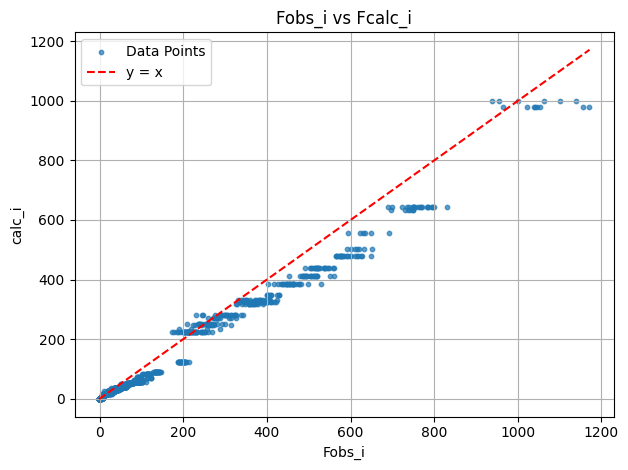

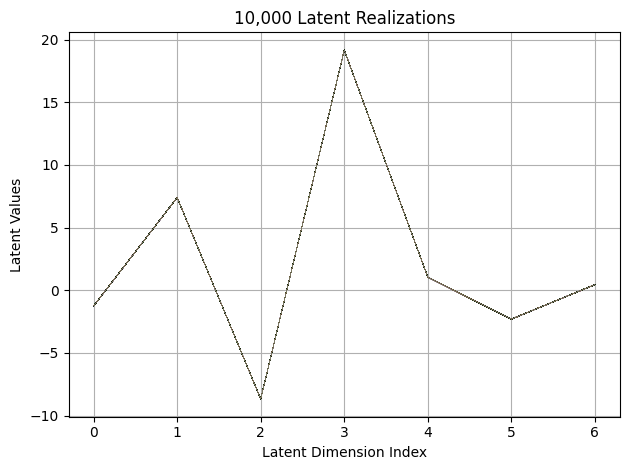

First 10 latent vectors from the VAE:
Sample 1: [-1.2548993825912476, 7.400726318359375, -8.660813331604004, 19.174240112304688, 1.0512911081314087, -2.3045122623443604, 0.4343586266040802]
Sample 2: [-1.2541851997375488, 7.404572486877441, -8.660832405090332, 19.154258728027344, 1.0453970432281494, -2.3091323375701904, 0.44797995686531067]
Sample 3: [-1.255332589149475, 7.398719310760498, -8.680679321289062, 19.16843032836914, 1.046836495399475, -2.29525089263916, 0.4543854296207428]
Sample 4: [-1.2373390197753906, 7.394250869750977, -8.676877975463867, 19.159191131591797, 1.0396723747253418, -2.310945749282837, 0.45646780729293823]
Sample 5: [-1.2592437267303467, 7.402646541595459, -8.679131507873535, 19.167081832885742, 1.05332350730896, -2.3002843856811523, 0.45742201805114746]
Sample 6: [-1.2570444345474243, 7.411742210388184, -8.67243480682373, 19.16482162475586, 1.032852053642273, -2.308779001235962, 0.4498556852340698]
Sample 7: [-1.2604507207870483, 7.4004130363464355, -8.6617

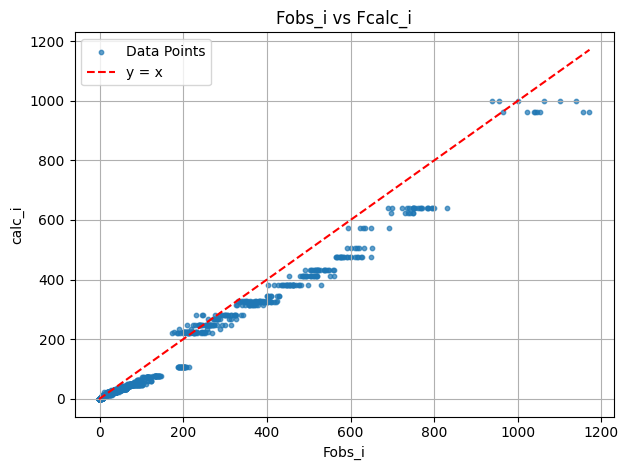

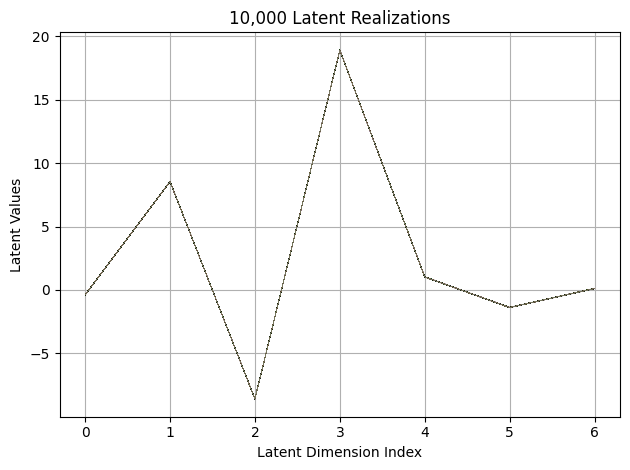

First 10 latent vectors from the VAE:
Sample 1: [-0.39213332533836365, 8.537469863891602, -8.58818244934082, 18.891315460205078, 1.0336288213729858, -1.3814587593078613, 0.11504487693309784]
Sample 2: [-0.3809722363948822, 8.54365062713623, -8.583353042602539, 18.90134620666504, 1.0249731540679932, -1.3813600540161133, 0.1124754548072815]
Sample 3: [-0.38703984022140503, 8.540379524230957, -8.564582824707031, 18.889251708984375, 1.0279793739318848, -1.382256031036377, 0.11485826224088669]
Sample 4: [-0.3947320282459259, 8.558241844177246, -8.58038330078125, 18.88628578186035, 1.0237456560134888, -1.3667848110198975, 0.11850783973932266]
Sample 5: [-0.37838512659072876, 8.542177200317383, -8.58843994140625, 18.8936710357666, 1.023727297782898, -1.3820796012878418, 0.11513124406337738]
Sample 6: [-0.38536345958709717, 8.539766311645508, -8.586418151855469, 18.877155303955078, 1.0328025817871094, -1.37934148311615, 0.11808568239212036]
Sample 7: [-0.38513827323913574, 8.5509614944458, -8.

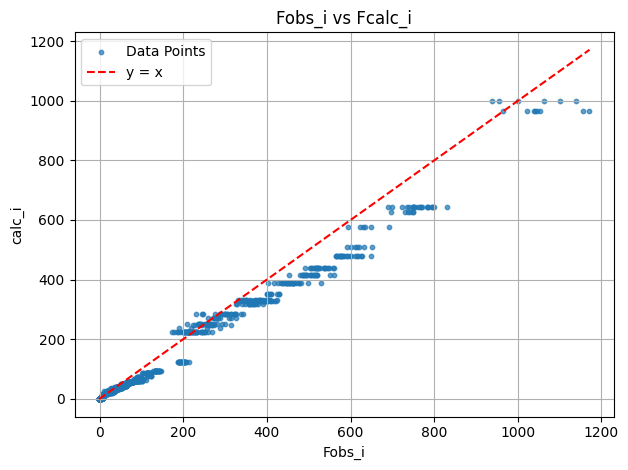

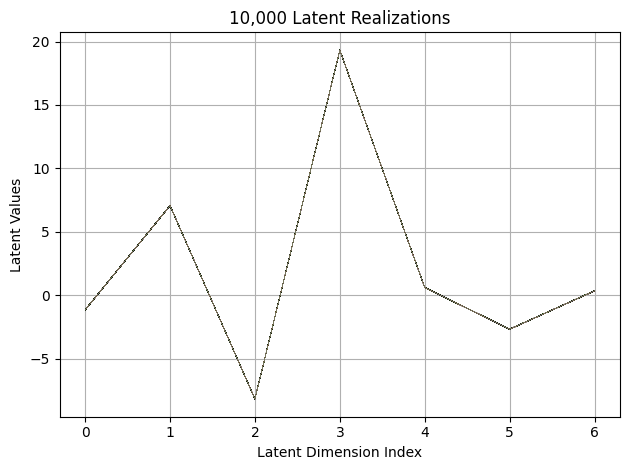

First 10 latent vectors from the VAE:
Sample 1: [-1.1677850484848022, 7.05092716217041, -8.181934356689453, 19.324182510375977, 0.6026067137718201, -2.680321216583252, 0.33511775732040405]
Sample 2: [-1.1798090934753418, 7.065382480621338, -8.195012092590332, 19.320537567138672, 0.602109432220459, -2.6783974170684814, 0.3451952636241913]
Sample 3: [-1.1714434623718262, 7.055532455444336, -8.184745788574219, 19.33545684814453, 0.597103476524353, -2.698208808898926, 0.3353434205055237]
Sample 4: [-1.1588551998138428, 7.0556960105896, -8.185628890991211, 19.328950881958008, 0.6023542284965515, -2.681255340576172, 0.3393215835094452]
Sample 5: [-1.1740589141845703, 7.066235065460205, -8.194393157958984, 19.326997756958008, 0.6007035970687866, -2.683680772781372, 0.3364861309528351]
Sample 6: [-1.171425700187683, 7.059989929199219, -8.193475723266602, 19.31757926940918, 0.6062804460525513, -2.681145191192627, 0.3515542149543762]
Sample 7: [-1.16942298412323, 7.051583766937256, -8.1899023056

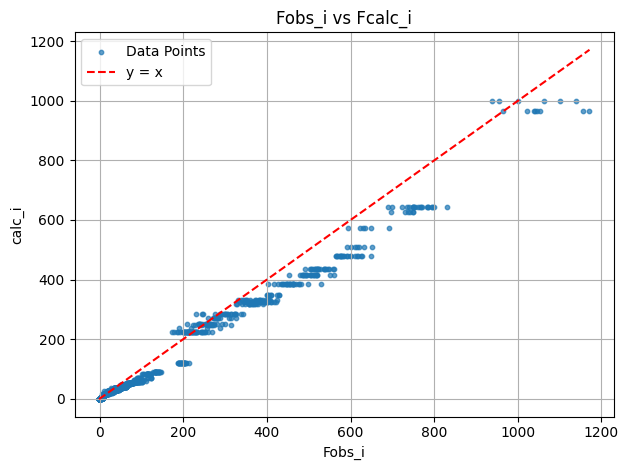

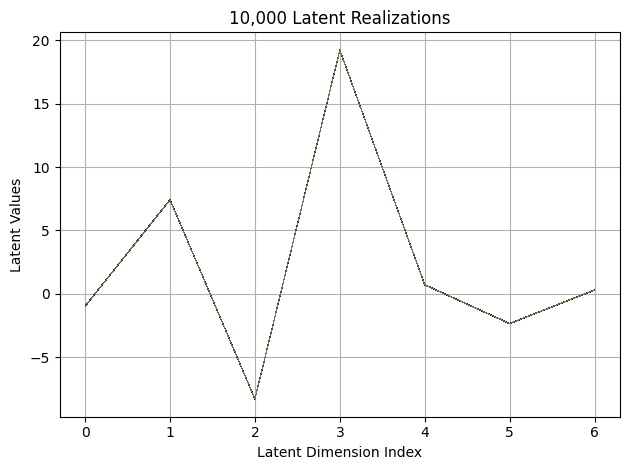

First 10 latent vectors from the VAE:
Sample 1: [-0.9830114245414734, 7.422759056091309, -8.296812057495117, 19.212265014648438, 0.723392128944397, -2.343010902404785, 0.307746946811676]
Sample 2: [-0.9756564497947693, 7.4276275634765625, -8.287729263305664, 19.21930503845215, 0.7239324450492859, -2.3550984859466553, 0.296671986579895]
Sample 3: [-0.9553576111793518, 7.422564506530762, -8.294153213500977, 19.20793914794922, 0.7237414717674255, -2.342609167098999, 0.2953920364379883]
Sample 4: [-0.9680030941963196, 7.418786525726318, -8.294753074645996, 19.217927932739258, 0.7180919051170349, -2.339618682861328, 0.29055747389793396]
Sample 5: [-0.9810194373130798, 7.414870738983154, -8.283559799194336, 19.213029861450195, 0.7193763852119446, -2.3393678665161133, 0.30137020349502563]
Sample 6: [-0.9749225974082947, 7.425954341888428, -8.295966148376465, 19.212627410888672, 0.7201716899871826, -2.3465301990509033, 0.3060811460018158]
Sample 7: [-0.9611495137214661, 7.430016994476318, -8.2

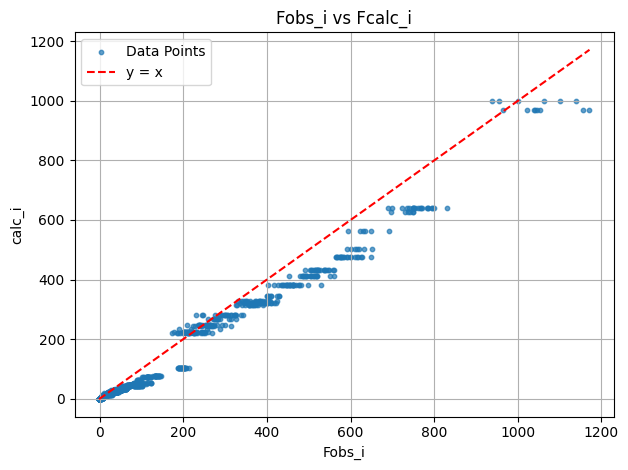

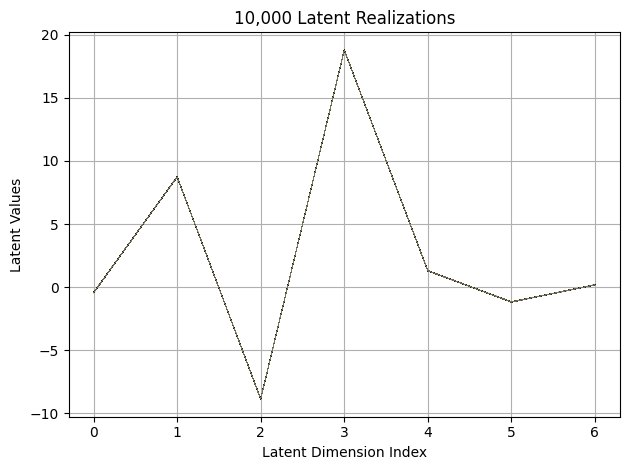

First 10 latent vectors from the VAE:
Sample 1: [-0.4408473074436188, 8.738635063171387, -8.874305725097656, 18.80105972290039, 1.2954200506210327, -1.1789803504943848, 0.16701830923557281]
Sample 2: [-0.4462793171405792, 8.735161781311035, -8.869027137756348, 18.79207420349121, 1.2971903085708618, -1.1683107614517212, 0.17367665469646454]
Sample 3: [-0.4385071098804474, 8.743790626525879, -8.8803071975708, 18.801156997680664, 1.2975679636001587, -1.1973931789398193, 0.16130653023719788]
Sample 4: [-0.44555598497390747, 8.729026794433594, -8.874114990234375, 18.78443145751953, 1.2973990440368652, -1.195383071899414, 0.17746636271476746]
Sample 5: [-0.4447355568408966, 8.73707389831543, -8.869384765625, 18.797237396240234, 1.2859141826629639, -1.1884021759033203, 0.17646808922290802]
Sample 6: [-0.45128849148750305, 8.742003440856934, -8.871060371398926, 18.795818328857422, 1.2892793416976929, -1.173684000968933, 0.17412696778774261]
Sample 7: [-0.446886271238327, 8.741613388061523, -8.

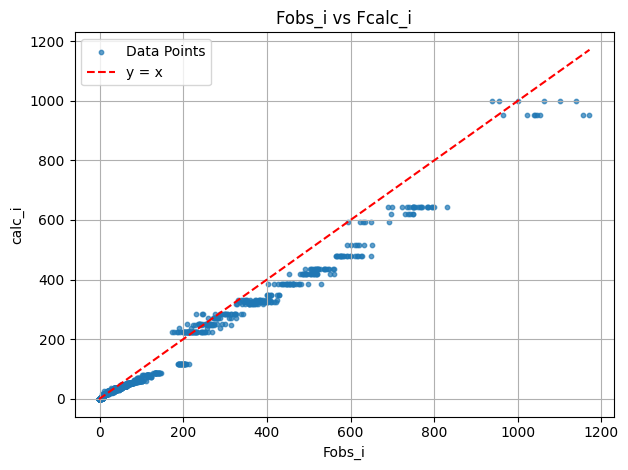

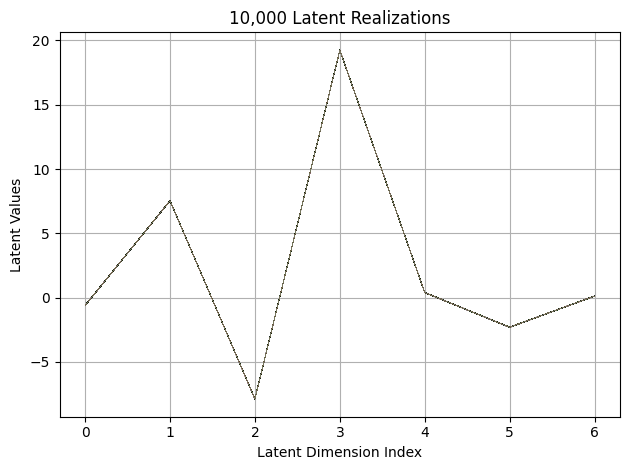

First 10 latent vectors from the VAE:
Sample 1: [-0.6171963810920715, 7.526240825653076, -7.8726325035095215, 19.242883682250977, 0.4004877507686615, -2.3158552646636963, 0.10902188718318939]
Sample 2: [-0.6162859797477722, 7.5255327224731445, -7.892763614654541, 19.249526977539062, 0.3971584439277649, -2.317564010620117, 0.11774925887584686]
Sample 3: [-0.6096124053001404, 7.532625198364258, -7.884451866149902, 19.250934600830078, 0.3896016478538513, -2.3189074993133545, 0.1089358925819397]
Sample 4: [-0.6183465123176575, 7.521224498748779, -7.8868088722229, 19.234149932861328, 0.3867667615413666, -2.3155112266540527, 0.10778284817934036]
Sample 5: [-0.6139740943908691, 7.523869037628174, -7.881392478942871, 19.2575740814209, 0.385398805141449, -2.317385196685791, 0.10649211704730988]
Sample 6: [-0.6079158782958984, 7.532900810241699, -7.8867950439453125, 19.250110626220703, 0.38927581906318665, -2.319089651107788, 0.11606660485267639]
Sample 7: [-0.6175732612609863, 7.532400131225586

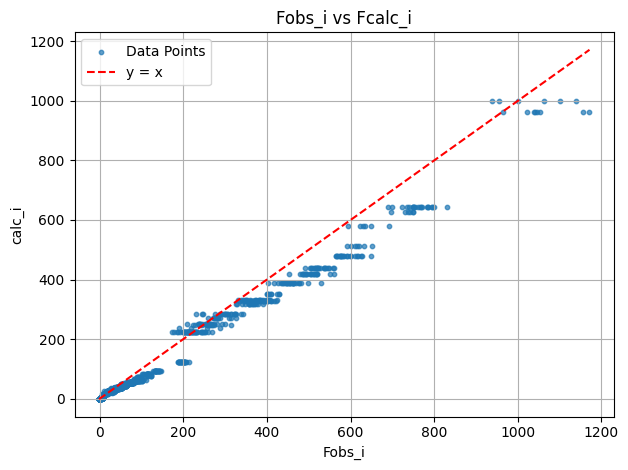

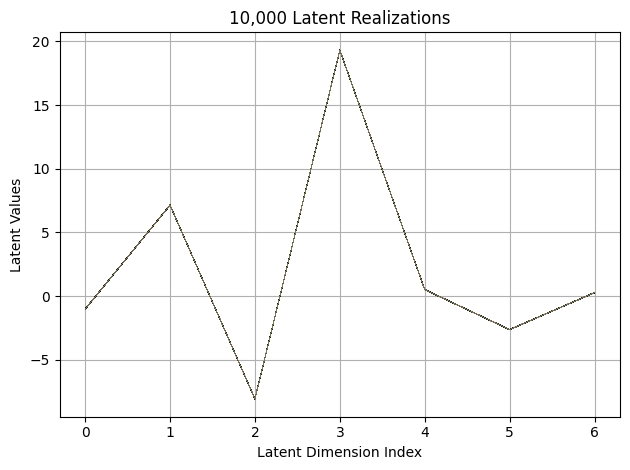

First 10 latent vectors from the VAE:
Sample 1: [-1.0283968448638916, 7.133590221405029, -8.06940746307373, 19.31661605834961, 0.5115810632705688, -2.6260225772857666, 0.2715657651424408]
Sample 2: [-1.0244783163070679, 7.153501033782959, -8.072098731994629, 19.323406219482422, 0.5083907842636108, -2.6227152347564697, 0.2679426968097687]
Sample 3: [-1.0205187797546387, 7.133516788482666, -8.078346252441406, 19.30625343322754, 0.5054383277893066, -2.6344103813171387, 0.2754875421524048]
Sample 4: [-1.021112084388733, 7.135758399963379, -8.07371711730957, 19.31036376953125, 0.5094059705734253, -2.6375932693481445, 0.2839881181716919]
Sample 5: [-1.0262900590896606, 7.148180961608887, -8.079866409301758, 19.31174659729004, 0.5263659954071045, -2.6303465366363525, 0.2729857861995697]
Sample 6: [-1.0307608842849731, 7.138094902038574, -8.07641315460205, 19.327959060668945, 0.5214528441429138, -2.633840560913086, 0.2804618775844574]
Sample 7: [-1.0335519313812256, 7.1461358070373535, -8.0711

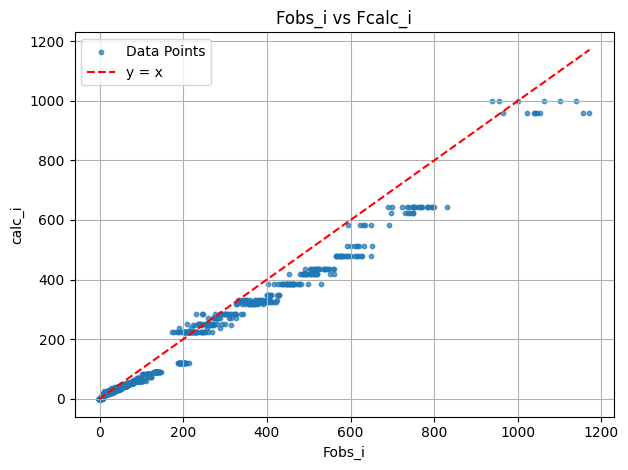

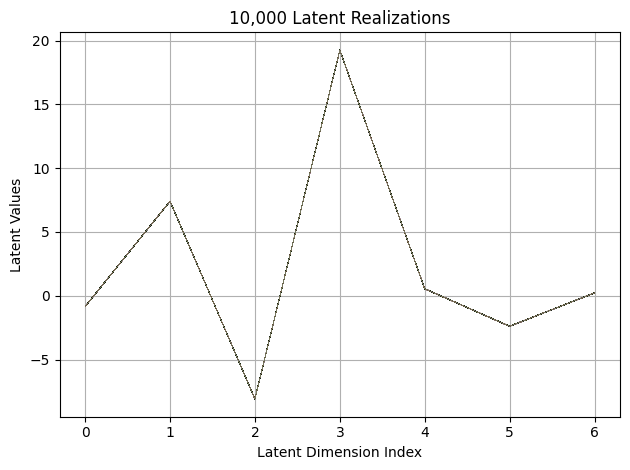

First 10 latent vectors from the VAE:
Sample 1: [-0.8442098498344421, 7.411724090576172, -8.094073295593262, 19.25116539001465, 0.5520173907279968, -2.3893487453460693, 0.2128080129623413]
Sample 2: [-0.8451411128044128, 7.4031805992126465, -8.084965705871582, 19.25800895690918, 0.54253089427948, -2.395737409591675, 0.21490579843521118]
Sample 3: [-0.8563622832298279, 7.403539657592773, -8.0947847366333, 19.266530990600586, 0.5483735203742981, -2.4018237590789795, 0.21977604925632477]
Sample 4: [-0.8577564358711243, 7.4011406898498535, -8.076536178588867, 19.249807357788086, 0.5534175038337708, -2.400057315826416, 0.2230786383152008]
Sample 5: [-0.8387554287910461, 7.407858848571777, -8.087030410766602, 19.2597713470459, 0.5364230275154114, -2.3950307369232178, 0.22794491052627563]
Sample 6: [-0.8536372184753418, 7.405435562133789, -8.078250885009766, 19.241472244262695, 0.5509570837020874, -2.3952813148498535, 0.2142830193042755]
Sample 7: [-0.8417937755584717, 7.407820701599121, -8.0

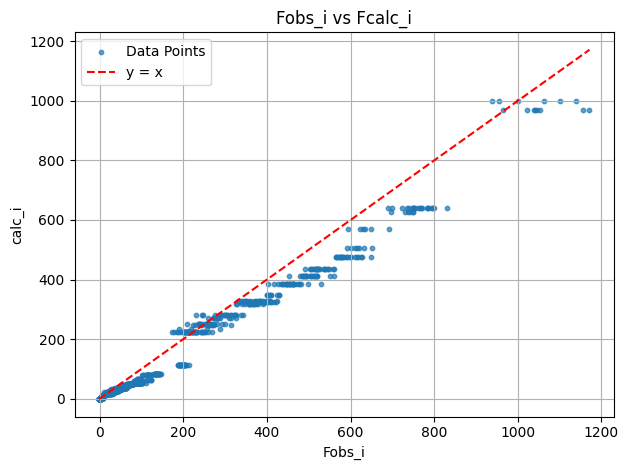

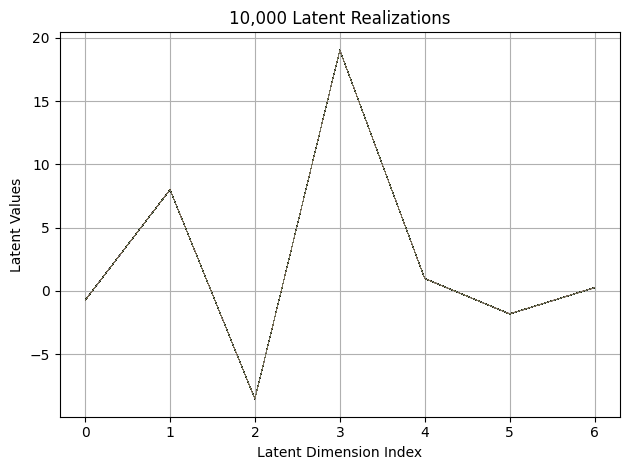

First 10 latent vectors from the VAE:
Sample 1: [-0.7539920806884766, 7.99824857711792, -8.539103507995605, 19.032358169555664, 0.978884756565094, -1.8214237689971924, 0.24103020131587982]
Sample 2: [-0.7393851280212402, 8.00695514678955, -8.538710594177246, 19.029041290283203, 0.9625533819198608, -1.830521583557129, 0.2453102320432663]
Sample 3: [-0.7420029640197754, 7.981851100921631, -8.545894622802734, 19.02703094482422, 0.9648372530937195, -1.824156641960144, 0.2446688562631607]
Sample 4: [-0.7399405241012573, 8.00454330444336, -8.54655647277832, 19.032930374145508, 0.9796993136405945, -1.827398419380188, 0.25528550148010254]
Sample 5: [-0.7554202079772949, 7.994410991668701, -8.553165435791016, 19.03740692138672, 0.975865364074707, -1.8270444869995117, 0.25465813279151917]
Sample 6: [-0.7535861134529114, 7.98564338684082, -8.557388305664062, 19.03736114501953, 0.9759568572044373, -1.821923017501831, 0.2547209858894348]
Sample 7: [-0.7539869546890259, 7.994356632232666, -8.5583887

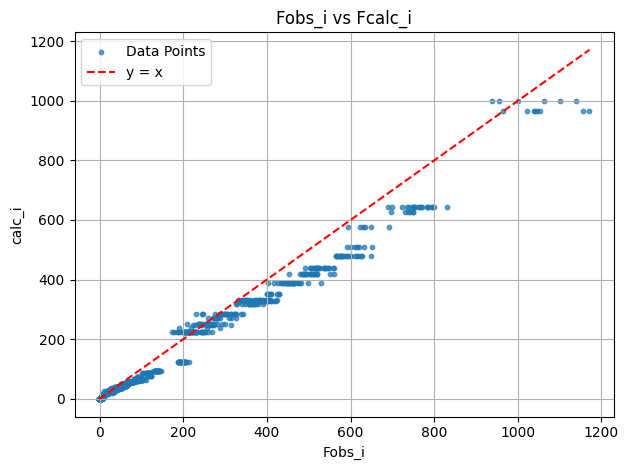

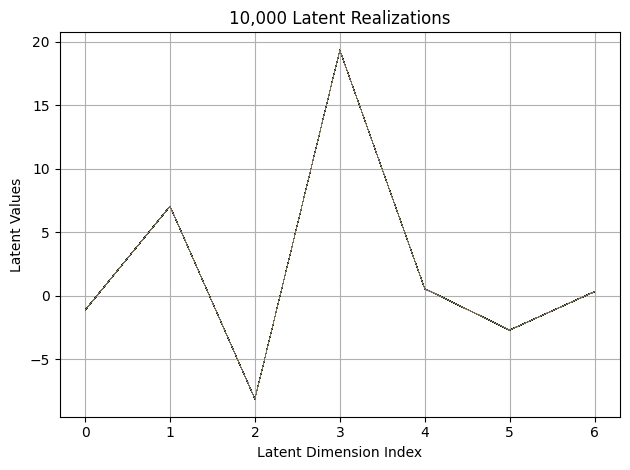

First 10 latent vectors from the VAE:
Sample 1: [-1.1500149965286255, 7.045714378356934, -8.129939079284668, 19.338964462280273, 0.5392012596130371, -2.7123148441314697, 0.304190069437027]
Sample 2: [-1.1443560123443604, 7.0466814041137695, -8.133289337158203, 19.336679458618164, 0.566175639629364, -2.699254035949707, 0.3279343545436859]
Sample 3: [-1.1321736574172974, 7.043210983276367, -8.12791633605957, 19.336633682250977, 0.5508813261985779, -2.708110809326172, 0.3183402419090271]
Sample 4: [-1.130238652229309, 7.041682720184326, -8.137130737304688, 19.326616287231445, 0.5459387898445129, -2.715780019760132, 0.3103440999984741]
Sample 5: [-1.1435309648513794, 7.044839859008789, -8.125458717346191, 19.335140228271484, 0.5570152997970581, -2.700193405151367, 0.3268445134162903]
Sample 6: [-1.1350629329681396, 7.044949054718018, -8.133157730102539, 19.345714569091797, 0.5644599199295044, -2.7214996814727783, 0.31455352902412415]
Sample 7: [-1.1340214014053345, 7.048315525054932, -8.13

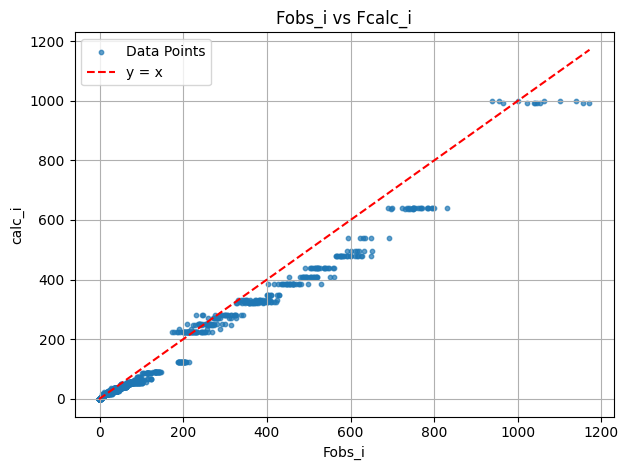

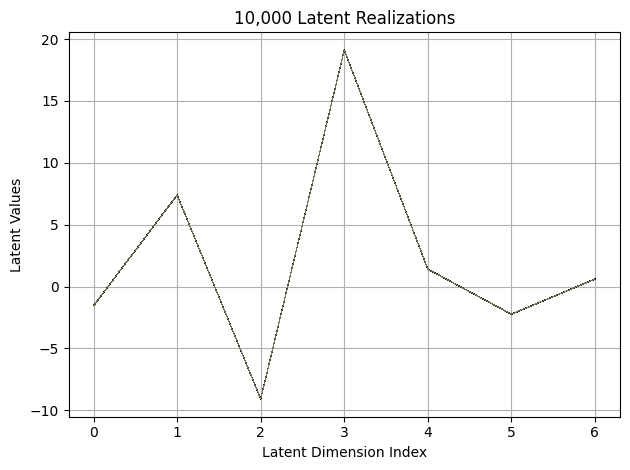

First 10 latent vectors from the VAE:
Sample 1: [-1.5515990257263184, 7.401935577392578, -9.077192306518555, 19.10301399230957, 1.4121512174606323, -2.240499496459961, 0.6159658432006836]
Sample 2: [-1.5362156629562378, 7.391389846801758, -9.082225799560547, 19.097309112548828, 1.4069981575012207, -2.2302775382995605, 0.6150566339492798]
Sample 3: [-1.549876093864441, 7.382150650024414, -9.074947357177734, 19.097545623779297, 1.4086650609970093, -2.2310867309570312, 0.6182876229286194]
Sample 4: [-1.5461739301681519, 7.394314289093018, -9.060200691223145, 19.11245346069336, 1.4050076007843018, -2.2379050254821777, 0.6126784682273865]
Sample 5: [-1.5371335744857788, 7.391655921936035, -9.091058731079102, 19.102846145629883, 1.4102047681808472, -2.2438485622406006, 0.6022568941116333]
Sample 6: [-1.5460413694381714, 7.396196365356445, -9.079177856445312, 19.109474182128906, 1.417151689529419, -2.2380950450897217, 0.6166098117828369]
Sample 7: [-1.5405327081680298, 7.3849639892578125, -9.

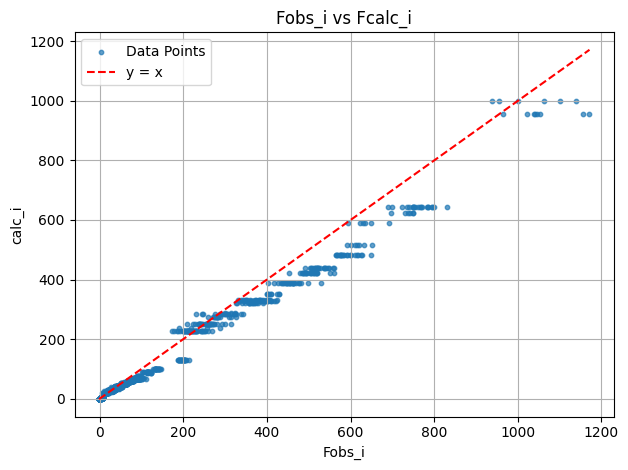

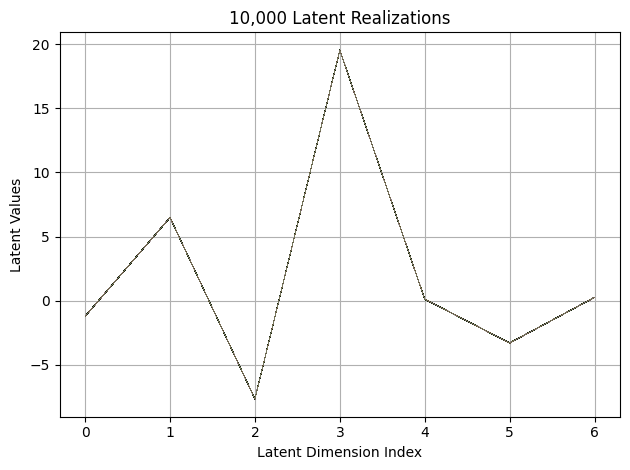

First 10 latent vectors from the VAE:
Sample 1: [-1.2138805389404297, 6.484445095062256, -7.679279804229736, 19.533315658569336, 0.10987010598182678, -3.3058602809906006, 0.25361642241477966]
Sample 2: [-1.2156388759613037, 6.484987258911133, -7.654661655426025, 19.5384578704834, 0.11253876239061356, -3.3059935569763184, 0.2571716010570526]
Sample 3: [-1.2146503925323486, 6.482044219970703, -7.670004367828369, 19.53942108154297, 0.1283152997493744, -3.2959187030792236, 0.2536628544330597]
Sample 4: [-1.2246471643447876, 6.47560453414917, -7.667344570159912, 19.54559898376465, 0.11351229250431061, -3.3023531436920166, 0.26527583599090576]
Sample 5: [-1.2304900884628296, 6.4886393547058105, -7.6662516593933105, 19.544099807739258, 0.12527398765087128, -3.302382707595825, 0.25967732071876526]
Sample 6: [-1.2281107902526855, 6.491705894470215, -7.678557872772217, 19.53726577758789, 0.10802061855792999, -3.2978410720825195, 0.2514699697494507]
Sample 7: [-1.21624755859375, 6.483702659606934

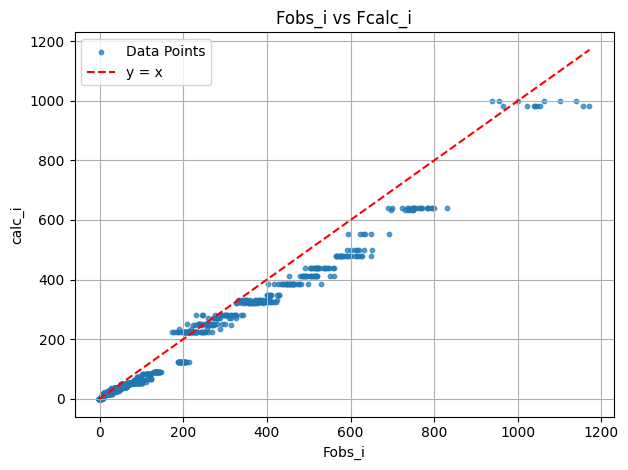

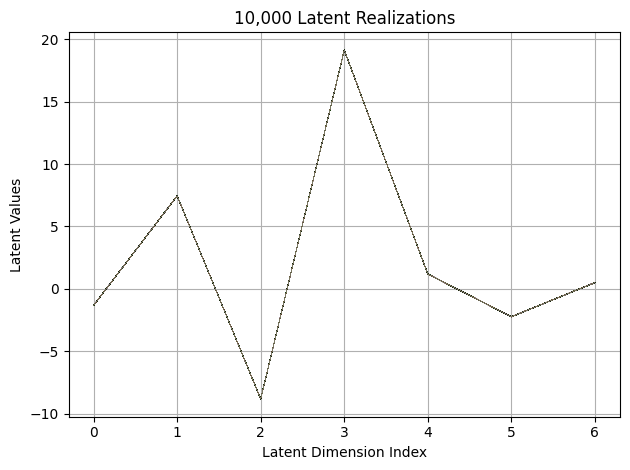

First 10 latent vectors from the VAE:
Sample 1: [-1.3220871686935425, 7.441818714141846, -8.838776588439941, 19.13484001159668, 1.1844875812530518, -2.2312679290771484, 0.5060989856719971]
Sample 2: [-1.3224912881851196, 7.448464870452881, -8.836068153381348, 19.1306209564209, 1.1705220937728882, -2.237225294113159, 0.4990747272968292]
Sample 3: [-1.3281447887420654, 7.44479513168335, -8.822763442993164, 19.13393211364746, 1.1826711893081665, -2.2255425453186035, 0.5062329769134521]
Sample 4: [-1.3334773778915405, 7.443989276885986, -8.827452659606934, 19.123369216918945, 1.181330680847168, -2.235690116882324, 0.4977177083492279]
Sample 5: [-1.3258389234542847, 7.443525314331055, -8.83202075958252, 19.13628387451172, 1.1858302354812622, -2.2491140365600586, 0.49367234110832214]
Sample 6: [-1.332310438156128, 7.437828063964844, -8.824402809143066, 19.117996215820312, 1.18048095703125, -2.2364447116851807, 0.4883680045604706]
Sample 7: [-1.3289539813995361, 7.435340404510498, -8.83139610

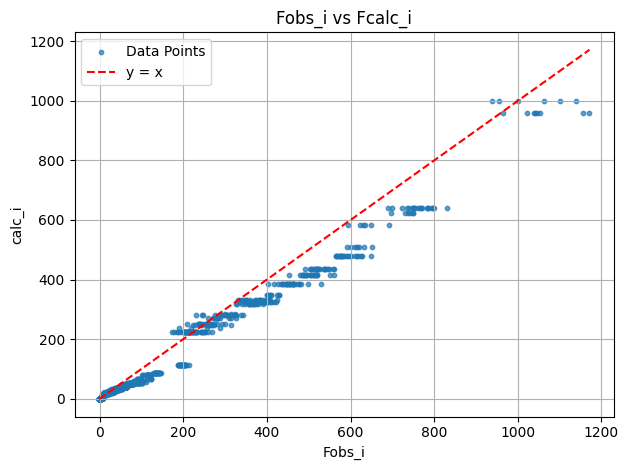

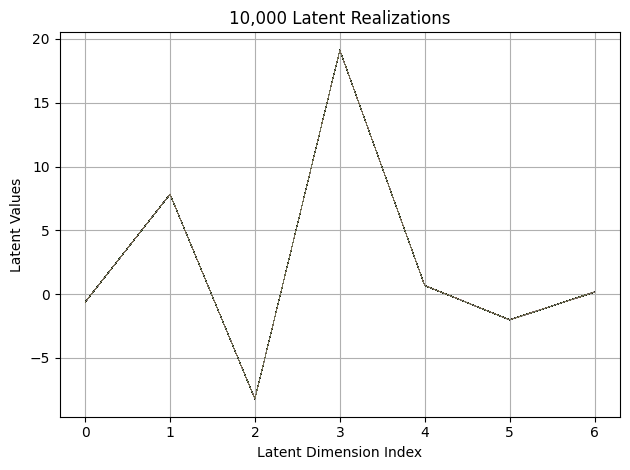

First 10 latent vectors from the VAE:
Sample 1: [-0.6350269913673401, 7.819406509399414, -8.2197265625, 19.131519317626953, 0.6709938645362854, -2.0170133113861084, 0.16078868508338928]
Sample 2: [-0.6383281350135803, 7.827747344970703, -8.21616268157959, 19.124008178710938, 0.6759033203125, -2.012648582458496, 0.1569564938545227]
Sample 3: [-0.633099377155304, 7.8227152824401855, -8.209909439086914, 19.128225326538086, 0.6698689460754395, -2.0008747577667236, 0.16060295701026917]
Sample 4: [-0.63796067237854, 7.828419208526611, -8.215926170349121, 19.121450424194336, 0.6839315295219421, -2.01823091506958, 0.16194358468055725]
Sample 5: [-0.6409822702407837, 7.820068359375, -8.219491958618164, 19.12928009033203, 0.6725415587425232, -2.008357524871826, 0.1613299548625946]
Sample 6: [-0.6292339563369751, 7.82671594619751, -8.209793090820312, 19.125568389892578, 0.6789376735687256, -2.0145411491394043, 0.17185287177562714]
Sample 7: [-0.628029465675354, 7.82836389541626, -8.20591640472412

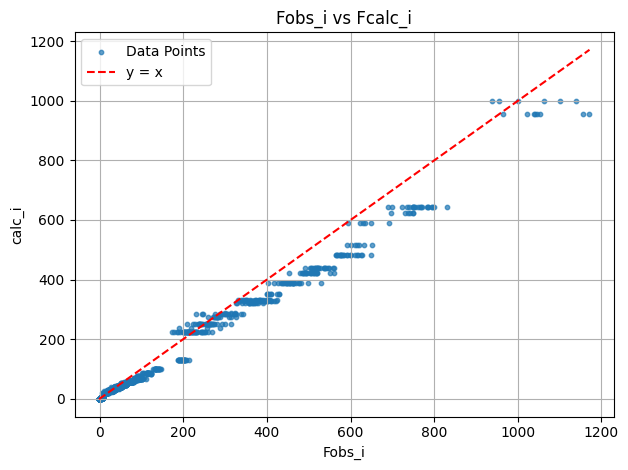

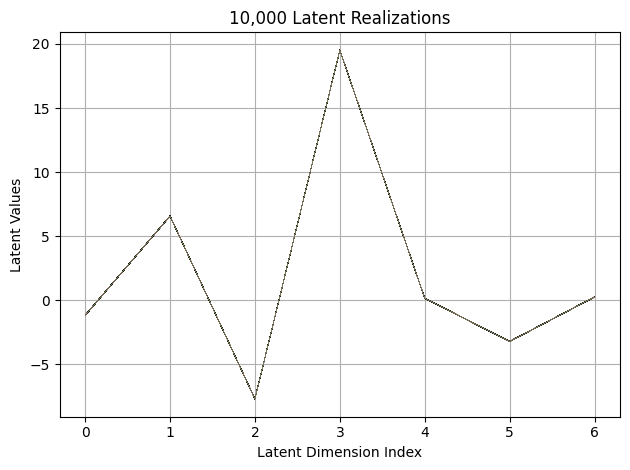

First 10 latent vectors from the VAE:
Sample 1: [-1.1948819160461426, 6.55300235748291, -7.695463180541992, 19.515785217285156, 0.14603158831596375, -3.227703809738159, 0.24795609712600708]
Sample 2: [-1.1883494853973389, 6.563613414764404, -7.701851844787598, 19.517837524414062, 0.14686352014541626, -3.222332000732422, 0.26730939745903015]
Sample 3: [-1.1856632232666016, 6.564757347106934, -7.702525615692139, 19.513866424560547, 0.15928500890731812, -3.229208469390869, 0.26195546984672546]
Sample 4: [-1.1813411712646484, 6.568479537963867, -7.722397327423096, 19.515810012817383, 0.1527348756790161, -3.2245843410491943, 0.25715187191963196]
Sample 5: [-1.1894733905792236, 6.5703020095825195, -7.70086669921875, 19.506271362304688, 0.14739815890789032, -3.2293789386749268, 0.25162434577941895]
Sample 6: [-1.1848195791244507, 6.567114353179932, -7.705728054046631, 19.523488998413086, 0.1354052573442459, -3.2171459197998047, 0.24892990291118622]
Sample 7: [-1.1813685894012451, 6.5709853172

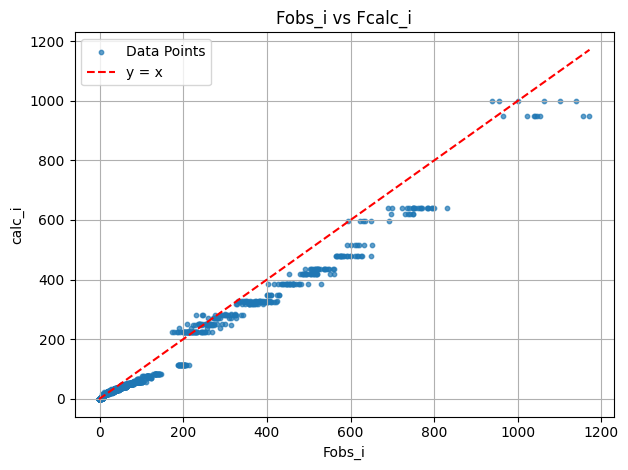

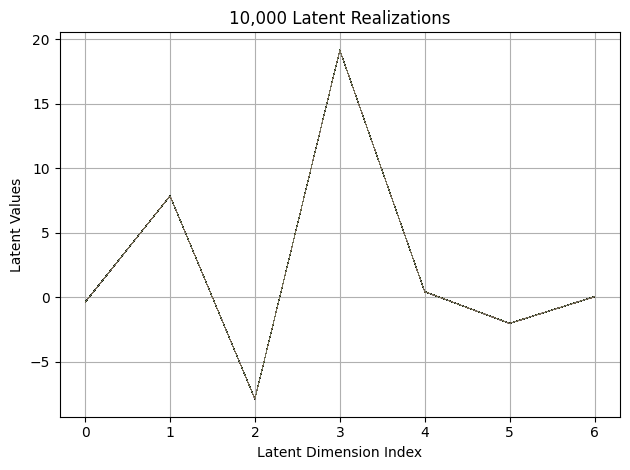

First 10 latent vectors from the VAE:
Sample 1: [-0.3887488842010498, 7.856767654418945, -7.9022345542907715, 19.164207458496094, 0.42938336730003357, -2.0426974296569824, 0.03565903380513191]
Sample 2: [-0.397918701171875, 7.862497329711914, -7.895113468170166, 19.161334991455078, 0.4180178940296173, -2.0259621143341064, 0.036181673407554626]
Sample 3: [-0.39175450801849365, 7.857034206390381, -7.897504806518555, 19.15966033935547, 0.42390334606170654, -2.0385735034942627, 0.020900800824165344]
Sample 4: [-0.39780882000923157, 7.856733322143555, -7.8945841789245605, 19.150121688842773, 0.43089058995246887, -2.0342226028442383, 0.04540909454226494]
Sample 5: [-0.3956048786640167, 7.851562023162842, -7.8984222412109375, 19.162599563598633, 0.4244239032268524, -2.040729522705078, 0.038940027356147766]
Sample 6: [-0.40127408504486084, 7.8487677574157715, -7.894986152648926, 19.164979934692383, 0.4136110842227936, -2.0402402877807617, 0.03623051196336746]
Sample 7: [-0.3952735960483551, 7.

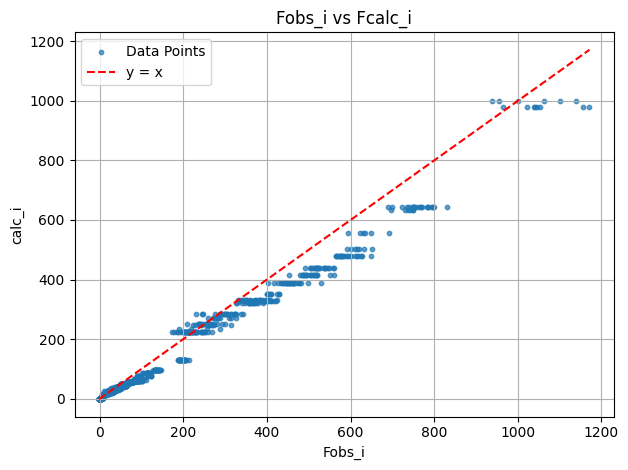

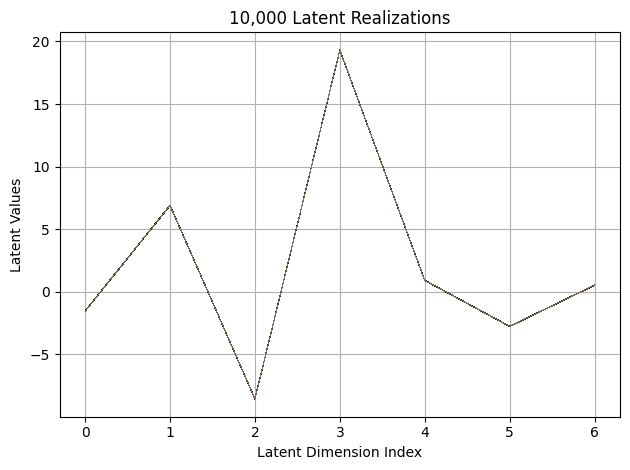

First 10 latent vectors from the VAE:
Sample 1: [-1.5530478954315186, 6.886944770812988, -8.55331802368164, 19.300870895385742, 0.902657687664032, -2.7752039432525635, 0.5152420997619629]
Sample 2: [-1.5335948467254639, 6.898252010345459, -8.559246063232422, 19.30356216430664, 0.9120379090309143, -2.7715554237365723, 0.5329415798187256]
Sample 3: [-1.5374685525894165, 6.887473106384277, -8.546542167663574, 19.30533790588379, 0.9104164838790894, -2.7635087966918945, 0.5145458579063416]
Sample 4: [-1.5511351823806763, 6.906797409057617, -8.550187110900879, 19.321060180664062, 0.9092897176742554, -2.7778351306915283, 0.5072197914123535]
Sample 5: [-1.5385138988494873, 6.894101142883301, -8.55083179473877, 19.318557739257812, 0.9097259044647217, -2.7742161750793457, 0.5209969878196716]
Sample 6: [-1.5455678701400757, 6.907181739807129, -8.558189392089844, 19.316835403442383, 0.9096348881721497, -2.769986867904663, 0.5160107612609863]
Sample 7: [-1.5341583490371704, 6.896963596343994, -8.57

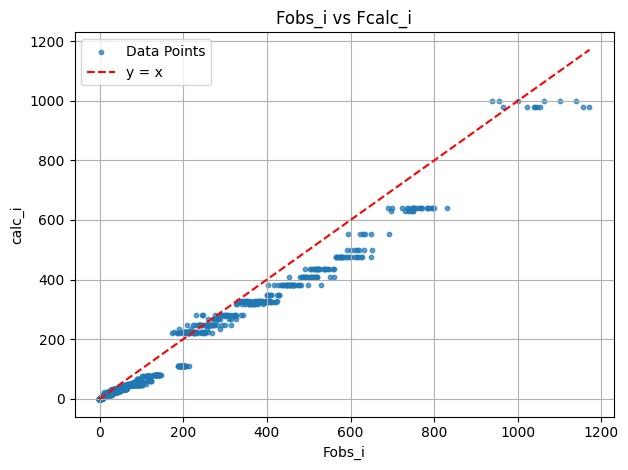

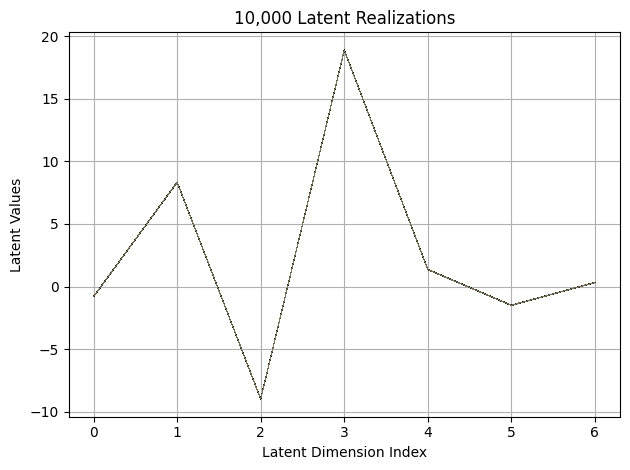

First 10 latent vectors from the VAE:
Sample 1: [-0.8099550008773804, 8.335539817810059, -8.986361503601074, 18.891538619995117, 1.3646211624145508, -1.4953694343566895, 0.3231273293495178]
Sample 2: [-0.8033916354179382, 8.347949028015137, -8.982468605041504, 18.89107322692871, 1.3572841882705688, -1.4963899850845337, 0.3111165463924408]
Sample 3: [-0.805113673210144, 8.32559871673584, -8.970044136047363, 18.889442443847656, 1.3509562015533447, -1.4985599517822266, 0.32503771781921387]
Sample 4: [-0.8236532211303711, 8.343910217285156, -8.965229034423828, 18.87946128845215, 1.3590284585952759, -1.5029702186584473, 0.3105149269104004]
Sample 5: [-0.8042336106300354, 8.330047607421875, -8.979681968688965, 18.877180099487305, 1.365548849105835, -1.5160369873046875, 0.3238796591758728]
Sample 6: [-0.8157724142074585, 8.329034805297852, -8.98353385925293, 18.877727508544922, 1.3657175302505493, -1.4947680234909058, 0.3125780522823334]
Sample 7: [-0.7995561957359314, 8.3341646194458, -8.986

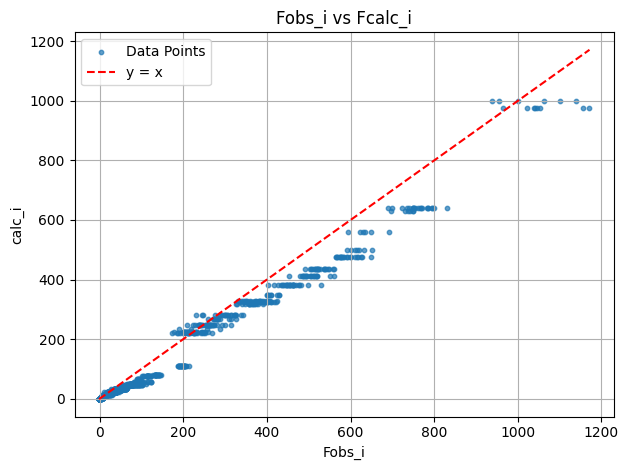

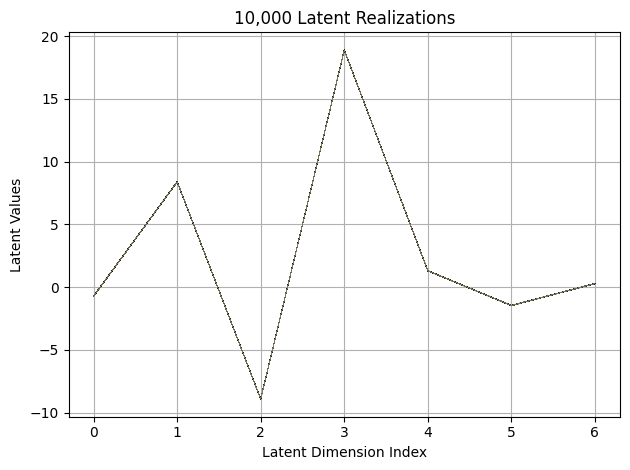

First 10 latent vectors from the VAE:
Sample 1: [-0.7220715880393982, 8.38790225982666, -8.910894393920898, 18.882984161376953, 1.3058689832687378, -1.4659004211425781, 0.28154152631759644]
Sample 2: [-0.7197653651237488, 8.375864028930664, -8.916842460632324, 18.88021469116211, 1.3100857734680176, -1.4652711153030396, 0.2944367527961731]
Sample 3: [-0.7170724272727966, 8.38360595703125, -8.917448043823242, 18.878345489501953, 1.2993509769439697, -1.4621355533599854, 0.281193345785141]
Sample 4: [-0.7172419428825378, 8.379226684570312, -8.914874076843262, 18.882795333862305, 1.3007097244262695, -1.451357364654541, 0.2765834331512451]
Sample 5: [-0.7272931337356567, 8.3955659866333, -8.913894653320312, 18.87840461730957, 1.3023914098739624, -1.4655776023864746, 0.2738174796104431]
Sample 6: [-0.7151731848716736, 8.395221710205078, -8.905099868774414, 18.87370491027832, 1.2987059354782104, -1.466392159461975, 0.2860710918903351]
Sample 7: [-0.7263542413711548, 8.390901565551758, -8.91154

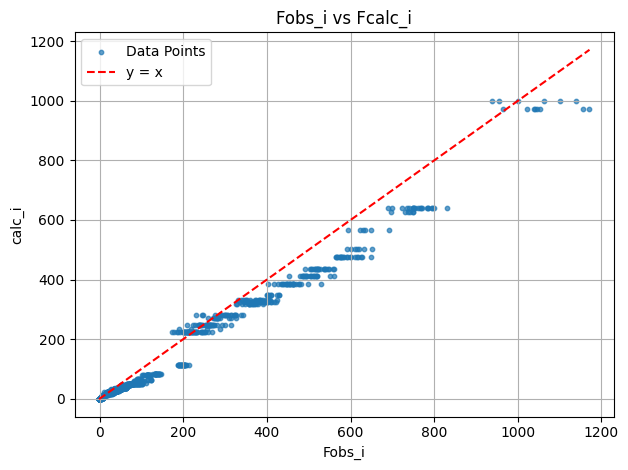

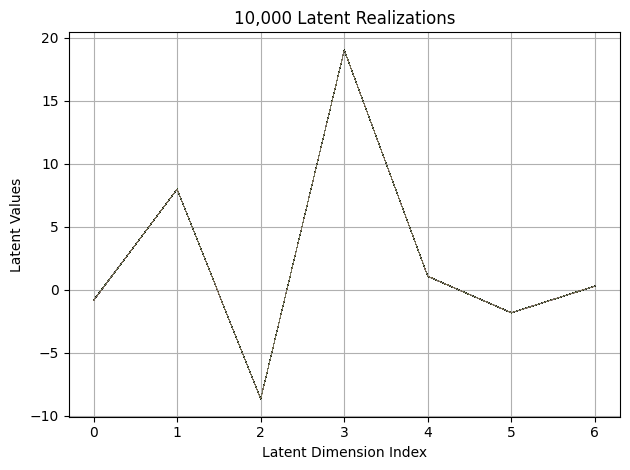

First 10 latent vectors from the VAE:
Sample 1: [-0.8386431336402893, 7.982263565063477, -8.658794403076172, 19.024429321289062, 1.0739415884017944, -1.8224691152572632, 0.2842772901058197]
Sample 2: [-0.8316105008125305, 7.979453086853027, -8.662699699401855, 19.022340774536133, 1.0623615980148315, -1.8227263689041138, 0.308596670627594]
Sample 3: [-0.8566737174987793, 7.979941368103027, -8.665308952331543, 19.02265167236328, 1.0833576917648315, -1.8334767818450928, 0.29370781779289246]
Sample 4: [-0.8263071775436401, 7.9827752113342285, -8.66415786743164, 19.01064682006836, 1.0720295906066895, -1.8166755437850952, 0.3061584234237671]
Sample 5: [-0.8482864499092102, 7.980711936950684, -8.662836074829102, 19.02326774597168, 1.0662108659744263, -1.8124421834945679, 0.2940996289253235]
Sample 6: [-0.836428165435791, 7.987217903137207, -8.662192344665527, 19.033206939697266, 1.0645718574523926, -1.81288480758667, 0.27865371108055115]
Sample 7: [-0.8354390263557434, 7.993032932281494, -8.6

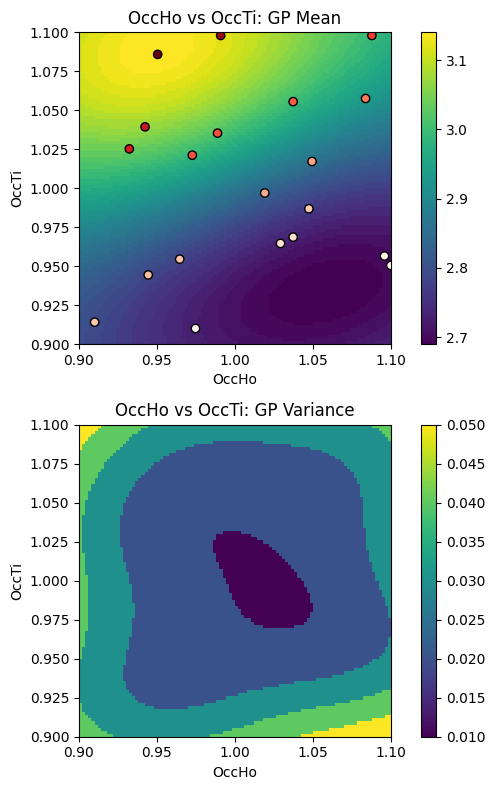

C:\Users\USER\AppData\Local\Temp\ipykernel_25036\751260621.py:128: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  Z[i] =  (y_means[i]-best_value-eta)/y_std[i]
C:\Users\USER\AppData\Local\Temp\ipykernel_25036\751260621.py:129: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])


EI: [0.00780108 0.00780033 0.00780773 ... 0.00011459 0.00013185 0.00015148]
Function eval #21
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 1.0595959424972534]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4367
initial chi^2 1.7235e+06 with 2596 obs.
New scale: 0.4359
Cycle 0: 0.72s, Chi**2: 3.8077e+05 for 2596 obs., Lambda: 0,  Delta: 0.779, SVD=0
New scale: 0.4359
Maximum shift/esd = -236.605 for all cycles
Read from fil

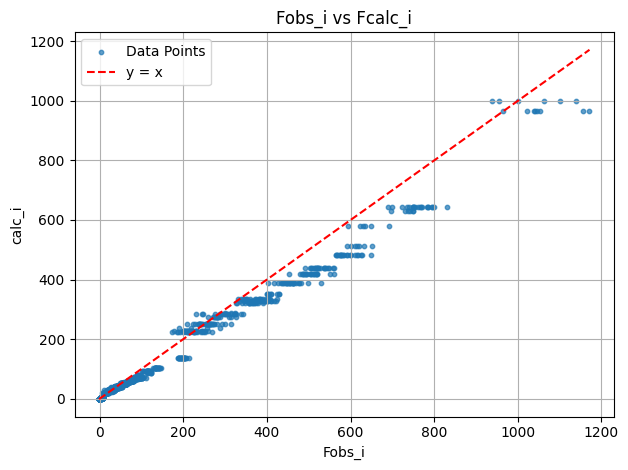

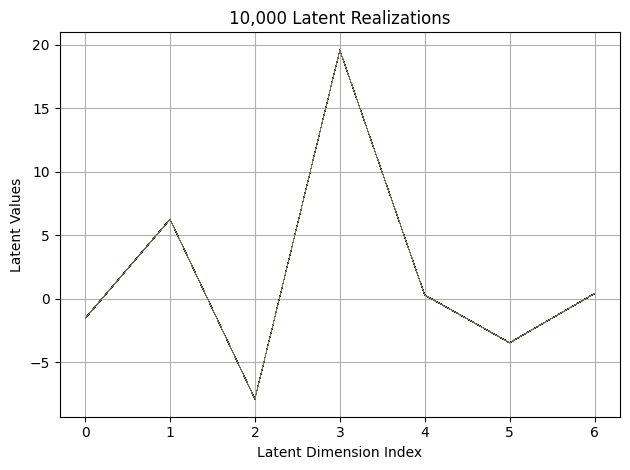

First 10 latent vectors from the VAE:
Sample 1: [-1.5604782104492188, 6.250112056732178, -7.903810977935791, 19.563264846801758, 0.27309125661849976, -3.456939458847046, 0.39219820499420166]
Sample 2: [-1.5520176887512207, 6.247745513916016, -7.89501428604126, 19.567094802856445, 0.2916538417339325, -3.453155279159546, 0.40079331398010254]
Sample 3: [-1.5483267307281494, 6.254106044769287, -7.899317264556885, 19.56175994873047, 0.28803080320358276, -3.4741640090942383, 0.40653106570243835]
Sample 4: [-1.5550979375839233, 6.239895820617676, -7.900286674499512, 19.56663703918457, 0.29411911964416504, -3.4681103229522705, 0.40962904691696167]
Sample 5: [-1.5530074834823608, 6.24171257019043, -7.8855366706848145, 19.555622100830078, 0.2867753207683563, -3.474581480026245, 0.40357527136802673]
Sample 6: [-1.556402325630188, 6.247982501983643, -7.8975510597229, 19.576807022094727, 0.2940644323825836, -3.473545789718628, 0.40740054845809937]
Sample 7: [-1.5525950193405151, 6.252810478210449, 

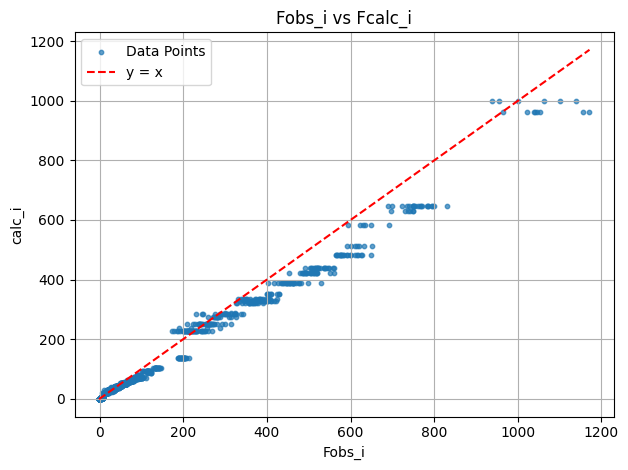

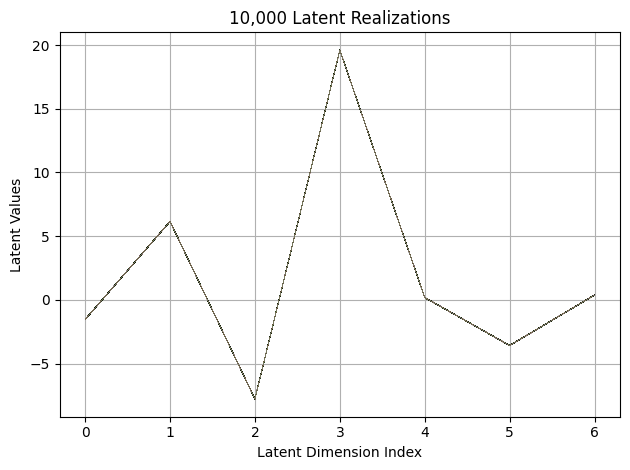

First 10 latent vectors from the VAE:
Sample 1: [-1.5426607131958008, 6.157805919647217, -7.787398815155029, 19.599184036254883, 0.1866331696510315, -3.577463150024414, 0.3701094388961792]
Sample 2: [-1.5495105981826782, 6.153570652008057, -7.760116100311279, 19.603931427001953, 0.1867065280675888, -3.5919017791748047, 0.36559227108955383]
Sample 3: [-1.5528285503387451, 6.150971412658691, -7.782829284667969, 19.608497619628906, 0.17978346347808838, -3.578004837036133, 0.36950138211250305]
Sample 4: [-1.5334690809249878, 6.151439189910889, -7.77621603012085, 19.613697052001953, 0.17166686058044434, -3.584625244140625, 0.37254688143730164]
Sample 5: [-1.5354942083358765, 6.150461673736572, -7.774789810180664, 19.602249145507812, 0.18531258404254913, -3.5872983932495117, 0.3920621871948242]
Sample 6: [-1.5436367988586426, 6.15173864364624, -7.781085014343262, 19.610206604003906, 0.17417103052139282, -3.576118230819702, 0.3697543144226074]
Sample 7: [-1.538275957107544, 6.145209789276123,

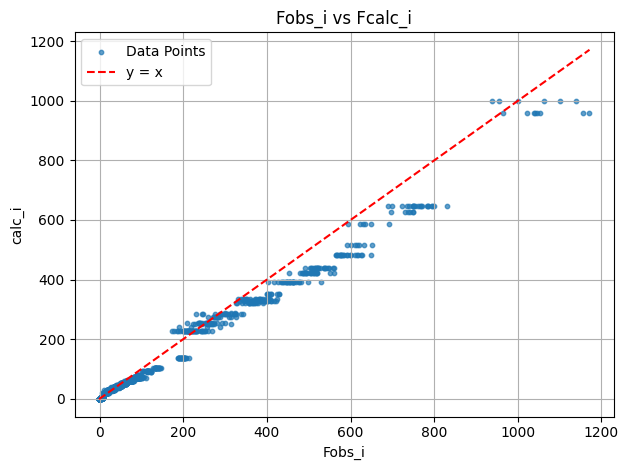

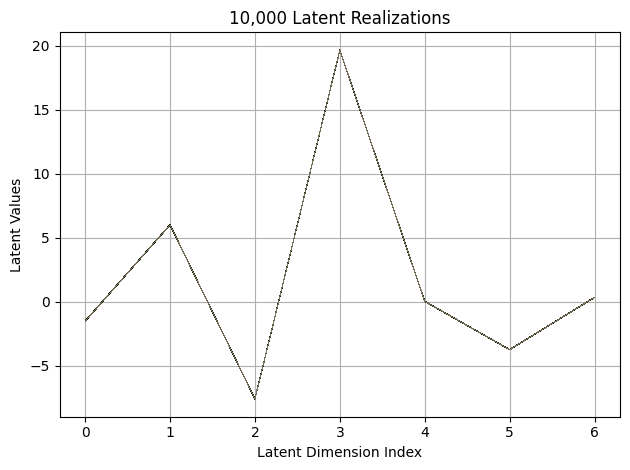

First 10 latent vectors from the VAE:
Sample 1: [-1.530239224433899, 6.00889253616333, -7.602777481079102, 19.6601619720459, 0.017474349588155746, -3.7425873279571533, 0.3472675085067749]
Sample 2: [-1.525582194328308, 6.002780914306641, -7.600268363952637, 19.67634391784668, 0.02467675693333149, -3.745964765548706, 0.3312065303325653]
Sample 3: [-1.5296452045440674, 6.0140299797058105, -7.603271961212158, 19.67218017578125, 0.028792213648557663, -3.7478349208831787, 0.3414008617401123]
Sample 4: [-1.524489164352417, 5.9937872886657715, -7.605128288269043, 19.6774959564209, 0.03629907965660095, -3.7455811500549316, 0.34208038449287415]
Sample 5: [-1.5099326372146606, 6.016330718994141, -7.597472667694092, 19.67770004272461, 0.026957055553793907, -3.749586343765259, 0.343241423368454]
Sample 6: [-1.5150439739227295, 6.0145063400268555, -7.6062493324279785, 19.662817001342773, 0.02483513019979, -3.74919056892395, 0.33624231815338135]
Sample 7: [-1.520618200302124, 6.004687309265137, -7.6

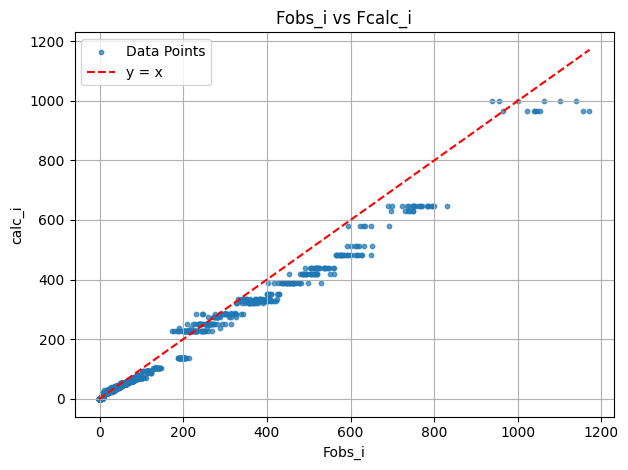

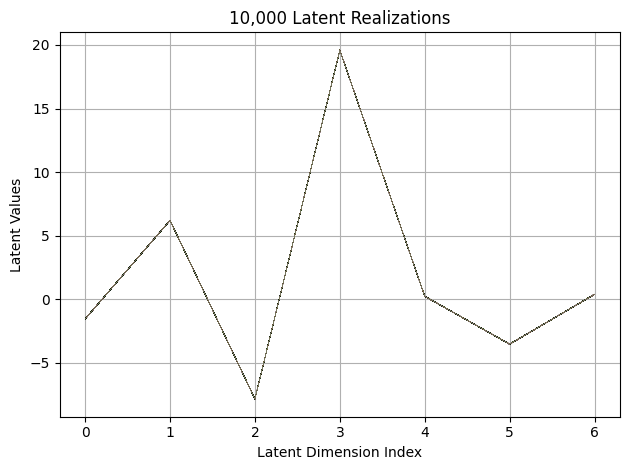

First 10 latent vectors from the VAE:
Sample 1: [-1.5525277853012085, 6.193777561187744, -7.830153942108154, 19.584997177124023, 0.22945870459079742, -3.5285232067108154, 0.3837880790233612]
Sample 2: [-1.5376328229904175, 6.196264266967773, -7.836767673492432, 19.581890106201172, 0.22780299186706543, -3.5217883586883545, 0.3914315402507782]
Sample 3: [-1.5458954572677612, 6.205145835876465, -7.847207546234131, 19.59384536743164, 0.2324700504541397, -3.539297103881836, 0.38630393147468567]
Sample 4: [-1.5551327466964722, 6.1938886642456055, -7.8264336585998535, 19.58353614807129, 0.24205532670021057, -3.5192530155181885, 0.3763418197631836]
Sample 5: [-1.5524874925613403, 6.197653770446777, -7.830499172210693, 19.588335037231445, 0.24679134786128998, -3.5346593856811523, 0.39602845907211304]
Sample 6: [-1.5434623956680298, 6.197660446166992, -7.839808464050293, 19.588186264038086, 0.2446325272321701, -3.528498649597168, 0.38233304023742676]
Sample 7: [-1.5468897819519043, 6.20423793792

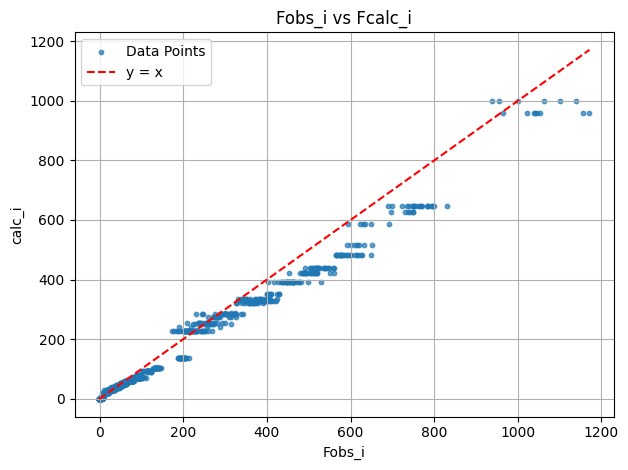

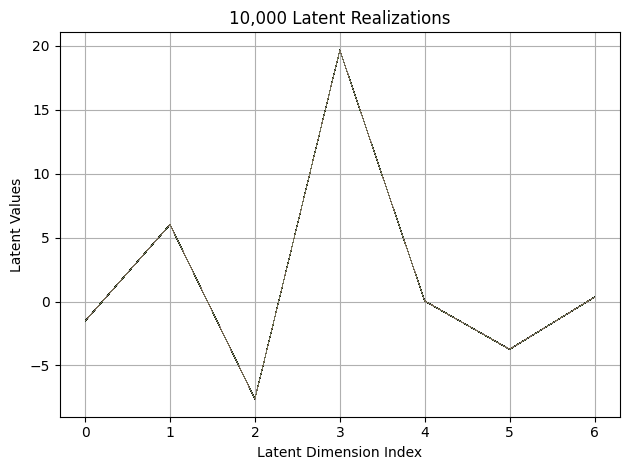

First 10 latent vectors from the VAE:
Sample 1: [-1.5235347747802734, 6.010252475738525, -7.617831707000732, 19.654197692871094, 0.03837498649954796, -3.7361960411071777, 0.3454856872558594]
Sample 2: [-1.5368129014968872, 6.0134501457214355, -7.63109827041626, 19.664987564086914, 0.04098765179514885, -3.7454941272735596, 0.35010960698127747]
Sample 3: [-1.5250804424285889, 6.025111198425293, -7.608999252319336, 19.656217575073242, 0.03651833534240723, -3.721496820449829, 0.34666258096694946]
Sample 4: [-1.5176652669906616, 6.016252040863037, -7.625790596008301, 19.67740249633789, 0.0342390313744545, -3.7263872623443604, 0.34410572052001953]
Sample 5: [-1.518251895904541, 6.025447368621826, -7.618122577667236, 19.660978317260742, 0.02567855641245842, -3.739924430847168, 0.3450588583946228]
Sample 6: [-1.5287212133407593, 6.019411563873291, -7.621541976928711, 19.651382446289062, 0.042212747037410736, -3.724609136581421, 0.3417109549045563]
Sample 7: [-1.5266344547271729, 6.019540309906

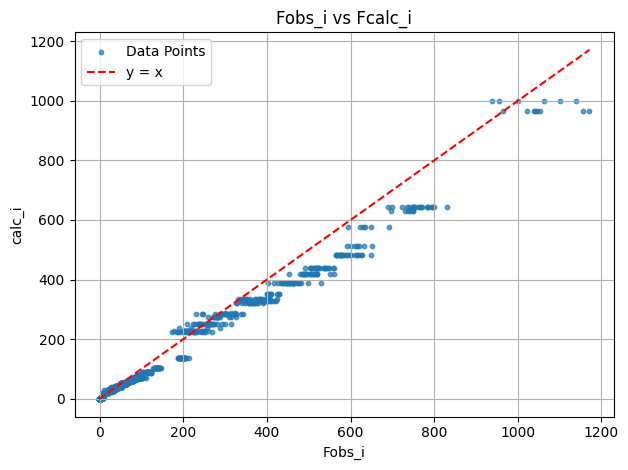

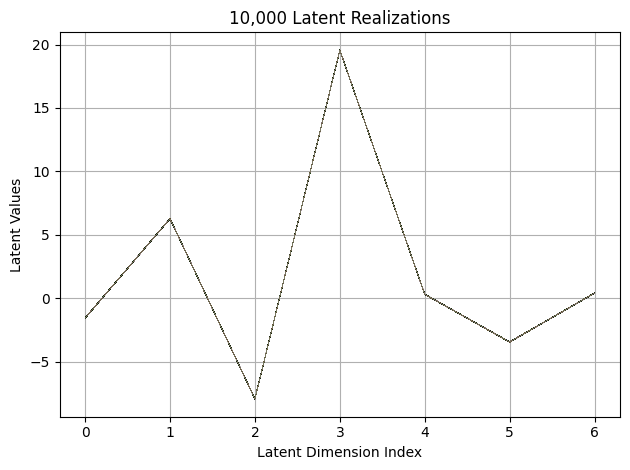

First 10 latent vectors from the VAE:
Sample 1: [-1.551508903503418, 6.276861667633057, -7.926983833312988, 19.547033309936523, 0.32432231307029724, -3.4421401023864746, 0.4255959987640381]
Sample 2: [-1.561231017112732, 6.274544715881348, -7.919196605682373, 19.56580352783203, 0.30481624603271484, -3.4455318450927734, 0.41852667927742004]
Sample 3: [-1.556931734085083, 6.271087169647217, -7.916816711425781, 19.55135154724121, 0.31493520736694336, -3.4444711208343506, 0.41576263308525085]
Sample 4: [-1.5580090284347534, 6.275993824005127, -7.928521156311035, 19.550701141357422, 0.3236859440803528, -3.4520013332366943, 0.4032706320285797]
Sample 5: [-1.56181001663208, 6.273065090179443, -7.928224086761475, 19.54294776916504, 0.3172749876976013, -3.4430153369903564, 0.410209059715271]
Sample 6: [-1.5549628734588623, 6.274697303771973, -7.921789646148682, 19.556291580200195, 0.33064350485801697, -3.4462428092956543, 0.4093777537345886]
Sample 7: [-1.5567340850830078, 6.273543357849121, -7

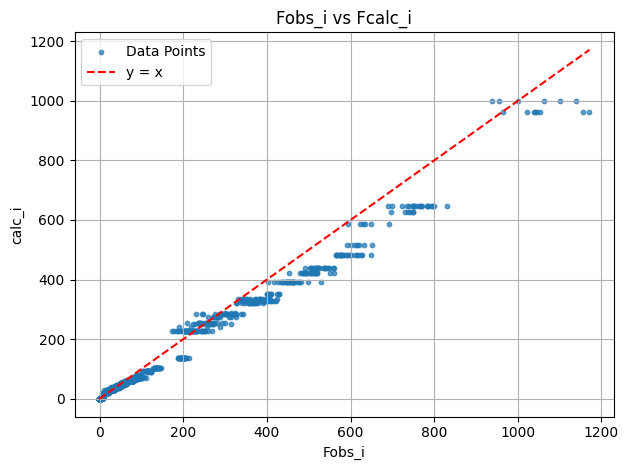

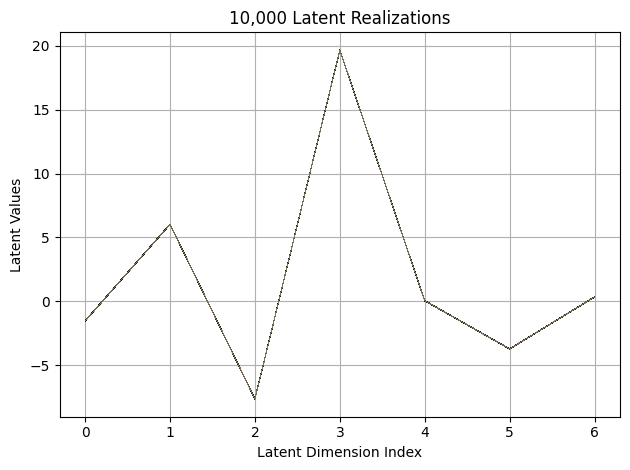

First 10 latent vectors from the VAE:
Sample 1: [-1.5228499174118042, 6.01992654800415, -7.634933948516846, 19.661893844604492, 0.05809593200683594, -3.716392755508423, 0.3505550026893616]
Sample 2: [-1.5247175693511963, 6.024779319763184, -7.638186931610107, 19.65989112854004, 0.05482816323637962, -3.720149278640747, 0.34633317589759827]
Sample 3: [-1.5246891975402832, 6.030022144317627, -7.633225440979004, 19.655378341674805, 0.04763996601104736, -3.70593523979187, 0.34703847765922546]
Sample 4: [-1.525842547416687, 6.03393030166626, -7.6385345458984375, 19.6666202545166, 0.05439293757081032, -3.722092866897583, 0.3381394147872925]
Sample 5: [-1.5279324054718018, 6.03235387802124, -7.638518333435059, 19.663394927978516, 0.049214549362659454, -3.719844341278076, 0.34623751044273376]
Sample 6: [-1.522800326347351, 6.032886981964111, -7.633448123931885, 19.651546478271484, 0.04826105386018753, -3.706773042678833, 0.35195672512054443]
Sample 7: [-1.5256255865097046, 6.036026477813721, -7

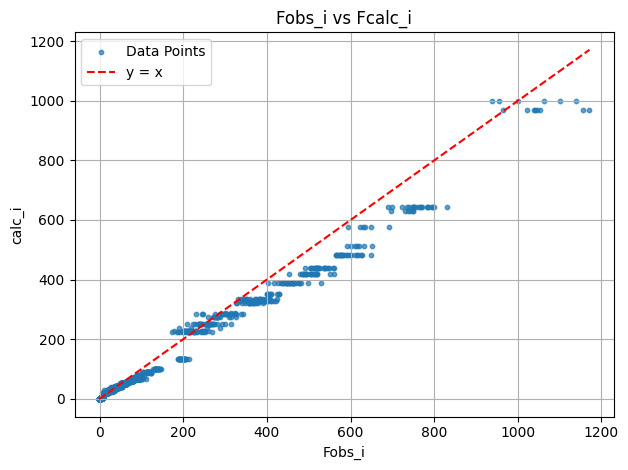

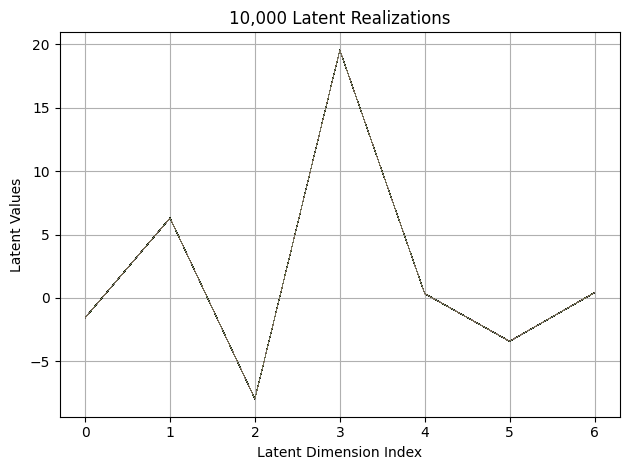

First 10 latent vectors from the VAE:
Sample 1: [-1.566901445388794, 6.295971393585205, -7.9498748779296875, 19.542022705078125, 0.3406890332698822, -3.4132611751556396, 0.418140172958374]
Sample 2: [-1.545032262802124, 6.297750949859619, -7.9591498374938965, 19.553667068481445, 0.3439808487892151, -3.4207022190093994, 0.40562888979911804]
Sample 3: [-1.5567474365234375, 6.301619529724121, -7.963186264038086, 19.5521240234375, 0.34921538829803467, -3.415816307067871, 0.42015042901039124]
Sample 4: [-1.562492847442627, 6.305974960327148, -7.970192909240723, 19.550514221191406, 0.3505130410194397, -3.413774013519287, 0.41441452503204346]
Sample 5: [-1.567168951034546, 6.305570125579834, -7.961487770080566, 19.542808532714844, 0.3535727560520172, -3.4190871715545654, 0.4175046682357788]
Sample 6: [-1.5535892248153687, 6.305130481719971, -7.952385425567627, 19.546140670776367, 0.35033920407295227, -3.421658992767334, 0.41566798090934753]
Sample 7: [-1.5593512058258057, 6.306302547454834, -

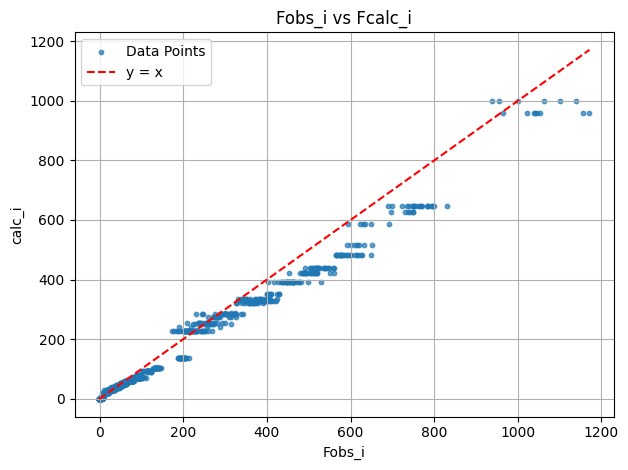

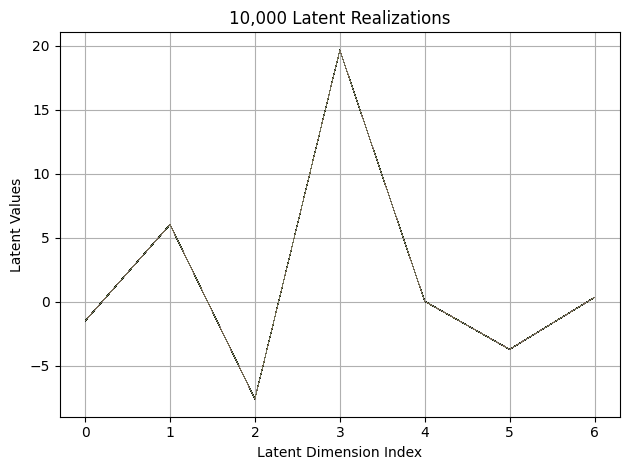

First 10 latent vectors from the VAE:
Sample 1: [-1.512931227684021, 6.02060079574585, -7.5890655517578125, 19.653894424438477, 0.032526299357414246, -3.7293286323547363, 0.33428138494491577]
Sample 2: [-1.5070184469223022, 6.027805328369141, -7.593000411987305, 19.663570404052734, 0.025872614234685898, -3.7382540702819824, 0.3428705334663391]
Sample 3: [-1.5191994905471802, 6.0234222412109375, -7.598213195800781, 19.658065795898438, 0.02353772521018982, -3.7393012046813965, 0.3255581557750702]
Sample 4: [-1.5008193254470825, 6.028789520263672, -7.6036200523376465, 19.657791137695312, 0.03084528259932995, -3.7154622077941895, 0.34450939297676086]
Sample 5: [-1.5149422883987427, 6.029588222503662, -7.599221229553223, 19.65514373779297, 0.03555988147854805, -3.730417251586914, 0.3362872898578644]
Sample 6: [-1.5124967098236084, 6.034447193145752, -7.616944789886475, 19.656896591186523, 0.03476661816239357, -3.7380223274230957, 0.3405499756336212]
Sample 7: [-1.5143024921417236, 6.0377702

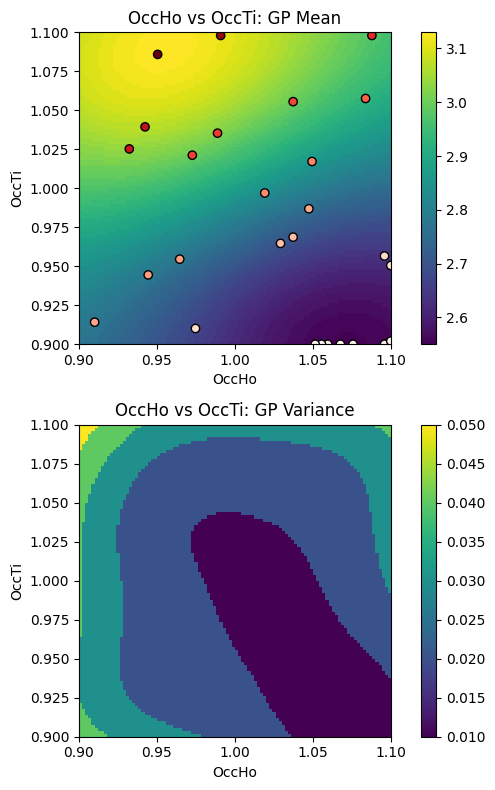

EI: [3.57668009e-03 3.54708824e-03 3.52356117e-03 ... 5.64992079e-05
 6.63030660e-05 7.76951783e-05]
Function eval #30
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 1.049494981765747]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4447
initial chi^2 1.6111e+06 with 2596 obs.
New scale: 0.4438
Cycle 0: 0.71s, Chi**2: 3.7074e+05 for 2596 obs., Lambda: 0,  Delta: 0.77, SVD=0
New scale: 0.4438
Maximum shift/esd = -228.133 for a

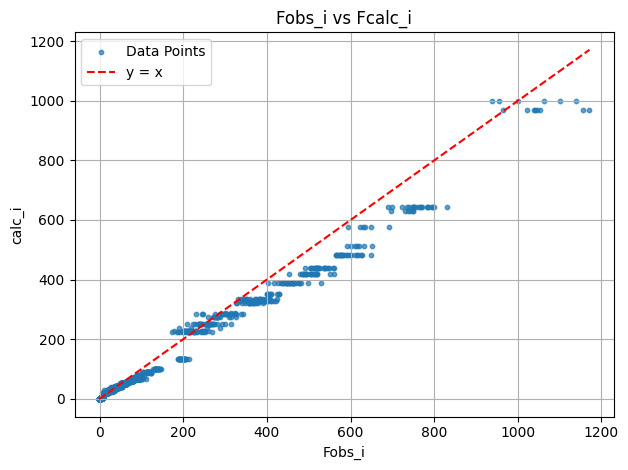

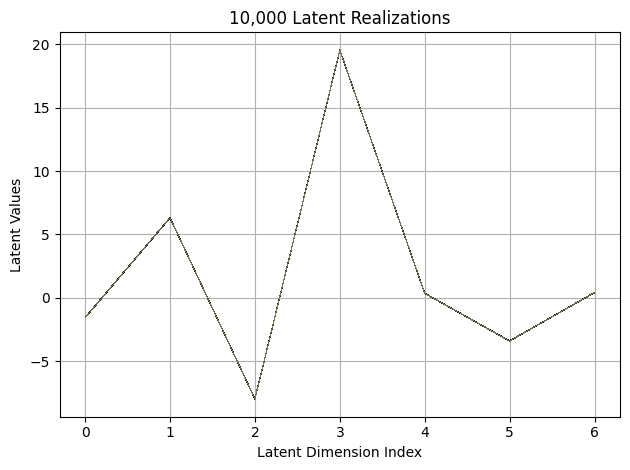

First 10 latent vectors from the VAE:
Sample 1: [-1.5507723093032837, 6.309648513793945, -7.979289531707764, 19.5328369140625, 0.3634890913963318, -3.404087781906128, 0.41540563106536865]
Sample 2: [-1.5680172443389893, 6.314751148223877, -7.974433898925781, 19.539344787597656, 0.3627919554710388, -3.390092372894287, 0.4095841348171234]
Sample 3: [-1.5589557886123657, 6.315864562988281, -7.965172290802002, 19.535608291625977, 0.35556331276893616, -3.4076714515686035, 0.4107547104358673]
Sample 4: [-1.572401762008667, 6.3199005126953125, -7.969644069671631, 19.5385684967041, 0.3614554703235626, -3.4104089736938477, 0.41520947217941284]
Sample 5: [-1.5568150281906128, 6.3209309577941895, -7.976071834564209, 19.539377212524414, 0.3554074466228485, -3.4101359844207764, 0.42090708017349243]
Sample 6: [-1.5619632005691528, 6.303094387054443, -7.9723005294799805, 19.54549789428711, 0.36631032824516296, -3.4016380310058594, 0.4132702946662903]
Sample 7: [-1.563136100769043, 6.315826892852783, 

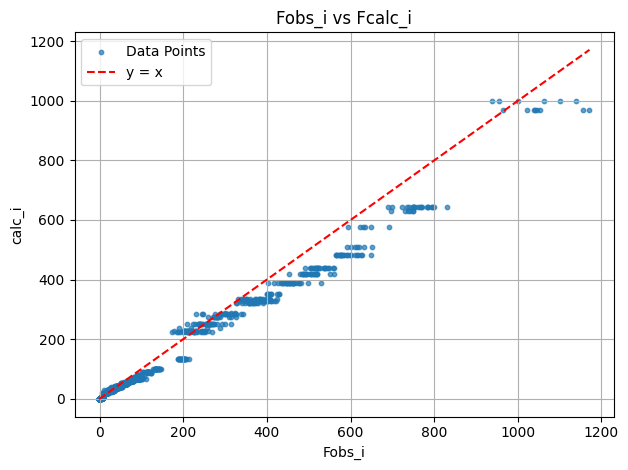

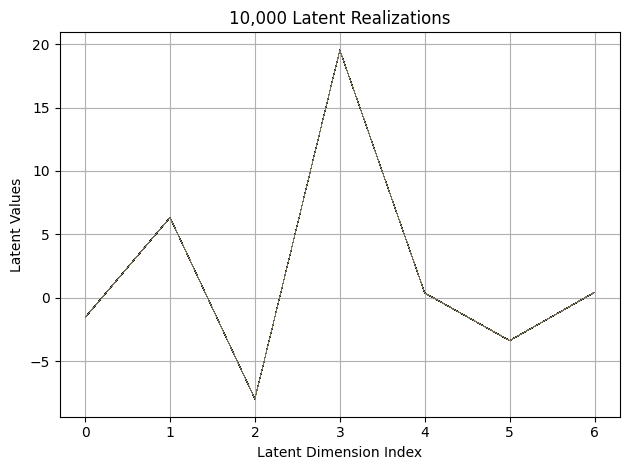

First 10 latent vectors from the VAE:
Sample 1: [-1.5603363513946533, 6.326254844665527, -7.996651649475098, 19.528669357299805, 0.3820928633213043, -3.391087770462036, 0.421902596950531]
Sample 2: [-1.5615639686584473, 6.327239036560059, -7.981366157531738, 19.524826049804688, 0.3821607530117035, -3.375946044921875, 0.4216694235801697]
Sample 3: [-1.5736236572265625, 6.317292213439941, -7.984035968780518, 19.526960372924805, 0.35640978813171387, -3.376694917678833, 0.4284690320491791]
Sample 4: [-1.5621925592422485, 6.322872161865234, -7.996208667755127, 19.527286529541016, 0.372416615486145, -3.394134283065796, 0.411256343126297]
Sample 5: [-1.5472049713134766, 6.322229862213135, -7.998365879058838, 19.53165054321289, 0.373166561126709, -3.386390447616577, 0.4234694540500641]
Sample 6: [-1.5723799467086792, 6.316440105438232, -7.986827850341797, 19.531734466552734, 0.38156357407569885, -3.390491485595703, 0.41832777857780457]
Sample 7: [-1.5508099794387817, 6.321436882019043, -7.9949

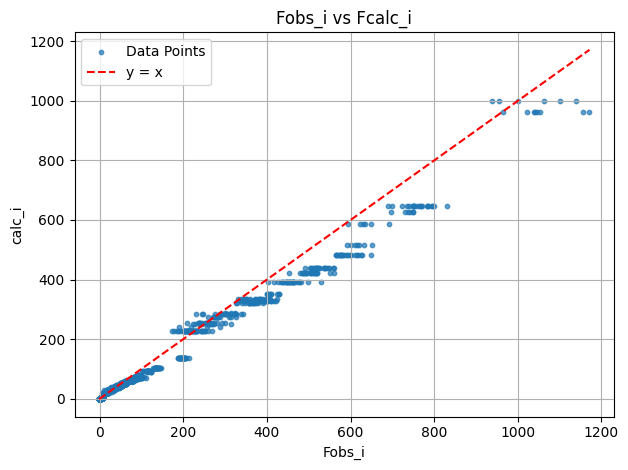

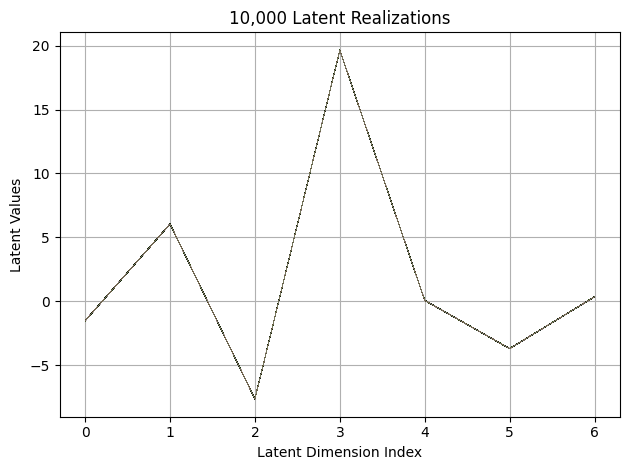

First 10 latent vectors from the VAE:
Sample 1: [-1.5353608131408691, 6.059510707855225, -7.6337385177612305, 19.65362548828125, 0.06388188898563385, -3.6981191635131836, 0.3489559590816498]
Sample 2: [-1.5360009670257568, 6.0463433265686035, -7.640509128570557, 19.66187858581543, 0.07577113062143326, -3.7139315605163574, 0.3428712785243988]
Sample 3: [-1.5196157693862915, 6.035551071166992, -7.6434736251831055, 19.641677856445312, 0.060910552740097046, -3.7056615352630615, 0.35146838426589966]
Sample 4: [-1.5225502252578735, 6.043135166168213, -7.648896217346191, 19.648338317871094, 0.058193325996398926, -3.7093210220336914, 0.34237170219421387]
Sample 5: [-1.5360146760940552, 6.037930965423584, -7.636949062347412, 19.649147033691406, 0.0694885104894638, -3.7025017738342285, 0.34504249691963196]
Sample 6: [-1.5389174222946167, 6.049551486968994, -7.643194198608398, 19.657331466674805, 0.06788310408592224, -3.7082488536834717, 0.34937283396720886]
Sample 7: [-1.5197638273239136, 6.0441

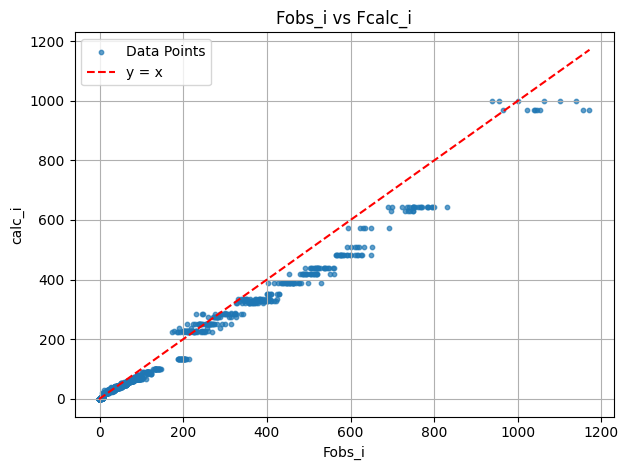

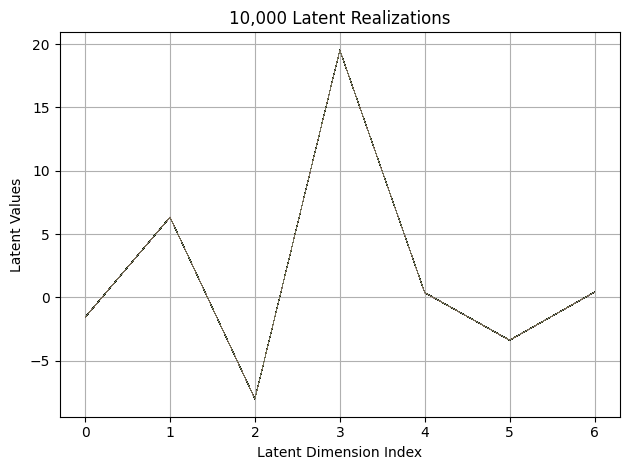

First 10 latent vectors from the VAE:
Sample 1: [-1.5745197534561157, 6.33014440536499, -8.001174926757812, 19.529422760009766, 0.37977367639541626, -3.3731257915496826, 0.42565208673477173]
Sample 2: [-1.5593996047973633, 6.350808620452881, -7.996006011962891, 19.538726806640625, 0.3969442546367645, -3.3751118183135986, 0.41539713740348816]
Sample 3: [-1.565848469734192, 6.338731288909912, -8.01274585723877, 19.523681640625, 0.38055846095085144, -3.3623273372650146, 0.44064271450042725]
Sample 4: [-1.5711430311203003, 6.345747947692871, -8.009093284606934, 19.530467987060547, 0.36913952231407166, -3.372218132019043, 0.4300824999809265]
Sample 5: [-1.5646002292633057, 6.3532023429870605, -8.009135246276855, 19.531654357910156, 0.37882694602012634, -3.371245861053467, 0.4380688965320587]
Sample 6: [-1.5635541677474976, 6.334759712219238, -8.009110450744629, 19.517744064331055, 0.3905509114265442, -3.3670804500579834, 0.42739221453666687]
Sample 7: [-1.5681207180023193, 6.333348274230957

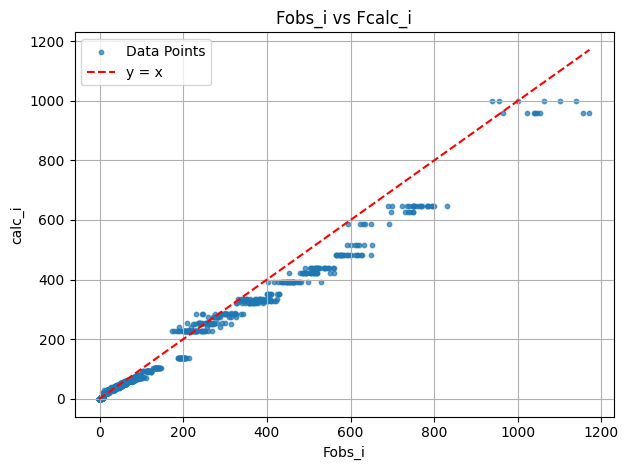

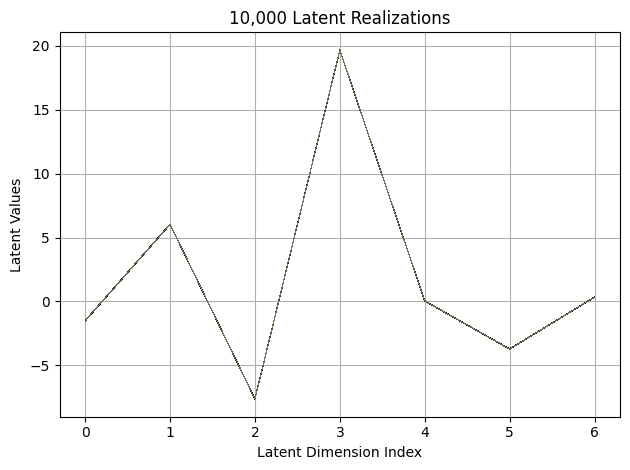

First 10 latent vectors from the VAE:
Sample 1: [-1.5079855918884277, 6.032282829284668, -7.627378940582275, 19.648218154907227, 0.03545410931110382, -3.7226314544677734, 0.33701130747795105]
Sample 2: [-1.5134834051132202, 6.039241313934326, -7.631364822387695, 19.65401268005371, 0.04842075705528259, -3.723698854446411, 0.33651304244995117]
Sample 3: [-1.5210094451904297, 6.039638042449951, -7.617319583892822, 19.65263557434082, 0.03509378433227539, -3.7107808589935303, 0.32840460538864136]
Sample 4: [-1.5131895542144775, 6.043276309967041, -7.619696617126465, 19.65192222595215, 0.03423910215497017, -3.7132978439331055, 0.33096808195114136]
Sample 5: [-1.513169765472412, 6.03938627243042, -7.6252217292785645, 19.670570373535156, 0.03570297360420227, -3.7127525806427, 0.33338043093681335]
Sample 6: [-1.5158096551895142, 6.038852214813232, -7.619996547698975, 19.65699577331543, 0.04137985035777092, -3.7133028507232666, 0.33359456062316895]
Sample 7: [-1.521246075630188, 6.03603649139404

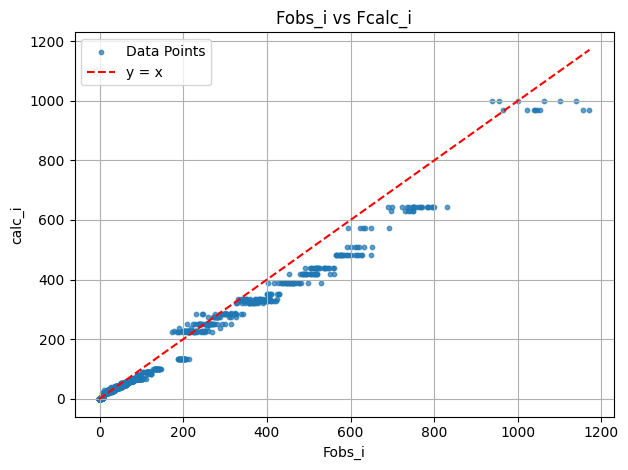

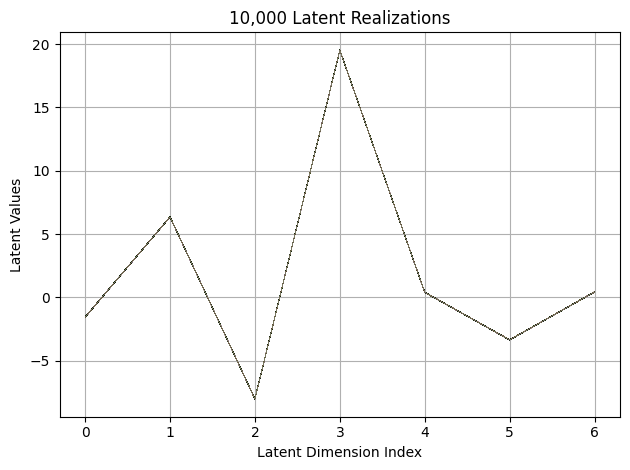

First 10 latent vectors from the VAE:
Sample 1: [-1.5717108249664307, 6.349007606506348, -8.01766300201416, 19.533069610595703, 0.40042486786842346, -3.3591432571411133, 0.4225482642650604]
Sample 2: [-1.567784309387207, 6.340694904327393, -8.009590148925781, 19.519285202026367, 0.39903780817985535, -3.356671094894409, 0.4300980865955353]
Sample 3: [-1.5707145929336548, 6.365468978881836, -8.02135944366455, 19.526588439941406, 0.40847280621528625, -3.355003595352173, 0.4195859134197235]
Sample 4: [-1.5700916051864624, 6.340545177459717, -8.01170825958252, 19.522539138793945, 0.40101996064186096, -3.361658811569214, 0.42522379755973816]
Sample 5: [-1.5660765171051025, 6.348722457885742, -8.01636028289795, 19.51938819885254, 0.39452269673347473, -3.3571581840515137, 0.4190041720867157]
Sample 6: [-1.5714582204818726, 6.340341091156006, -8.021477699279785, 19.518661499023438, 0.4038662314414978, -3.364952325820923, 0.42358335852622986]
Sample 7: [-1.565515160560608, 6.353606224060059, -8.

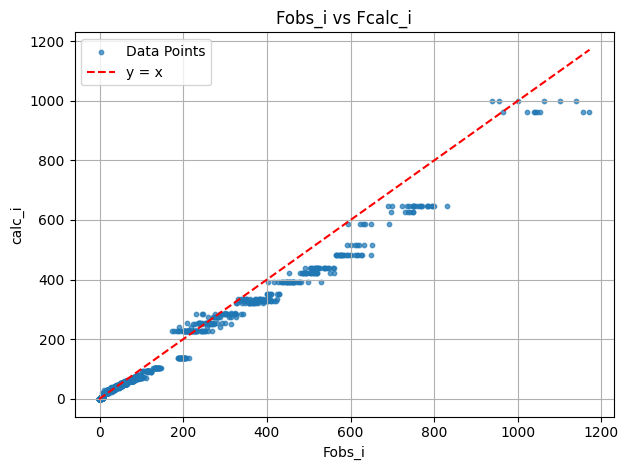

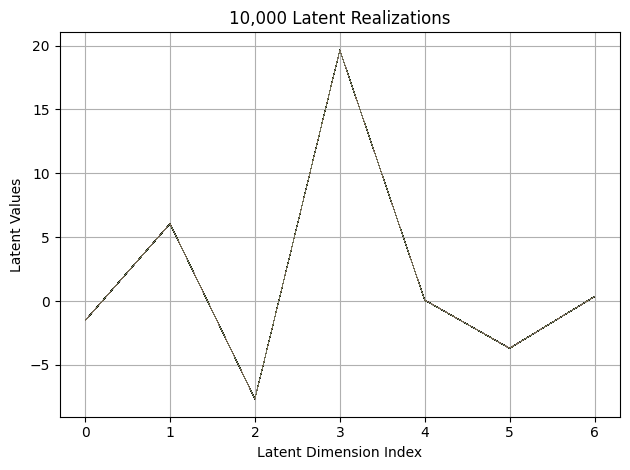

First 10 latent vectors from the VAE:
Sample 1: [-1.5326036214828491, 6.064541339874268, -7.6583638191223145, 19.64472198486328, 0.07722140103578568, -3.6721343994140625, 0.3601221442222595]
Sample 2: [-1.53290855884552, 6.044370174407959, -7.668194770812988, 19.651172637939453, 0.07788670808076859, -3.7075767517089844, 0.3445298969745636]
Sample 3: [-1.5354167222976685, 6.060837268829346, -7.652765274047852, 19.643781661987305, 0.08113022893667221, -3.6981441974639893, 0.3484714925289154]
Sample 4: [-1.525383710861206, 6.059417724609375, -7.662508487701416, 19.653223037719727, 0.07169146090745926, -3.7031402587890625, 0.34798064827919006]
Sample 5: [-1.5349299907684326, 6.052804470062256, -7.665024757385254, 19.645263671875, 0.07495567202568054, -3.7058236598968506, 0.3514203429222107]
Sample 6: [-1.5242055654525757, 6.045371055603027, -7.664133548736572, 19.65064239501953, 0.07112479209899902, -3.6973066329956055, 0.33784589171409607]
Sample 7: [-1.5211384296417236, 6.054116725921631

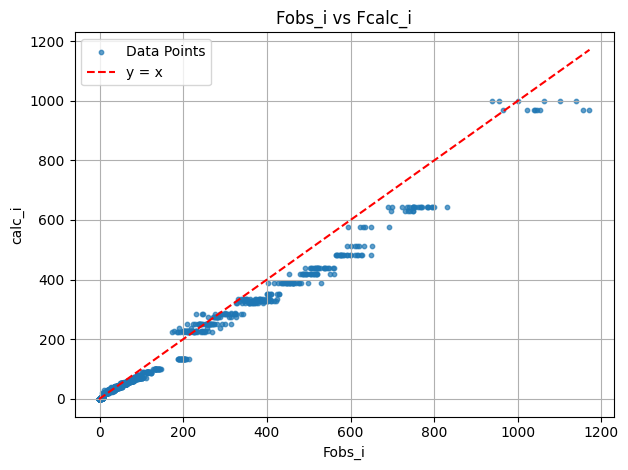

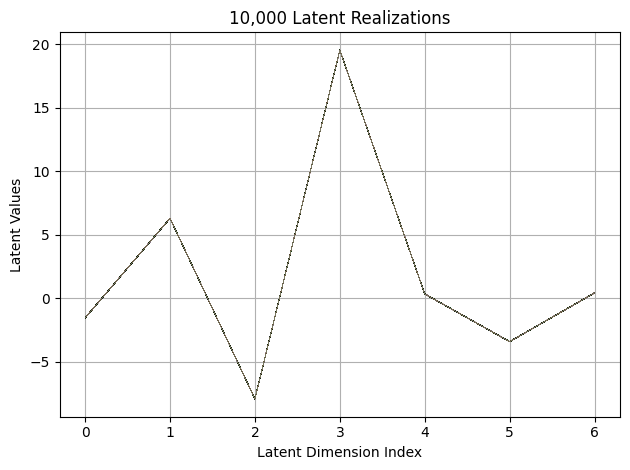

First 10 latent vectors from the VAE:
Sample 1: [-1.5534801483154297, 6.284837245941162, -7.9375834465026855, 19.554981231689453, 0.33040180802345276, -3.4358291625976562, 0.4226721227169037]
Sample 2: [-1.5615371465682983, 6.30266809463501, -7.951725959777832, 19.545509338378906, 0.3325669467449188, -3.4289815425872803, 0.4170655310153961]
Sample 3: [-1.5656706094741821, 6.286923885345459, -7.949856281280518, 19.546077728271484, 0.32335659861564636, -3.4285776615142822, 0.4058091640472412]
Sample 4: [-1.5539915561676025, 6.289361000061035, -7.937458038330078, 19.56403350830078, 0.3271327614784241, -3.4316611289978027, 0.40545693039894104]
Sample 5: [-1.5599050521850586, 6.285240173339844, -7.9367780685424805, 19.550113677978516, 0.3364354372024536, -3.4216392040252686, 0.4105096459388733]
Sample 6: [-1.5493056774139404, 6.284289836883545, -7.9421067237854, 19.53881072998047, 0.32465535402297974, -3.4326319694519043, 0.402945876121521]
Sample 7: [-1.5481675863265991, 6.281716823577881,

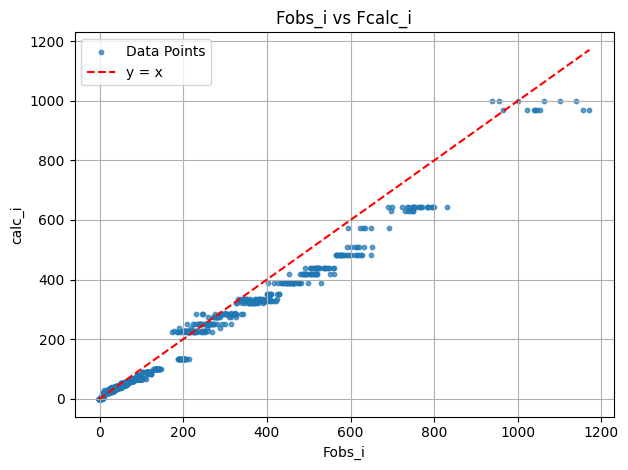

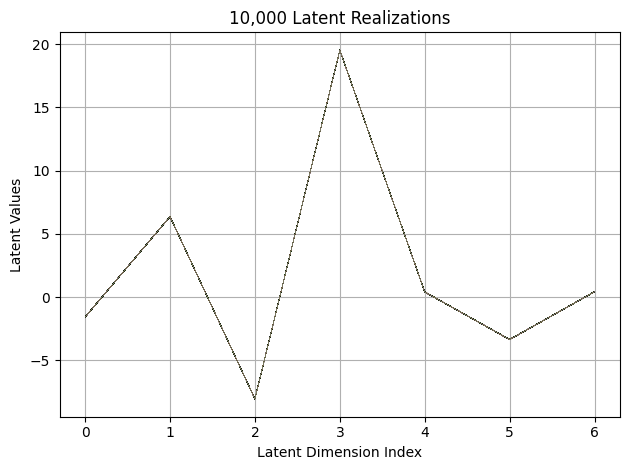

First 10 latent vectors from the VAE:
Sample 1: [-1.5705187320709229, 6.367622375488281, -8.032540321350098, 19.50914192199707, 0.4104502201080322, -3.3453378677368164, 0.43189501762390137]
Sample 2: [-1.577795147895813, 6.360107898712158, -8.027812004089355, 19.511301040649414, 0.41886261105537415, -3.350473165512085, 0.431840717792511]
Sample 3: [-1.5661307573318481, 6.366868495941162, -8.030235290527344, 19.522245407104492, 0.4075268507003784, -3.3418829441070557, 0.43833836913108826]
Sample 4: [-1.5608534812927246, 6.355996608734131, -8.032313346862793, 19.524616241455078, 0.4146147072315216, -3.3442604541778564, 0.429008424282074]
Sample 5: [-1.5634902715682983, 6.368084907531738, -8.030728340148926, 19.51731300354004, 0.41952380537986755, -3.354222536087036, 0.4264865815639496]
Sample 6: [-1.56098210811615, 6.365584373474121, -8.038237571716309, 19.51757049560547, 0.41204243898391724, -3.343604803085327, 0.4389576315879822]
Sample 7: [-1.5721561908721924, 6.374671936035156, -8.03

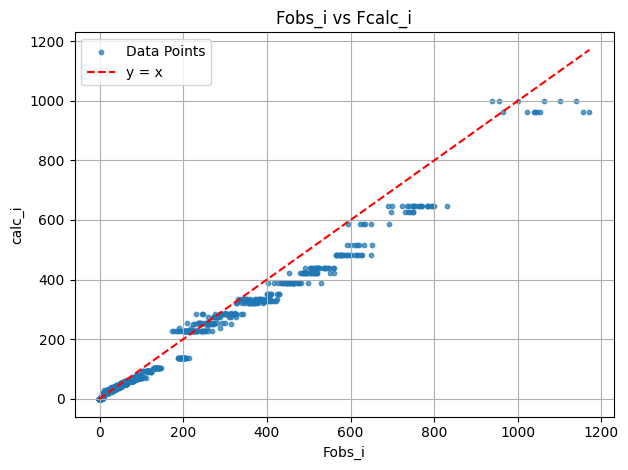

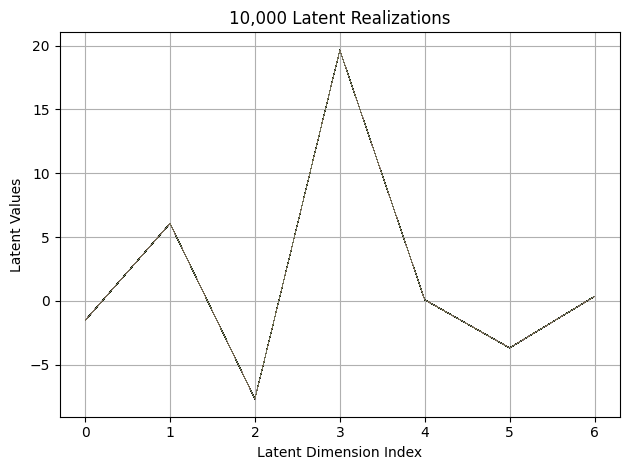

First 10 latent vectors from the VAE:
Sample 1: [-1.5435858964920044, 6.0618791580200195, -7.675807476043701, 19.634809494018555, 0.1007857620716095, -3.6826398372650146, 0.3554098308086395]
Sample 2: [-1.5226160287857056, 6.070196151733398, -7.678975582122803, 19.635435104370117, 0.08205420523881912, -3.6792633533477783, 0.3548630475997925]
Sample 3: [-1.5241626501083374, 6.072566509246826, -7.670654773712158, 19.634592056274414, 0.10741356015205383, -3.6786842346191406, 0.3465249836444855]
Sample 4: [-1.537981629371643, 6.055501937866211, -7.677064895629883, 19.648405075073242, 0.08083251863718033, -3.678502082824707, 0.3594591021537781]
Sample 5: [-1.5241636037826538, 6.068876266479492, -7.667401313781738, 19.633460998535156, 0.08851844817399979, -3.676255226135254, 0.35105282068252563]
Sample 6: [-1.5265765190124512, 6.075544834136963, -7.670320987701416, 19.634620666503906, 0.0964132621884346, -3.676537275314331, 0.3537537157535553]
Sample 7: [-1.5227136611938477, 6.07105588912963

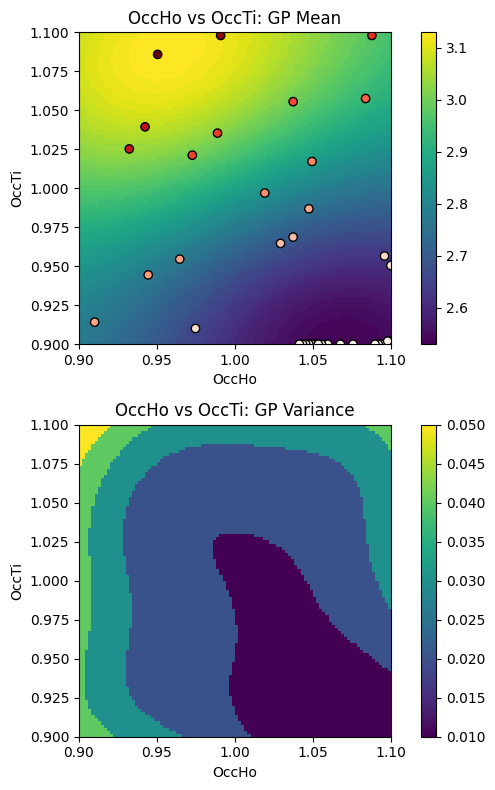

EI: [4.20545600e-03 4.16566990e-03 4.13275510e-03 ... 7.93657964e-05
 9.28313239e-05 1.08455191e-04]
Function eval #40
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 1.0575758218765259]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4383
initial chi^2 1.6985e+06 with 2596 obs.
New scale: 0.4375
Cycle 0: 0.74s, Chi**2: 3.7872e+05 for 2596 obs., Lambda: 0,  Delta: 0.777, SVD=0
New scale: 0.4375
Maximum shift/esd = -234.770 for

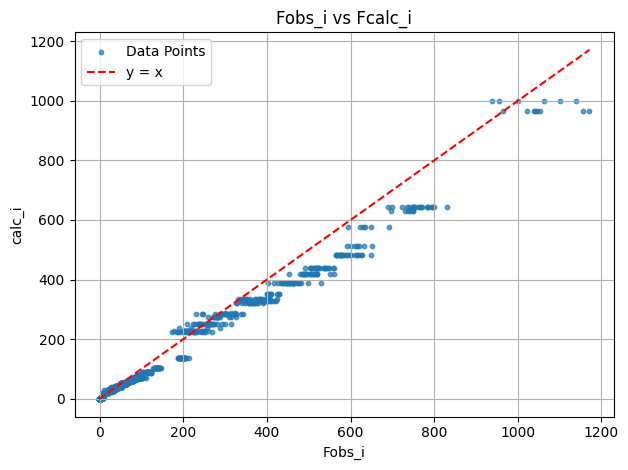

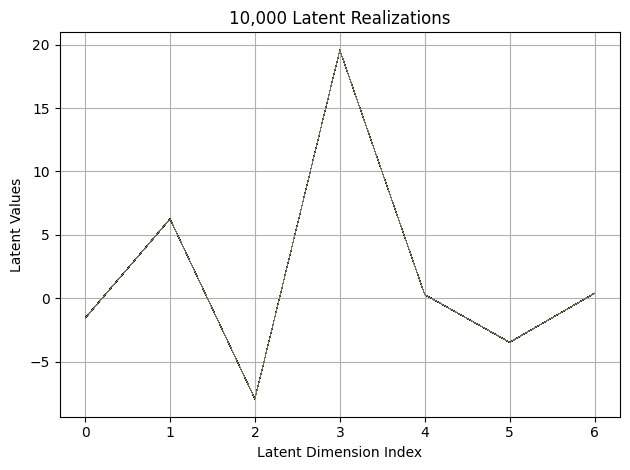

First 10 latent vectors from the VAE:
Sample 1: [-1.5563839673995972, 6.258580207824707, -7.9075822830200195, 19.559280395507812, 0.3030935227870941, -3.470438003540039, 0.4132786691188812]
Sample 2: [-1.5529824495315552, 6.265236854553223, -7.917316436767578, 19.573230743408203, 0.31793469190597534, -3.4534735679626465, 0.4089165925979614]
Sample 3: [-1.5532170534133911, 6.26516580581665, -7.912435531616211, 19.56013298034668, 0.3073759973049164, -3.450331449508667, 0.40338215231895447]
Sample 4: [-1.5677961111068726, 6.265456199645996, -7.908148765563965, 19.56269645690918, 0.28592872619628906, -3.4509005546569824, 0.41409116983413696]
Sample 5: [-1.5607860088348389, 6.270268440246582, -7.907289028167725, 19.552581787109375, 0.3082806169986725, -3.4620840549468994, 0.4094429612159729]
Sample 6: [-1.5511125326156616, 6.262052536010742, -7.929781913757324, 19.545339584350586, 0.3021275997161865, -3.458690643310547, 0.4103775918483734]
Sample 7: [-1.566453218460083, 6.267331123352051, -

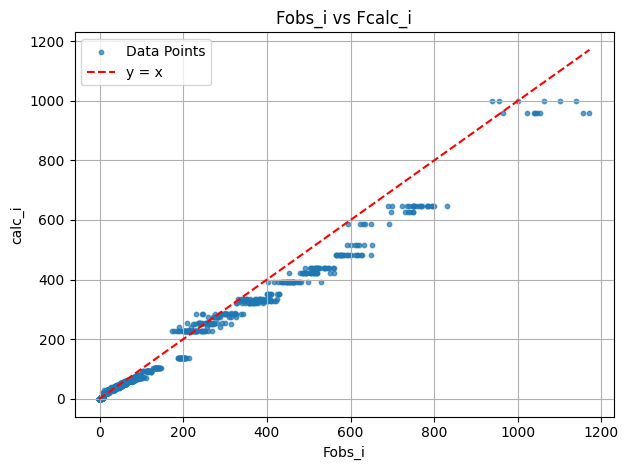

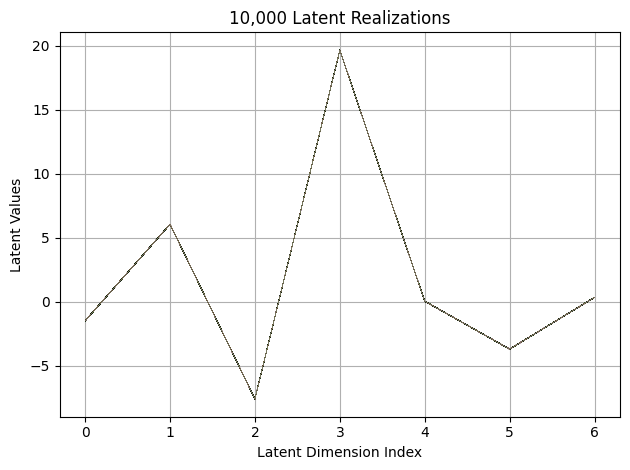

First 10 latent vectors from the VAE:
Sample 1: [-1.4976223707199097, 6.043994426727295, -7.611217975616455, 19.658567428588867, 0.027978554368019104, -3.720262289047241, 0.3399297893047333]
Sample 2: [-1.4903007745742798, 6.037018775939941, -7.608561992645264, 19.644216537475586, 0.0184159092605114, -3.7076644897460938, 0.331800639629364]
Sample 3: [-1.5122689008712769, 6.037214756011963, -7.589583396911621, 19.653167724609375, 0.028141167014837265, -3.709512948989868, 0.3273249864578247]
Sample 4: [-1.4961092472076416, 6.0490570068359375, -7.6135711669921875, 19.663118362426758, 0.03616272285580635, -3.7110402584075928, 0.3265657424926758]
Sample 5: [-1.491865634918213, 6.052269458770752, -7.617165565490723, 19.65460205078125, 0.026812326163053513, -3.7262930870056152, 0.3266569674015045]
Sample 6: [-1.498388648033142, 6.041988849639893, -7.615284442901611, 19.656408309936523, 0.03247077018022537, -3.7219960689544678, 0.3252496123313904]
Sample 7: [-1.498760461807251, 6.0501246452331

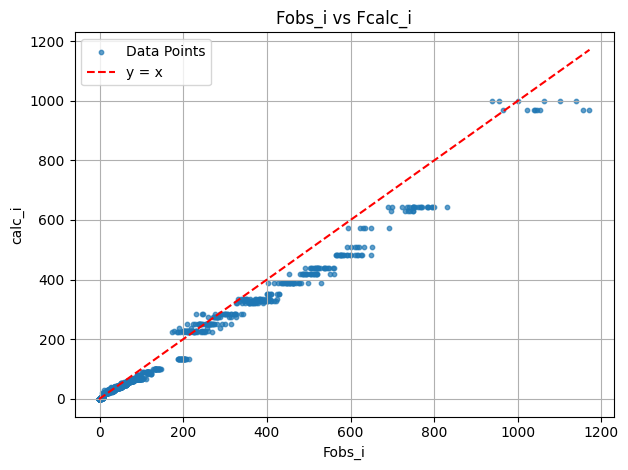

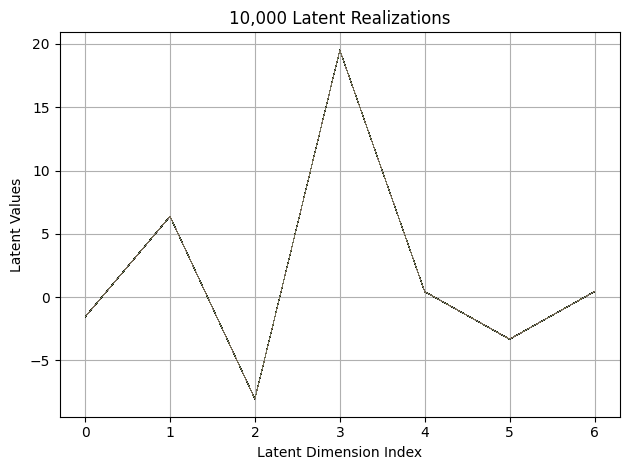

First 10 latent vectors from the VAE:
Sample 1: [-1.5681198835372925, 6.373330116271973, -8.053010940551758, 19.517091751098633, 0.4274596869945526, -3.332042932510376, 0.4388885796070099]
Sample 2: [-1.5602920055389404, 6.370791912078857, -8.049426078796387, 19.512346267700195, 0.4320107698440552, -3.3301074504852295, 0.437600314617157]
Sample 3: [-1.5613991022109985, 6.3703389167785645, -8.050671577453613, 19.499588012695312, 0.4410414397716522, -3.318300485610962, 0.42264413833618164]
Sample 4: [-1.5767282247543335, 6.365917205810547, -8.058720588684082, 19.51582908630371, 0.4299936294555664, -3.334005355834961, 0.43175530433654785]
Sample 5: [-1.562885046005249, 6.363019943237305, -8.053293228149414, 19.503068923950195, 0.4264676868915558, -3.330380439758301, 0.43690046668052673]
Sample 6: [-1.5747586488723755, 6.373150825500488, -8.041226387023926, 19.5111026763916, 0.4271068572998047, -3.326699733734131, 0.43322300910949707]
Sample 7: [-1.5634061098098755, 6.3685078620910645, -8.

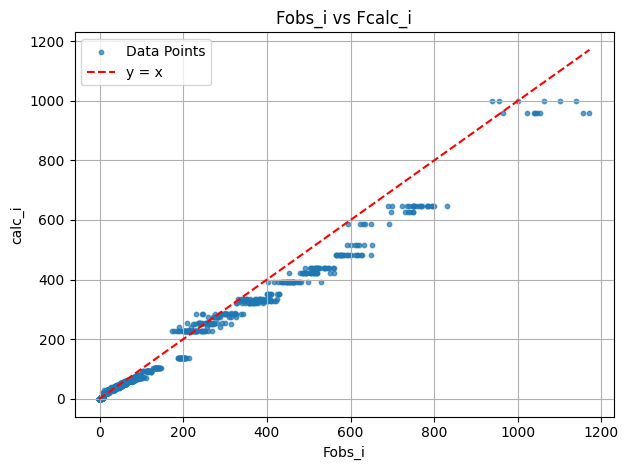

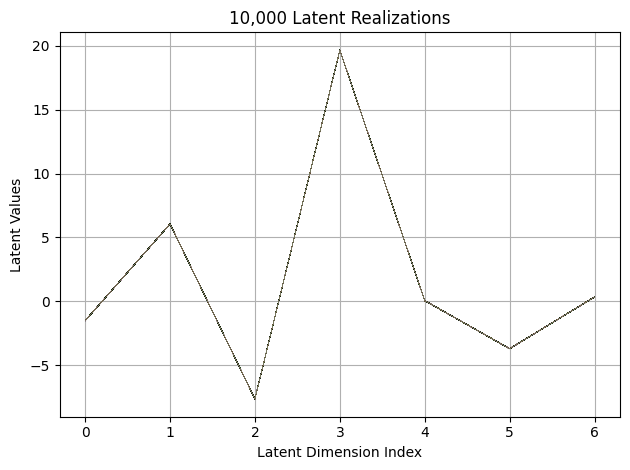

First 10 latent vectors from the VAE:
Sample 1: [-1.5069456100463867, 6.064688682556152, -7.632573127746582, 19.648836135864258, 0.04779906943440437, -3.7213470935821533, 0.342662513256073]
Sample 2: [-1.5079349279403687, 6.051011562347412, -7.633031845092773, 19.6571102142334, 0.051905568689107895, -3.7000949382781982, 0.34047165513038635]
Sample 3: [-1.5160555839538574, 6.055983543395996, -7.636071681976318, 19.646015167236328, 0.0532313771545887, -3.7017438411712646, 0.3405180871486664]
Sample 4: [-1.5170385837554932, 6.046634674072266, -7.64989709854126, 19.646316528320312, 0.05516095459461212, -3.7171168327331543, 0.3483923375606537]
Sample 5: [-1.5202468633651733, 6.0476579666137695, -7.635069847106934, 19.647125244140625, 0.06375886499881744, -3.702383041381836, 0.33634671568870544]
Sample 6: [-1.5342379808425903, 6.038534164428711, -7.641514301300049, 19.649627685546875, 0.04909771308302879, -3.710951328277588, 0.34123799204826355]
Sample 7: [-1.515860676765442, 6.0363864898681

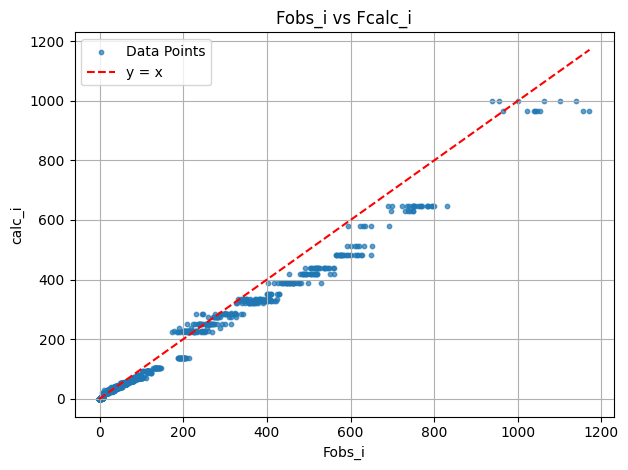

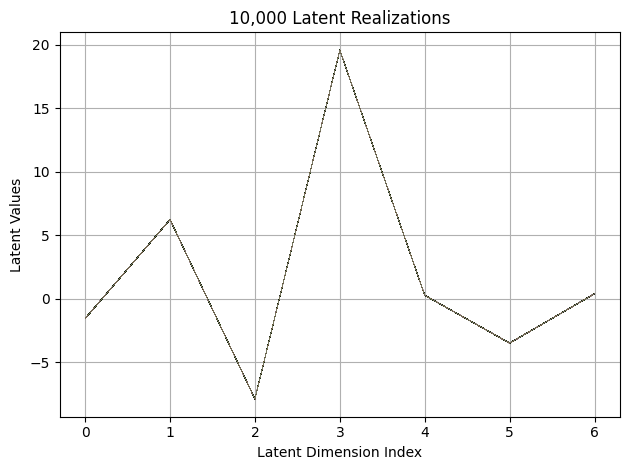

First 10 latent vectors from the VAE:
Sample 1: [-1.5469958782196045, 6.233811378479004, -7.882149696350098, 19.559764862060547, 0.2810046970844269, -3.482570171356201, 0.40343010425567627]
Sample 2: [-1.5696197748184204, 6.241130352020264, -7.862015724182129, 19.564212799072266, 0.27556395530700684, -3.4919281005859375, 0.39880749583244324]
Sample 3: [-1.5572494268417358, 6.240304470062256, -7.8778910636901855, 19.577632904052734, 0.2741234004497528, -3.470181703567505, 0.4040180742740631]
Sample 4: [-1.5403695106506348, 6.236109733581543, -7.884047031402588, 19.578811645507812, 0.2805657684803009, -3.4945147037506104, 0.39559677243232727]
Sample 5: [-1.5481032133102417, 6.246647834777832, -7.894222736358643, 19.56894874572754, 0.2664050757884979, -3.482534646987915, 0.4018232524394989]
Sample 6: [-1.548570990562439, 6.240353107452393, -7.883249282836914, 19.58438491821289, 0.2875659167766571, -3.4814419746398926, 0.3894217014312744]
Sample 7: [-1.5520379543304443, 6.233946323394775, 

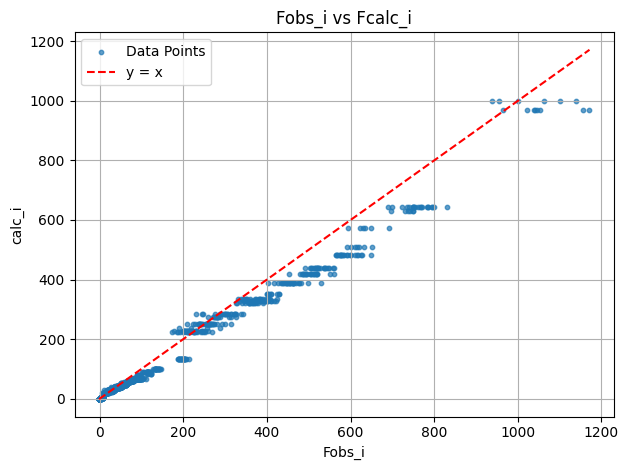

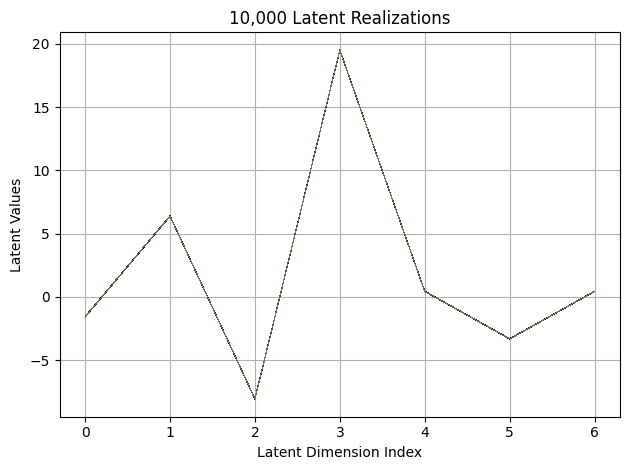

First 10 latent vectors from the VAE:
Sample 1: [-1.5694775581359863, 6.387872695922852, -8.060561180114746, 19.50701904296875, 0.4451935291290283, -3.2959818840026855, 0.4421963691711426]
Sample 2: [-1.5693598985671997, 6.389158725738525, -8.054831504821777, 19.509456634521484, 0.4370270371437073, -3.2999165058135986, 0.4498864710330963]
Sample 3: [-1.5698221921920776, 6.39957857131958, -8.056387901306152, 19.524843215942383, 0.4489116668701172, -3.3055312633514404, 0.4363991618156433]
Sample 4: [-1.572590947151184, 6.377930641174316, -8.07018756866455, 19.495845794677734, 0.43289265036582947, -3.3203389644622803, 0.4408753514289856]
Sample 5: [-1.5581176280975342, 6.3821797370910645, -8.066718101501465, 19.49694061279297, 0.44232097268104553, -3.320789098739624, 0.43623489141464233]
Sample 6: [-1.5686365365982056, 6.37644100189209, -8.0557279586792, 19.50007438659668, 0.4405544698238373, -3.3204731941223145, 0.4432491362094879]
Sample 7: [-1.572196125984192, 6.39056921005249, -8.0592

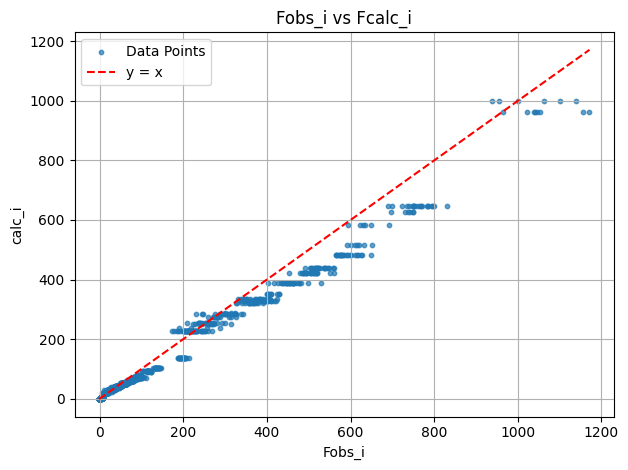

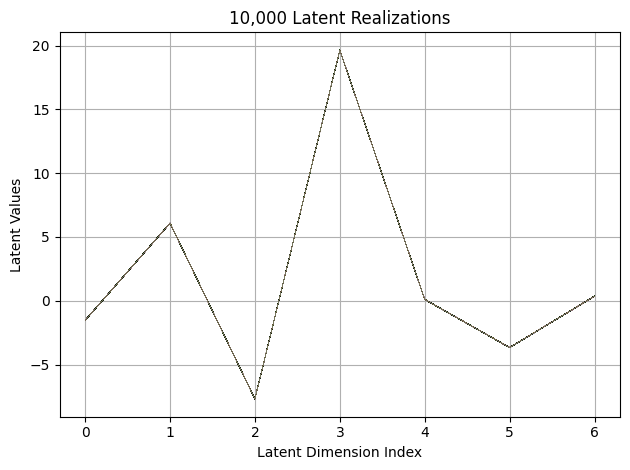

First 10 latent vectors from the VAE:
Sample 1: [-1.5365804433822632, 6.080780029296875, -7.693475723266602, 19.64125633239746, 0.10618676990270615, -3.663721799850464, 0.35842394828796387]
Sample 2: [-1.5354174375534058, 6.079649925231934, -7.680922508239746, 19.628400802612305, 0.10778256505727768, -3.6743838787078857, 0.3446893095970154]
Sample 3: [-1.5393425226211548, 6.081790447235107, -7.697485446929932, 19.641143798828125, 0.10352504998445511, -3.661632537841797, 0.35464444756507874]
Sample 4: [-1.5246280431747437, 6.085232734680176, -7.687255859375, 19.62849235534668, 0.11689430475234985, -3.6675329208374023, 0.3563764691352844]
Sample 5: [-1.5353208780288696, 6.083136081695557, -7.691627025604248, 19.63886833190918, 0.10433743894100189, -3.6526784896850586, 0.35445159673690796]
Sample 6: [-1.5286742448806763, 6.080928325653076, -7.688871383666992, 19.632089614868164, 0.10755851119756699, -3.671381950378418, 0.369064062833786]
Sample 7: [-1.536539077758789, 6.074130535125732, -

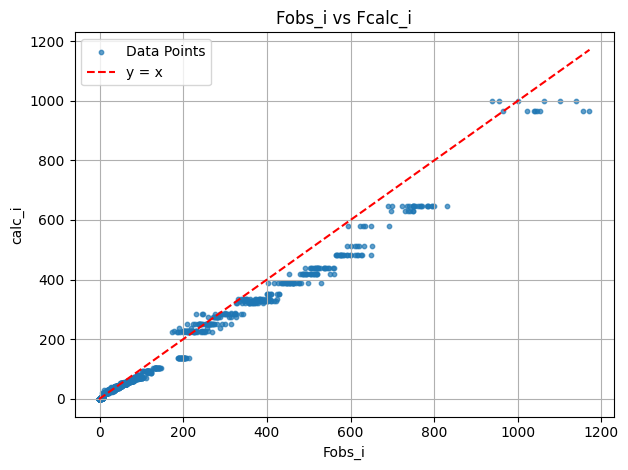

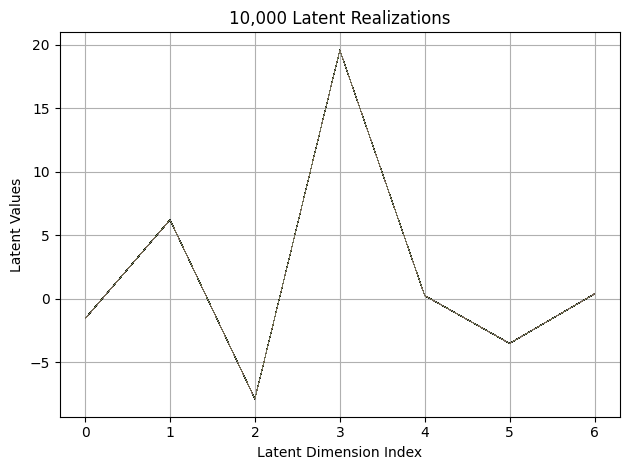

First 10 latent vectors from the VAE:
Sample 1: [-1.549888253211975, 6.219460964202881, -7.876643180847168, 19.585742950439453, 0.2584521770477295, -3.501842975616455, 0.4095377027988434]
Sample 2: [-1.5613313913345337, 6.219902515411377, -7.872062683105469, 19.561975479125977, 0.2632535398006439, -3.5045065879821777, 0.38808876276016235]
Sample 3: [-1.5463993549346924, 6.226291179656982, -7.869140148162842, 19.5811824798584, 0.26481521129608154, -3.4944231510162354, 0.3966004252433777]
Sample 4: [-1.5438799858093262, 6.208555698394775, -7.864650249481201, 19.583904266357422, 0.25124579668045044, -3.502655029296875, 0.38924580812454224]
Sample 5: [-1.5459561347961426, 6.225021839141846, -7.8761210441589355, 19.58415985107422, 0.24984177947044373, -3.4947822093963623, 0.39276638627052307]
Sample 6: [-1.550296425819397, 6.2315449714660645, -7.861999034881592, 19.561786651611328, 0.26488038897514343, -3.5020875930786133, 0.39007923007011414]
Sample 7: [-1.5540573596954346, 6.2224979400634

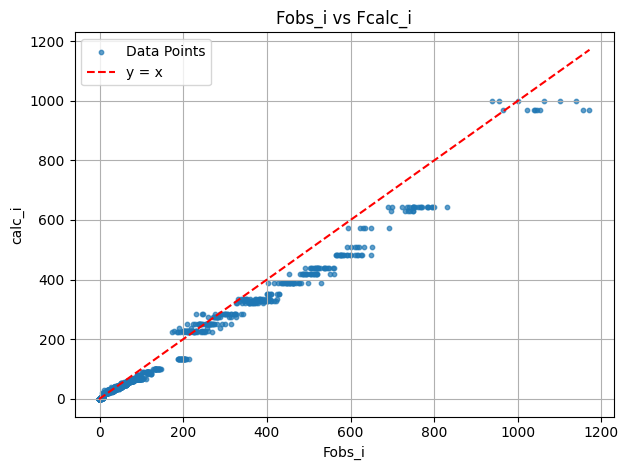

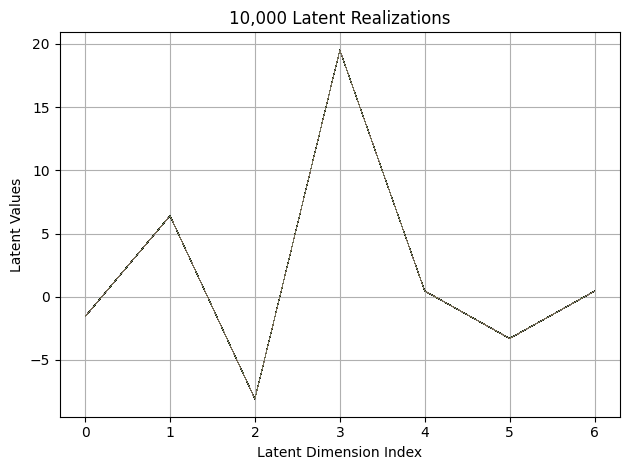

First 10 latent vectors from the VAE:
Sample 1: [-1.5845191478729248, 6.3971171379089355, -8.089635848999023, 19.496658325195312, 0.4578172564506531, -3.298736333847046, 0.43694889545440674]
Sample 2: [-1.5679571628570557, 6.395711898803711, -8.070778846740723, 19.506824493408203, 0.46431660652160645, -3.3058996200561523, 0.4440299868583679]
Sample 3: [-1.564233422279358, 6.403450965881348, -8.078486442565918, 19.496124267578125, 0.4457014203071594, -3.2977330684661865, 0.4434637725353241]
Sample 4: [-1.564431071281433, 6.4103498458862305, -8.076677322387695, 19.506210327148438, 0.45868054032325745, -3.302668571472168, 0.4399341344833374]
Sample 5: [-1.5671427249908447, 6.391694068908691, -8.078752517700195, 19.49901580810547, 0.4537053406238556, -3.306241989135742, 0.4447234272956848]
Sample 6: [-1.5717523097991943, 6.403905868530273, -8.071810722351074, 19.49506187438965, 0.4508135914802551, -3.2924702167510986, 0.4295940697193146]
Sample 7: [-1.562608003616333, 6.403745174407959, -8

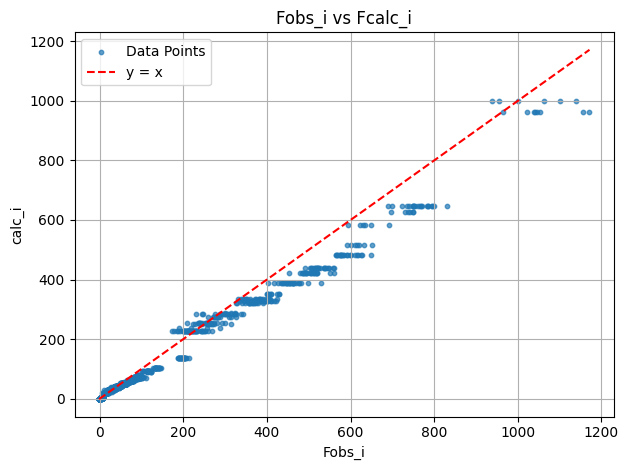

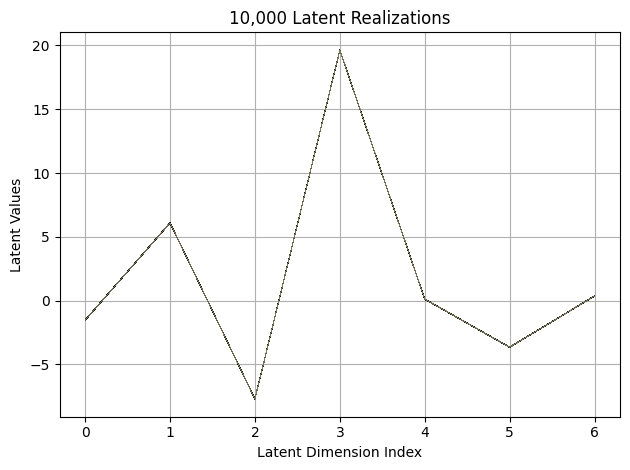

First 10 latent vectors from the VAE:
Sample 1: [-1.5303699970245361, 6.094775199890137, -7.709824085235596, 19.63835334777832, 0.11786864697933197, -3.657574415206909, 0.3637917637825012]
Sample 2: [-1.5276918411254883, 6.0883612632751465, -7.714183330535889, 19.634624481201172, 0.11711039394140244, -3.6546785831451416, 0.3662712872028351]
Sample 3: [-1.5232903957366943, 6.090724468231201, -7.702232837677002, 19.624370574951172, 0.10657117515802383, -3.6600441932678223, 0.35285359621047974]
Sample 4: [-1.547906756401062, 6.094372749328613, -7.709852695465088, 19.64295196533203, 0.11377479881048203, -3.655305862426758, 0.3655443787574768]
Sample 5: [-1.5321975946426392, 6.0870537757873535, -7.697450637817383, 19.636119842529297, 0.11836490780115128, -3.6498355865478516, 0.3649693429470062]
Sample 6: [-1.5354808568954468, 6.09901762008667, -7.695637226104736, 19.62224578857422, 0.10894200950860977, -3.6485958099365234, 0.3663910925388336]
Sample 7: [-1.5402538776397705, 6.09577322006225

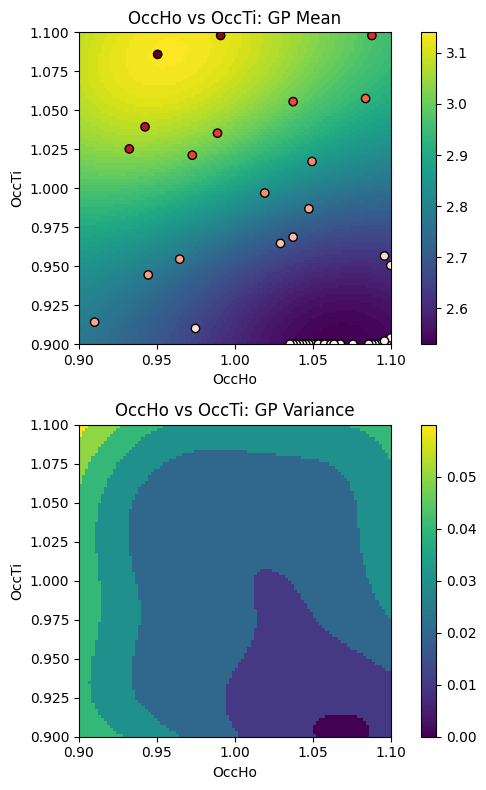

EI: [0.00470176 0.00464784 0.00460161 ... 0.00010576 0.00012324 0.00014348]
Function eval #50
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 1.0656565427780151]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4321
initial chi^2 1.7896e+06 with 2596 obs.
New scale: 0.4312
Cycle 0: 0.81s, Chi**2: 3.8679e+05 for 2596 obs., Lambda: 0,  Delta: 0.784, SVD=0
New scale: 0.4312
Maximum shift/esd = -241.532 for all cycles
Read from fil

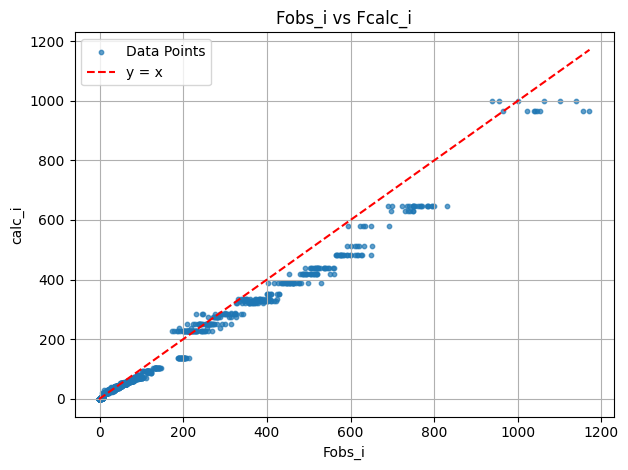

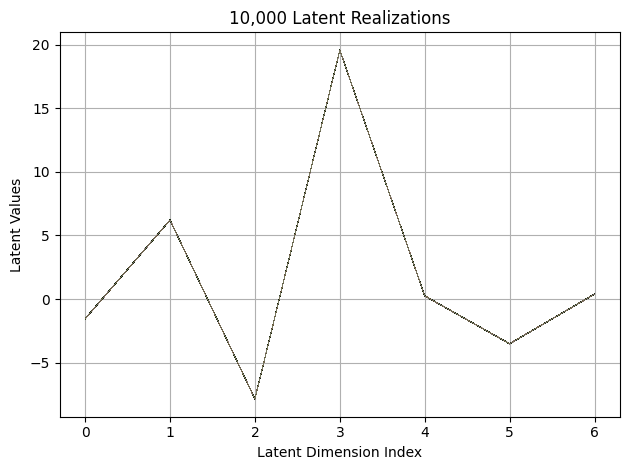

First 10 latent vectors from the VAE:
Sample 1: [-1.5467761754989624, 6.212006092071533, -7.844707489013672, 19.58722496032715, 0.255271315574646, -3.5067801475524902, 0.39367401599884033]
Sample 2: [-1.5540217161178589, 6.20428991317749, -7.84201192855835, 19.585865020751953, 0.25289657711982727, -3.5161328315734863, 0.39124056696891785]
Sample 3: [-1.54512619972229, 6.219403266906738, -7.845922470092773, 19.58177375793457, 0.24415665864944458, -3.5039308071136475, 0.40300440788269043]
Sample 4: [-1.5504474639892578, 6.204685688018799, -7.8432159423828125, 19.589412689208984, 0.24111105501651764, -3.525210380554199, 0.39025256037712097]
Sample 5: [-1.5525126457214355, 6.209169387817383, -7.850864410400391, 19.58006477355957, 0.2487594336271286, -3.511371612548828, 0.3881610333919525]
Sample 6: [-1.5523350238800049, 6.211924076080322, -7.8618083000183105, 19.574312210083008, 0.2561205327510834, -3.5151681900024414, 0.3850633502006531]
Sample 7: [-1.5513858795166016, 6.216096878051758, 

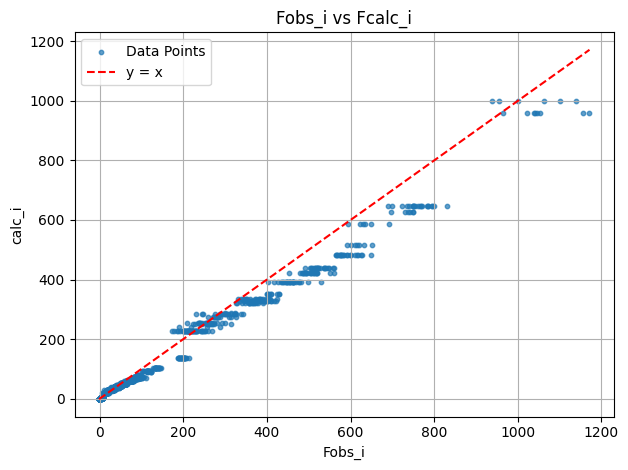

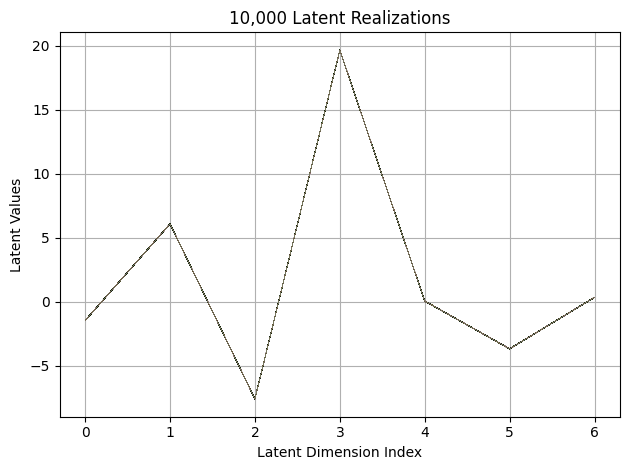

First 10 latent vectors from the VAE:
Sample 1: [-1.4857035875320435, 6.06689977645874, -7.620450973510742, 19.65229034423828, 0.029117563739418983, -3.6998062133789062, 0.34113645553588867]
Sample 2: [-1.4977000951766968, 6.0522613525390625, -7.60376501083374, 19.64471435546875, 0.02000328339636326, -3.690777540206909, 0.33008652925491333]
Sample 3: [-1.4824448823928833, 6.071270942687988, -7.614396095275879, 19.65257453918457, 0.05014241859316826, -3.7017269134521484, 0.33724474906921387]
Sample 4: [-1.48159921169281, 6.069457530975342, -7.62351655960083, 19.651472091674805, 0.03369009494781494, -3.7040202617645264, 0.3356701135635376]
Sample 5: [-1.473009467124939, 6.068892955780029, -7.602580547332764, 19.648069381713867, 0.04066311568021774, -3.6930065155029297, 0.32828760147094727]
Sample 6: [-1.5010539293289185, 6.065489292144775, -7.614871978759766, 19.653400421142578, 0.028904685750603676, -3.692204236984253, 0.32364657521247864]
Sample 7: [-1.4809386730194092, 6.0595026016235

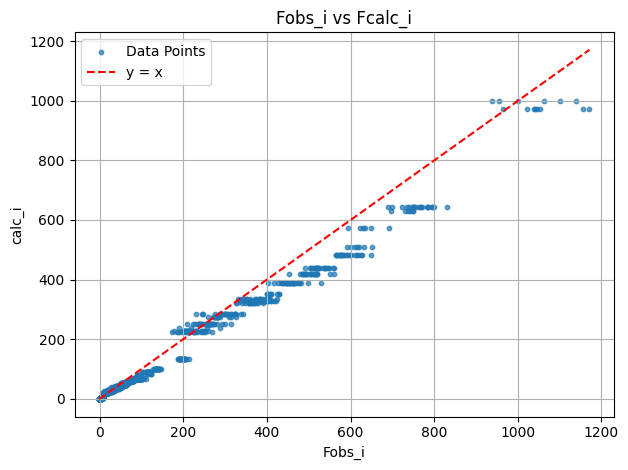

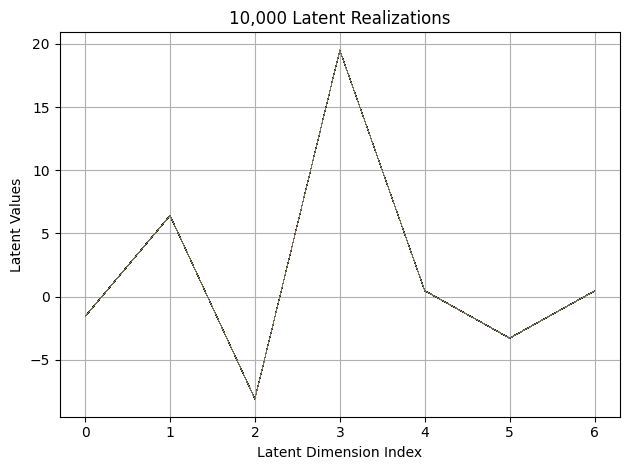

First 10 latent vectors from the VAE:
Sample 1: [-1.5689138174057007, 6.409371376037598, -8.089838027954102, 19.500141143798828, 0.4677847623825073, -3.282794237136841, 0.45221924781799316]
Sample 2: [-1.5673991441726685, 6.405177116394043, -8.083861351013184, 19.497970581054688, 0.4724036753177643, -3.2885332107543945, 0.451042503118515]
Sample 3: [-1.565409541130066, 6.401375770568848, -8.095932960510254, 19.49813461303711, 0.48920148611068726, -3.2813720703125, 0.4464624226093292]
Sample 4: [-1.5770342350006104, 6.407088756561279, -8.10828685760498, 19.491392135620117, 0.4804689288139343, -3.2825303077697754, 0.4401220679283142]
Sample 5: [-1.5790156126022339, 6.4067254066467285, -8.081705093383789, 19.493030548095703, 0.46745821833610535, -3.2840120792388916, 0.45166730880737305]
Sample 6: [-1.5715136528015137, 6.40854024887085, -8.104053497314453, 19.491439819335938, 0.47261500358581543, -3.282885789871216, 0.4345530569553375]
Sample 7: [-1.570841908454895, 6.414836883544922, -8.0

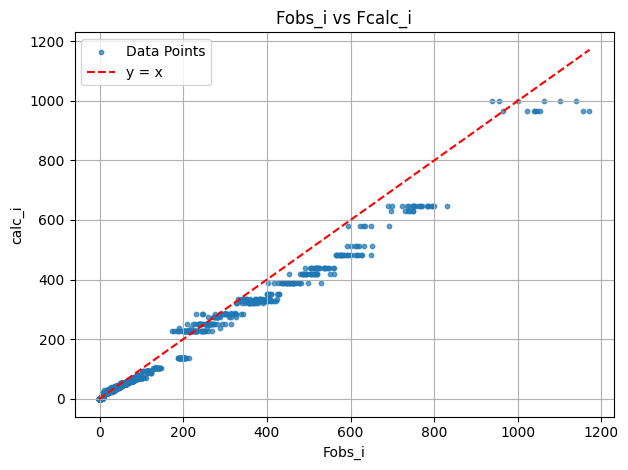

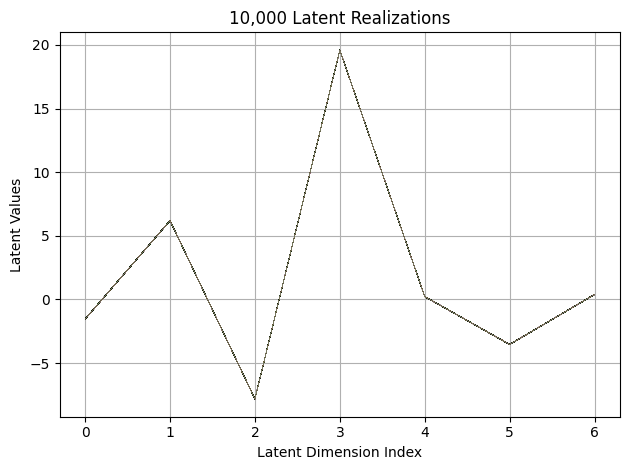

First 10 latent vectors from the VAE:
Sample 1: [-1.53876531124115, 6.184821605682373, -7.817681312561035, 19.580202102661133, 0.22668465971946716, -3.5495104789733887, 0.3762739598751068]
Sample 2: [-1.535793423652649, 6.186731338500977, -7.817863464355469, 19.59951400756836, 0.22572773694992065, -3.5409584045410156, 0.38694673776626587]
Sample 3: [-1.5404599905014038, 6.180218696594238, -7.819085597991943, 19.59053611755371, 0.22886408865451813, -3.543194532394409, 0.38363081216812134]
Sample 4: [-1.5355448722839355, 6.192662715911865, -7.825603008270264, 19.585411071777344, 0.20846837759017944, -3.537503242492676, 0.38903480768203735]
Sample 5: [-1.54734206199646, 6.183421611785889, -7.82816219329834, 19.5870361328125, 0.22486411035060883, -3.541069984436035, 0.3885074853897095]
Sample 6: [-1.5452733039855957, 6.1911420822143555, -7.819951057434082, 19.583724975585938, 0.20810389518737793, -3.540742874145508, 0.39393162727355957]
Sample 7: [-1.553670048713684, 6.190942287445068, -7.

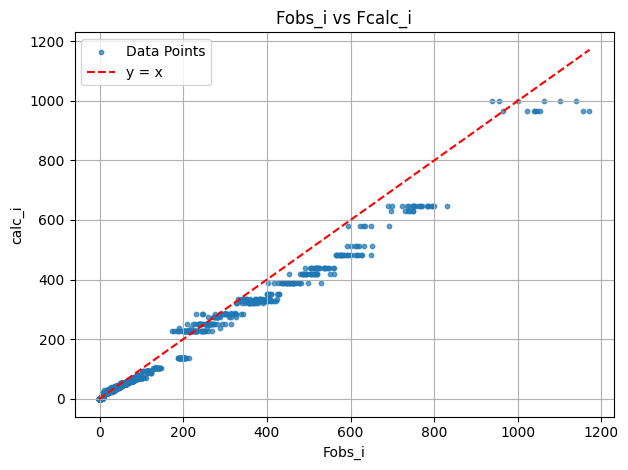

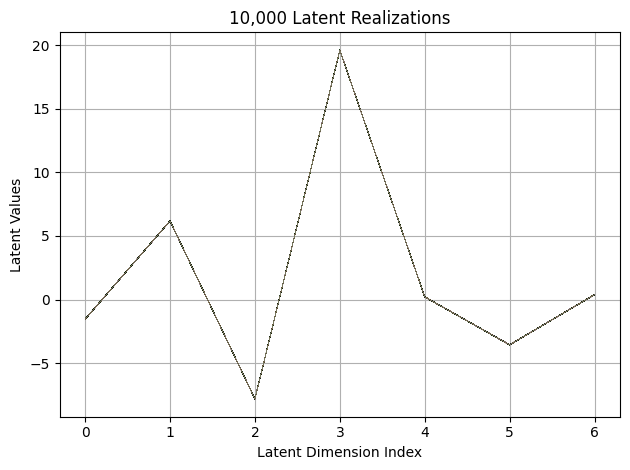

First 10 latent vectors from the VAE:
Sample 1: [-1.5321040153503418, 6.177271366119385, -7.822898864746094, 19.591787338256836, 0.20800922811031342, -3.5555286407470703, 0.38460373878479004]
Sample 2: [-1.5555689334869385, 6.175637245178223, -7.808786392211914, 19.59646987915039, 0.20541509985923767, -3.542098045349121, 0.38361379504203796]
Sample 3: [-1.5448944568634033, 6.182389259338379, -7.8033599853515625, 19.601734161376953, 0.207609623670578, -3.551800489425659, 0.3782963454723358]
Sample 4: [-1.5423064231872559, 6.18708610534668, -7.795490264892578, 19.604183197021484, 0.215068981051445, -3.549356698989868, 0.37100711464881897]
Sample 5: [-1.5487381219863892, 6.178045272827148, -7.79867696762085, 19.596904754638672, 0.2036796510219574, -3.551497459411621, 0.3898354172706604]
Sample 6: [-1.5414457321166992, 6.174492359161377, -7.806876182556152, 19.59758949279785, 0.21934877336025238, -3.557464838027954, 0.37979117035865784]
Sample 7: [-1.5605508089065552, 6.168907165527344, -7

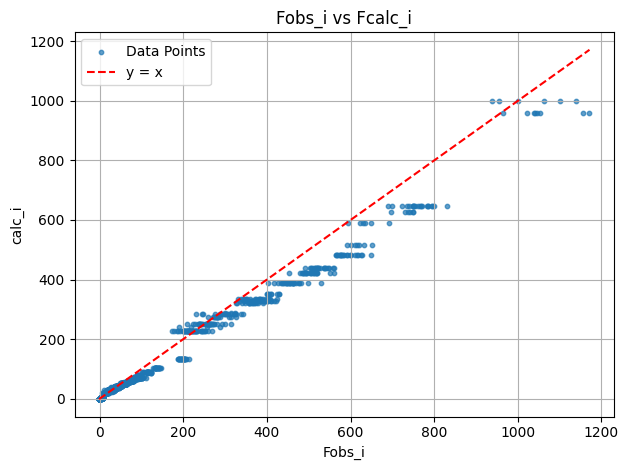

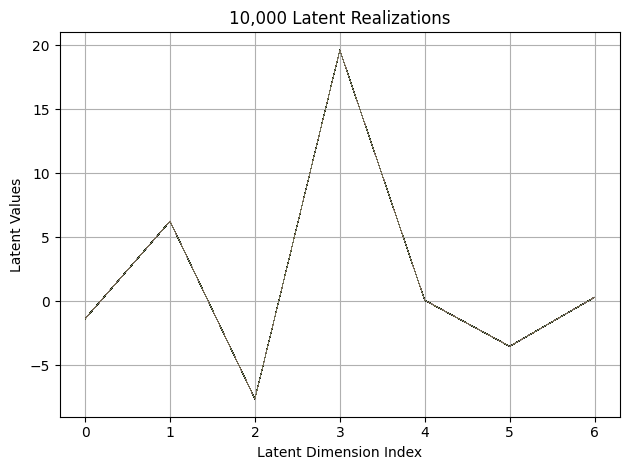

First 10 latent vectors from the VAE:
Sample 1: [-1.3792636394500732, 6.240087985992432, -7.6464524269104, 19.603498458862305, 0.07232675701379776, -3.5288145542144775, 0.29980313777923584]
Sample 2: [-1.36732816696167, 6.23861026763916, -7.63935661315918, 19.610628128051758, 0.06913233548402786, -3.5418992042541504, 0.30425354838371277]
Sample 3: [-1.3786836862564087, 6.241604328155518, -7.626983165740967, 19.6077823638916, 0.07395242154598236, -3.5353708267211914, 0.29519498348236084]
Sample 4: [-1.3688336610794067, 6.238363742828369, -7.63502836227417, 19.593076705932617, 0.06474234163761139, -3.527872085571289, 0.3015380799770355]
Sample 5: [-1.3798588514328003, 6.243651866912842, -7.631764888763428, 19.599245071411133, 0.05601756274700165, -3.5391712188720703, 0.30526623129844666]
Sample 6: [-1.3824783563613892, 6.2413482666015625, -7.632686614990234, 19.605283737182617, 0.06848913431167603, -3.5296919345855713, 0.2890457510948181]
Sample 7: [-1.3795229196548462, 6.238491535186768

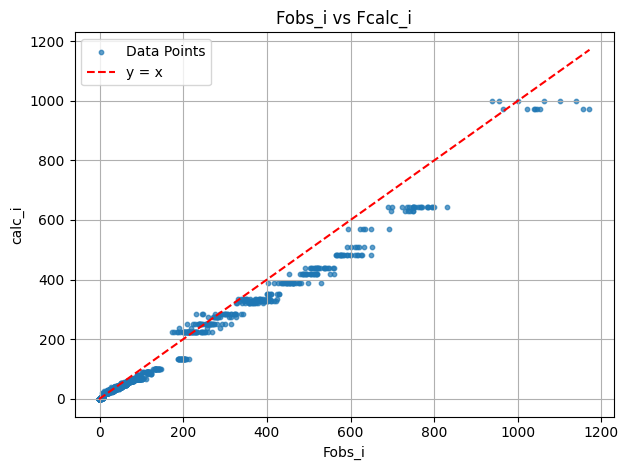

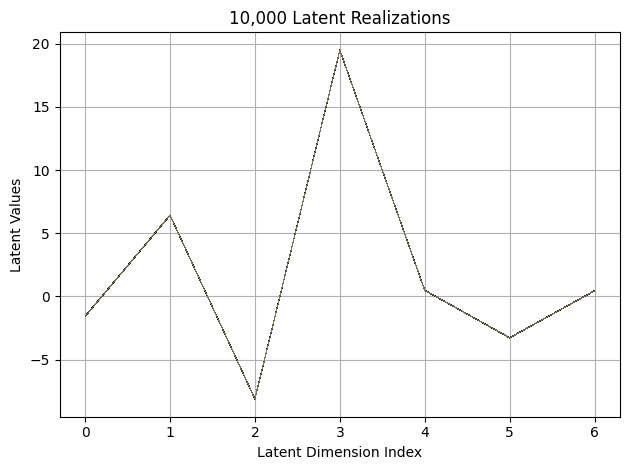

First 10 latent vectors from the VAE:
Sample 1: [-1.5682066679000854, 6.43405294418335, -8.10849380493164, 19.489927291870117, 0.48399847745895386, -3.2689454555511475, 0.4397582709789276]
Sample 2: [-1.560573935508728, 6.423481464385986, -8.10519027709961, 19.494352340698242, 0.48584336042404175, -3.2705328464508057, 0.44076621532440186]
Sample 3: [-1.5711551904678345, 6.4329023361206055, -8.10838508605957, 19.482084274291992, 0.4755539298057556, -3.2745468616485596, 0.44774875044822693]
Sample 4: [-1.5733506679534912, 6.428940773010254, -8.11309814453125, 19.491024017333984, 0.48133501410484314, -3.261105537414551, 0.4357018768787384]
Sample 5: [-1.5817537307739258, 6.429112434387207, -8.113564491271973, 19.486223220825195, 0.4902886152267456, -3.272979497909546, 0.44756028056144714]
Sample 6: [-1.5779565572738647, 6.437564849853516, -8.114468574523926, 19.50111198425293, 0.4851127862930298, -3.272132158279419, 0.4556034803390503]
Sample 7: [-1.5776447057724, 6.4278244972229, -8.1050

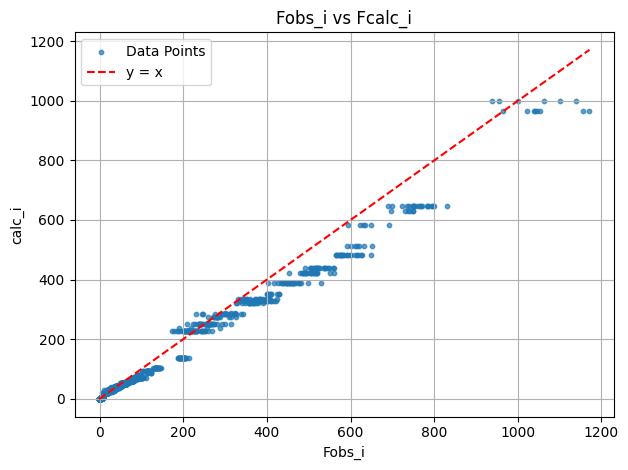

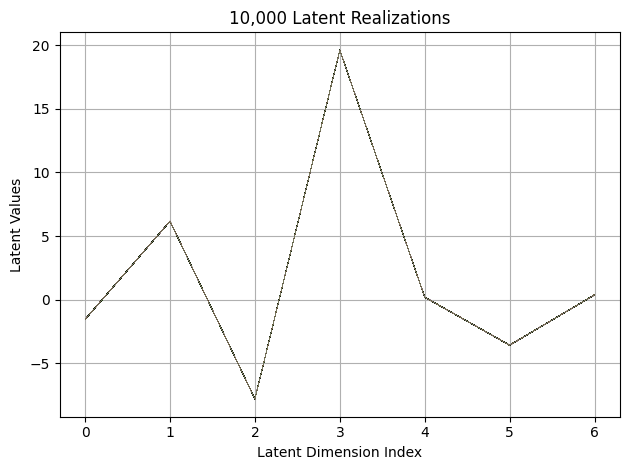

First 10 latent vectors from the VAE:
Sample 1: [-1.5375158786773682, 6.153988838195801, -7.786442279815674, 19.60992431640625, 0.1933118999004364, -3.5649569034576416, 0.3868720829486847]
Sample 2: [-1.5550167560577393, 6.174906253814697, -7.798272609710693, 19.60042381286621, 0.20452235639095306, -3.5781116485595703, 0.37753623723983765]
Sample 3: [-1.5472846031188965, 6.170190811157227, -7.792558193206787, 19.598098754882812, 0.20333416759967804, -3.572749376296997, 0.3683617413043976]
Sample 4: [-1.5289171934127808, 6.154438495635986, -7.811002731323242, 19.604883193969727, 0.1981153041124344, -3.5729243755340576, 0.3768913447856903]
Sample 5: [-1.5454057455062866, 6.162250995635986, -7.792477607727051, 19.600624084472656, 0.19886082410812378, -3.558349132537842, 0.380372017621994]
Sample 6: [-1.5322449207305908, 6.173542022705078, -7.794548988342285, 19.596776962280273, 0.19931529462337494, -3.568087100982666, 0.3772859573364258]
Sample 7: [-1.534674048423767, 6.163810729980469, -

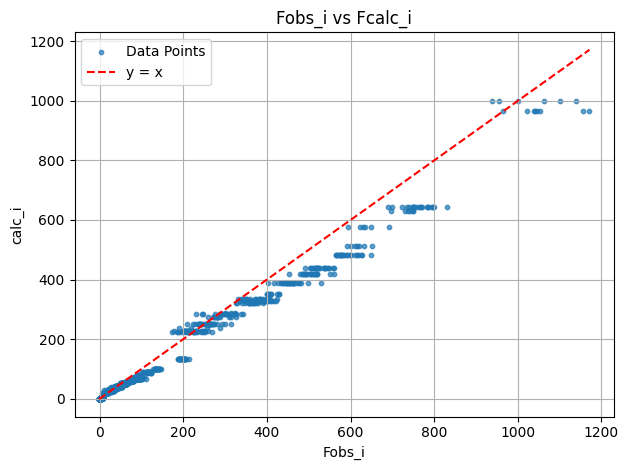

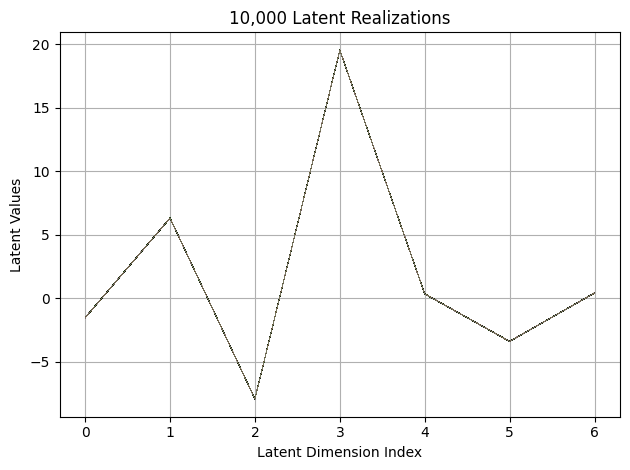

First 10 latent vectors from the VAE:
Sample 1: [-1.5545107126235962, 6.31456995010376, -7.9478535652160645, 19.54753875732422, 0.3337159752845764, -3.4153809547424316, 0.4207659661769867]
Sample 2: [-1.5312118530273438, 6.306334018707275, -7.942331790924072, 19.55768394470215, 0.344295471906662, -3.4084150791168213, 0.40672796964645386]
Sample 3: [-1.5400909185409546, 6.3063225746154785, -7.947381019592285, 19.544666290283203, 0.3279630243778229, -3.40558123588562, 0.41788941621780396]
Sample 4: [-1.533707618713379, 6.305069446563721, -7.953531265258789, 19.548871994018555, 0.3304651379585266, -3.4157185554504395, 0.41582340002059937]
Sample 5: [-1.5348480939865112, 6.299638271331787, -7.948676586151123, 19.554975509643555, 0.3356543779373169, -3.4075324535369873, 0.39670729637145996]
Sample 6: [-1.5476865768432617, 6.302530765533447, -7.936395645141602, 19.531034469604492, 0.3407207727432251, -3.405414342880249, 0.41457754373550415]
Sample 7: [-1.553693413734436, 6.3082451820373535, 

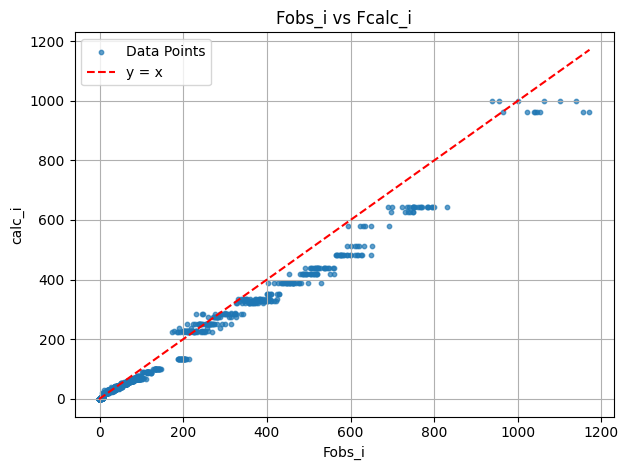

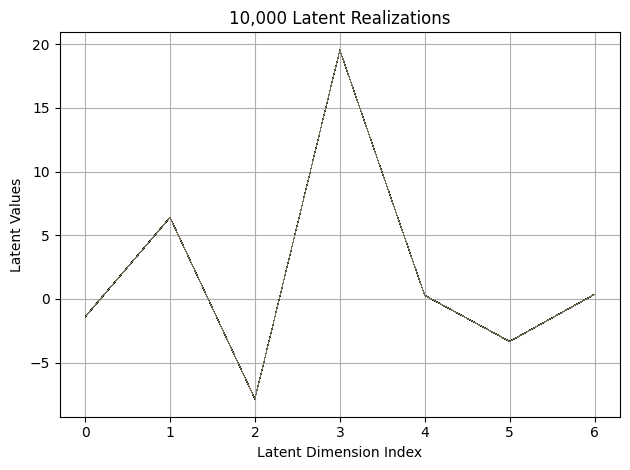

First 10 latent vectors from the VAE:
Sample 1: [-1.4231836795806885, 6.375302791595459, -7.858962535858154, 19.531818389892578, 0.269299179315567, -3.348360300064087, 0.3617638647556305]
Sample 2: [-1.424818992614746, 6.396913528442383, -7.860074043273926, 19.54383087158203, 0.2613042891025543, -3.34977650642395, 0.338672935962677]
Sample 3: [-1.4165962934494019, 6.401923179626465, -7.852643013000488, 19.53098487854004, 0.2589140236377716, -3.3392510414123535, 0.36434176564216614]
Sample 4: [-1.4258532524108887, 6.396687984466553, -7.867117881774902, 19.530866622924805, 0.2807087302207947, -3.345451831817627, 0.364936888217926]
Sample 5: [-1.4145030975341797, 6.396933555603027, -7.865177154541016, 19.538930892944336, 0.2669171392917633, -3.340463161468506, 0.3569561541080475]
Sample 6: [-1.4307231903076172, 6.397267818450928, -7.8608832359313965, 19.54730224609375, 0.2818213701248169, -3.3444087505340576, 0.36238133907318115]
Sample 7: [-1.4214401245117188, 6.4004387855529785, -7.8668

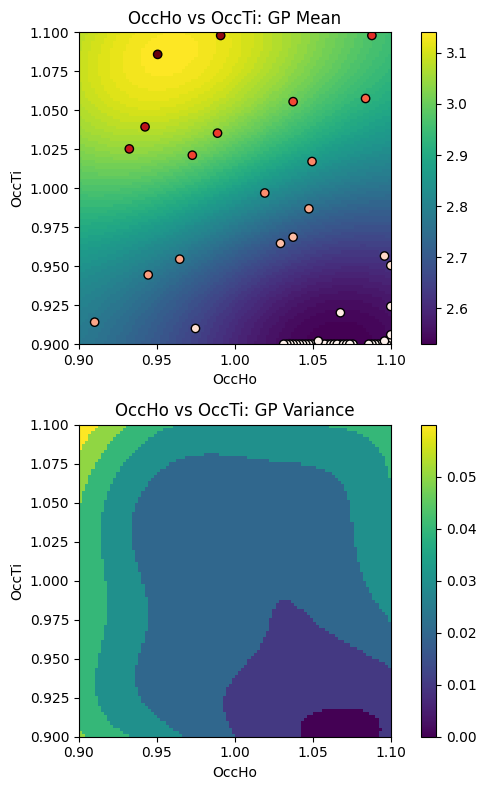

EI: [0.00518686 0.00511903 0.00505998 ... 0.0001335  0.00015517 0.00018026]
Function eval #60
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 1.0292929410934448]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4613
initial chi^2 1.3832e+06 with 2596 obs.
New scale: 0.4604
Cycle 0: 0.75s, Chi**2: 3.4997e+05 for 2596 obs., Lambda: 0,  Delta: 0.747, SVD=0
New scale: 0.4604
Maximum shift/esd = -210.697 for all cycles
Read from fil

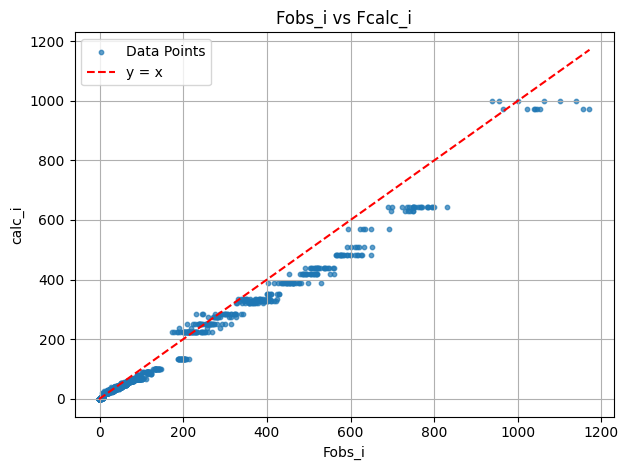

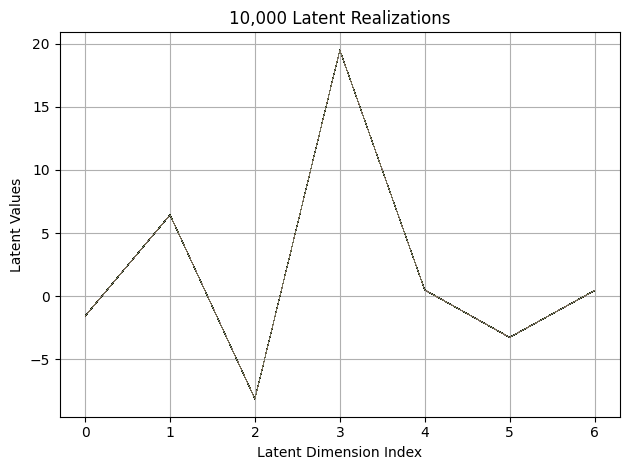

First 10 latent vectors from the VAE:
Sample 1: [-1.569544792175293, 6.437229156494141, -8.118622779846191, 19.483505249023438, 0.4977617561817169, -3.262162923812866, 0.4489902853965759]
Sample 2: [-1.5766801834106445, 6.4435930252075195, -8.133383750915527, 19.487323760986328, 0.49858060479164124, -3.2601778507232666, 0.44797268509864807]
Sample 3: [-1.577174186706543, 6.427945613861084, -8.111780166625977, 19.494861602783203, 0.5012826919555664, -3.255056381225586, 0.45439067482948303]
Sample 4: [-1.567478895187378, 6.437560558319092, -8.118032455444336, 19.47540855407715, 0.4848339557647705, -3.257530927658081, 0.45482340455055237]
Sample 5: [-1.5665338039398193, 6.43826961517334, -8.134689331054688, 19.489171981811523, 0.5036947727203369, -3.260115146636963, 0.4480613172054291]
Sample 6: [-1.571610450744629, 6.435467720031738, -8.124343872070312, 19.487300872802734, 0.4976649582386017, -3.248314380645752, 0.4457876980304718]
Sample 7: [-1.5623146295547485, 6.433107376098633, -8.11

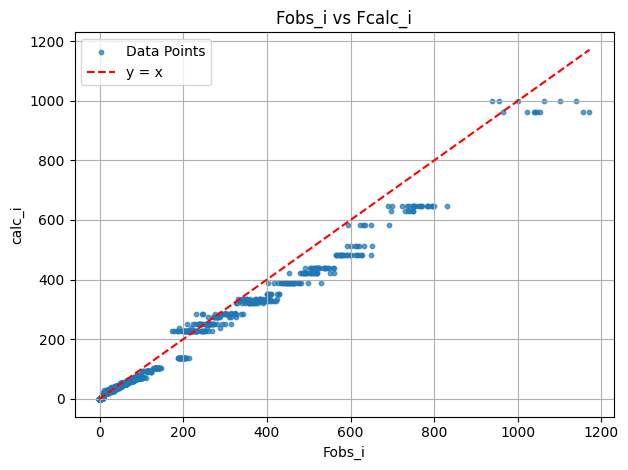

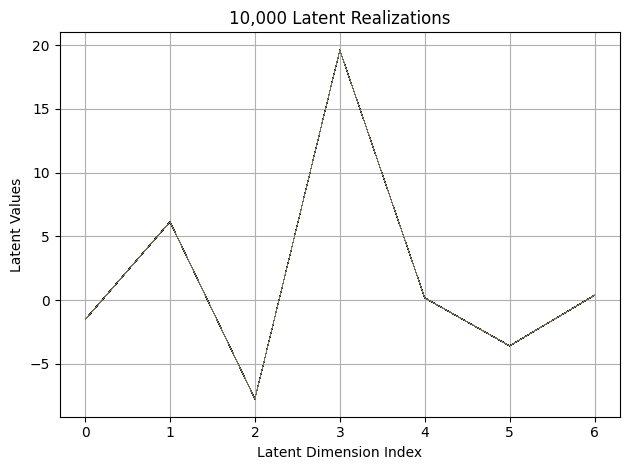

First 10 latent vectors from the VAE:
Sample 1: [-1.547318935394287, 6.143582820892334, -7.760822772979736, 19.622547149658203, 0.16495731472969055, -3.5949654579162598, 0.37850528955459595]
Sample 2: [-1.542744517326355, 6.138401508331299, -7.769158840179443, 19.607559204101562, 0.1635924130678177, -3.6035921573638916, 0.3795226812362671]
Sample 3: [-1.5459468364715576, 6.156588077545166, -7.755716800689697, 19.611148834228516, 0.16191723942756653, -3.5993902683258057, 0.37615591287612915]
Sample 4: [-1.5567549467086792, 6.146795749664307, -7.767131328582764, 19.62140655517578, 0.16686822474002838, -3.6044318675994873, 0.38293349742889404]
Sample 5: [-1.5483813285827637, 6.131127834320068, -7.772380352020264, 19.618040084838867, 0.1656273603439331, -3.593881130218506, 0.376323938369751]
Sample 6: [-1.5396994352340698, 6.129705905914307, -7.767135143280029, 19.615123748779297, 0.1770850419998169, -3.602238893508911, 0.3799855411052704]
Sample 7: [-1.5455434322357178, 6.129062175750732,

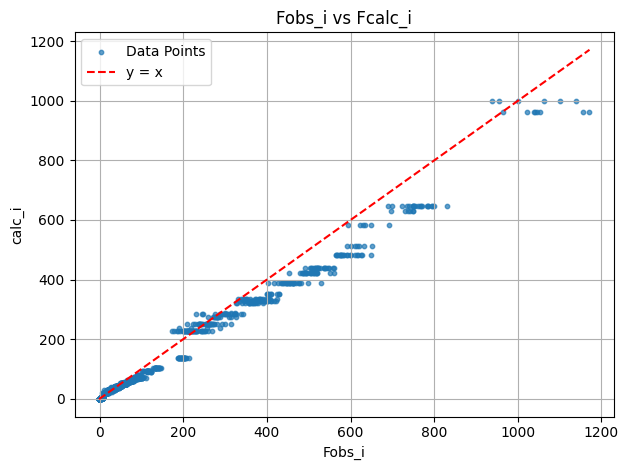

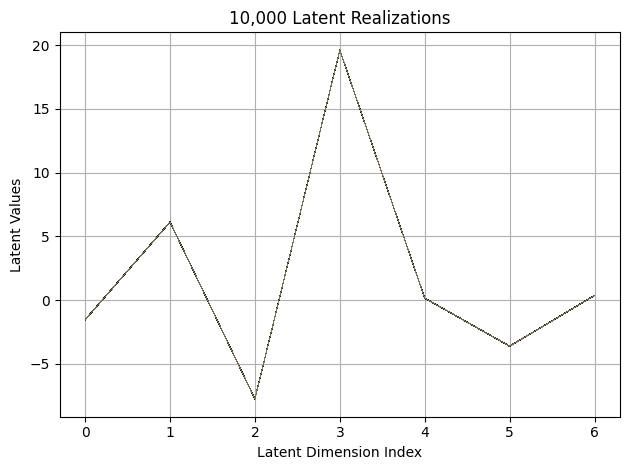

First 10 latent vectors from the VAE:
Sample 1: [-1.5361920595169067, 6.123216152191162, -7.738171577453613, 19.620450973510742, 0.16215090453624725, -3.6076126098632812, 0.3598862588405609]
Sample 2: [-1.5452229976654053, 6.133390426635742, -7.747329235076904, 19.620426177978516, 0.15463462471961975, -3.612560749053955, 0.3617938458919525]
Sample 3: [-1.5459017753601074, 6.118696212768555, -7.75076150894165, 19.624902725219727, 0.15489017963409424, -3.6026105880737305, 0.3852958381175995]
Sample 4: [-1.5408477783203125, 6.132762908935547, -7.746799945831299, 19.61355209350586, 0.15189813077449799, -3.6152737140655518, 0.3669918477535248]
Sample 5: [-1.5437626838684082, 6.136356353759766, -7.759537696838379, 19.627965927124023, 0.1604924201965332, -3.6004064083099365, 0.36530640721321106]
Sample 6: [-1.5373564958572388, 6.118096351623535, -7.7435832023620605, 19.61594581604004, 0.15298017859458923, -3.603548288345337, 0.365628182888031]
Sample 7: [-1.5392816066741943, 6.126340389251709

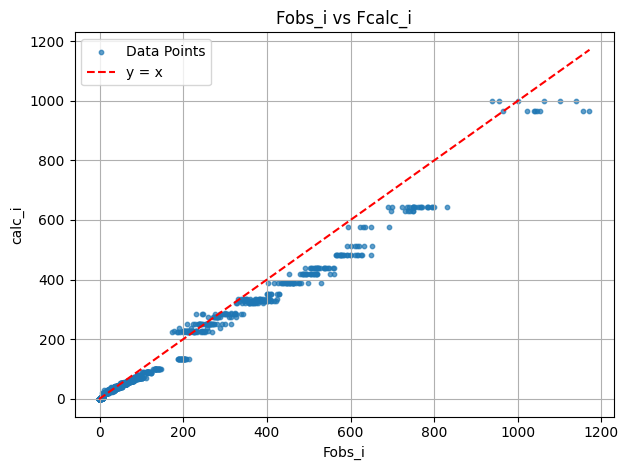

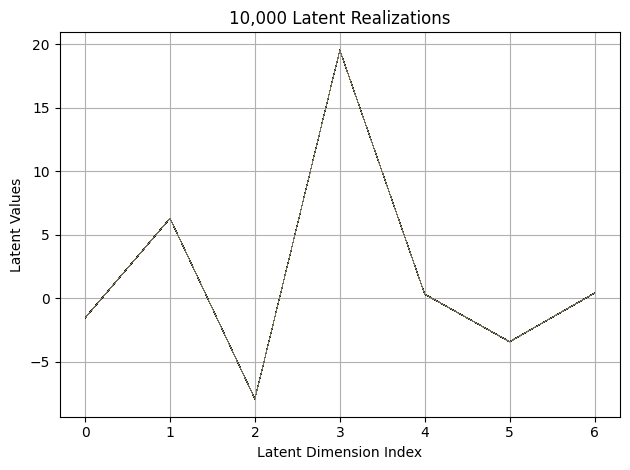

First 10 latent vectors from the VAE:
Sample 1: [-1.5398093461990356, 6.295211315155029, -7.929450988769531, 19.556482315063477, 0.3169853687286377, -3.4187047481536865, 0.40401628613471985]
Sample 2: [-1.5401760339736938, 6.295883655548096, -7.926292419433594, 19.54594612121582, 0.3218103051185608, -3.4401183128356934, 0.40811583399772644]
Sample 3: [-1.543117880821228, 6.294506072998047, -7.933557033538818, 19.561059951782227, 0.320381224155426, -3.427286148071289, 0.4010591208934784]
Sample 4: [-1.5427751541137695, 6.296082496643066, -7.942009449005127, 19.546072006225586, 0.3262082040309906, -3.433426856994629, 0.39519134163856506]
Sample 5: [-1.5528090000152588, 6.286013603210449, -7.923300266265869, 19.557231903076172, 0.3234933912754059, -3.4244070053100586, 0.4038945734500885]
Sample 6: [-1.5430659055709839, 6.295837879180908, -7.9360456466674805, 19.55862808227539, 0.3225612938404083, -3.425884962081909, 0.401201456785202]
Sample 7: [-1.5437695980072021, 6.2978620529174805, -7

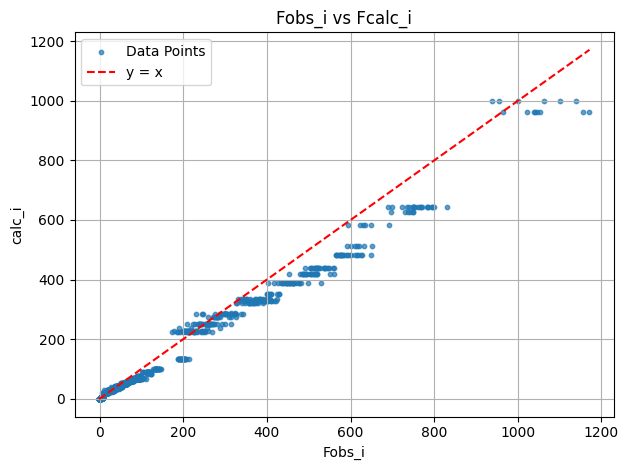

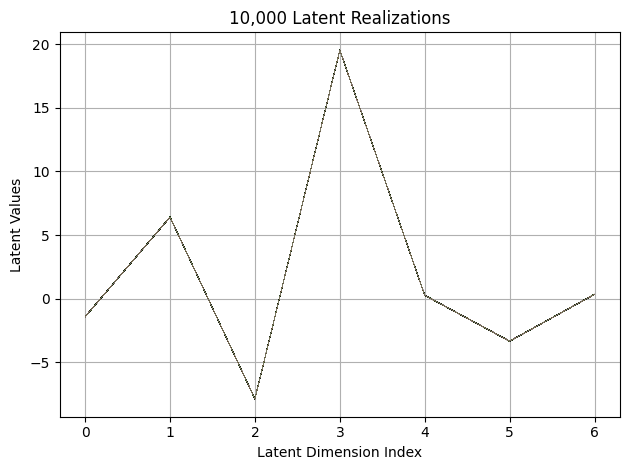

First 10 latent vectors from the VAE:
Sample 1: [-1.4091929197311401, 6.407505512237549, -7.865902423858643, 19.53352165222168, 0.27603068947792053, -3.3287816047668457, 0.3558748960494995]
Sample 2: [-1.4030097723007202, 6.4181013107299805, -7.864898681640625, 19.534109115600586, 0.2650218605995178, -3.332961082458496, 0.3535405099391937]
Sample 3: [-1.400448203086853, 6.409436225891113, -7.870992183685303, 19.527912139892578, 0.2731320858001709, -3.319334030151367, 0.35876715183258057]
Sample 4: [-1.4153779745101929, 6.414676189422607, -7.857265472412109, 19.52840805053711, 0.2722621262073517, -3.3263132572174072, 0.34724223613739014]
Sample 5: [-1.420316219329834, 6.432983875274658, -7.858548641204834, 19.52842140197754, 0.27723589539527893, -3.329352617263794, 0.3521502912044525]
Sample 6: [-1.4116382598876953, 6.422904968261719, -7.874295234680176, 19.523717880249023, 0.28066810965538025, -3.3290047645568848, 0.3511495590209961]
Sample 7: [-1.4060271978378296, 6.421497821807861, -

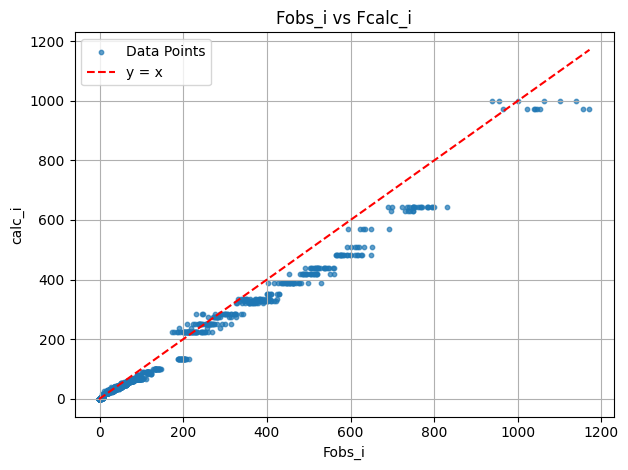

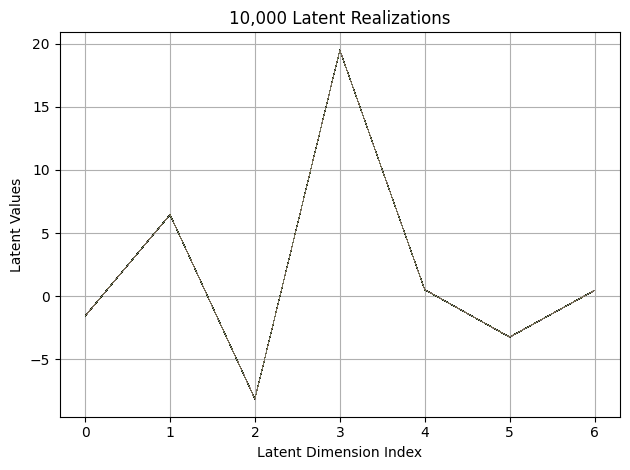

First 10 latent vectors from the VAE:
Sample 1: [-1.5784947872161865, 6.450524806976318, -8.128942489624023, 19.47410774230957, 0.5156060457229614, -3.2340917587280273, 0.45427390933036804]
Sample 2: [-1.5814164876937866, 6.451754093170166, -8.140929222106934, 19.495725631713867, 0.5203611850738525, -3.2453975677490234, 0.4570935070514679]
Sample 3: [-1.5882288217544556, 6.446287631988525, -8.131659507751465, 19.47722053527832, 0.5066801905632019, -3.243563175201416, 0.457379013299942]
Sample 4: [-1.582107663154602, 6.447355270385742, -8.155285835266113, 19.477367401123047, 0.5100997686386108, -3.2401180267333984, 0.4587390720844269]
Sample 5: [-1.5747947692871094, 6.450977325439453, -8.126388549804688, 19.48222541809082, 0.5150085687637329, -3.234072685241699, 0.4594774842262268]
Sample 6: [-1.5806946754455566, 6.453982830047607, -8.140898704528809, 19.49390983581543, 0.5166786313056946, -3.235605478286743, 0.45874714851379395]
Sample 7: [-1.5810033082962036, 6.455836772918701, -8.145

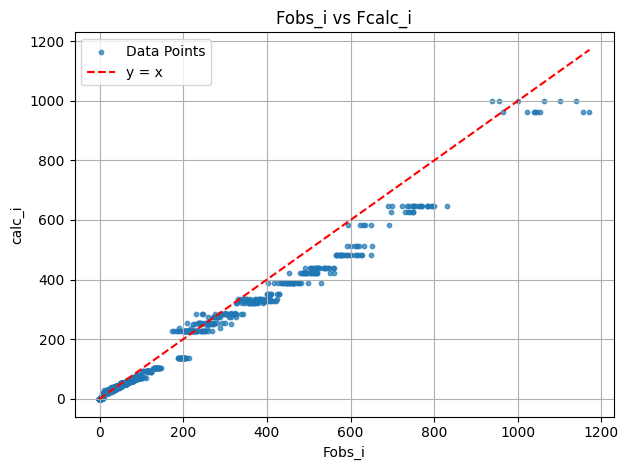

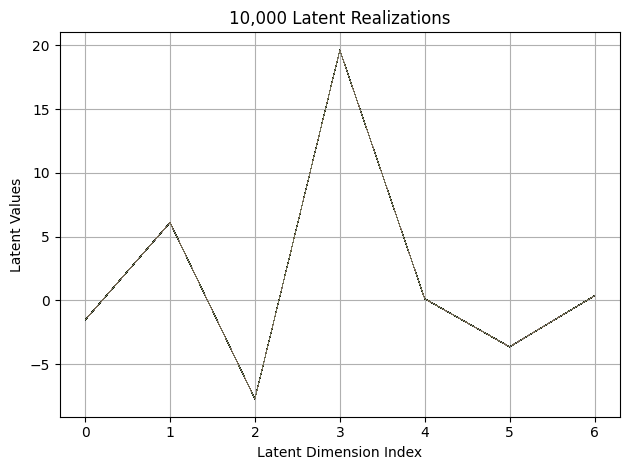

First 10 latent vectors from the VAE:
Sample 1: [-1.5395231246948242, 6.100396633148193, -7.725492477416992, 19.61791229248047, 0.1253085434436798, -3.640089988708496, 0.36117109656333923]
Sample 2: [-1.5351605415344238, 6.110487937927246, -7.728654384613037, 19.639310836791992, 0.12819050252437592, -3.638044595718384, 0.3651667833328247]
Sample 3: [-1.5284138917922974, 6.105543613433838, -7.721569538116455, 19.636301040649414, 0.11205168068408966, -3.6282312870025635, 0.36565154790878296]
Sample 4: [-1.5449928045272827, 6.100911617279053, -7.716700553894043, 19.628332138061523, 0.12767496705055237, -3.6413559913635254, 0.368289053440094]
Sample 5: [-1.531117558479309, 6.0954790115356445, -7.715141773223877, 19.61884880065918, 0.13397306203842163, -3.6387853622436523, 0.3705905079841614]
Sample 6: [-1.526957392692566, 6.105421543121338, -7.713770866394043, 19.633201599121094, 0.11885383725166321, -3.646196126937866, 0.3701031506061554]
Sample 7: [-1.5379773378372192, 6.104789733886719,

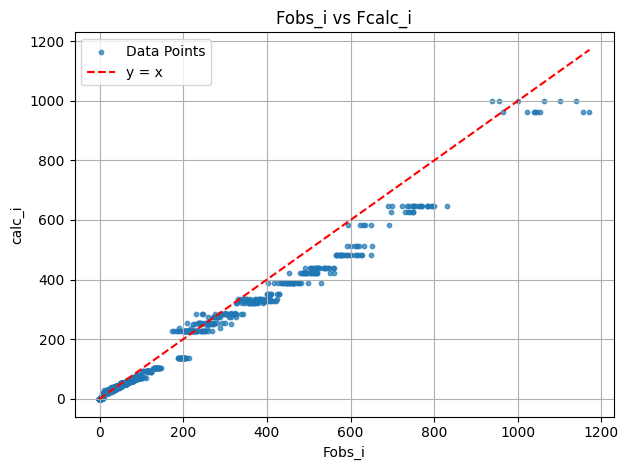

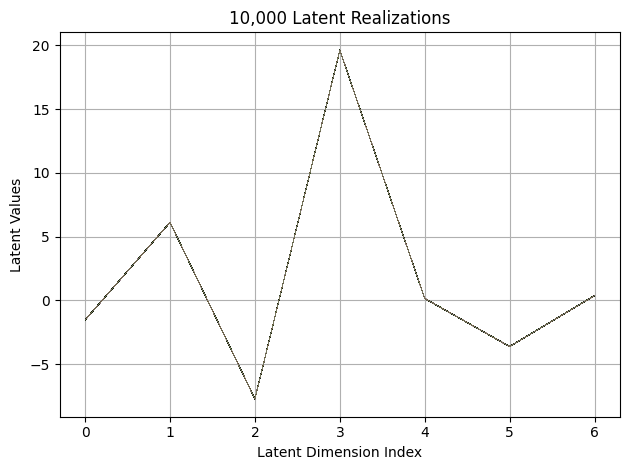

First 10 latent vectors from the VAE:
Sample 1: [-1.5392305850982666, 6.118183135986328, -7.725468158721924, 19.620563507080078, 0.14676575362682343, -3.6340880393981934, 0.3611384630203247]
Sample 2: [-1.5384708642959595, 6.112763404846191, -7.736433029174805, 19.62146759033203, 0.1261429637670517, -3.62380313873291, 0.37174686789512634]
Sample 3: [-1.5317717790603638, 6.1086907386779785, -7.726632595062256, 19.62403106689453, 0.143815279006958, -3.6135499477386475, 0.3626880645751953]
Sample 4: [-1.5326685905456543, 6.109738349914551, -7.736289024353027, 19.613012313842773, 0.13972026109695435, -3.626472234725952, 0.3582060933113098]
Sample 5: [-1.5329524278640747, 6.120871067047119, -7.728996753692627, 19.62288475036621, 0.1481192708015442, -3.6285457611083984, 0.37026548385620117]
Sample 6: [-1.539017915725708, 6.126121997833252, -7.747504711151123, 19.61524200439453, 0.14670437574386597, -3.6131575107574463, 0.3610813021659851]
Sample 7: [-1.5334738492965698, 6.102113723754883, -7

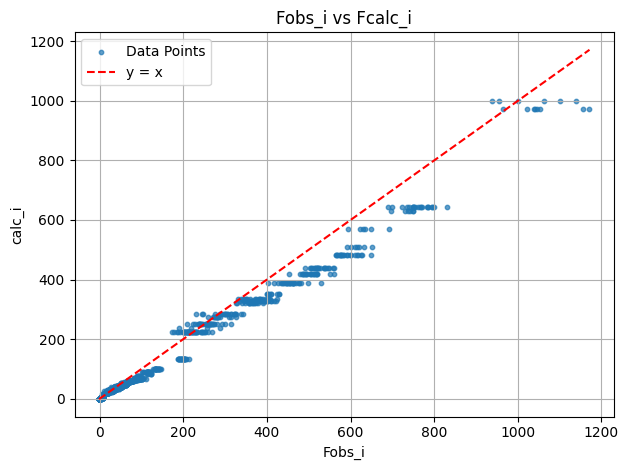

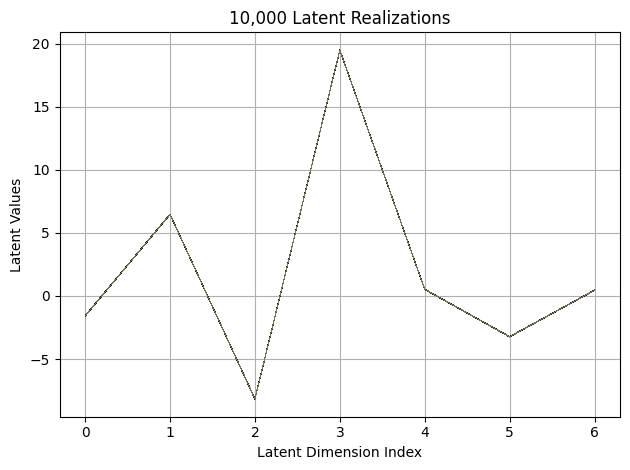

First 10 latent vectors from the VAE:
Sample 1: [-1.5827677249908447, 6.461957931518555, -8.161995887756348, 19.4794864654541, 0.5328808426856995, -3.2150461673736572, 0.4571656882762909]
Sample 2: [-1.5670667886734009, 6.476269245147705, -8.160338401794434, 19.474559783935547, 0.5267212986946106, -3.2192583084106445, 0.44497039914131165]
Sample 3: [-1.575852394104004, 6.476512432098389, -8.146934509277344, 19.473873138427734, 0.5077589154243469, -3.2440872192382812, 0.45276790857315063]
Sample 4: [-1.578800082206726, 6.450058460235596, -8.157360076904297, 19.471633911132812, 0.5347565412521362, -3.221222400665283, 0.45440298318862915]
Sample 5: [-1.5780569314956665, 6.455911159515381, -8.145759582519531, 19.478792190551758, 0.5304501056671143, -3.2243432998657227, 0.46082568168640137]
Sample 6: [-1.5714263916015625, 6.47361946105957, -8.16388988494873, 19.47746467590332, 0.5378091931343079, -3.2442171573638916, 0.4532850384712219]
Sample 7: [-1.5858052968978882, 6.463099956512451, -8.

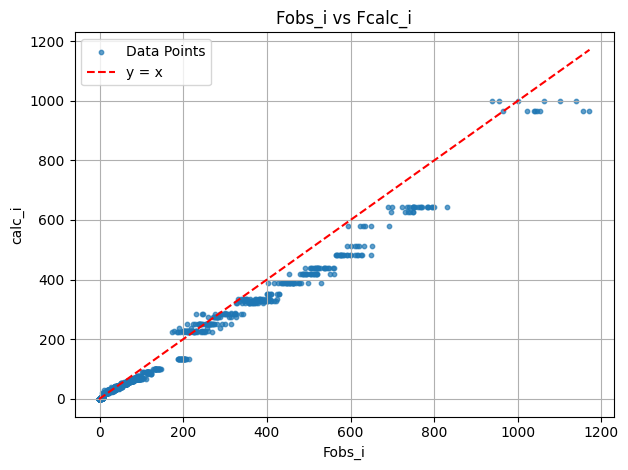

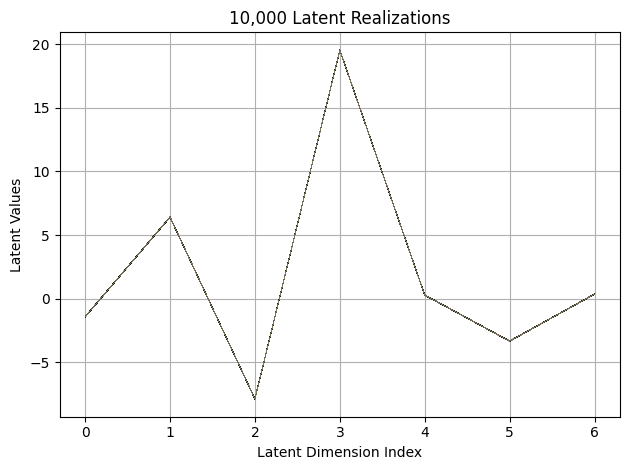

First 10 latent vectors from the VAE:
Sample 1: [-1.423103928565979, 6.402920246124268, -7.874227046966553, 19.52507781982422, 0.29269546270370483, -3.337430238723755, 0.3429076373577118]
Sample 2: [-1.4223179817199707, 6.407731056213379, -7.878913879394531, 19.540813446044922, 0.293483167886734, -3.3357510566711426, 0.35525819659233093]
Sample 3: [-1.4214752912521362, 6.411631107330322, -7.865277290344238, 19.527057647705078, 0.28248685598373413, -3.3212404251098633, 0.3555727005004883]
Sample 4: [-1.4224449396133423, 6.404308795928955, -7.870651721954346, 19.52556610107422, 0.28602591156959534, -3.32314133644104, 0.354890376329422]
Sample 5: [-1.4325381517410278, 6.415653705596924, -7.865975856781006, 19.533905029296875, 0.2858431935310364, -3.336348533630371, 0.3685045838356018]
Sample 6: [-1.4239507913589478, 6.410318851470947, -7.872137546539307, 19.536285400390625, 0.3013918101787567, -3.3378405570983887, 0.3564053475856781]
Sample 7: [-1.4131882190704346, 6.420444965362549, -7.8

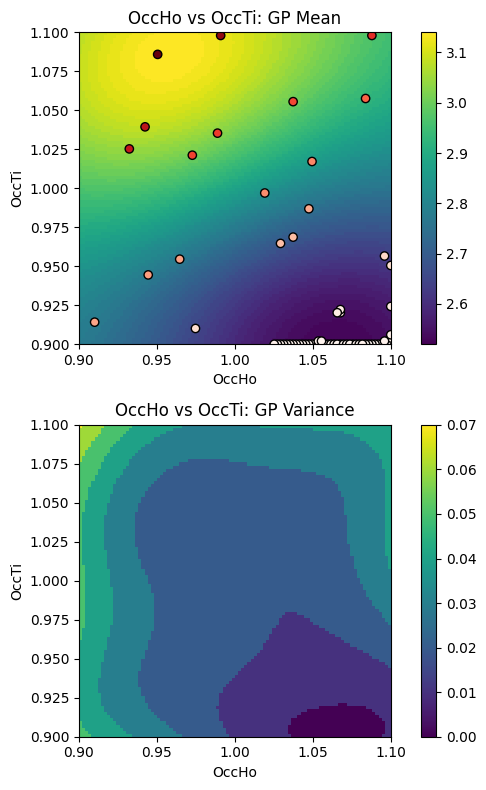

EI: [0.00577047 0.00568819 0.0056156  ... 0.00016356 0.00018974 0.00022005]
Function eval #70
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9020201563835144, 1.0575758218765259]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4382
initial chi^2 1.6966e+06 with 2596 obs.
New scale: 0.4374
Cycle 0: 0.73s, Chi**2: 3.7884e+05 for 2596 obs., Lambda: 0,  Delta: 0.777, SVD=0
New scale: 0.4374
Maximum shift/esd = -234.741 for all cycles
Read from fil

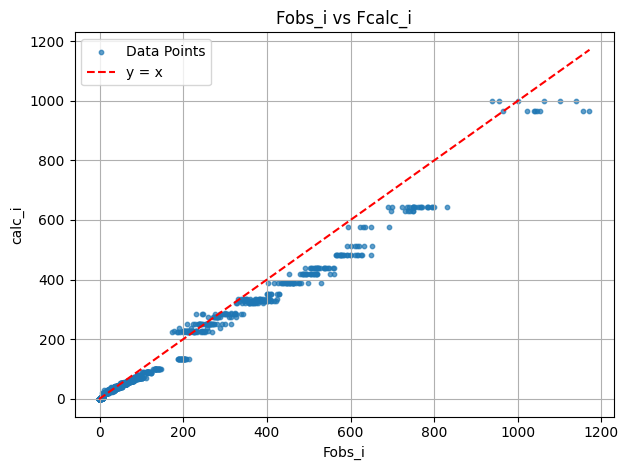

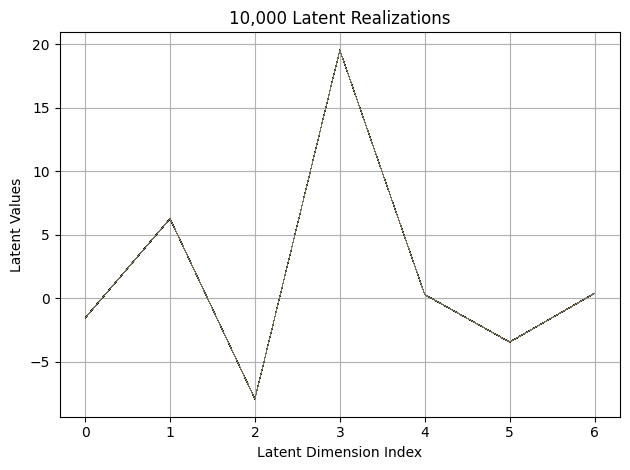

First 10 latent vectors from the VAE:
Sample 1: [-1.5338727235794067, 6.275743007659912, -7.921679973602295, 19.54521369934082, 0.29681962728500366, -3.438183307647705, 0.40139296650886536]
Sample 2: [-1.5502502918243408, 6.2790985107421875, -7.923370361328125, 19.55840492248535, 0.3060268759727478, -3.4275617599487305, 0.4161932170391083]
Sample 3: [-1.5520211458206177, 6.286715030670166, -7.91572380065918, 19.55140495300293, 0.30378541350364685, -3.439664840698242, 0.4053719937801361]
Sample 4: [-1.545580267906189, 6.27177095413208, -7.9102373123168945, 19.55841064453125, 0.3162879943847656, -3.441477060317993, 0.40367183089256287]
Sample 5: [-1.5469555854797363, 6.284605503082275, -7.920583248138428, 19.55494499206543, 0.30112701654434204, -3.438058614730835, 0.40810561180114746]
Sample 6: [-1.5529234409332275, 6.284909725189209, -7.9096550941467285, 19.55701446533203, 0.3066313564777374, -3.441561698913574, 0.4037029445171356]
Sample 7: [-1.550340175628662, 6.283783912658691, -7.92

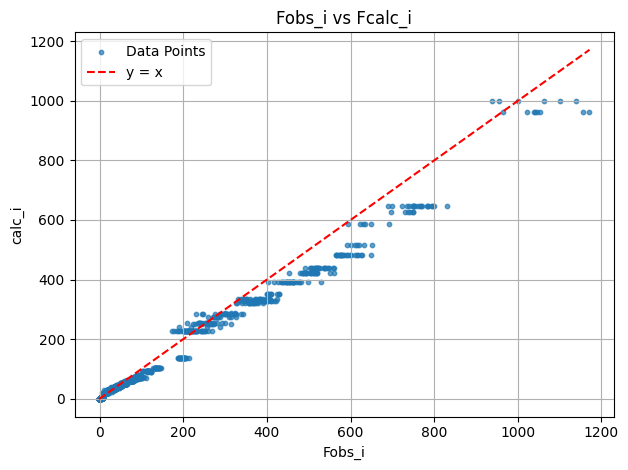

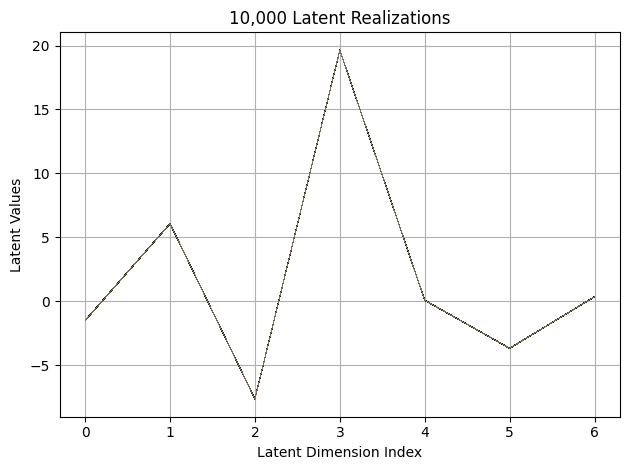

First 10 latent vectors from the VAE:
Sample 1: [-1.521042823791504, 6.061312198638916, -7.651612758636475, 19.65774154663086, 0.064084492623806, -3.695500612258911, 0.34004124999046326]
Sample 2: [-1.521053433418274, 6.061537742614746, -7.635673999786377, 19.648696899414062, 0.05862560123205185, -3.685009717941284, 0.33719611167907715]
Sample 3: [-1.51808500289917, 6.081127643585205, -7.652919292449951, 19.646530151367188, 0.053077057003974915, -3.6968281269073486, 0.35206717252731323]
Sample 4: [-1.525510549545288, 6.062245845794678, -7.642387390136719, 19.634090423583984, 0.06143712252378464, -3.699928045272827, 0.3436328172683716]
Sample 5: [-1.5188088417053223, 6.070910453796387, -7.658659934997559, 19.64016342163086, 0.06468316167593002, -3.6861298084259033, 0.34105831384658813]
Sample 6: [-1.5117602348327637, 6.059762954711914, -7.64259147644043, 19.64030647277832, 0.06894579529762268, -3.67785906791687, 0.33823561668395996]
Sample 7: [-1.5124038457870483, 6.059384346008301, -7.

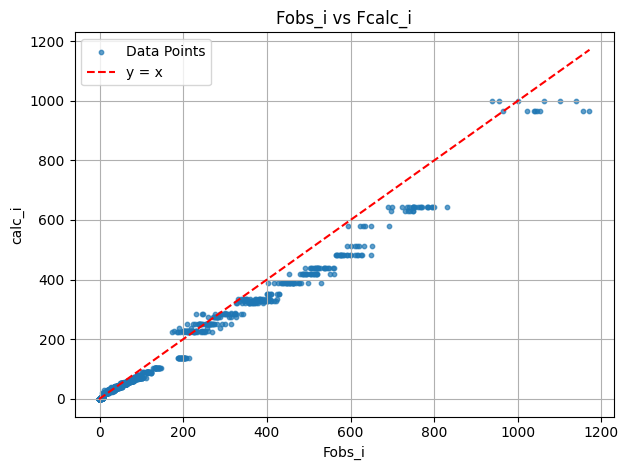

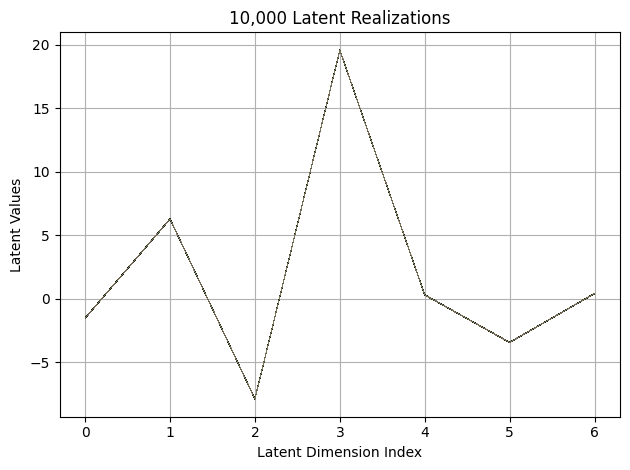

First 10 latent vectors from the VAE:
Sample 1: [-1.537827730178833, 6.278318881988525, -7.895548343658447, 19.567102432250977, 0.29784828424453735, -3.455538034439087, 0.3894403576850891]
Sample 2: [-1.540574073791504, 6.266921520233154, -7.900331497192383, 19.55953598022461, 0.30189910531044006, -3.4581995010375977, 0.39659374952316284]
Sample 3: [-1.5443629026412964, 6.267873764038086, -7.897645950317383, 19.559186935424805, 0.2937259078025818, -3.4578022956848145, 0.3845970034599304]
Sample 4: [-1.5371187925338745, 6.267143249511719, -7.901347637176514, 19.56378746032715, 0.2920743227005005, -3.4511027336120605, 0.3907719552516937]
Sample 5: [-1.5441697835922241, 6.281980037689209, -7.90034818649292, 19.54491424560547, 0.29778337478637695, -3.4425346851348877, 0.40479791164398193]
Sample 6: [-1.5354007482528687, 6.268812656402588, -7.891070365905762, 19.549501419067383, 0.29329684376716614, -3.454880952835083, 0.3839080333709717]
Sample 7: [-1.5319411754608154, 6.27146053314209, -7

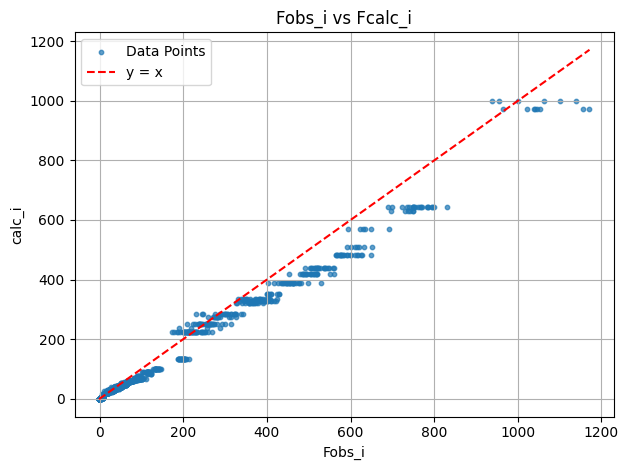

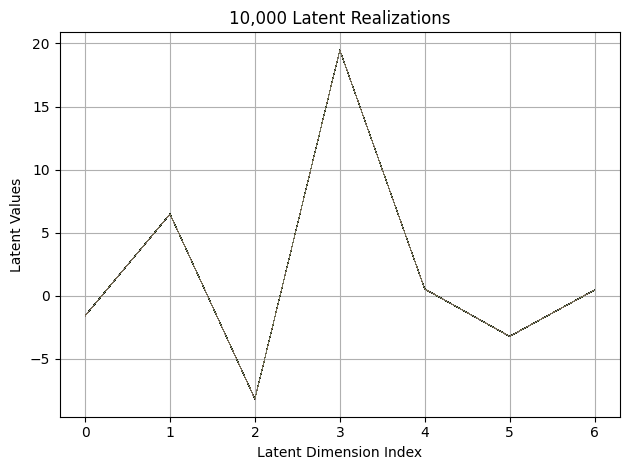

First 10 latent vectors from the VAE:
Sample 1: [-1.5735900402069092, 6.4822492599487305, -8.166186332702637, 19.475996017456055, 0.5440673232078552, -3.217073678970337, 0.46992766857147217]
Sample 2: [-1.5781946182250977, 6.480923175811768, -8.173223495483398, 19.463537216186523, 0.5491263270378113, -3.217714786529541, 0.45544537901878357]
Sample 3: [-1.5763543844223022, 6.485690593719482, -8.170536994934082, 19.47559928894043, 0.5380268692970276, -3.2223939895629883, 0.45462214946746826]
Sample 4: [-1.5801029205322266, 6.468653678894043, -8.168118476867676, 19.469501495361328, 0.5491645932197571, -3.2251148223876953, 0.4591479003429413]
Sample 5: [-1.588678240776062, 6.478477954864502, -8.173542022705078, 19.461198806762695, 0.5434404611587524, -3.219247341156006, 0.47535184025764465]
Sample 6: [-1.5763144493103027, 6.474882125854492, -8.1659517288208, 19.463844299316406, 0.5490630269050598, -3.22122859954834, 0.4726794958114624]
Sample 7: [-1.5755480527877808, 6.471188068389893, -8.

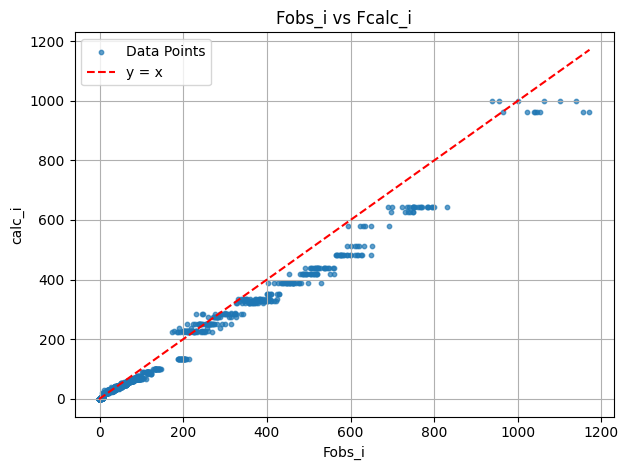

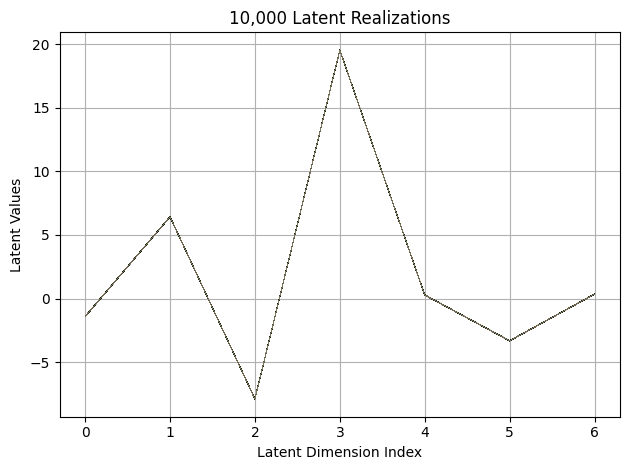

First 10 latent vectors from the VAE:
Sample 1: [-1.4179173707962036, 6.428001403808594, -7.878669261932373, 19.51972770690918, 0.29786011576652527, -3.3123116493225098, 0.35443681478500366]
Sample 2: [-1.4117813110351562, 6.4181718826293945, -7.878461837768555, 19.521081924438477, 0.29449430108070374, -3.322528839111328, 0.3573172092437744]
Sample 3: [-1.4012068510055542, 6.4313740730285645, -7.872712135314941, 19.519102096557617, 0.29245004057884216, -3.3125157356262207, 0.3659476935863495]
Sample 4: [-1.404176115989685, 6.427955627441406, -7.876158714294434, 19.523469924926758, 0.28748270869255066, -3.3200876712799072, 0.3427538275718689]
Sample 5: [-1.403841495513916, 6.428600311279297, -7.873353958129883, 19.51190948486328, 0.2903216779232025, -3.306372880935669, 0.34120112657546997]
Sample 6: [-1.4246711730957031, 6.424659729003906, -7.88410758972168, 19.529794692993164, 0.2914908230304718, -3.3147976398468018, 0.36274194717407227]
Sample 7: [-1.407275915145874, 6.425012111663818

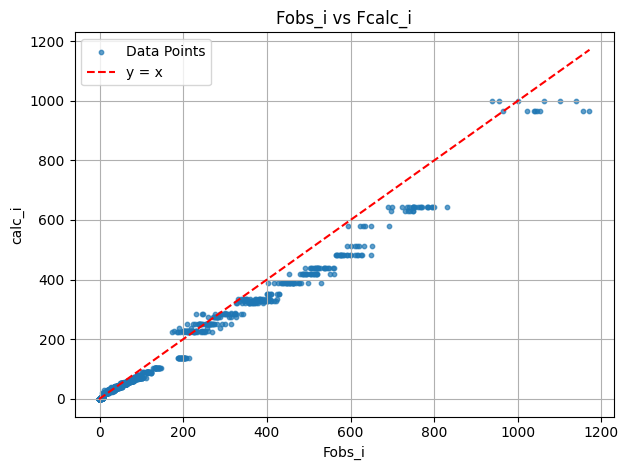

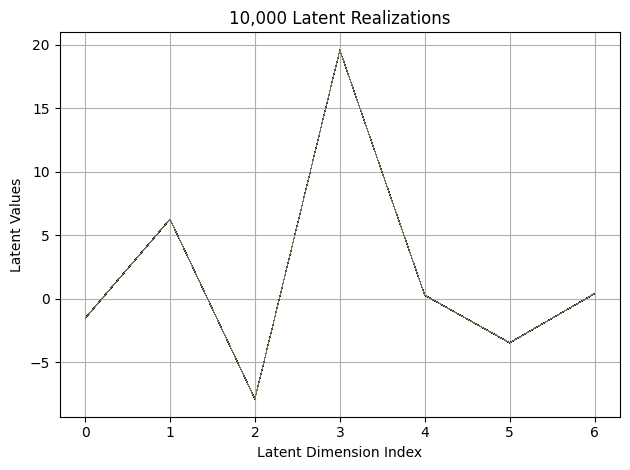

First 10 latent vectors from the VAE:
Sample 1: [-1.5555356740951538, 6.263702869415283, -7.890272617340088, 19.562490463256836, 0.28652045130729675, -3.458920955657959, 0.39653724431991577]
Sample 2: [-1.5270320177078247, 6.249123573303223, -7.8857855796813965, 19.56606674194336, 0.2696158289909363, -3.475987672805786, 0.39608877897262573]
Sample 3: [-1.5379568338394165, 6.234873294830322, -7.878147602081299, 19.559425354003906, 0.29075413942337036, -3.461932420730591, 0.3925134539604187]
Sample 4: [-1.5359019041061401, 6.256695747375488, -7.8736491203308105, 19.567941665649414, 0.2802039384841919, -3.465924024581909, 0.4028491973876953]
Sample 5: [-1.5481798648834229, 6.250444412231445, -7.881945610046387, 19.566734313964844, 0.28656065464019775, -3.464883327484131, 0.3933253586292267]
Sample 6: [-1.532494306564331, 6.256724834442139, -7.880060195922852, 19.5685977935791, 0.2722422182559967, -3.474130153656006, 0.38877397775650024]
Sample 7: [-1.540446162223816, 6.258116245269775, -7

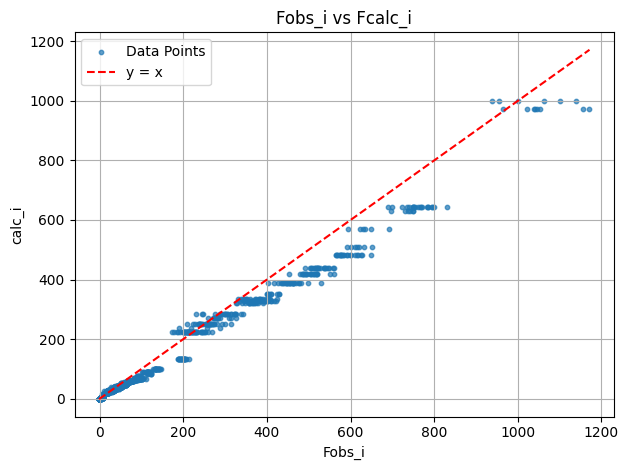

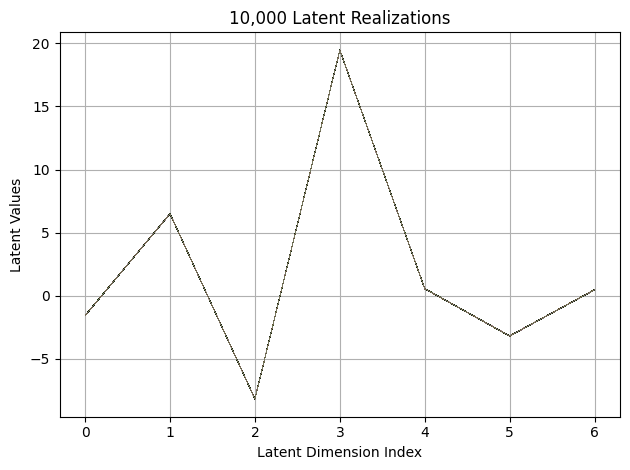

First 10 latent vectors from the VAE:
Sample 1: [-1.5810084342956543, 6.486042499542236, -8.175743103027344, 19.464599609375, 0.5632486939430237, -3.2011728286743164, 0.45996010303497314]
Sample 2: [-1.5862163305282593, 6.4800615310668945, -8.175454139709473, 19.45825958251953, 0.5598593354225159, -3.200958251953125, 0.4651295244693756]
Sample 3: [-1.5943776369094849, 6.487809658050537, -8.173863410949707, 19.469379425048828, 0.5567445755004883, -3.203117609024048, 0.4772808849811554]
Sample 4: [-1.5789836645126343, 6.493507385253906, -8.183913230895996, 19.469953536987305, 0.5565773844718933, -3.2053117752075195, 0.4623257517814636]
Sample 5: [-1.5827754735946655, 6.486959457397461, -8.177508354187012, 19.461164474487305, 0.5524508953094482, -3.204045057296753, 0.47103631496429443]
Sample 6: [-1.5945101976394653, 6.482828617095947, -8.177993774414062, 19.46854019165039, 0.5599629878997803, -3.2034804821014404, 0.45126089453697205]
Sample 7: [-1.570427656173706, 6.500361442565918, -8.1

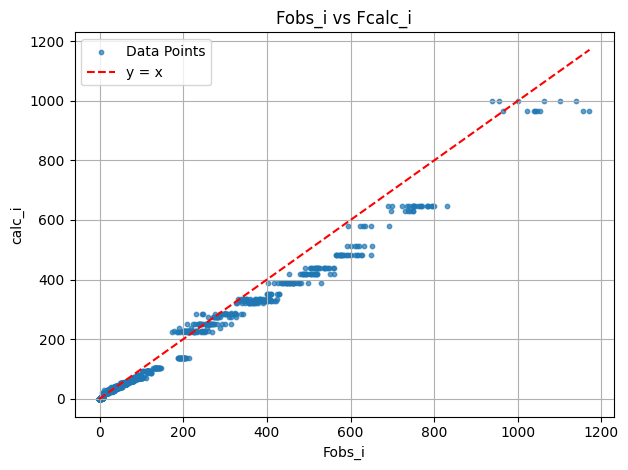

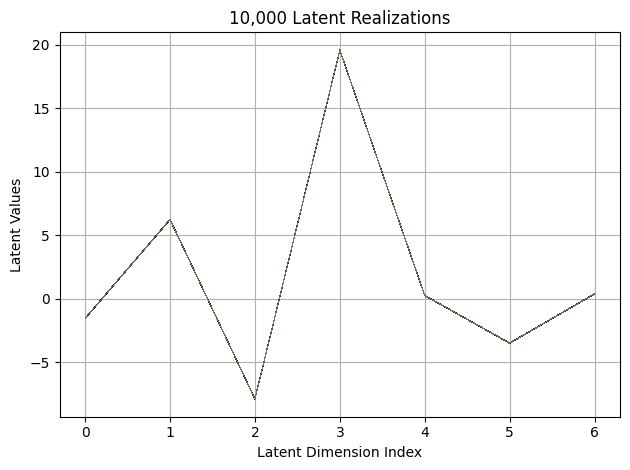

First 10 latent vectors from the VAE:
Sample 1: [-1.5499544143676758, 6.247372627258301, -7.8753204345703125, 19.578739166259766, 0.26968398690223694, -3.48720121383667, 0.3940388560295105]
Sample 2: [-1.5448967218399048, 6.250020503997803, -7.868411540985107, 19.566152572631836, 0.258093923330307, -3.478822946548462, 0.3846452832221985]
Sample 3: [-1.5409975051879883, 6.242576599121094, -7.866518020629883, 19.566404342651367, 0.26012301445007324, -3.4787051677703857, 0.39811548590660095]
Sample 4: [-1.5311083793640137, 6.251014232635498, -7.878262519836426, 19.572856903076172, 0.25753074884414673, -3.476491689682007, 0.40367481112480164]
Sample 5: [-1.5281599760055542, 6.246957302093506, -7.857701778411865, 19.565475463867188, 0.27496591210365295, -3.4866690635681152, 0.3889837861061096]
Sample 6: [-1.5437686443328857, 6.237427234649658, -7.863260746002197, 19.56162452697754, 0.2584899365901947, -3.48695969581604, 0.3888736069202423]
Sample 7: [-1.5484360456466675, 6.247293472290039, 

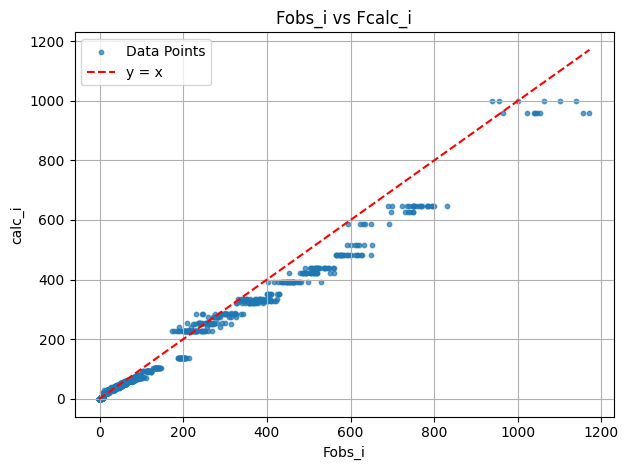

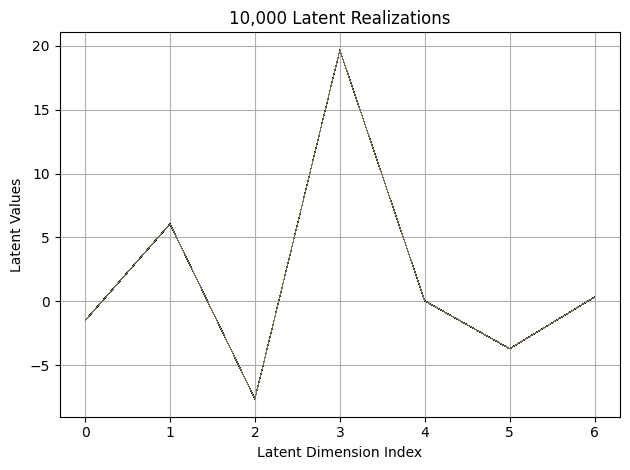

First 10 latent vectors from the VAE:
Sample 1: [-1.4947412014007568, 6.063091278076172, -7.62180757522583, 19.64934539794922, 0.052338674664497375, -3.695309638977051, 0.34713008999824524]
Sample 2: [-1.498180866241455, 6.046329975128174, -7.61935567855835, 19.65834617614746, 0.04662559926509857, -3.7077677249908447, 0.3368538022041321]
Sample 3: [-1.5222231149673462, 6.058396339416504, -7.614099979400635, 19.656736373901367, 0.04877683147788048, -3.70050311088562, 0.3405746817588806]
Sample 4: [-1.51862370967865, 6.055644512176514, -7.62697696685791, 19.65202522277832, 0.040240149945020676, -3.691490650177002, 0.3393016457557678]
Sample 5: [-1.5031665563583374, 6.060088634490967, -7.617714881896973, 19.64746856689453, 0.0381208136677742, -3.6979663372039795, 0.3369232416152954]
Sample 6: [-1.5035715103149414, 6.0523247718811035, -7.620903491973877, 19.651100158691406, 0.048000775277614594, -3.7022006511688232, 0.3336958885192871]
Sample 7: [-1.5072332620620728, 6.052872180938721, -7.

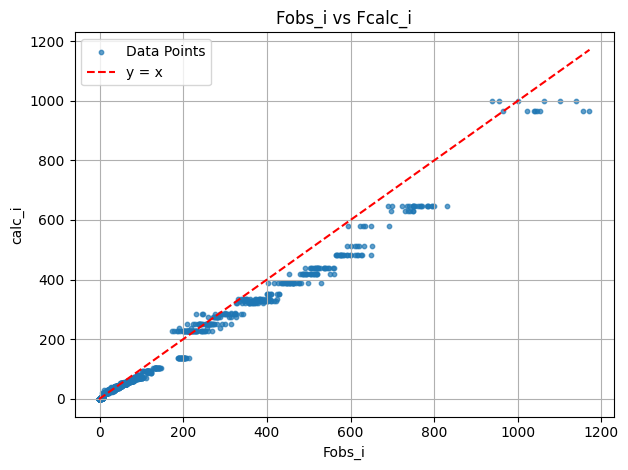

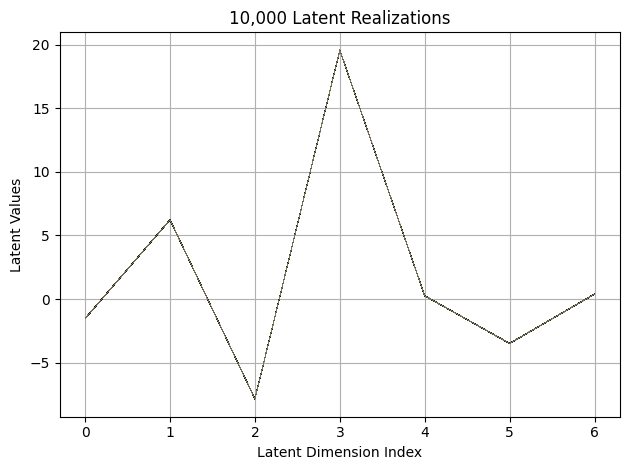

First 10 latent vectors from the VAE:
Sample 1: [-1.5490310192108154, 6.231427192687988, -7.856525897979736, 19.573686599731445, 0.24682928621768951, -3.5006797313690186, 0.3915265202522278]
Sample 2: [-1.540035605430603, 6.215610504150391, -7.864588737487793, 19.572294235229492, 0.24110470712184906, -3.494072198867798, 0.37951990962028503]
Sample 3: [-1.5345642566680908, 6.230367660522461, -7.859224319458008, 19.584394454956055, 0.25282612442970276, -3.4976248741149902, 0.3915884792804718]
Sample 4: [-1.5503507852554321, 6.23919677734375, -7.8531341552734375, 19.577116012573242, 0.2575123608112335, -3.491913080215454, 0.3928947150707245]
Sample 5: [-1.535593867301941, 6.2238945960998535, -7.8564348220825195, 19.573286056518555, 0.2581399977207184, -3.496002674102783, 0.3909238874912262]
Sample 6: [-1.5354020595550537, 6.231531620025635, -7.864668369293213, 19.571998596191406, 0.2572372257709503, -3.487095355987549, 0.3863309919834137]
Sample 7: [-1.5423800945281982, 6.221022129058838,

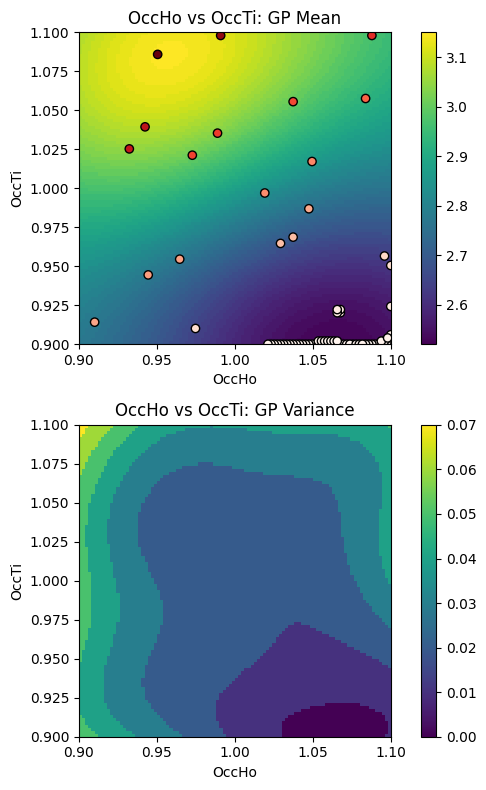

EI: [0.00641111 0.0063147  0.00622907 ... 0.00019724 0.00022836 0.0002644 ]
Function eval #80
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9282827973365784, 1.100000023841858]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4061
initial chi^2 2.1833e+06 with 2596 obs.
New scale: 0.4049
Cycle 0: 0.95s, Chi**2: 4.2121e+05 for 2596 obs., Lambda: 0,  Delta: 0.807, SVD=0
New scale: 0.4049
Maximum shift/esd = -271.731 for all cycles
Read from file

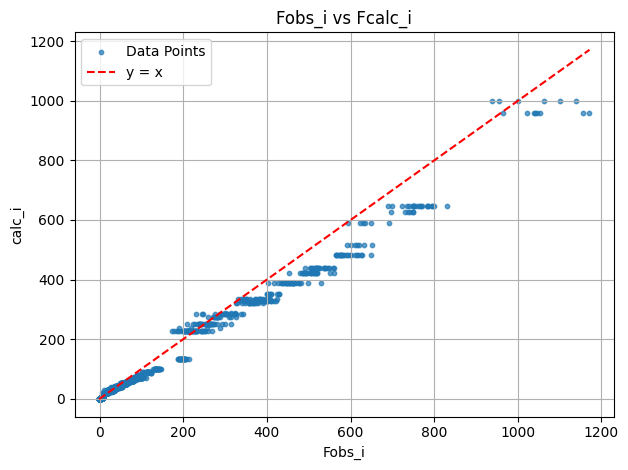

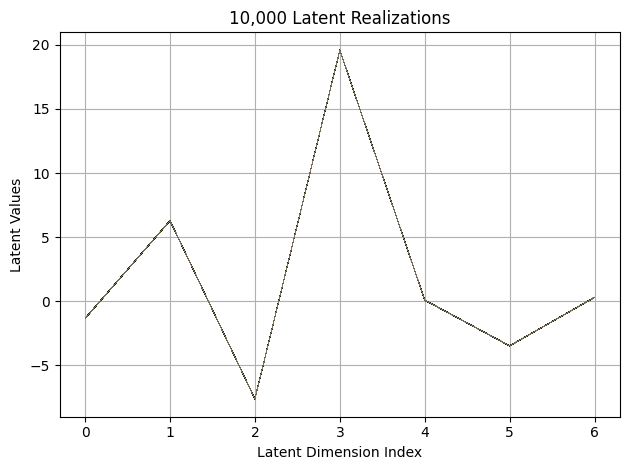

First 10 latent vectors from the VAE:
Sample 1: [-1.360190749168396, 6.277560710906982, -7.624777317047119, 19.603479385375977, 0.07423637062311172, -3.482243299484253, 0.285297155380249]
Sample 2: [-1.3556360006332397, 6.271841526031494, -7.645171165466309, 19.612403869628906, 0.07830433547496796, -3.4805362224578857, 0.2945402264595032]
Sample 3: [-1.3450987339019775, 6.283477306365967, -7.6437883377075195, 19.598644256591797, 0.05563855916261673, -3.4940810203552246, 0.2877114713191986]
Sample 4: [-1.3506804704666138, 6.273387908935547, -7.644216060638428, 19.60219383239746, 0.0712815374135971, -3.5064804553985596, 0.2934228181838989]
Sample 5: [-1.344225287437439, 6.280617713928223, -7.628551959991455, 19.588571548461914, 0.06875094026327133, -3.4952287673950195, 0.2882500886917114]
Sample 6: [-1.3461639881134033, 6.285969257354736, -7.645530700683594, 19.598005294799805, 0.07904701679944992, -3.4874203205108643, 0.2997821867465973]
Sample 7: [-1.3557616472244263, 6.292263507843018

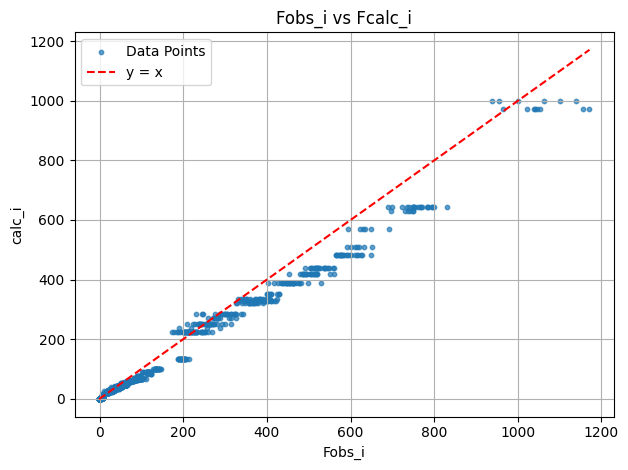

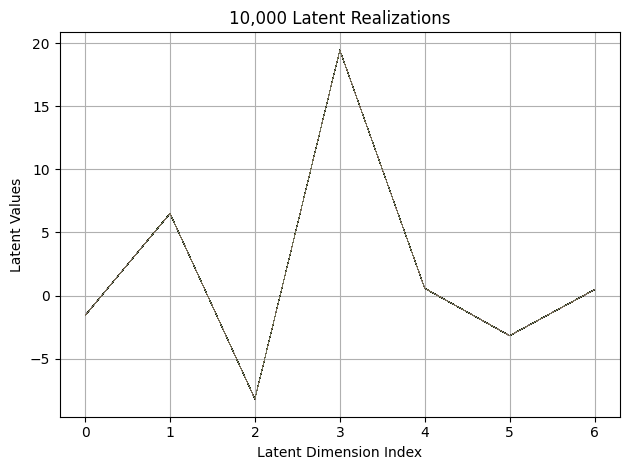

First 10 latent vectors from the VAE:
Sample 1: [-1.5718014240264893, 6.517333030700684, -8.214133262634277, 19.45880889892578, 0.5685624480247498, -3.185884952545166, 0.45462092757225037]
Sample 2: [-1.5846517086029053, 6.50402307510376, -8.18709945678711, 19.458585739135742, 0.5786625742912292, -3.1739661693573, 0.4725092649459839]
Sample 3: [-1.5802032947540283, 6.500446796417236, -8.203103065490723, 19.464248657226562, 0.5803095698356628, -3.1833009719848633, 0.4601048529148102]
Sample 4: [-1.5795462131500244, 6.493579387664795, -8.217422485351562, 19.461910247802734, 0.576701283454895, -3.1888697147369385, 0.46918803453445435]
Sample 5: [-1.5844552516937256, 6.506572246551514, -8.213372230529785, 19.468441009521484, 0.5783768892288208, -3.189711809158325, 0.46679016947746277]
Sample 6: [-1.5956878662109375, 6.496795654296875, -8.198394775390625, 19.453964233398438, 0.5747625827789307, -3.1924145221710205, 0.4851447641849518]
Sample 7: [-1.5746670961380005, 6.496131896972656, -8.20

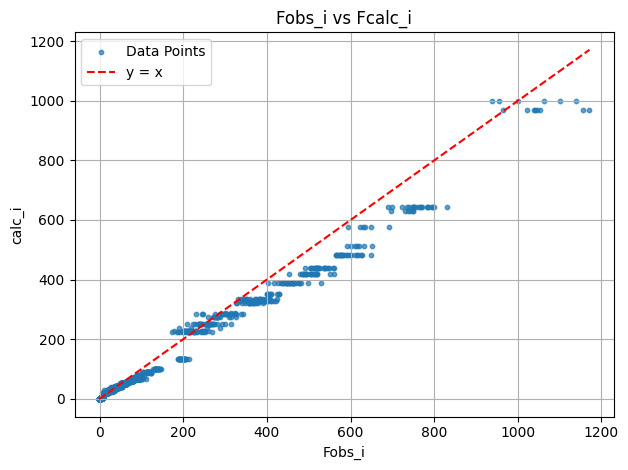

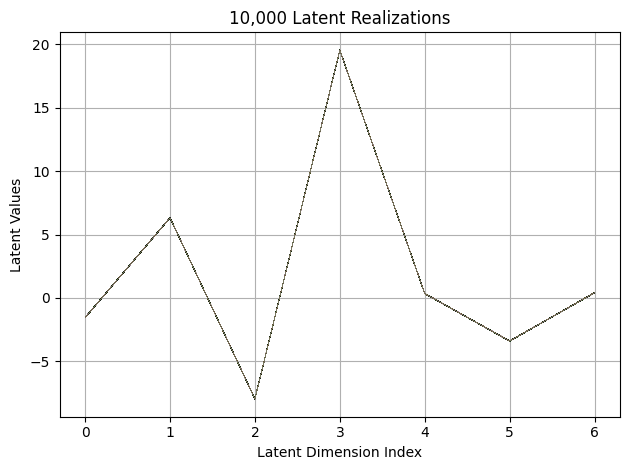

First 10 latent vectors from the VAE:
Sample 1: [-1.5571568012237549, 6.318807125091553, -7.954244613647461, 19.537311553955078, 0.33289140462875366, -3.3993656635284424, 0.41673362255096436]
Sample 2: [-1.5436664819717407, 6.333921432495117, -7.969605922698975, 19.550432205200195, 0.34515082836151123, -3.400742769241333, 0.40625956654548645]
Sample 3: [-1.5497751235961914, 6.318966865539551, -7.965680122375488, 19.540128707885742, 0.35399115085601807, -3.4051809310913086, 0.41740676760673523]
Sample 4: [-1.5421113967895508, 6.321095943450928, -7.945877552032471, 19.53670883178711, 0.35626816749572754, -3.3888182640075684, 0.40737149119377136]
Sample 5: [-1.5464398860931396, 6.320939540863037, -7.965370178222656, 19.53079605102539, 0.3453713059425354, -3.386664628982544, 0.41546547412872314]
Sample 6: [-1.564233660697937, 6.320383071899414, -7.96677303314209, 19.547500610351562, 0.355252742767334, -3.3980069160461426, 0.4146837890148163]
Sample 7: [-1.5454812049865723, 6.31623506546020

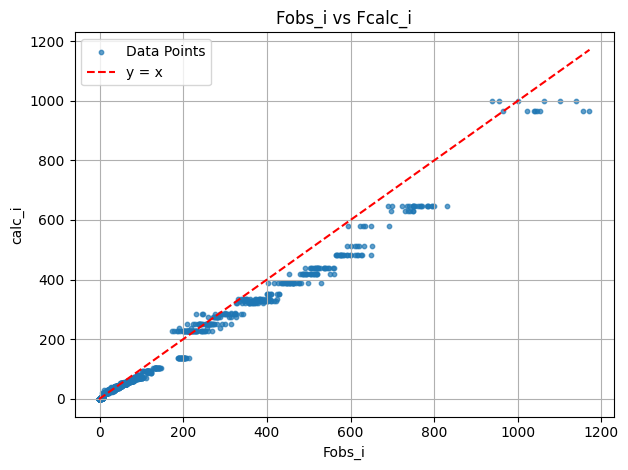

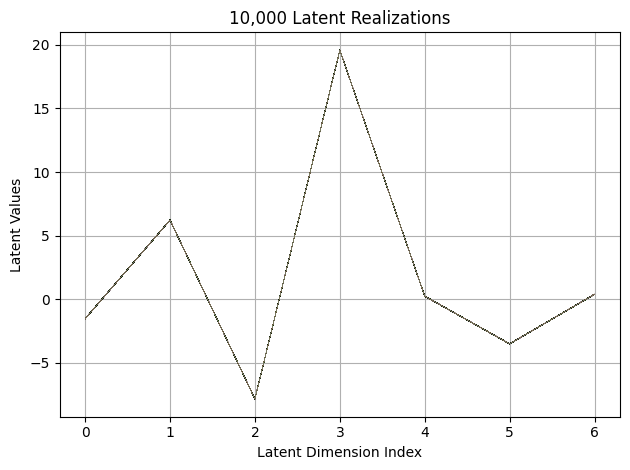

First 10 latent vectors from the VAE:
Sample 1: [-1.5483981370925903, 6.225428104400635, -7.8465657234191895, 19.575410842895508, 0.25867030024528503, -3.5133252143859863, 0.38471776247024536]
Sample 2: [-1.531229019165039, 6.2312493324279785, -7.851267337799072, 19.590980529785156, 0.24068129062652588, -3.523529291152954, 0.3948133885860443]
Sample 3: [-1.5335570573806763, 6.224115371704102, -7.834290027618408, 19.581520080566406, 0.23465554416179657, -3.500155210494995, 0.38958197832107544]
Sample 4: [-1.5458815097808838, 6.213164806365967, -7.8377532958984375, 19.57941436767578, 0.23233914375305176, -3.508296251296997, 0.3952791392803192]
Sample 5: [-1.5332057476043701, 6.215172290802002, -7.8405866622924805, 19.557735443115234, 0.24340412020683289, -3.512366771697998, 0.38026508688926697]
Sample 6: [-1.5344611406326294, 6.21804666519165, -7.8387885093688965, 19.586029052734375, 0.2442331165075302, -3.4987294673919678, 0.39539527893066406]
Sample 7: [-1.5390186309814453, 6.221726417

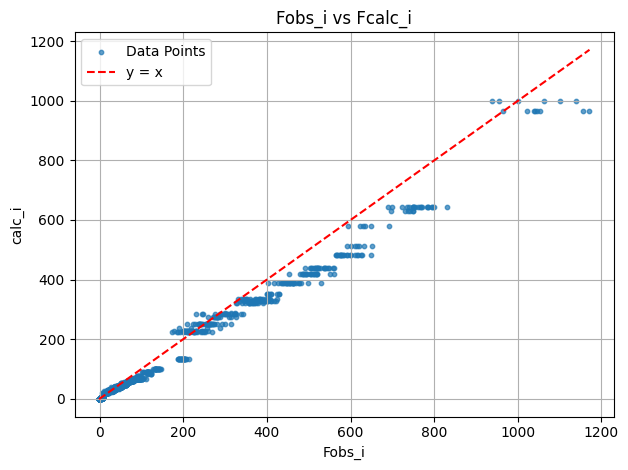

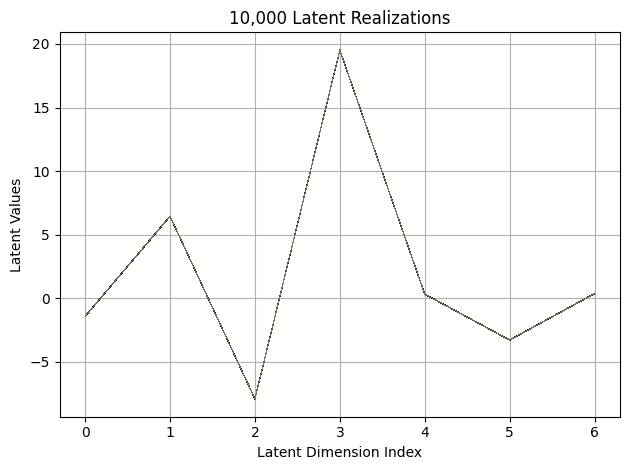

First 10 latent vectors from the VAE:
Sample 1: [-1.4271621704101562, 6.435885906219482, -7.94149923324585, 19.50937843322754, 0.32081320881843567, -3.2937467098236084, 0.3725642263889313]
Sample 2: [-1.4196470975875854, 6.457020282745361, -7.928573131561279, 19.521366119384766, 0.3253275454044342, -3.294365406036377, 0.365029901266098]
Sample 3: [-1.4296399354934692, 6.448946952819824, -7.921298027038574, 19.527185440063477, 0.3285582661628723, -3.2903785705566406, 0.37073078751564026]
Sample 4: [-1.4233587980270386, 6.442774772644043, -7.941806793212891, 19.512046813964844, 0.32824400067329407, -3.2759616374969482, 0.3543024957180023]
Sample 5: [-1.4333865642547607, 6.449494361877441, -7.922224998474121, 19.51384162902832, 0.3246939182281494, -3.289027452468872, 0.36272135376930237]
Sample 6: [-1.4335118532180786, 6.443654537200928, -7.92022180557251, 19.52984046936035, 0.33226513862609863, -3.2786567211151123, 0.37155792117118835]
Sample 7: [-1.434419870376587, 6.441964626312256, -7

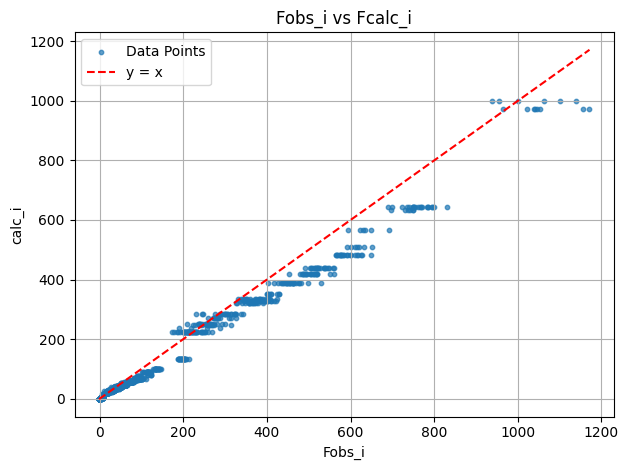

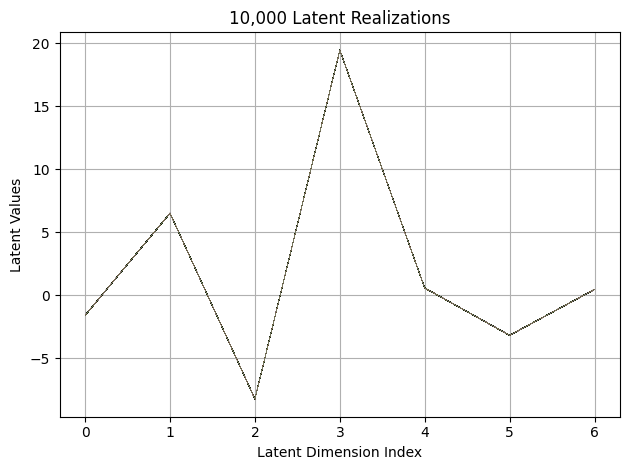

First 10 latent vectors from the VAE:
Sample 1: [-1.5795519351959229, 6.527217388153076, -8.217231750488281, 19.44942283630371, 0.5888977646827698, -3.185370922088623, 0.48209890723228455]
Sample 2: [-1.5771989822387695, 6.50540018081665, -8.220417022705078, 19.4515438079834, 0.5838063359260559, -3.1723897457122803, 0.46507561206817627]
Sample 3: [-1.586442232131958, 6.52488374710083, -8.22380542755127, 19.455238342285156, 0.5815010070800781, -3.1664838790893555, 0.4725433886051178]
Sample 4: [-1.5867286920547485, 6.510379791259766, -8.220048904418945, 19.457853317260742, 0.5775749683380127, -3.1725499629974365, 0.46950241923332214]
Sample 5: [-1.5755126476287842, 6.519230365753174, -8.219127655029297, 19.452007293701172, 0.5731936693191528, -3.165369749069214, 0.47516265511512756]
Sample 6: [-1.594496250152588, 6.507197856903076, -8.216691017150879, 19.443828582763672, 0.5866000652313232, -3.1675593852996826, 0.4695075452327728]
Sample 7: [-1.580337643623352, 6.527041912078857, -8.211

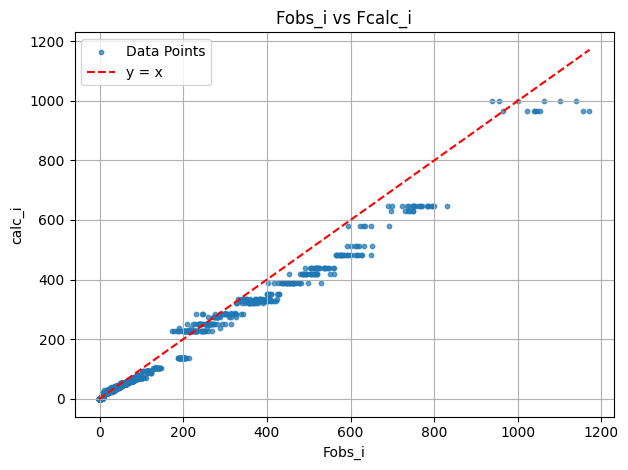

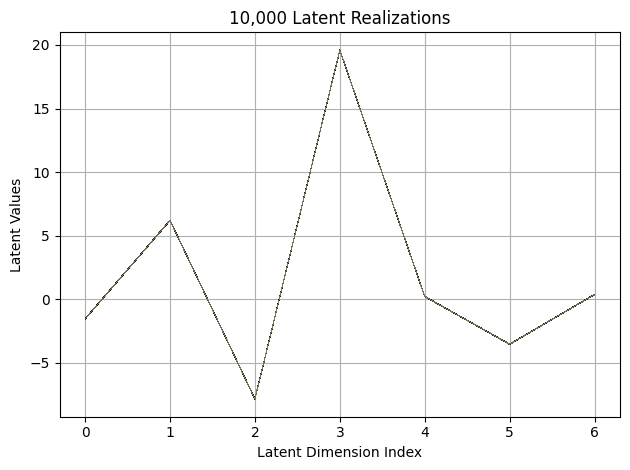

First 10 latent vectors from the VAE:
Sample 1: [-1.5246005058288574, 6.214653968811035, -7.815519332885742, 19.588876724243164, 0.21977359056472778, -3.5209054946899414, 0.3831895887851715]
Sample 2: [-1.5298290252685547, 6.203741550445557, -7.823700904846191, 19.589740753173828, 0.22672238945960999, -3.522637367248535, 0.38553503155708313]
Sample 3: [-1.5430251359939575, 6.211104393005371, -7.828956604003906, 19.583940505981445, 0.2279609590768814, -3.517292022705078, 0.37983211874961853]
Sample 4: [-1.524428367614746, 6.212978363037109, -7.833944320678711, 19.589601516723633, 0.23119191825389862, -3.5223000049591064, 0.3794187903404236]
Sample 5: [-1.5453330278396606, 6.211826801300049, -7.827404022216797, 19.588497161865234, 0.22245869040489197, -3.5149526596069336, 0.39619216322898865]
Sample 6: [-1.5392671823501587, 6.203522205352783, -7.825195789337158, 19.578584671020508, 0.22749647498130798, -3.5265438556671143, 0.3761460781097412]
Sample 7: [-1.5433531999588013, 6.20641899108

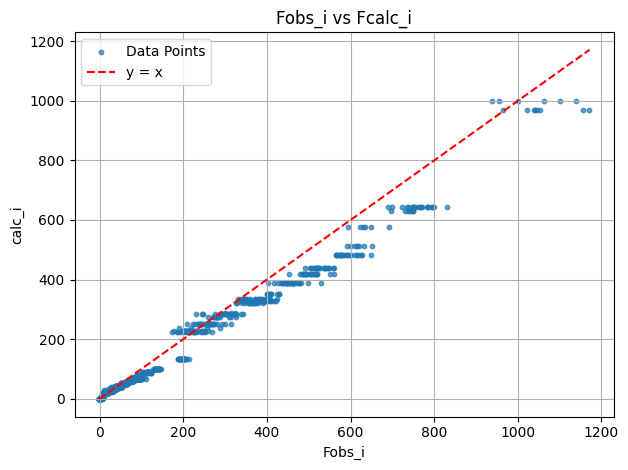

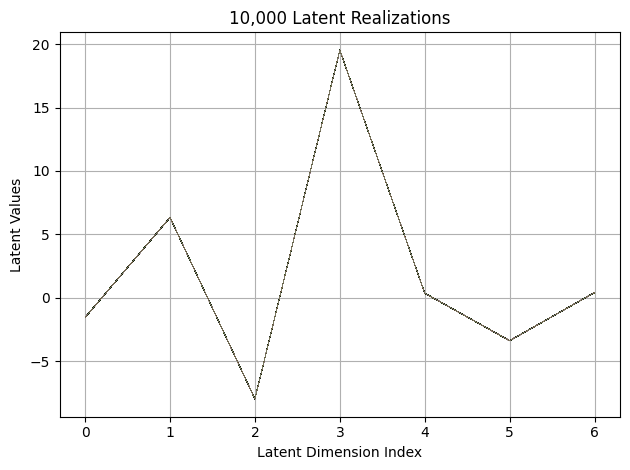

First 10 latent vectors from the VAE:
Sample 1: [-1.541838526725769, 6.332950592041016, -7.989232540130615, 19.521854400634766, 0.35698994994163513, -3.3875460624694824, 0.40247493982315063]
Sample 2: [-1.5500061511993408, 6.34184455871582, -7.974563121795654, 19.534868240356445, 0.37143203616142273, -3.389763593673706, 0.418797105550766]
Sample 3: [-1.5393953323364258, 6.32899808883667, -7.979155540466309, 19.53048324584961, 0.3651512563228607, -3.3885042667388916, 0.4144738018512726]
Sample 4: [-1.548207402229309, 6.321958541870117, -7.964447975158691, 19.537778854370117, 0.36194032430648804, -3.389479398727417, 0.41824737191200256]
Sample 5: [-1.552951693534851, 6.326259136199951, -7.984725475311279, 19.531557083129883, 0.35967594385147095, -3.391209363937378, 0.40579235553741455]
Sample 6: [-1.5496571063995361, 6.346410751342773, -7.972899436950684, 19.545211791992188, 0.37243109941482544, -3.3877241611480713, 0.4142962396144867]
Sample 7: [-1.554045557975769, 6.339571952819824, -7

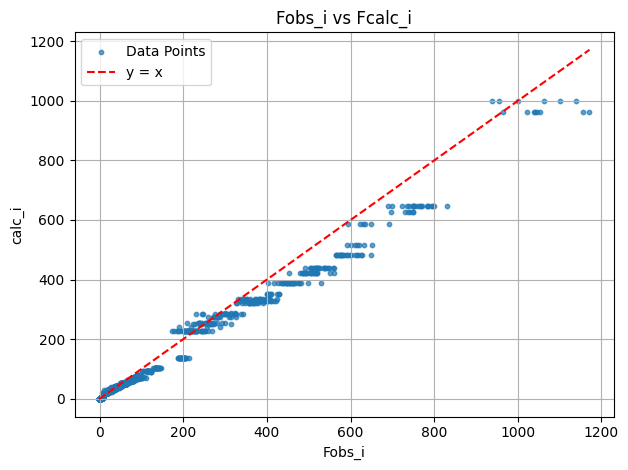

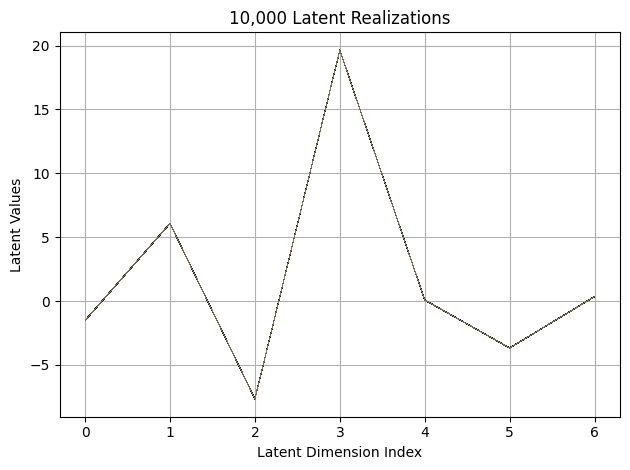

First 10 latent vectors from the VAE:
Sample 1: [-1.5248149633407593, 6.062736988067627, -7.658230304718018, 19.63926124572754, 0.07870298624038696, -3.6830427646636963, 0.3414672017097473]
Sample 2: [-1.5165443420410156, 6.081262111663818, -7.670742511749268, 19.634536743164062, 0.08343075215816498, -3.6828932762145996, 0.34680360555648804]
Sample 3: [-1.5249117612838745, 6.069313049316406, -7.661111354827881, 19.64897346496582, 0.08053581416606903, -3.677285671234131, 0.34622904658317566]
Sample 4: [-1.5184357166290283, 6.083069324493408, -7.661707401275635, 19.65226173400879, 0.08111991733312607, -3.681706666946411, 0.3599283695220947]
Sample 5: [-1.5190684795379639, 6.075066566467285, -7.661569595336914, 19.64620018005371, 0.07571862637996674, -3.669412851333618, 0.34013646841049194]
Sample 6: [-1.5141334533691406, 6.070234298706055, -7.666921615600586, 19.6396484375, 0.07400385290384293, -3.6718807220458984, 0.3509673774242401]
Sample 7: [-1.512063980102539, 6.084155559539795, -7.

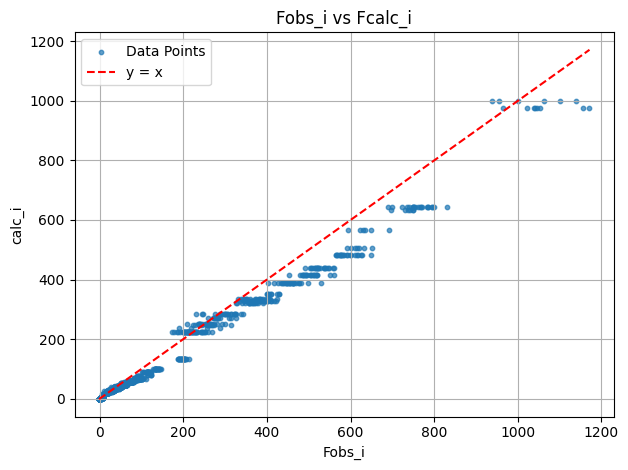

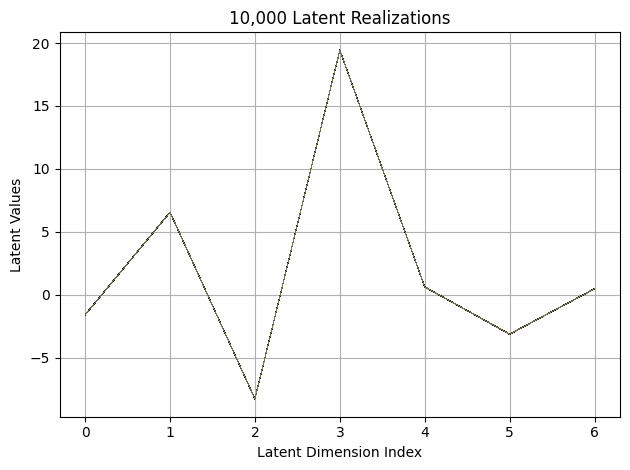

First 10 latent vectors from the VAE:
Sample 1: [-1.5837762355804443, 6.559987545013428, -8.265246391296387, 19.428220748901367, 0.6329960823059082, -3.1254611015319824, 0.48049747943878174]
Sample 2: [-1.5842782258987427, 6.567154407501221, -8.25799560546875, 19.42890167236328, 0.6264780759811401, -3.121757984161377, 0.4860268533229828]
Sample 3: [-1.5799028873443604, 6.5583577156066895, -8.263121604919434, 19.44226837158203, 0.6202222108840942, -3.1289877891540527, 0.4864005744457245]
Sample 4: [-1.5811047554016113, 6.552876949310303, -8.25903034210205, 19.44021987915039, 0.6161220073699951, -3.1350667476654053, 0.47275444865226746]
Sample 5: [-1.5878509283065796, 6.564752578735352, -8.265152931213379, 19.43026351928711, 0.6165974736213684, -3.1258997917175293, 0.4810521900653839]
Sample 6: [-1.582202434539795, 6.5582733154296875, -8.255189895629883, 19.437360763549805, 0.6154369711875916, -3.1206181049346924, 0.4783816933631897]
Sample 7: [-1.5865367650985718, 6.55768346786499, -8.2

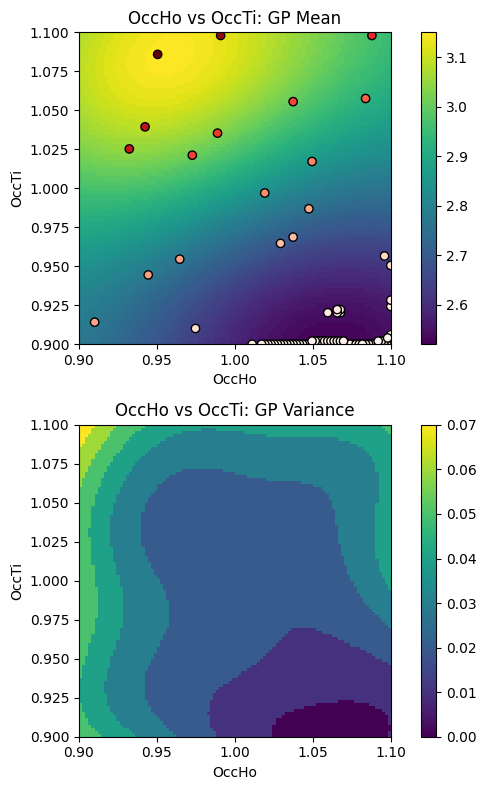

EI: [0.00705642 0.00694502 0.00684501 ... 0.00022915 0.00026497 0.00030649]
Function eval #90
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9222221970558167, 1.0595959424972534]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4358
initial chi^2 1.6934e+06 with 2596 obs.
New scale: 0.4349
Cycle 0: 0.73s, Chi**2: 3.8205e+05 for 2596 obs., Lambda: 0,  Delta: 0.774, SVD=0
New scale: 0.4349
Maximum shift/esd = -235.644 for all cycles
Read from fil

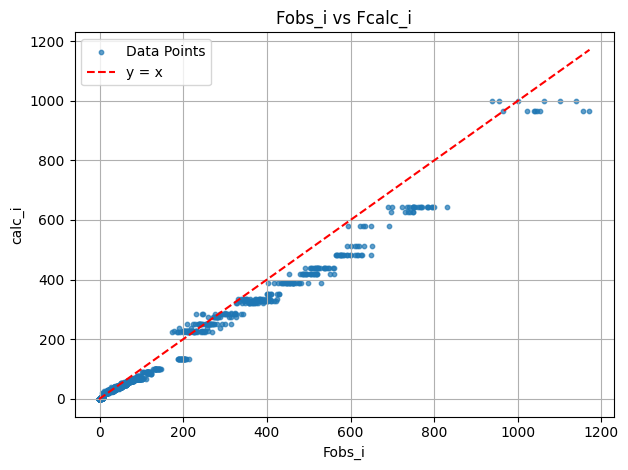

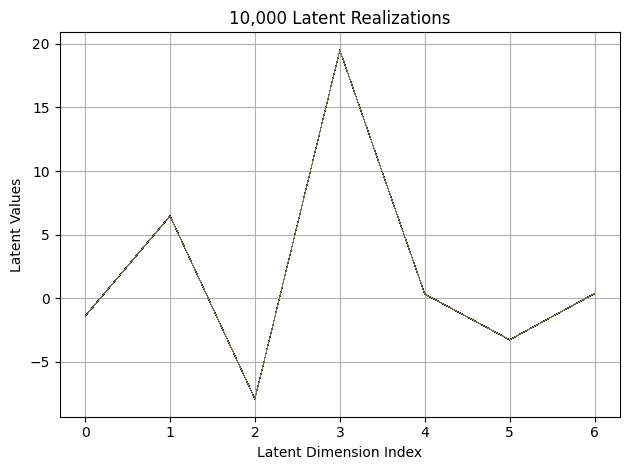

First 10 latent vectors from the VAE:
Sample 1: [-1.413100242614746, 6.4726691246032715, -7.924729347229004, 19.506771087646484, 0.32984715700149536, -3.260471820831299, 0.3602488040924072]
Sample 2: [-1.4078571796417236, 6.468349456787109, -7.932727336883545, 19.505701065063477, 0.3224089443683624, -3.2733302116394043, 0.3682587444782257]
Sample 3: [-1.4133939743041992, 6.465982913970947, -7.925359725952148, 19.500242233276367, 0.3246900141239166, -3.268666982650757, 0.3632982671260834]
Sample 4: [-1.4150011539459229, 6.463515281677246, -7.926848411560059, 19.50651741027832, 0.32698914408683777, -3.2673561573028564, 0.35974225401878357]
Sample 5: [-1.4174219369888306, 6.469418048858643, -7.920444965362549, 19.512714385986328, 0.32433009147644043, -3.2771236896514893, 0.36877888441085815]
Sample 6: [-1.4059593677520752, 6.472149848937988, -7.933526992797852, 19.51124382019043, 0.3344474136829376, -3.2689809799194336, 0.3649786412715912]
Sample 7: [-1.4085322618484497, 6.473744392395019

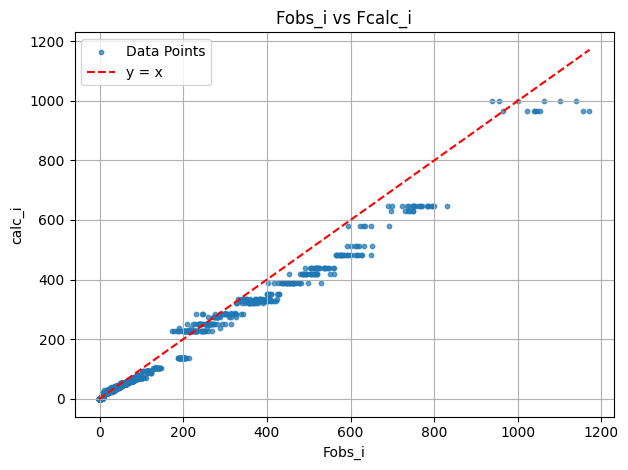

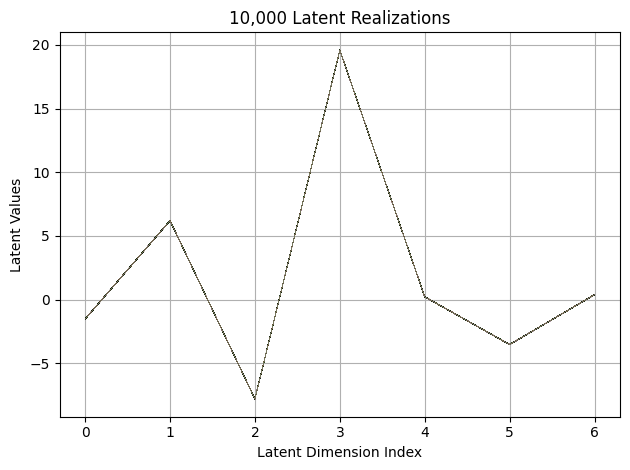

First 10 latent vectors from the VAE:
Sample 1: [-1.5471149682998657, 6.196892261505127, -7.8118486404418945, 19.594173431396484, 0.21694473922252655, -3.5361173152923584, 0.37003183364868164]
Sample 2: [-1.5287901163101196, 6.195874214172363, -7.801238059997559, 19.59532356262207, 0.2151489108800888, -3.532876491546631, 0.3901185691356659]
Sample 3: [-1.5198057889938354, 6.197299957275391, -7.808359146118164, 19.586130142211914, 0.21135970950126648, -3.543294906616211, 0.3759389817714691]
Sample 4: [-1.5404177904129028, 6.197602272033691, -7.802014350891113, 19.593555450439453, 0.21488972008228302, -3.5426270961761475, 0.38139307498931885]
Sample 5: [-1.5270280838012695, 6.205684661865234, -7.802690505981445, 19.58684539794922, 0.21578650176525116, -3.5334784984588623, 0.38647282123565674]
Sample 6: [-1.528694748878479, 6.189083576202393, -7.809206008911133, 19.59463882446289, 0.2101481556892395, -3.5368216037750244, 0.3822326064109802]
Sample 7: [-1.5372047424316406, 6.19832181930542

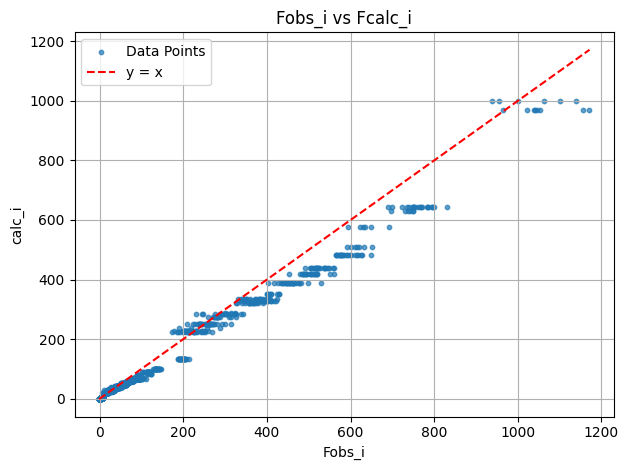

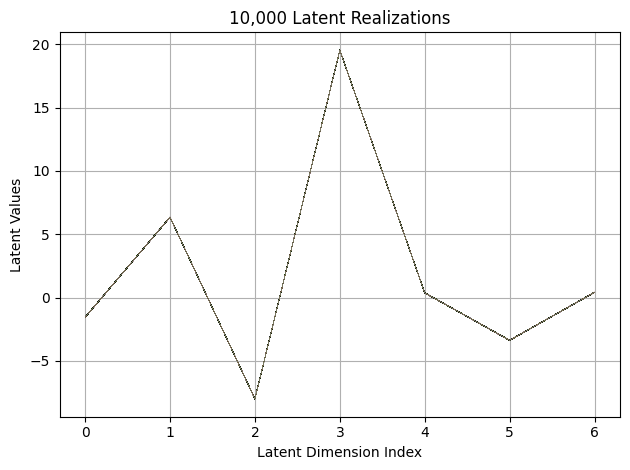

First 10 latent vectors from the VAE:
Sample 1: [-1.5523083209991455, 6.330833435058594, -7.99202299118042, 19.53314781188965, 0.36193934082984924, -3.3731651306152344, 0.43042057752609253]
Sample 2: [-1.551093578338623, 6.326327800750732, -7.994343280792236, 19.53568458557129, 0.3748762309551239, -3.3670167922973633, 0.412319153547287]
Sample 3: [-1.5467842817306519, 6.338804721832275, -7.993331432342529, 19.530771255493164, 0.3765098452568054, -3.364799976348877, 0.41056880354881287]
Sample 4: [-1.5460591316223145, 6.332950115203857, -8.001590728759766, 19.5272274017334, 0.3853609263896942, -3.370425224304199, 0.4170915484428406]
Sample 5: [-1.5421167612075806, 6.348199367523193, -7.984138011932373, 19.518808364868164, 0.37705349922180176, -3.3838553428649902, 0.4194760024547577]
Sample 6: [-1.550905704498291, 6.3442158699035645, -7.993370532989502, 19.532154083251953, 0.37331634759902954, -3.365929126739502, 0.4082099199295044]
Sample 7: [-1.553654432296753, 6.345845699310303, -8.00

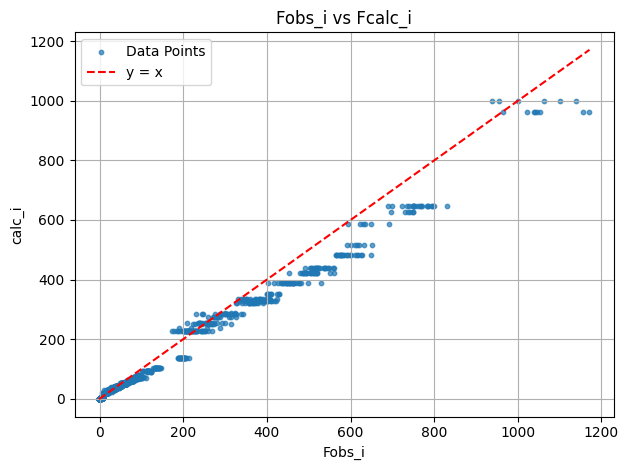

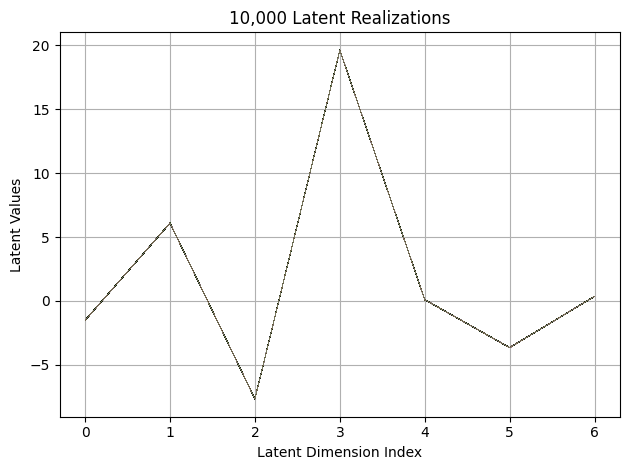

First 10 latent vectors from the VAE:
Sample 1: [-1.512071132659912, 6.0845818519592285, -7.677590847015381, 19.62916374206543, 0.07885980606079102, -3.665116548538208, 0.3487854301929474]
Sample 2: [-1.5156787633895874, 6.088677406311035, -7.675559997558594, 19.643356323242188, 0.09044744819402695, -3.6636106967926025, 0.3440786898136139]
Sample 3: [-1.5146914720535278, 6.085877895355225, -7.681146621704102, 19.646984100341797, 0.09747447073459625, -3.6523709297180176, 0.3577398657798767]
Sample 4: [-1.5158743858337402, 6.101117134094238, -7.67063570022583, 19.647695541381836, 0.08311306685209274, -3.663533926010132, 0.3611434996128082]
Sample 5: [-1.5134730339050293, 6.0976881980896, -7.676869869232178, 19.637887954711914, 0.0880255326628685, -3.6621310710906982, 0.34510210156440735]
Sample 6: [-1.5125465393066406, 6.0899481773376465, -7.689091682434082, 19.640708923339844, 0.09578706324100494, -3.66414737701416, 0.3528500199317932]
Sample 7: [-1.523406982421875, 6.088828086853027, -

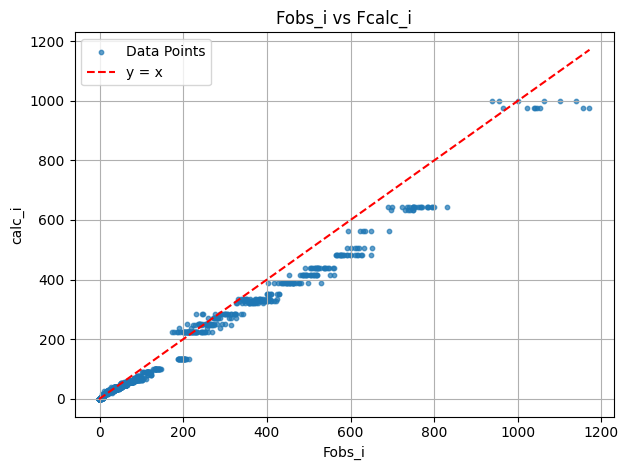

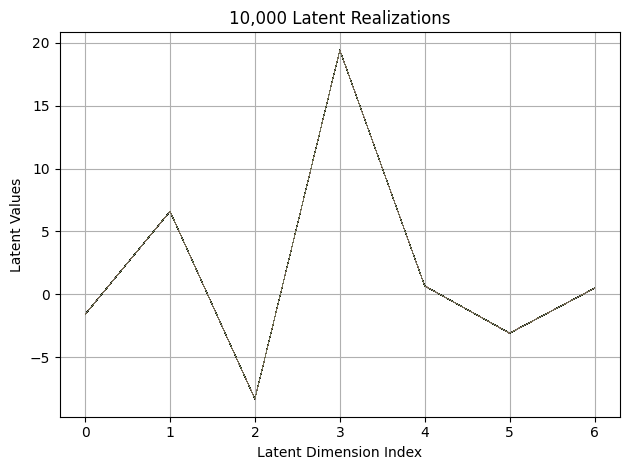

First 10 latent vectors from the VAE:
Sample 1: [-1.5827606916427612, 6.597960948944092, -8.324309349060059, 19.429964065551758, 0.6658225655555725, -3.081727981567383, 0.4822823703289032]
Sample 2: [-1.5986287593841553, 6.5851969718933105, -8.313468933105469, 19.42438507080078, 0.6662331223487854, -3.074422836303711, 0.49201542139053345]
Sample 3: [-1.594172477722168, 6.601749897003174, -8.311315536499023, 19.408641815185547, 0.672806978225708, -3.0780844688415527, 0.4895155727863312]
Sample 4: [-1.583062767982483, 6.599523067474365, -8.31246566772461, 19.425798416137695, 0.6656134724617004, -3.0832159519195557, 0.49054285883903503]
Sample 5: [-1.592555046081543, 6.594755172729492, -8.31670093536377, 19.430795669555664, 0.6661362051963806, -3.077627420425415, 0.4985845685005188]
Sample 6: [-1.5844836235046387, 6.5853776931762695, -8.3138427734375, 19.421409606933594, 0.6699361801147461, -3.082036256790161, 0.477537602186203]
Sample 7: [-1.5985997915267944, 6.588537693023682, -8.304909

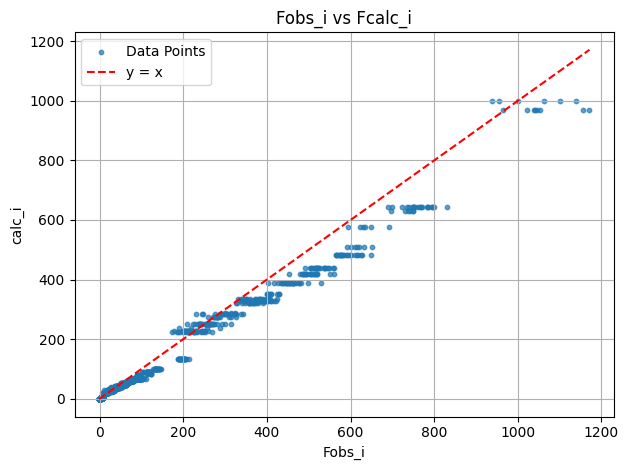

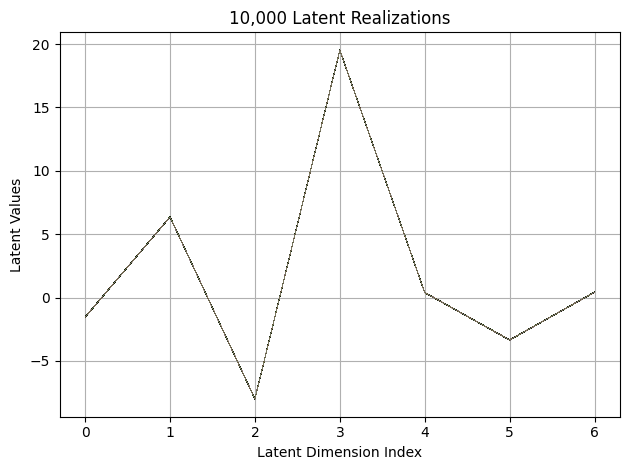

First 10 latent vectors from the VAE:
Sample 1: [-1.5581209659576416, 6.357972621917725, -8.008084297180176, 19.526325225830078, 0.3897518813610077, -3.35444974899292, 0.4222967028617859]
Sample 2: [-1.5429059267044067, 6.369414329528809, -7.997201442718506, 19.533641815185547, 0.38759782910346985, -3.346846580505371, 0.4314511716365814]
Sample 3: [-1.5491371154785156, 6.372163772583008, -7.994296073913574, 19.51903533935547, 0.38990363478660583, -3.366276502609253, 0.4168763756752014]
Sample 4: [-1.5481674671173096, 6.347122669219971, -8.007461547851562, 19.516056060791016, 0.3890130817890167, -3.357987642288208, 0.419635534286499]
Sample 5: [-1.5484647750854492, 6.354128360748291, -7.996674537658691, 19.528074264526367, 0.3800627589225769, -3.339902400970459, 0.42705461382865906]
Sample 6: [-1.5398080348968506, 6.36216926574707, -8.003912925720215, 19.517858505249023, 0.39343148469924927, -3.349940061569214, 0.43163228034973145]
Sample 7: [-1.5501998662948608, 6.364086627960205, -7.9

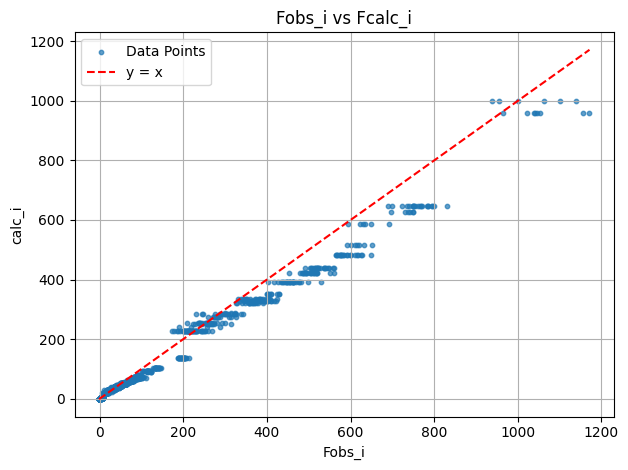

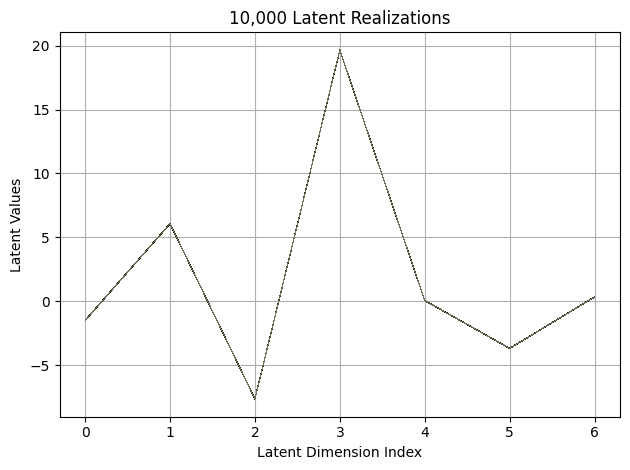

First 10 latent vectors from the VAE:
Sample 1: [-1.5039383172988892, 6.070956230163574, -7.6316046714782715, 19.648591995239258, 0.06548081338405609, -3.689338207244873, 0.33477890491485596]
Sample 2: [-1.4939699172973633, 6.0691070556640625, -7.639309883117676, 19.639184951782227, 0.0544578991830349, -3.676677942276001, 0.3416838049888611]
Sample 3: [-1.5099579095840454, 6.0783371925354, -7.634771347045898, 19.640012741088867, 0.056065499782562256, -3.6947789192199707, 0.33541139960289]
Sample 4: [-1.513930320739746, 6.0625410079956055, -7.628654479980469, 19.649015426635742, 0.049785513430833817, -3.677889823913574, 0.33320337533950806]
Sample 5: [-1.501143217086792, 6.090889930725098, -7.636763572692871, 19.654680252075195, 0.052505671977996826, -3.6756606101989746, 0.34885337948799133]
Sample 6: [-1.4974342584609985, 6.06760311126709, -7.636482238769531, 19.64048194885254, 0.05751948058605194, -3.6799581050872803, 0.3351803421974182]
Sample 7: [-1.5059349536895752, 6.0719828605651

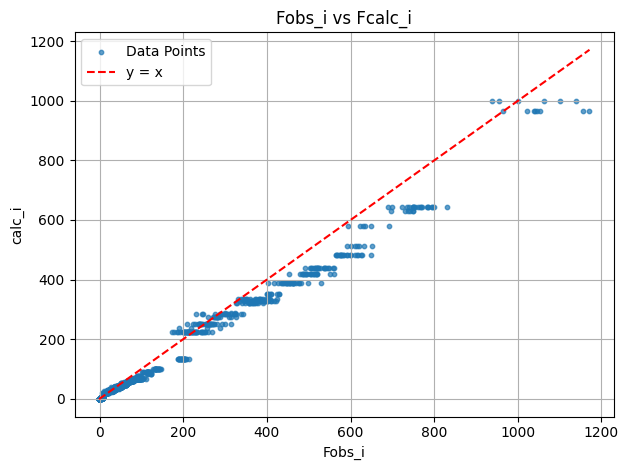

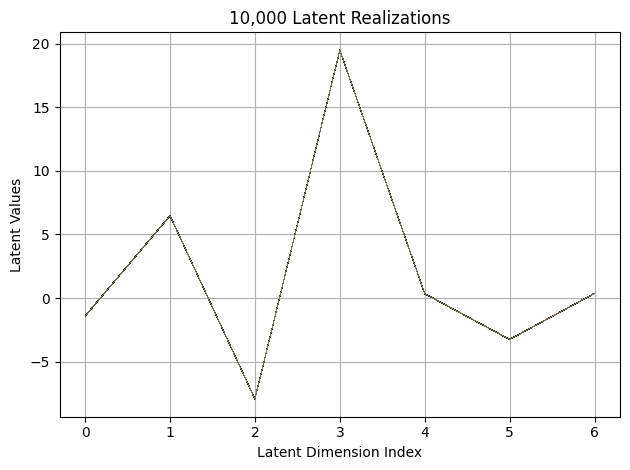

First 10 latent vectors from the VAE:
Sample 1: [-1.4126651287078857, 6.481693267822266, -7.941129207611084, 19.495832443237305, 0.3435569703578949, -3.2592954635620117, 0.3592897355556488]
Sample 2: [-1.4271453619003296, 6.473454475402832, -7.951338291168213, 19.50735092163086, 0.3393182158470154, -3.2541232109069824, 0.3627015948295593]
Sample 3: [-1.424310326576233, 6.471279621124268, -7.930634498596191, 19.513574600219727, 0.33730509877204895, -3.257841110229492, 0.35961443185806274]
Sample 4: [-1.420717716217041, 6.4811248779296875, -7.9268670082092285, 19.50368881225586, 0.3412545323371887, -3.2622945308685303, 0.3607562184333801]
Sample 5: [-1.4156140089035034, 6.464515686035156, -7.935240745544434, 19.510435104370117, 0.34967347979545593, -3.2480599880218506, 0.37646085023880005]
Sample 6: [-1.4119000434875488, 6.4868316650390625, -7.940191268920898, 19.5093994140625, 0.3478783965110779, -3.2508373260498047, 0.3643423616886139]
Sample 7: [-1.4133172035217285, 6.483921051025391,

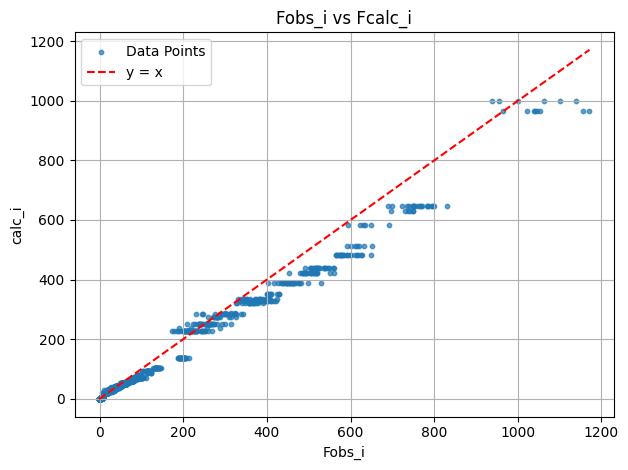

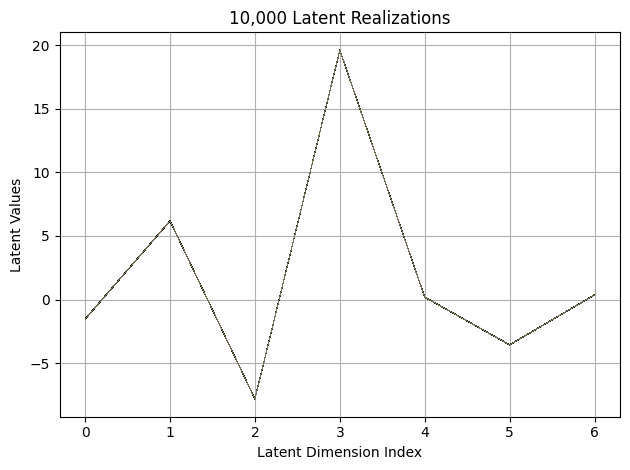

First 10 latent vectors from the VAE:
Sample 1: [-1.54159677028656, 6.189207077026367, -7.800779342651367, 19.596345901489258, 0.1915309578180313, -3.5537326335906982, 0.3890334963798523]
Sample 2: [-1.5382936000823975, 6.179173946380615, -7.789233684539795, 19.590436935424805, 0.1893506944179535, -3.5551981925964355, 0.366397887468338]
Sample 3: [-1.5198701620101929, 6.18284797668457, -7.795644283294678, 19.593303680419922, 0.19492875039577484, -3.550922393798828, 0.3884195387363434]
Sample 4: [-1.5270746946334839, 6.185477256774902, -7.787806987762451, 19.60382843017578, 0.20176468789577484, -3.5561389923095703, 0.3801194429397583]
Sample 5: [-1.5298717021942139, 6.187983989715576, -7.786227703094482, 19.603910446166992, 0.19188229739665985, -3.555612087249756, 0.3741241693496704]
Sample 6: [-1.5284876823425293, 6.191579341888428, -7.802891731262207, 19.595104217529297, 0.1922249048948288, -3.55292010307312, 0.3756898045539856]
Sample 7: [-1.536779761314392, 6.190186977386475, -7.798

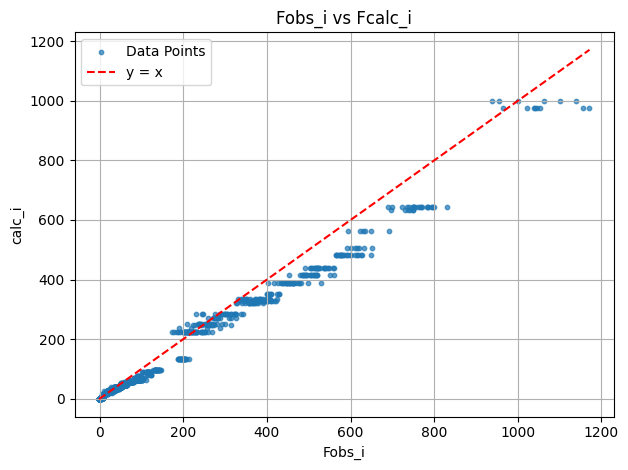

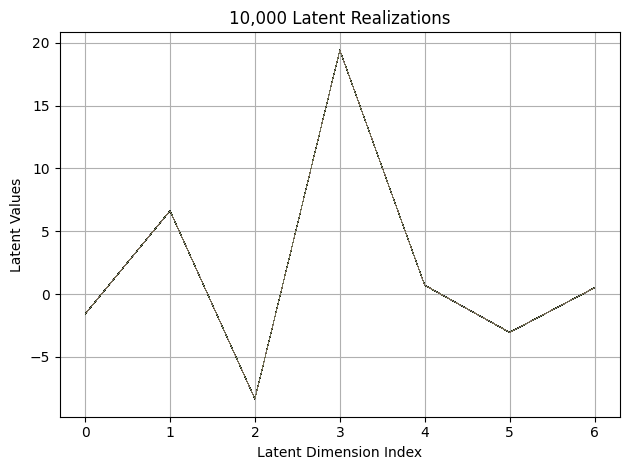

First 10 latent vectors from the VAE:
Sample 1: [-1.5888056755065918, 6.617202281951904, -8.336657524108887, 19.40418243408203, 0.7041720747947693, -3.040071725845337, 0.4958493113517761]
Sample 2: [-1.5891646146774292, 6.631432056427002, -8.345390319824219, 19.409626007080078, 0.6994264721870422, -3.0527777671813965, 0.4982634484767914]
Sample 3: [-1.6029562950134277, 6.626472473144531, -8.333404541015625, 19.40590476989746, 0.6946191787719727, -3.057874917984009, 0.4950239360332489]
Sample 4: [-1.588863492012024, 6.616899013519287, -8.332531929016113, 19.412717819213867, 0.684434711933136, -3.0512311458587646, 0.4975580871105194]
Sample 5: [-1.5921589136123657, 6.616466999053955, -8.358720779418945, 19.405576705932617, 0.700093150138855, -3.0408875942230225, 0.4845174252986908]
Sample 6: [-1.5872082710266113, 6.627108097076416, -8.35385799407959, 19.3988094329834, 0.7050254344940186, -3.0387182235717773, 0.5048817992210388]
Sample 7: [-1.5940909385681152, 6.622838973999023, -8.331624

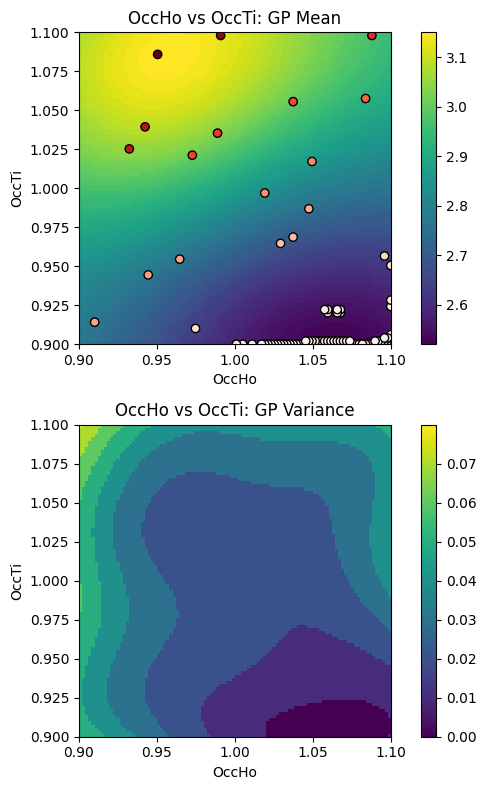

EI: [0.00777083 0.00763829 0.0075175  ... 0.00026392 0.00030488 0.00035239]
Function eval #100
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9303030371665955, 1.100000023841858]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4060
initial chi^2 2.1808e+06 with 2596 obs.
New scale: 0.4048
Cycle 0: 0.74s, Chi**2: 4.213e+05 for 2596 obs., Lambda: 0,  Delta: 0.807, SVD=0
New scale: 0.4048
Maximum shift/esd = -271.694 for all cycles
Read from file

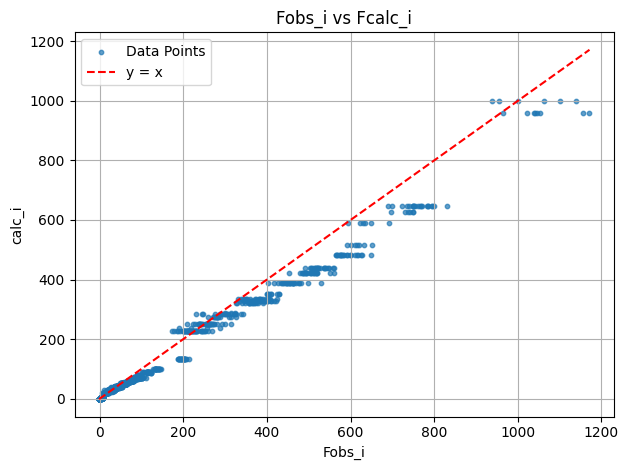

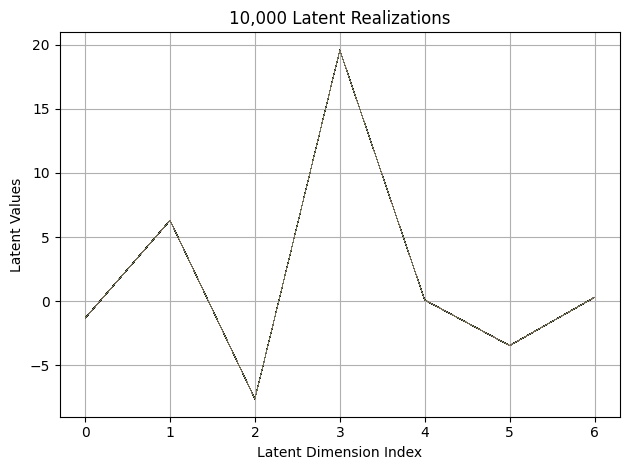

First 10 latent vectors from the VAE:
Sample 1: [-1.3346489667892456, 6.307985782623291, -7.630895137786865, 19.597795486450195, 0.08188512921333313, -3.484764814376831, 0.28073596954345703]
Sample 2: [-1.3194282054901123, 6.295412063598633, -7.640328407287598, 19.600391387939453, 0.08794396370649338, -3.4740803241729736, 0.29945504665374756]
Sample 3: [-1.3389447927474976, 6.293105125427246, -7.630649566650391, 19.603609085083008, 0.088030606508255, -3.470823287963867, 0.28223371505737305]
Sample 4: [-1.3327362537384033, 6.295984745025635, -7.646615028381348, 19.590389251708984, 0.08226384222507477, -3.4739558696746826, 0.29028335213661194]
Sample 5: [-1.3469998836517334, 6.292412757873535, -7.654158592224121, 19.593339920043945, 0.07129259407520294, -3.4776599407196045, 0.29223501682281494]
Sample 6: [-1.3423407077789307, 6.2930731773376465, -7.626375675201416, 19.582849502563477, 0.08384285867214203, -3.4866204261779785, 0.2824861407279968]
Sample 7: [-1.34566068649292, 6.2928047180

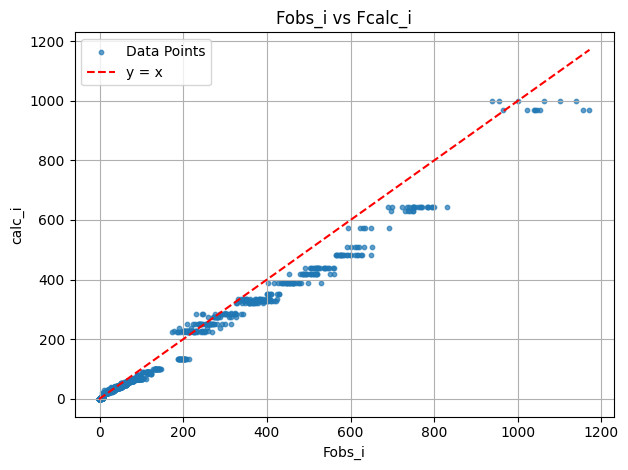

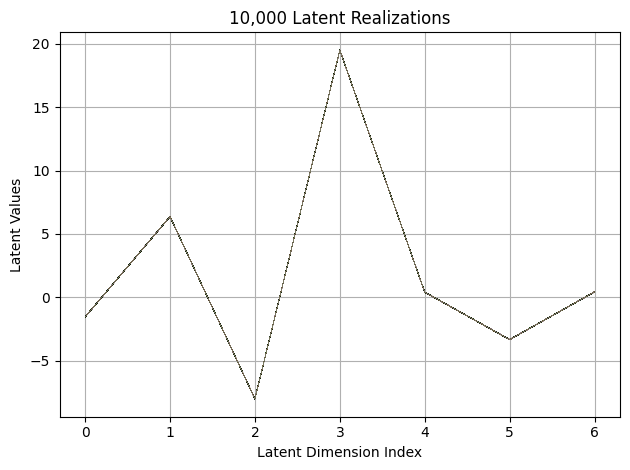

First 10 latent vectors from the VAE:
Sample 1: [-1.555813193321228, 6.371710300445557, -8.016375541687012, 19.508974075317383, 0.40966159105300903, -3.334641695022583, 0.4352695047855377]
Sample 2: [-1.5504608154296875, 6.369363784790039, -8.016237258911133, 19.510826110839844, 0.4094592332839966, -3.3397159576416016, 0.4253404438495636]
Sample 3: [-1.5605766773223877, 6.370058536529541, -8.018460273742676, 19.515138626098633, 0.4109230041503906, -3.3527166843414307, 0.42365285754203796]
Sample 4: [-1.552505612373352, 6.362340927124023, -8.024169921875, 19.50813865661621, 0.39385223388671875, -3.3553998470306396, 0.4309607446193695]
Sample 5: [-1.5621775388717651, 6.369960784912109, -8.010835647583008, 19.524030685424805, 0.4038969576358795, -3.3404345512390137, 0.4243844747543335]
Sample 6: [-1.5520544052124023, 6.365023612976074, -8.027687072753906, 19.521533966064453, 0.4071638286113739, -3.348614454269409, 0.4256041944026947]
Sample 7: [-1.5367848873138428, 6.3705267906188965, -8.

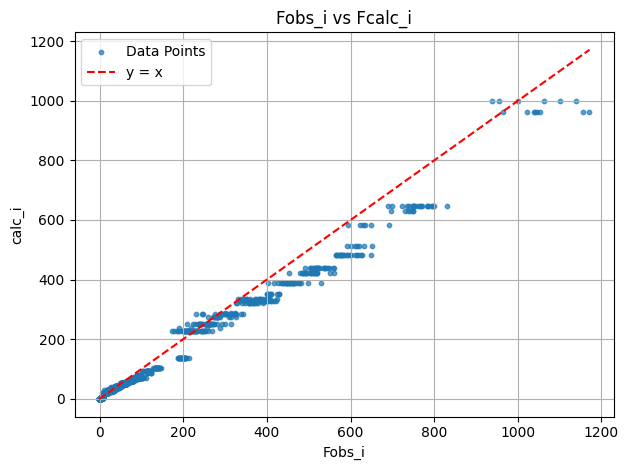

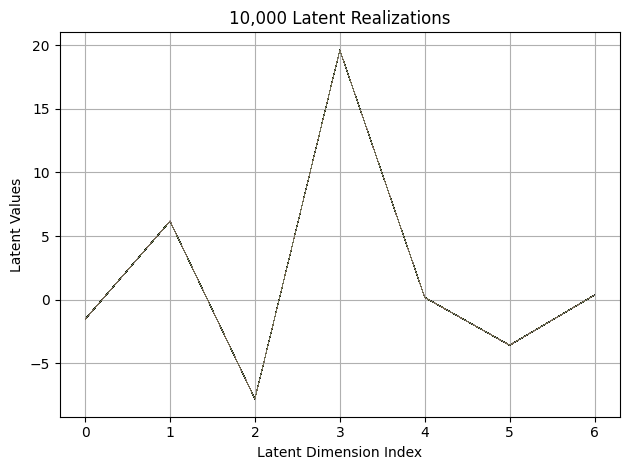

First 10 latent vectors from the VAE:
Sample 1: [-1.541345238685608, 6.176281929016113, -7.774471282958984, 19.60262680053711, 0.19200806319713593, -3.566923141479492, 0.36832478642463684]
Sample 2: [-1.5306419134140015, 6.173219203948975, -7.782813549041748, 19.59700584411621, 0.18166624009609222, -3.5591373443603516, 0.36679255962371826]
Sample 3: [-1.5212132930755615, 6.178228855133057, -7.7836151123046875, 19.593727111816406, 0.17942820489406586, -3.56900954246521, 0.37176886200904846]
Sample 4: [-1.5349961519241333, 6.17210578918457, -7.779170036315918, 19.588415145874023, 0.194471538066864, -3.5699641704559326, 0.38048291206359863]
Sample 5: [-1.5327502489089966, 6.178384780883789, -7.780454158782959, 19.603647232055664, 0.1880250722169876, -3.563791513442993, 0.37563472986221313]
Sample 6: [-1.5411444902420044, 6.172796249389648, -7.779622554779053, 19.613933563232422, 0.19278474152088165, -3.5726206302642822, 0.3698205351829529]
Sample 7: [-1.5238078832626343, 6.167200088500977

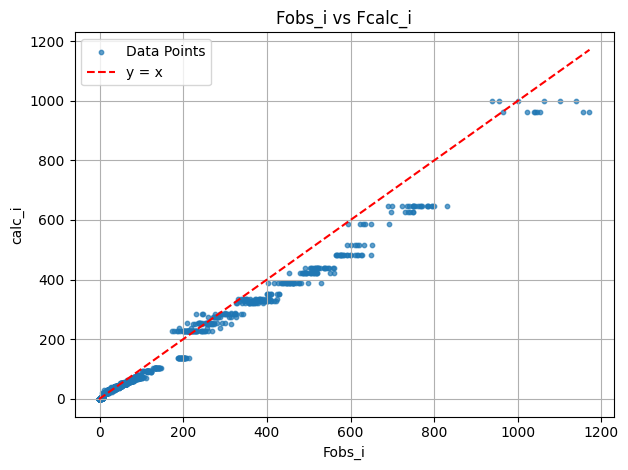

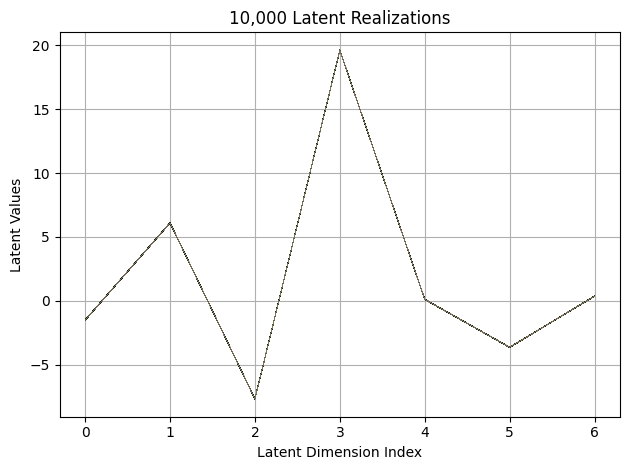

First 10 latent vectors from the VAE:
Sample 1: [-1.5227359533309937, 6.102052688598633, -7.690688133239746, 19.641077041625977, 0.10167431086301804, -3.6522939205169678, 0.3414071798324585]
Sample 2: [-1.5326400995254517, 6.103808403015137, -7.689455032348633, 19.625606536865234, 0.1059895008802414, -3.650813341140747, 0.3513953685760498]
Sample 3: [-1.523622751235962, 6.095839977264404, -7.694753646850586, 19.631528854370117, 0.11318878084421158, -3.6430611610412598, 0.35468703508377075]
Sample 4: [-1.5227843523025513, 6.091349124908447, -7.70672082901001, 19.626720428466797, 0.09932611137628555, -3.65085768699646, 0.35638052225112915]
Sample 5: [-1.5400996208190918, 6.079344272613525, -7.68319845199585, 19.642810821533203, 0.10537835955619812, -3.6350319385528564, 0.3520623743534088]
Sample 6: [-1.5114942789077759, 6.099600791931152, -7.681781768798828, 19.628568649291992, 0.10369768738746643, -3.6531527042388916, 0.3583412170410156]
Sample 7: [-1.5145280361175537, 6.093071460723877

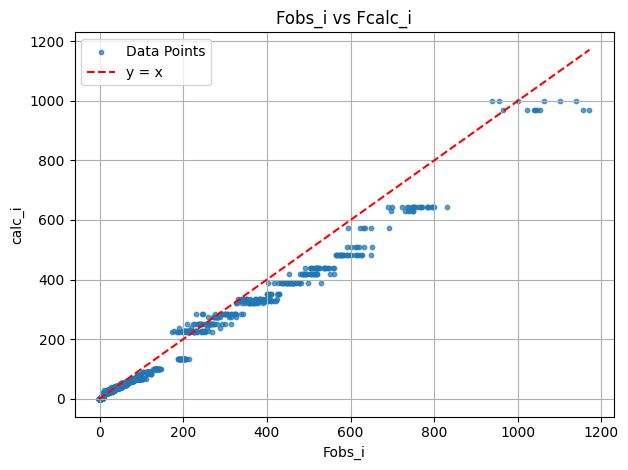

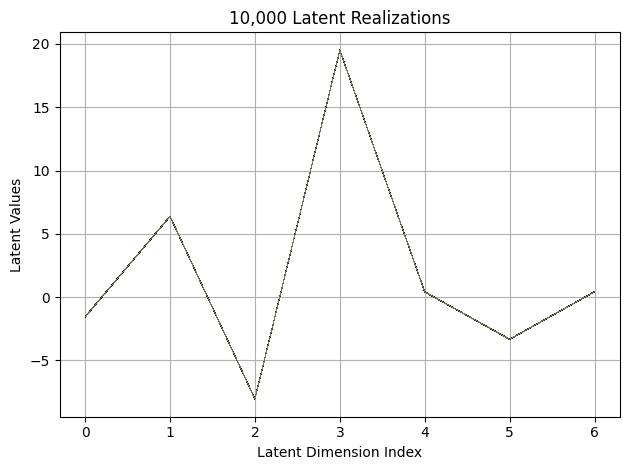

First 10 latent vectors from the VAE:
Sample 1: [-1.5577740669250488, 6.390645980834961, -8.037980079650879, 19.519500732421875, 0.40958961844444275, -3.3234333992004395, 0.4295368492603302]
Sample 2: [-1.5545064210891724, 6.379709243774414, -8.034383773803711, 19.521188735961914, 0.4182173013687134, -3.326629877090454, 0.4380294978618622]
Sample 3: [-1.539264440536499, 6.389586448669434, -8.041055679321289, 19.522306442260742, 0.4127424955368042, -3.3240156173706055, 0.4272843897342682]
Sample 4: [-1.5494049787521362, 6.378251552581787, -8.028642654418945, 19.508817672729492, 0.4288698434829712, -3.326464891433716, 0.43725156784057617]
Sample 5: [-1.5558918714523315, 6.390821933746338, -8.038946151733398, 19.521570205688477, 0.4259425699710846, -3.326367139816284, 0.41593003273010254]
Sample 6: [-1.5544002056121826, 6.378692626953125, -8.035655975341797, 19.522661209106445, 0.40734678506851196, -3.330010414123535, 0.4304049611091614]
Sample 7: [-1.56190025806427, 6.382113933563232, -8

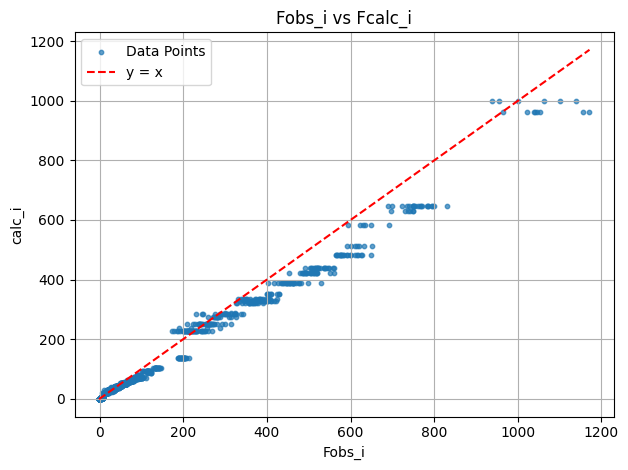

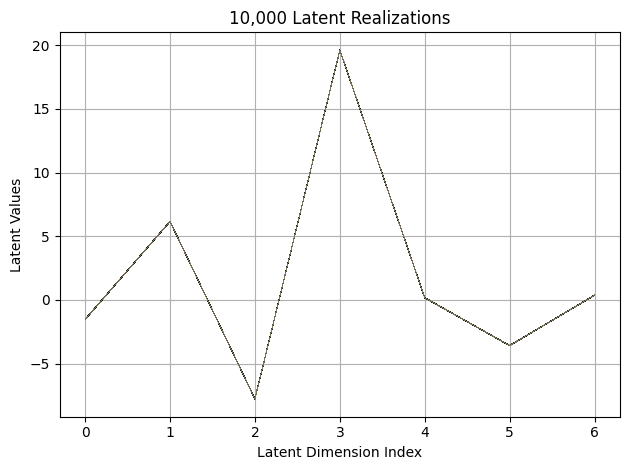

First 10 latent vectors from the VAE:
Sample 1: [-1.514809012413025, 6.170970439910889, -7.758103847503662, 19.614715576171875, 0.16029249131679535, -3.574842929840088, 0.35844874382019043]
Sample 2: [-1.5255416631698608, 6.1595778465271, -7.766476154327393, 19.602235794067383, 0.1694340854883194, -3.5765364170074463, 0.36973506212234497]
Sample 3: [-1.5281859636306763, 6.150939464569092, -7.762540340423584, 19.606464385986328, 0.168716698884964, -3.5848276615142822, 0.36860209703445435]
Sample 4: [-1.529184341430664, 6.161605358123779, -7.771470069885254, 19.60488510131836, 0.16641978919506073, -3.5782980918884277, 0.36952027678489685]
Sample 5: [-1.531300663948059, 6.165340900421143, -7.774284362792969, 19.611330032348633, 0.17889589071273804, -3.5745303630828857, 0.3677211403846741]
Sample 6: [-1.5230419635772705, 6.1569671630859375, -7.755889892578125, 19.60643768310547, 0.17596016824245453, -3.5862362384796143, 0.37593358755111694]
Sample 7: [-1.5351710319519043, 6.154222965240478

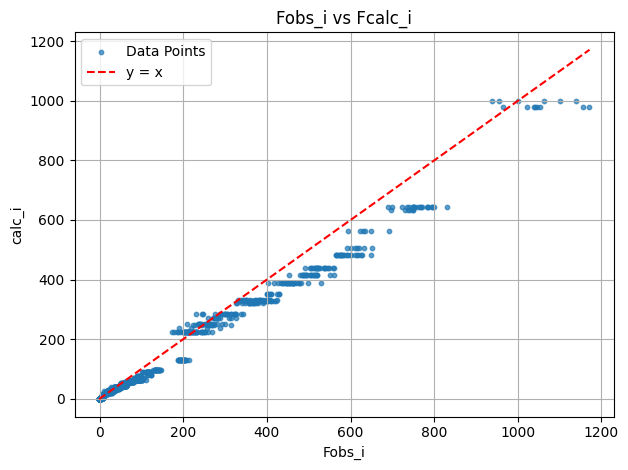

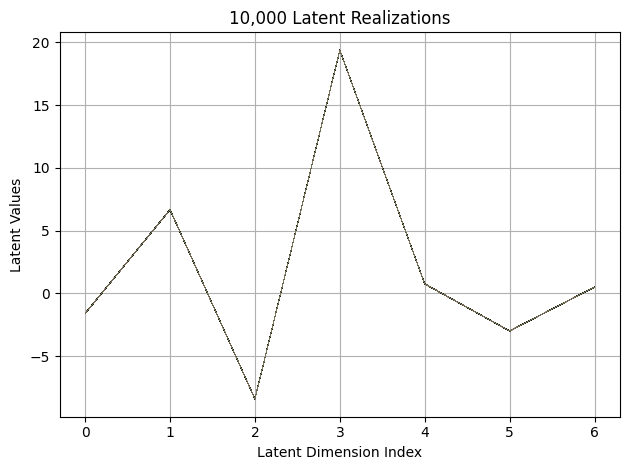

First 10 latent vectors from the VAE:
Sample 1: [-1.5926790237426758, 6.667555809020996, -8.416275024414062, 19.38971519470215, 0.760998547077179, -2.995471954345703, 0.49657726287841797]
Sample 2: [-1.605617642402649, 6.6809000968933105, -8.408443450927734, 19.375703811645508, 0.7660490870475769, -2.987483263015747, 0.512638509273529]
Sample 3: [-1.5904765129089355, 6.669592380523682, -8.416923522949219, 19.384279251098633, 0.7511559128761292, -2.9992964267730713, 0.510026752948761]
Sample 4: [-1.5993956327438354, 6.677734851837158, -8.409423828125, 19.396636962890625, 0.7617389559745789, -2.990856409072876, 0.5047206282615662]
Sample 5: [-1.5966383218765259, 6.678399562835693, -8.404656410217285, 19.372255325317383, 0.7586587071418762, -2.9864509105682373, 0.5103470087051392]
Sample 6: [-1.593202829360962, 6.67439079284668, -8.407357215881348, 19.387895584106445, 0.7529235482215881, -3.002401113510132, 0.5114287734031677]
Sample 7: [-1.6005290746688843, 6.678958892822266, -8.40131473

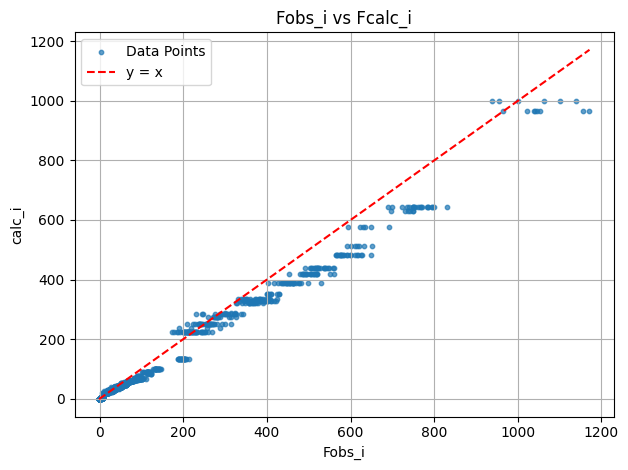

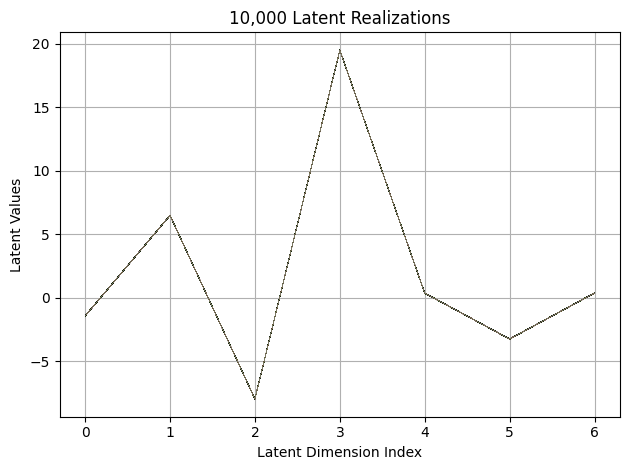

First 10 latent vectors from the VAE:
Sample 1: [-1.421973466873169, 6.481328010559082, -7.965206146240234, 19.501474380493164, 0.36618486046791077, -3.2576067447662354, 0.3690556287765503]
Sample 2: [-1.418076992034912, 6.48308801651001, -7.979920864105225, 19.493942260742188, 0.3654623031616211, -3.2499196529388428, 0.39103955030441284]
Sample 3: [-1.4295806884765625, 6.484980583190918, -7.965831279754639, 19.482465744018555, 0.36268478631973267, -3.249673366546631, 0.383173406124115]
Sample 4: [-1.4200387001037598, 6.491892337799072, -7.955496788024902, 19.487571716308594, 0.35955527424812317, -3.244097948074341, 0.38956862688064575]
Sample 5: [-1.434981107711792, 6.474878787994385, -7.960155010223389, 19.496341705322266, 0.36799460649490356, -3.2525527477264404, 0.3790050745010376]
Sample 6: [-1.432173252105713, 6.4984564781188965, -7.973825931549072, 19.510887145996094, 0.3622483015060425, -3.237147808074951, 0.3738187253475189]
Sample 7: [-1.425492286682129, 6.466405868530273, -7

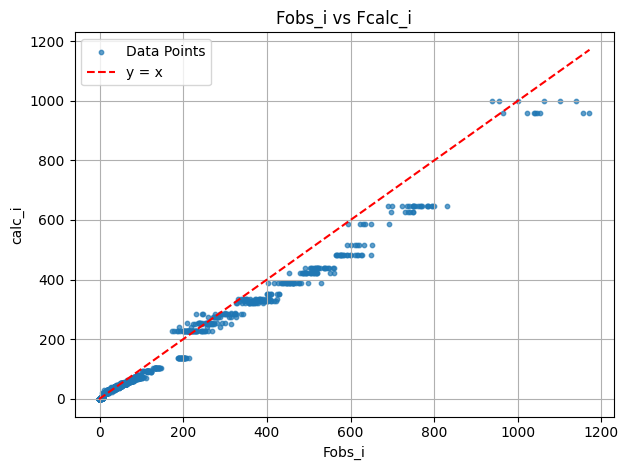

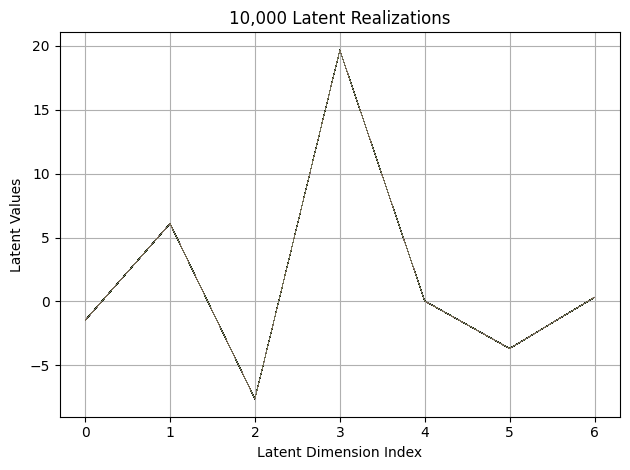

First 10 latent vectors from the VAE:
Sample 1: [-1.4850094318389893, 6.077864170074463, -7.604945182800293, 19.654783248901367, 0.04399693012237549, -3.6694161891937256, 0.3158005177974701]
Sample 2: [-1.4691271781921387, 6.079895973205566, -7.6133198738098145, 19.64743995666504, 0.04829872399568558, -3.6833252906799316, 0.33465272188186646]
Sample 3: [-1.474680781364441, 6.07971715927124, -7.621145725250244, 19.649124145507812, 0.03859160467982292, -3.672565460205078, 0.32505664229393005]
Sample 4: [-1.4716845750808716, 6.084007740020752, -7.616096019744873, 19.64970588684082, 0.04117263853549957, -3.656737804412842, 0.3329175114631653]
Sample 5: [-1.4689531326293945, 6.078880786895752, -7.6125946044921875, 19.64889144897461, 0.03804238140583038, -3.6869192123413086, 0.31889772415161133]
Sample 6: [-1.4736640453338623, 6.079614162445068, -7.61522912979126, 19.637537002563477, 0.050351958721876144, -3.6723804473876953, 0.30791446566581726]
Sample 7: [-1.4747995138168335, 6.08197546005

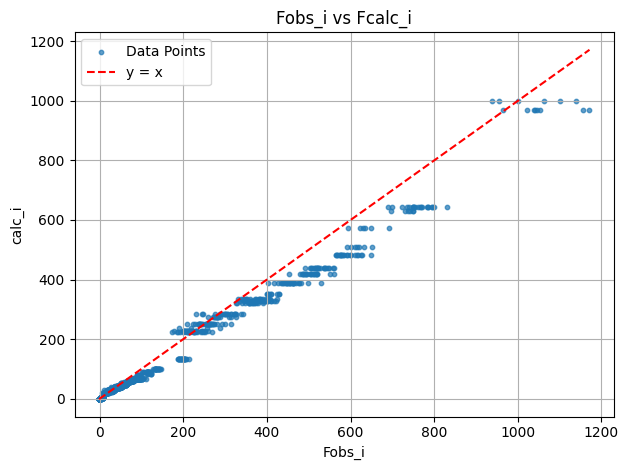

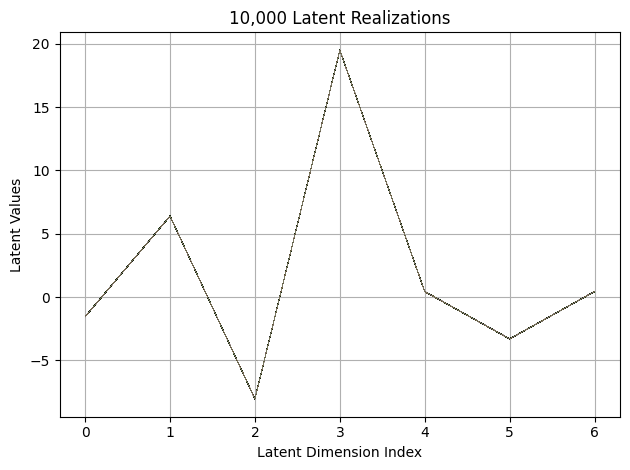

First 10 latent vectors from the VAE:
Sample 1: [-1.5487406253814697, 6.39497709274292, -8.048996925354004, 19.512001037597656, 0.43200403451919556, -3.302067995071411, 0.4266039729118347]
Sample 2: [-1.5624135732650757, 6.40024995803833, -8.044991493225098, 19.51172637939453, 0.4351502060890198, -3.3205435276031494, 0.4330649971961975]
Sample 3: [-1.5515292882919312, 6.407626628875732, -8.045187950134277, 19.507320404052734, 0.4223688542842865, -3.3056697845458984, 0.4231093227863312]
Sample 4: [-1.5421605110168457, 6.396269798278809, -8.05700397491455, 19.49862289428711, 0.43371257185935974, -3.314847707748413, 0.4384419322013855]
Sample 5: [-1.5521332025527954, 6.393527984619141, -8.045296669006348, 19.49891471862793, 0.4276929795742035, -3.3154337406158447, 0.425563246011734]
Sample 6: [-1.556755542755127, 6.392099380493164, -8.05173110961914, 19.50828742980957, 0.4404837489128113, -3.3187572956085205, 0.43513503670692444]
Sample 7: [-1.5493757724761963, 6.392377853393555, -8.04617

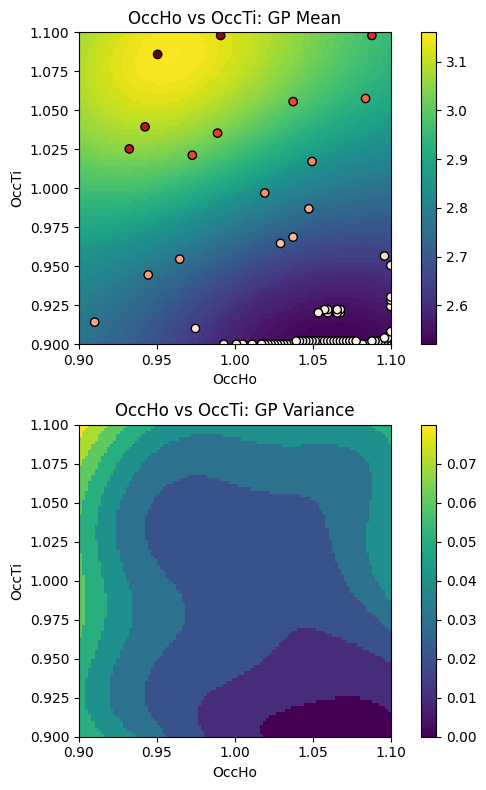

EI: [0.00849092 0.00833808 0.00819767 ... 0.00029981 0.00034607 0.00039977]
Function eval #110
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9020201563835144, 1.0858585834503174]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4171
initial chi^2 2.0254e+06 with 2596 obs.
New scale: 0.4160
Cycle 0: 0.83s, Chi**2: 4.0635e+05 for 2596 obs., Lambda: 0,  Delta: 0.799, SVD=0
New scale: 0.4160
Maximum shift/esd = -258.830 for all cycles
Read from fi

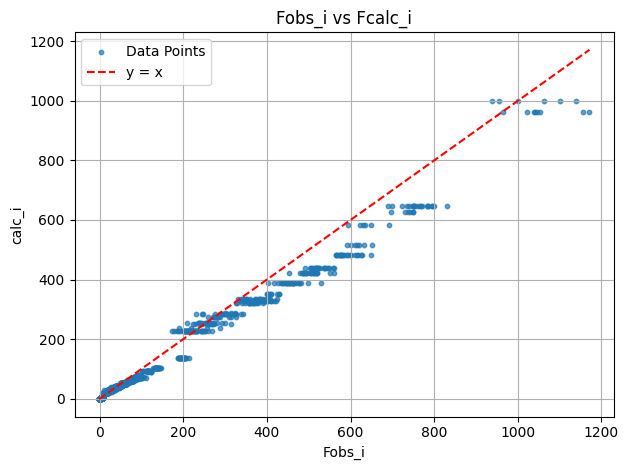

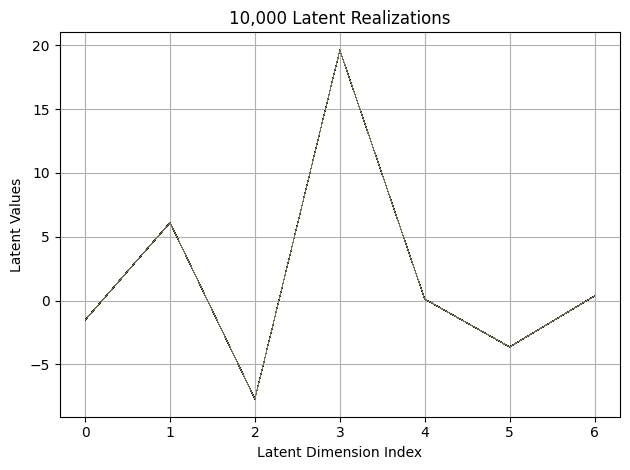

First 10 latent vectors from the VAE:
Sample 1: [-1.5228776931762695, 6.1025824546813965, -7.699606895446777, 19.625139236450195, 0.1249932274222374, -3.6355953216552734, 0.3594224452972412]
Sample 2: [-1.523913860321045, 6.1223530769348145, -7.701998233795166, 19.625795364379883, 0.1269284337759018, -3.626526355743408, 0.37007492780685425]
Sample 3: [-1.5098726749420166, 6.110954284667969, -7.702693939208984, 19.62404441833496, 0.12392540276050568, -3.631822109222412, 0.35407114028930664]
Sample 4: [-1.5289112329483032, 6.099563121795654, -7.697656631469727, 19.619882583618164, 0.1254577934741974, -3.640989065170288, 0.35822680592536926]
Sample 5: [-1.5300112962722778, 6.112128257751465, -7.71359920501709, 19.63875389099121, 0.11360163986682892, -3.633291006088257, 0.35223445296287537]
Sample 6: [-1.5255825519561768, 6.119521141052246, -7.699813365936279, 19.6143798828125, 0.11109483242034912, -3.64612078666687, 0.35647425055503845]
Sample 7: [-1.5279279947280884, 6.1056952476501465, 

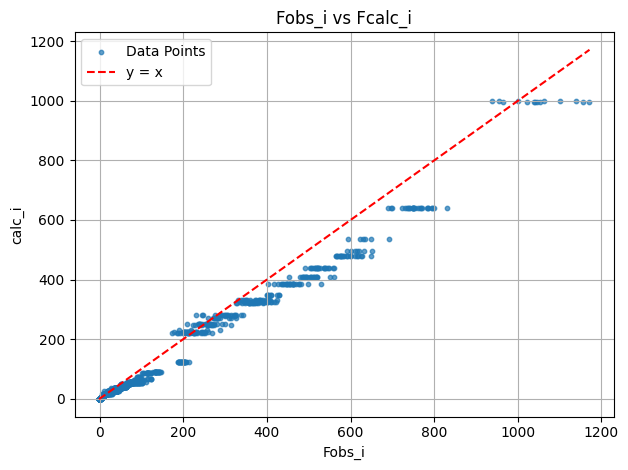

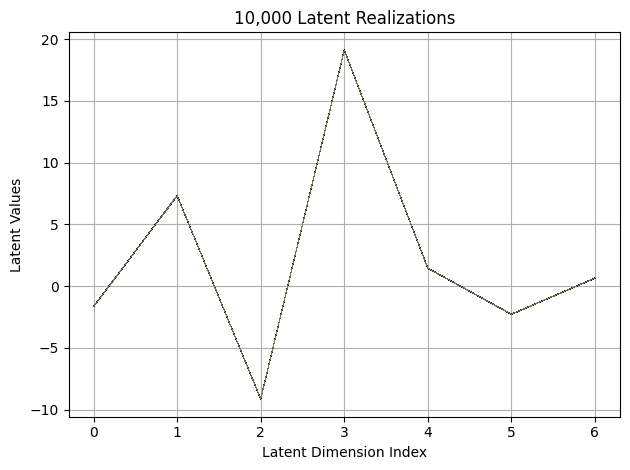

First 10 latent vectors from the VAE:
Sample 1: [-1.650173306465149, 7.330195903778076, -9.139799118041992, 19.106304168701172, 1.4536590576171875, -2.2736997604370117, 0.6421104669570923]
Sample 2: [-1.6434565782546997, 7.331689357757568, -9.145576477050781, 19.122421264648438, 1.4525363445281982, -2.276370048522949, 0.64652019739151]
Sample 3: [-1.6458858251571655, 7.317440986633301, -9.127873420715332, 19.127256393432617, 1.4584630727767944, -2.2792255878448486, 0.6460587978363037]
Sample 4: [-1.656707763671875, 7.323230743408203, -9.12661075592041, 19.12588882446289, 1.457682490348816, -2.2729034423828125, 0.6554717421531677]
Sample 5: [-1.6510812044143677, 7.331928253173828, -9.14181137084961, 19.117786407470703, 1.451409101486206, -2.278726100921631, 0.6477521657943726]
Sample 6: [-1.658413290977478, 7.328845500946045, -9.126606941223145, 19.129249572753906, 1.4624557495117188, -2.2723491191864014, 0.6423184275627136]
Sample 7: [-1.66178560256958, 7.329363822937012, -9.1346797943

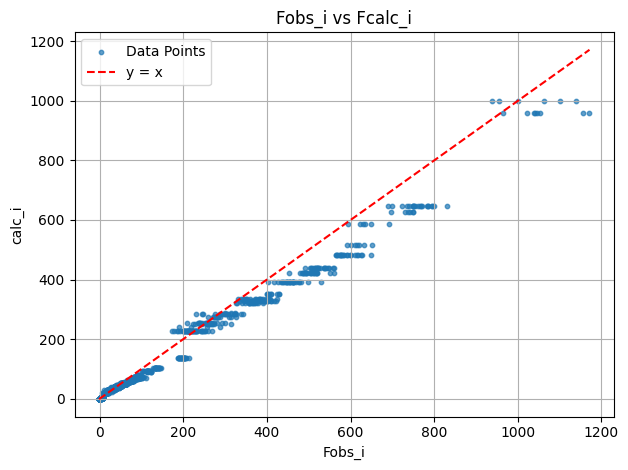

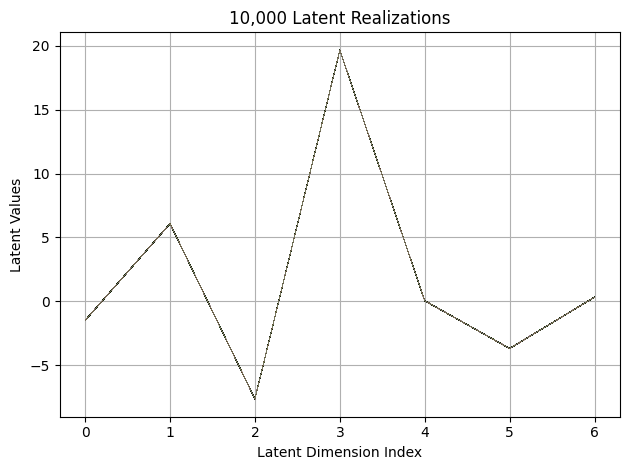

First 10 latent vectors from the VAE:
Sample 1: [-1.4901909828186035, 6.083498477935791, -7.638657093048096, 19.64811897277832, 0.05455515533685684, -3.6883676052093506, 0.32083675265312195]
Sample 2: [-1.482391119003296, 6.083874702453613, -7.614398002624512, 19.654457092285156, 0.06403032690286636, -3.6782169342041016, 0.32753118872642517]
Sample 3: [-1.487291693687439, 6.081677436828613, -7.628894329071045, 19.643991470336914, 0.05342947691679001, -3.683363437652588, 0.3222574293613434]
Sample 4: [-1.4901021718978882, 6.0948686599731445, -7.619747638702393, 19.64792823791504, 0.06197959929704666, -3.671062469482422, 0.32975807785987854]
Sample 5: [-1.4848251342773438, 6.081830024719238, -7.619702339172363, 19.63751220703125, 0.046370361000299454, -3.6878488063812256, 0.33964940905570984]
Sample 6: [-1.4761818647384644, 6.077450275421143, -7.627553462982178, 19.633255004882812, 0.047567855566740036, -3.674433946609497, 0.3363453447818756]
Sample 7: [-1.4791572093963623, 6.08457374572

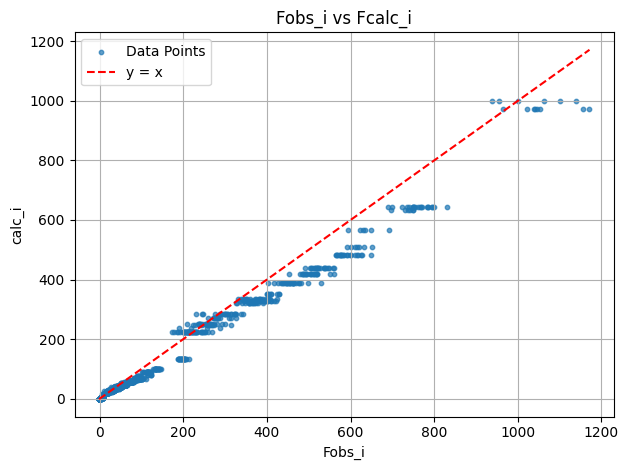

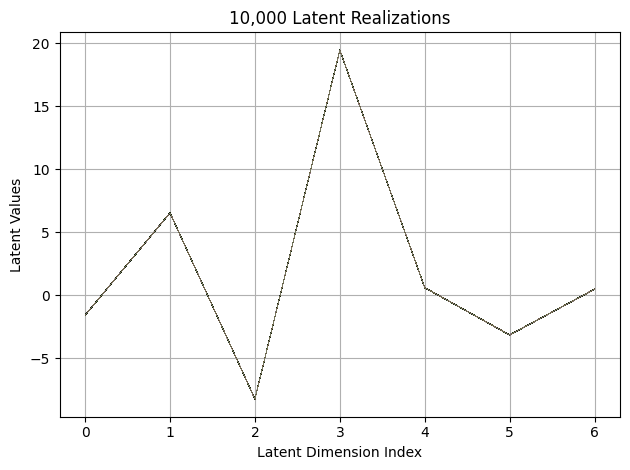

First 10 latent vectors from the VAE:
Sample 1: [-1.5858054161071777, 6.5261688232421875, -8.241815567016602, 19.451435089111328, 0.6084445714950562, -3.157736301422119, 0.4659818708896637]
Sample 2: [-1.5725111961364746, 6.533081531524658, -8.22984790802002, 19.448963165283203, 0.5819993615150452, -3.1495585441589355, 0.4805000126361847]
Sample 3: [-1.5896633863449097, 6.527613162994385, -8.233071327209473, 19.436513900756836, 0.5888987183570862, -3.1615567207336426, 0.47252586483955383]
Sample 4: [-1.5764213800430298, 6.532042503356934, -8.226149559020996, 19.4554500579834, 0.5942729115486145, -3.1457929611206055, 0.4717336595058441]
Sample 5: [-1.5865944623947144, 6.531124591827393, -8.223641395568848, 19.449777603149414, 0.5962254405021667, -3.145766019821167, 0.4748787581920624]
Sample 6: [-1.582093596458435, 6.537754535675049, -8.23466682434082, 19.449996948242188, 0.5877026319503784, -3.150398015975952, 0.47191137075424194]
Sample 7: [-1.5791566371917725, 6.522292613983154, -8.2

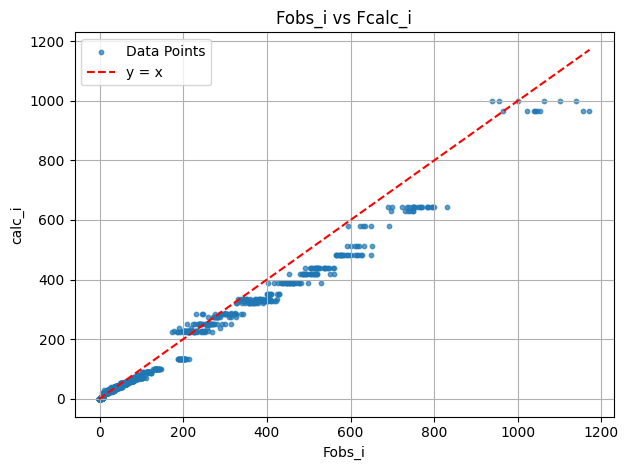

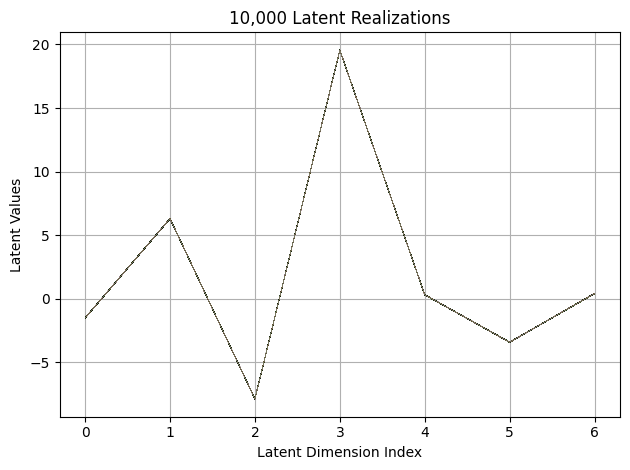

First 10 latent vectors from the VAE:
Sample 1: [-1.5317723751068115, 6.2733001708984375, -7.901340007781982, 19.560222625732422, 0.2950495183467865, -3.431915044784546, 0.38839614391326904]
Sample 2: [-1.5279961824417114, 6.276675701141357, -7.898864269256592, 19.553512573242188, 0.2975090444087982, -3.439216136932373, 0.3922957181930542]
Sample 3: [-1.5353831052780151, 6.285451412200928, -7.898679733276367, 19.553852081298828, 0.2828313410282135, -3.4241068363189697, 0.3970099985599518]
Sample 4: [-1.5134634971618652, 6.299283504486084, -7.902216911315918, 19.555721282958984, 0.3023935854434967, -3.436922311782837, 0.40416836738586426]
Sample 5: [-1.5279223918914795, 6.291555404663086, -7.888662815093994, 19.555099487304688, 0.3052698075771332, -3.430128574371338, 0.4117644131183624]
Sample 6: [-1.5357378721237183, 6.300361156463623, -7.895148754119873, 19.55403709411621, 0.2648257911205292, -3.4503605365753174, 0.40048328042030334]
Sample 7: [-1.5358105897903442, 6.291319370269775, 

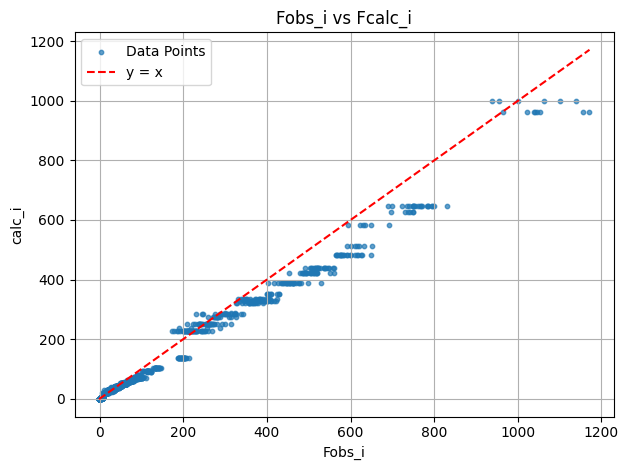

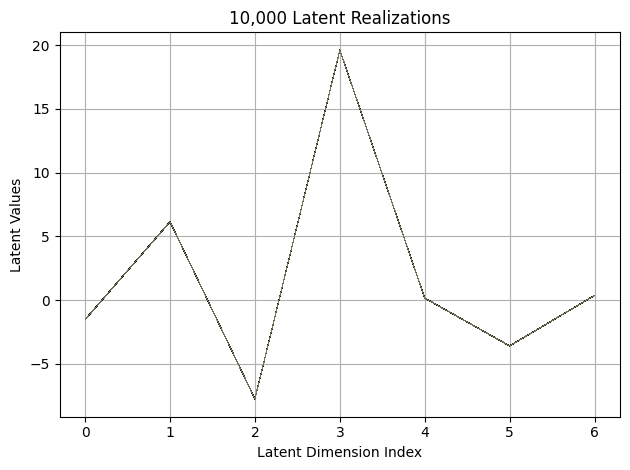

First 10 latent vectors from the VAE:
Sample 1: [-1.5239630937576294, 6.148045063018799, -7.742770671844482, 19.612693786621094, 0.15654213726520538, -3.5854766368865967, 0.3607315719127655]
Sample 2: [-1.516846776008606, 6.151428699493408, -7.743533134460449, 19.607460021972656, 0.15316984057426453, -3.5901973247528076, 0.3691684603691101]
Sample 3: [-1.529872179031372, 6.136293888092041, -7.758636474609375, 19.60528564453125, 0.15854471921920776, -3.6022214889526367, 0.37315139174461365]
Sample 4: [-1.5285723209381104, 6.15398645401001, -7.754385948181152, 19.610939025878906, 0.15871405601501465, -3.5929741859436035, 0.3700464069843292]
Sample 5: [-1.528652548789978, 6.145427703857422, -7.753269672393799, 19.609355926513672, 0.15150152146816254, -3.583294630050659, 0.3636534512042999]
Sample 6: [-1.5098222494125366, 6.147870063781738, -7.746582984924316, 19.614845275878906, 0.16025589406490326, -3.598176956176758, 0.37443822622299194]
Sample 7: [-1.5288642644882202, 6.150082111358643

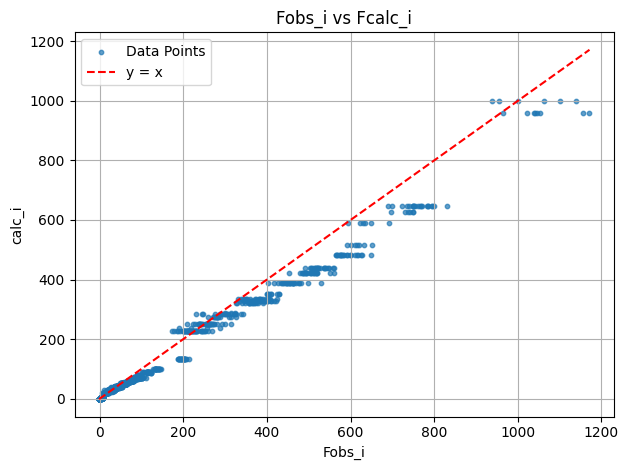

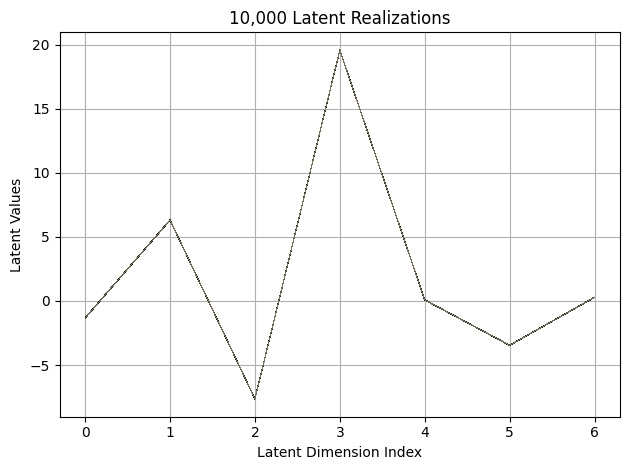

First 10 latent vectors from the VAE:
Sample 1: [-1.323074221611023, 6.305907249450684, -7.641064167022705, 19.59657096862793, 0.06583242863416672, -3.4522266387939453, 0.28410768508911133]
Sample 2: [-1.3281562328338623, 6.32460355758667, -7.641796112060547, 19.586584091186523, 0.08392832428216934, -3.456343412399292, 0.2945658564567566]
Sample 3: [-1.32400643825531, 6.3243184089660645, -7.644104957580566, 19.584136962890625, 0.0890311524271965, -3.4512200355529785, 0.2854871451854706]
Sample 4: [-1.3210551738739014, 6.330404281616211, -7.646469593048096, 19.596710205078125, 0.079923115670681, -3.454368829727173, 0.2764802575111389]
Sample 5: [-1.3291391134262085, 6.3119683265686035, -7.649344444274902, 19.594724655151367, 0.0879395455121994, -3.46437406539917, 0.2804306149482727]
Sample 6: [-1.3272616863250732, 6.320000171661377, -7.641019344329834, 19.589685440063477, 0.08608659356832504, -3.458034038543701, 0.2913195788860321]
Sample 7: [-1.3255964517593384, 6.317583084106445, -7.6

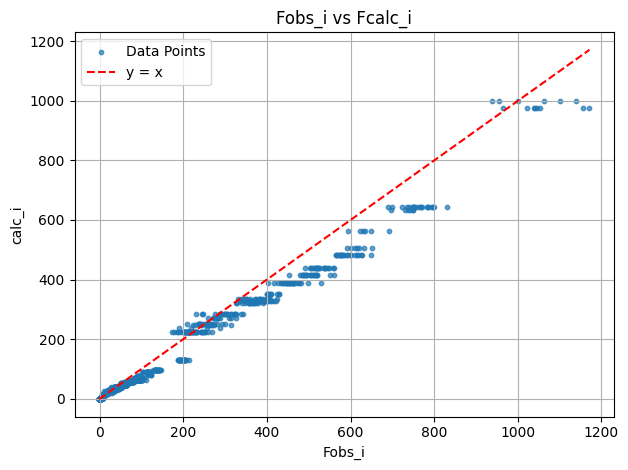

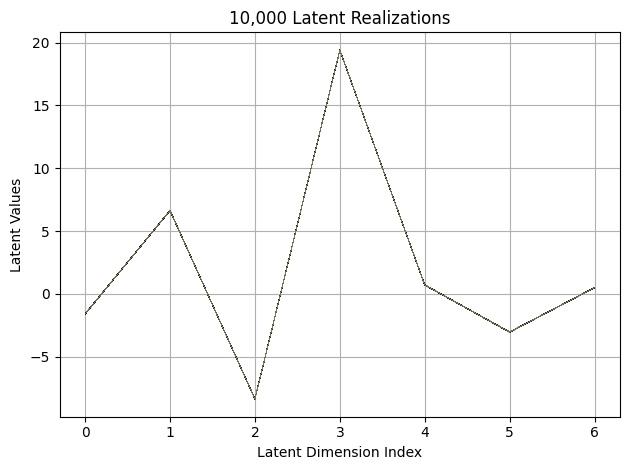

First 10 latent vectors from the VAE:
Sample 1: [-1.5809260606765747, 6.628237247467041, -8.354503631591797, 19.402740478515625, 0.7126386165618896, -3.046823501586914, 0.5001962184906006]
Sample 2: [-1.5946873426437378, 6.625708103179932, -8.367145538330078, 19.39668083190918, 0.7287071943283081, -3.0429091453552246, 0.5088216066360474]
Sample 3: [-1.5927488803863525, 6.6411027908325195, -8.364781379699707, 19.409648895263672, 0.7196103930473328, -3.035944938659668, 0.5119315385818481]
Sample 4: [-1.6063905954360962, 6.6328816413879395, -8.35919189453125, 19.41278076171875, 0.7060340642929077, -3.0443263053894043, 0.503514289855957]
Sample 5: [-1.5966633558273315, 6.62725830078125, -8.365484237670898, 19.409099578857422, 0.7136139869689941, -3.0377309322357178, 0.5046975612640381]
Sample 6: [-1.586726427078247, 6.63395357131958, -8.357717514038086, 19.394399642944336, 0.7153062224388123, -3.029024600982666, 0.5106824040412903]
Sample 7: [-1.604422926902771, 6.632095813751221, -8.36759

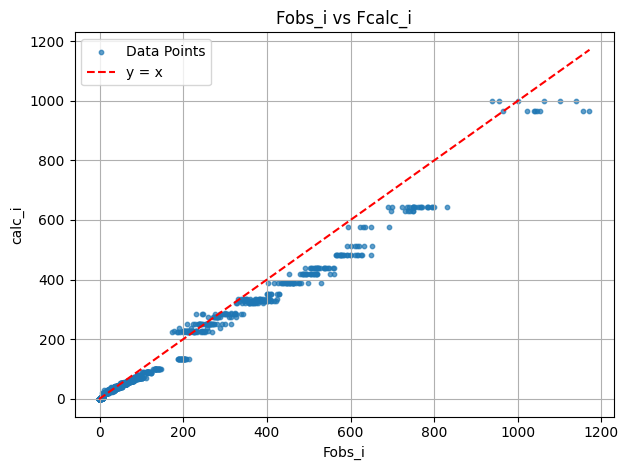

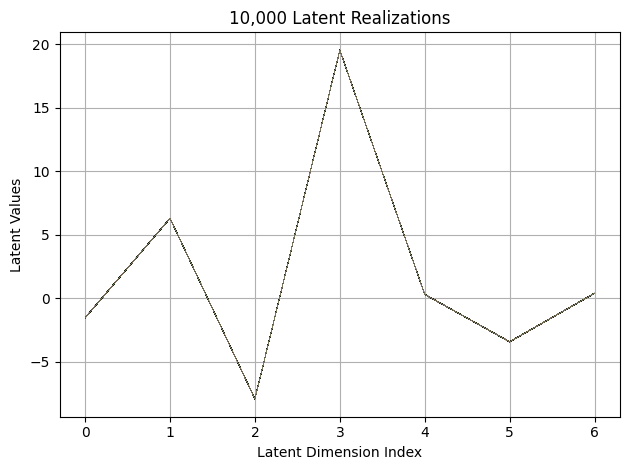

First 10 latent vectors from the VAE:
Sample 1: [-1.5323156118392944, 6.30148983001709, -7.914436340332031, 19.545692443847656, 0.3068634271621704, -3.42482590675354, 0.3871842324733734]
Sample 2: [-1.5142793655395508, 6.304921627044678, -7.920264720916748, 19.541900634765625, 0.3084144592285156, -3.411524772644043, 0.4036960303783417]
Sample 3: [-1.5310965776443481, 6.306406497955322, -7.928365707397461, 19.55133628845215, 0.3282873034477234, -3.4224305152893066, 0.4090949594974518]
Sample 4: [-1.5222548246383667, 6.293790817260742, -7.921932220458984, 19.555850982666016, 0.3112534284591675, -3.412163734436035, 0.39535239338874817]
Sample 5: [-1.5363849401474, 6.299804210662842, -7.912549018859863, 19.541372299194336, 0.3155663013458252, -3.4179248809814453, 0.407779723405838]
Sample 6: [-1.5202751159667969, 6.297478675842285, -7.924178600311279, 19.552047729492188, 0.2992633581161499, -3.4222304821014404, 0.39792877435684204]
Sample 7: [-1.5303254127502441, 6.289556980133057, -7.9168

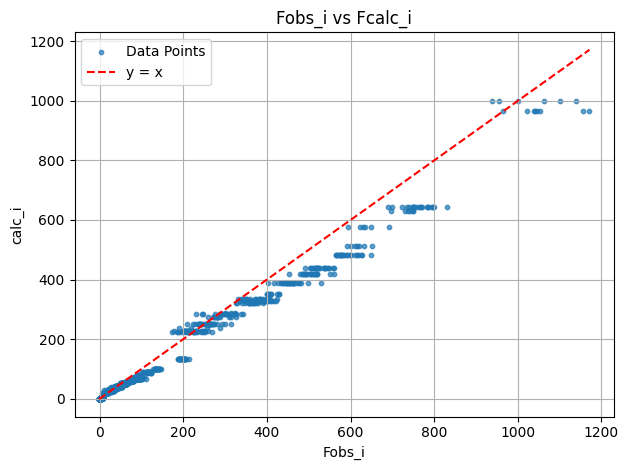

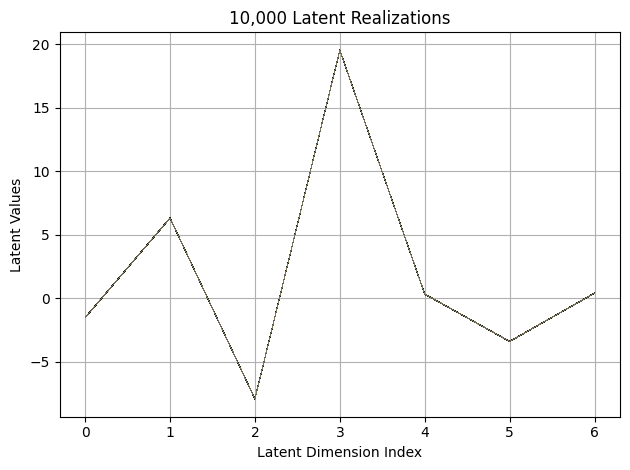

First 10 latent vectors from the VAE:
Sample 1: [-1.5268335342407227, 6.307181358337402, -7.924097537994385, 19.53574562072754, 0.31372880935668945, -3.410686731338501, 0.39935538172721863]
Sample 2: [-1.539153814315796, 6.32496452331543, -7.921677589416504, 19.54430389404297, 0.3232813775539398, -3.4079012870788574, 0.3933787941932678]
Sample 3: [-1.5248044729232788, 6.317693710327148, -7.924182891845703, 19.562469482421875, 0.3119252026081085, -3.401628255844116, 0.4107639491558075]
Sample 4: [-1.5224982500076294, 6.320634365081787, -7.934104919433594, 19.543014526367188, 0.3237316906452179, -3.407576560974121, 0.4164612591266632]
Sample 5: [-1.5209646224975586, 6.312638759613037, -7.9306321144104, 19.548521041870117, 0.32933780550956726, -3.407963275909424, 0.4069858491420746]
Sample 6: [-1.5208951234817505, 6.3092803955078125, -7.922024726867676, 19.53531265258789, 0.3222986161708832, -3.40099835395813, 0.403140664100647]
Sample 7: [-1.522699236869812, 6.316062927246094, -7.9360489

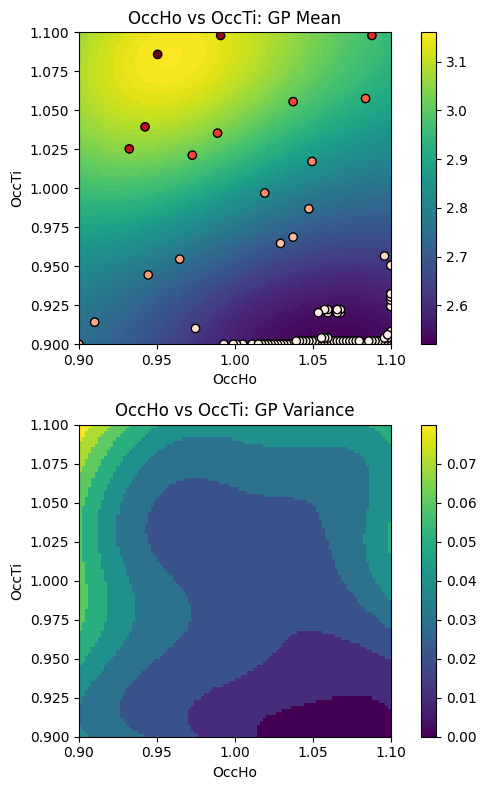

EI: [-1.00000000e+00  4.15604934e-03  4.09294851e-03 ...  3.25374538e-04
  3.75201460e-04  4.33046371e-04]
Function eval #120
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9020201563835144, 1.0838384628295898]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4184
initial chi^2 2.0075e+06 with 2596 obs.
New scale: 0.4175
Cycle 0: 0.92s, Chi**2: 4.0497e+05 for 2596 obs., Lambda: 0,  Delta: 0.798, SVD=0
New scale: 0.4175
Maximum shift/esd = -257.

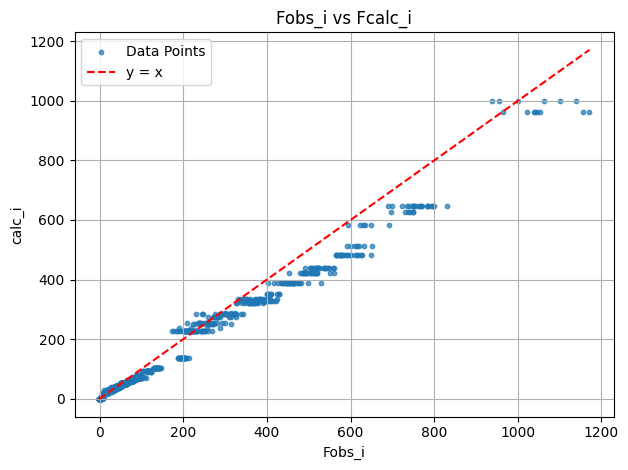

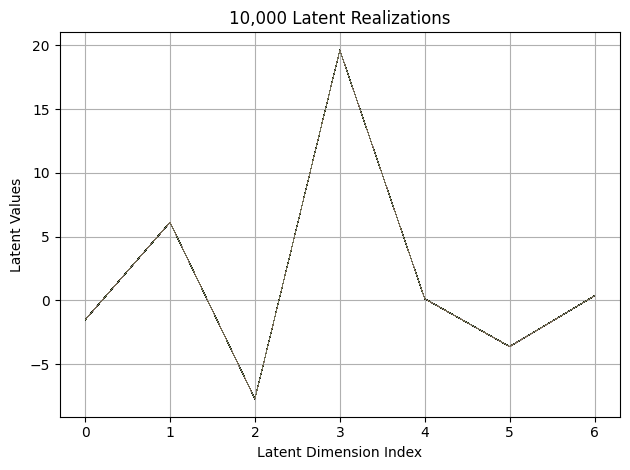

First 10 latent vectors from the VAE:
Sample 1: [-1.5377713441848755, 6.118906021118164, -7.7281389236450195, 19.617431640625, 0.14054381847381592, -3.6156623363494873, 0.36262306571006775]
Sample 2: [-1.529758334159851, 6.127248287200928, -7.7223100662231445, 19.62569236755371, 0.13397951424121857, -3.614731550216675, 0.356631338596344]
Sample 3: [-1.5241241455078125, 6.124544620513916, -7.733500003814697, 19.625232696533203, 0.13715077936649323, -3.6169326305389404, 0.35655677318573]
Sample 4: [-1.5159536600112915, 6.115060806274414, -7.725520133972168, 19.627656936645508, 0.14405032992362976, -3.6278839111328125, 0.3639879524707794]
Sample 5: [-1.5244314670562744, 6.121545314788818, -7.724374294281006, 19.62247085571289, 0.12945960462093353, -3.625134229660034, 0.3576483726501465]
Sample 6: [-1.515586256980896, 6.1327409744262695, -7.730237007141113, 19.616878509521484, 0.12096595764160156, -3.6204450130462646, 0.364940881729126]
Sample 7: [-1.5368857383728027, 6.116335868835449, -7

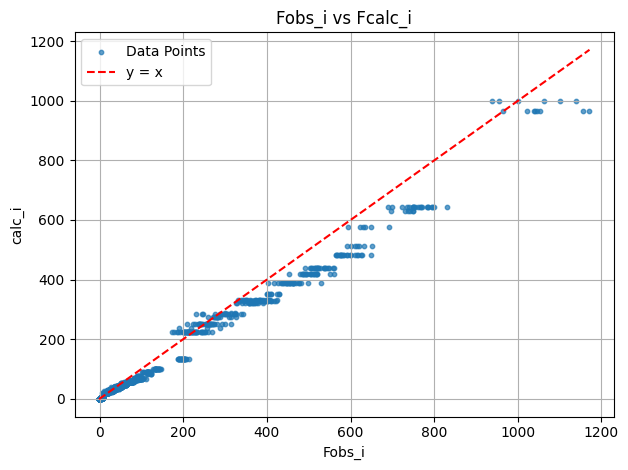

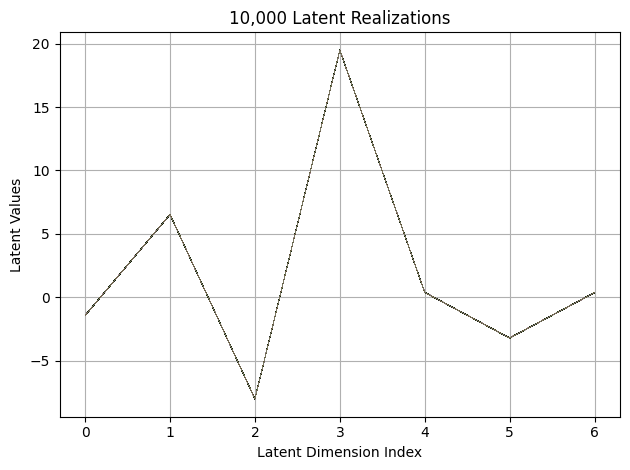

First 10 latent vectors from the VAE:
Sample 1: [-1.4193525314331055, 6.514313220977783, -7.990361213684082, 19.480607986450195, 0.4007563591003418, -3.2068443298339844, 0.38423603773117065]
Sample 2: [-1.4206881523132324, 6.530550003051758, -7.999875545501709, 19.487661361694336, 0.3999773859977722, -3.196251153945923, 0.37960824370384216]
Sample 3: [-1.4199033975601196, 6.5187578201293945, -7.995283126831055, 19.482410430908203, 0.39589744806289673, -3.207042694091797, 0.38527020812034607]
Sample 4: [-1.4230502843856812, 6.517222881317139, -7.996983051300049, 19.480289459228516, 0.3848327398300171, -3.1937167644500732, 0.3820570707321167]
Sample 5: [-1.4291179180145264, 6.5151567459106445, -7.992156028747559, 19.49357795715332, 0.384061336517334, -3.197362184524536, 0.37497586011886597]
Sample 6: [-1.4148623943328857, 6.533843517303467, -7.987604141235352, 19.471519470214844, 0.3988457918167114, -3.196697473526001, 0.38019096851348877]
Sample 7: [-1.4131767749786377, 6.53167819976806

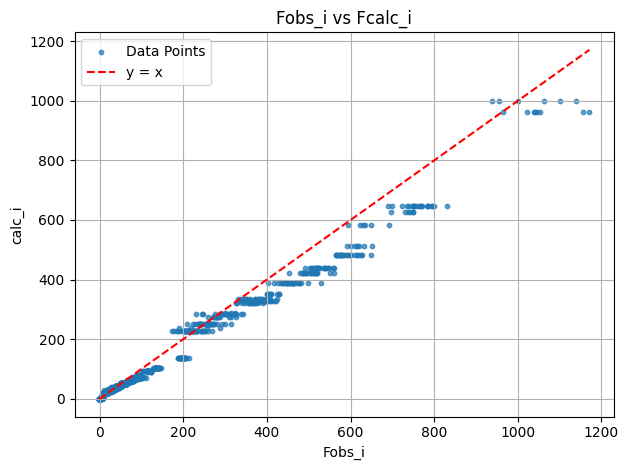

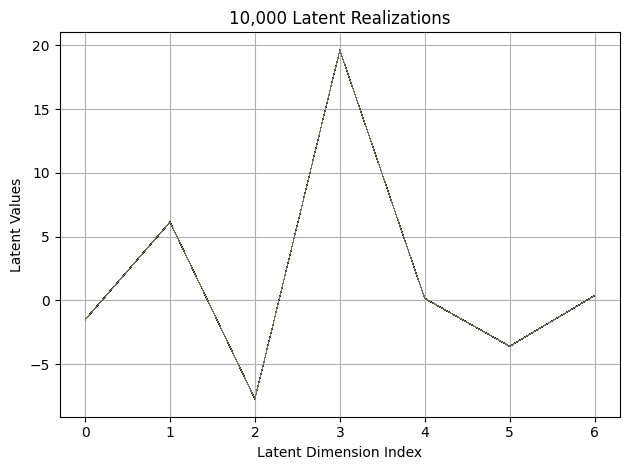

First 10 latent vectors from the VAE:
Sample 1: [-1.5258644819259644, 6.1353044509887695, -7.74057149887085, 19.617605209350586, 0.13571791350841522, -3.6100356578826904, 0.3603816330432892]
Sample 2: [-1.523929238319397, 6.13295316696167, -7.737245559692383, 19.61008644104004, 0.14625981450080872, -3.6058521270751953, 0.3517913818359375]
Sample 3: [-1.5333775281906128, 6.152538776397705, -7.74098014831543, 19.61541748046875, 0.14207670092582703, -3.6104891300201416, 0.3732284903526306]
Sample 4: [-1.5357533693313599, 6.119154453277588, -7.738158702850342, 19.61972999572754, 0.1487240046262741, -3.606365442276001, 0.3736051917076111]
Sample 5: [-1.5202858448028564, 6.143078804016113, -7.738818168640137, 19.608867645263672, 0.1425967514514923, -3.6047134399414062, 0.3742844760417938]
Sample 6: [-1.5348639488220215, 6.1439056396484375, -7.730078220367432, 19.62114715576172, 0.14600957930088043, -3.616604804992676, 0.35341086983680725]
Sample 7: [-1.5313879251480103, 6.1256890296936035, -

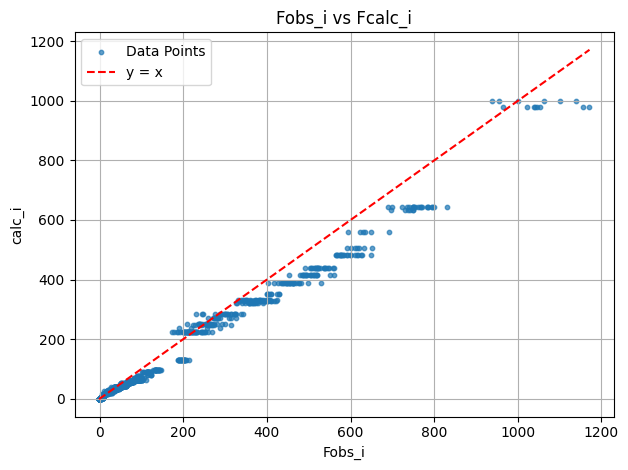

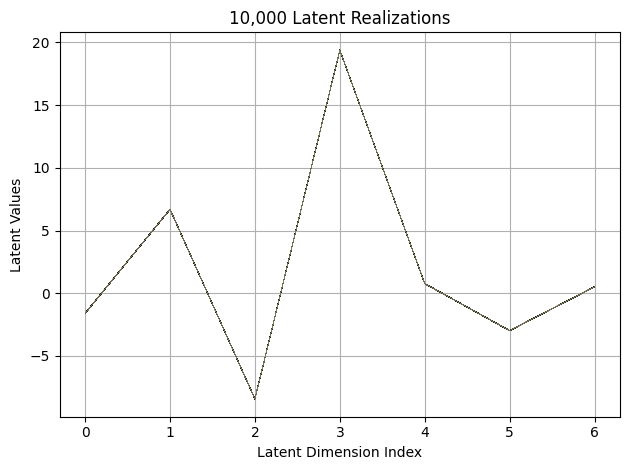

First 10 latent vectors from the VAE:
Sample 1: [-1.5911879539489746, 6.687941074371338, -8.42505168914795, 19.381568908691406, 0.7748737335205078, -2.9710853099823, 0.5106310248374939]
Sample 2: [-1.5963023900985718, 6.6851725578308105, -8.423685073852539, 19.372657775878906, 0.7712687849998474, -2.9842007160186768, 0.5085299015045166]
Sample 3: [-1.5967884063720703, 6.696183681488037, -8.42653751373291, 19.36995506286621, 0.780945897102356, -2.9680898189544678, 0.5092881321907043]
Sample 4: [-1.598958134651184, 6.687800407409668, -8.421965599060059, 19.384403228759766, 0.7777595520019531, -2.9802424907684326, 0.5032422542572021]
Sample 5: [-1.607702612876892, 6.693472862243652, -8.42083740234375, 19.372529983520508, 0.7798541784286499, -2.983382225036621, 0.5156428217887878]
Sample 6: [-1.5999459028244019, 6.692866802215576, -8.420675277709961, 19.381380081176758, 0.7815274000167847, -2.986984968185425, 0.4990184009075165]
Sample 7: [-1.606048345565796, 6.68477201461792, -8.426651000

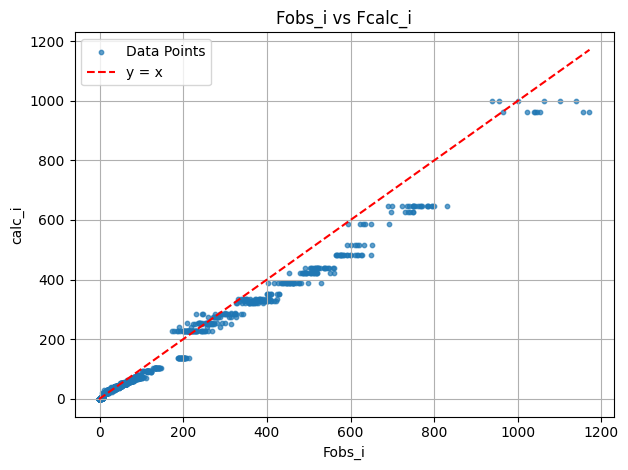

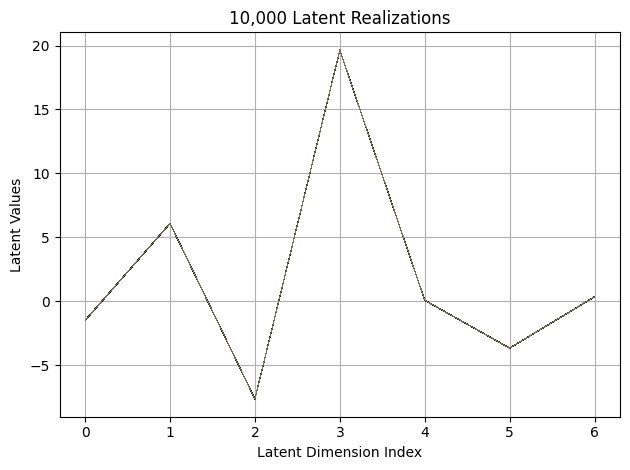

First 10 latent vectors from the VAE:
Sample 1: [-1.5122720003128052, 6.091711044311523, -7.647966384887695, 19.65981674194336, 0.07515647262334824, -3.6870107650756836, 0.33525732159614563]
Sample 2: [-1.5072383880615234, 6.08588981628418, -7.653717041015625, 19.651212692260742, 0.07633683830499649, -3.668957233428955, 0.3453816771507263]
Sample 3: [-1.5069940090179443, 6.087586879730225, -7.647919178009033, 19.64528465270996, 0.07061931490898132, -3.6631131172180176, 0.3466064929962158]
Sample 4: [-1.5078098773956299, 6.08324670791626, -7.663057327270508, 19.639408111572266, 0.06722983717918396, -3.6723294258117676, 0.3505030870437622]
Sample 5: [-1.4865697622299194, 6.091287136077881, -7.648963928222656, 19.65025520324707, 0.06709688156843185, -3.6754813194274902, 0.3494638204574585]
Sample 6: [-1.493605136871338, 6.0816216468811035, -7.650818347930908, 19.63766860961914, 0.0711735412478447, -3.67146372795105, 0.33742600679397583]
Sample 7: [-1.5000951290130615, 6.0790605545043945, 

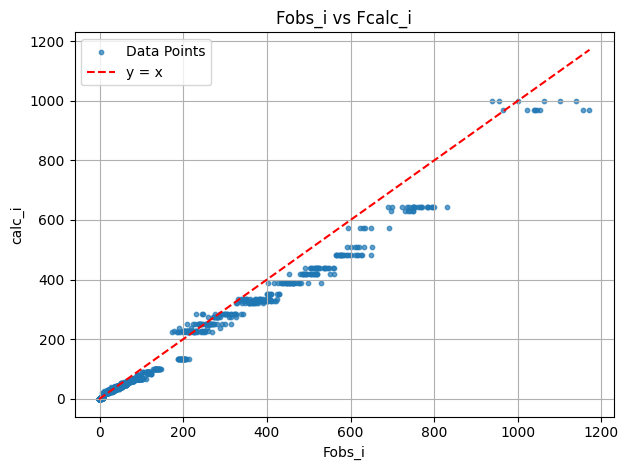

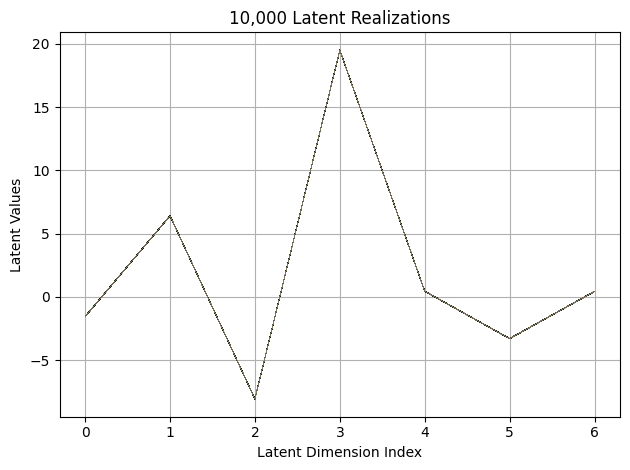

First 10 latent vectors from the VAE:
Sample 1: [-1.5452992916107178, 6.408840656280518, -8.069766998291016, 19.501976013183594, 0.4326401948928833, -3.291393995285034, 0.43376147747039795]
Sample 2: [-1.5534453392028809, 6.40506649017334, -8.05862808227539, 19.49482536315918, 0.4456285238265991, -3.305093765258789, 0.43169087171554565]
Sample 3: [-1.5627174377441406, 6.399518966674805, -8.06494426727295, 19.507959365844727, 0.4507797062397003, -3.2965047359466553, 0.4369685649871826]
Sample 4: [-1.5546728372573853, 6.419242858886719, -8.059111595153809, 19.493438720703125, 0.44756755232810974, -3.2886369228363037, 0.4294115900993347]
Sample 5: [-1.5468933582305908, 6.404751777648926, -8.06814193725586, 19.509763717651367, 0.4527992308139801, -3.285189390182495, 0.4407660663127899]
Sample 6: [-1.559842586517334, 6.410749435424805, -8.059102058410645, 19.506179809570312, 0.44312116503715515, -3.3031468391418457, 0.4323824644088745]
Sample 7: [-1.5605850219726562, 6.421224117279053, -8.0

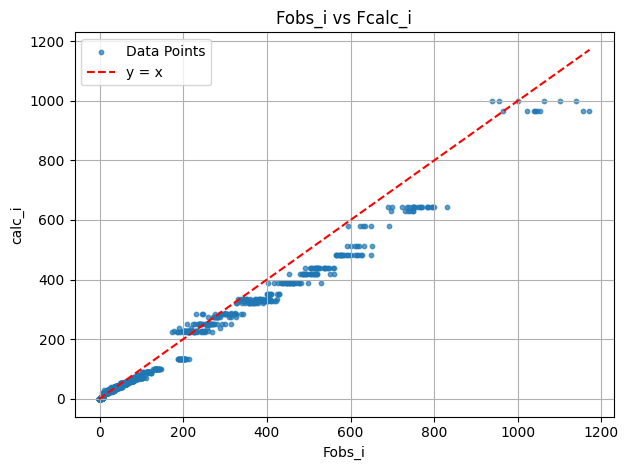

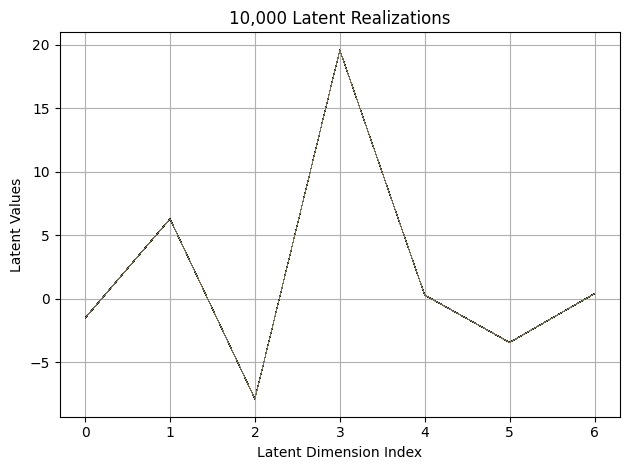

First 10 latent vectors from the VAE:
Sample 1: [-1.522325038909912, 6.271947383880615, -7.8911848068237305, 19.561710357666016, 0.28404948115348816, -3.4506726264953613, 0.38669902086257935]
Sample 2: [-1.5285615921020508, 6.266281604766846, -7.8939948081970215, 19.563283920288086, 0.27952349185943604, -3.453087329864502, 0.39459750056266785]
Sample 3: [-1.5192121267318726, 6.282561302185059, -7.893252849578857, 19.556949615478516, 0.2790158987045288, -3.4456119537353516, 0.38733482360839844]
Sample 4: [-1.5271576642990112, 6.272098064422607, -7.889155387878418, 19.56695556640625, 0.2777719795703888, -3.4553942680358887, 0.39193296432495117]
Sample 5: [-1.5212738513946533, 6.276640892028809, -7.888856410980225, 19.56183433532715, 0.29503723978996277, -3.4422595500946045, 0.3897759020328522]
Sample 6: [-1.540287733078003, 6.275871276855469, -7.883860111236572, 19.56058692932129, 0.2938539981842041, -3.4486513137817383, 0.389128178358078]
Sample 7: [-1.52791166305542, 6.265471935272217,

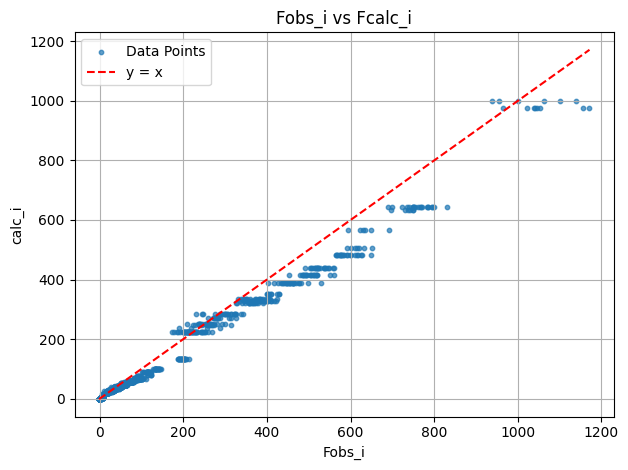

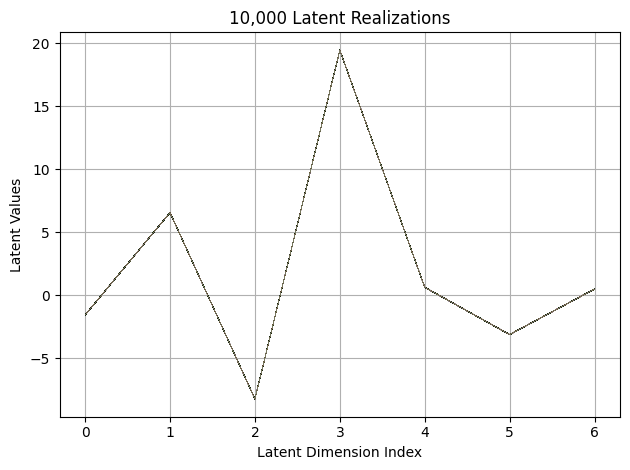

First 10 latent vectors from the VAE:
Sample 1: [-1.5840221643447876, 6.532670974731445, -8.243597984313965, 19.439319610595703, 0.6151542067527771, -3.1519761085510254, 0.47887444496154785]
Sample 2: [-1.5962178707122803, 6.5424652099609375, -8.247641563415527, 19.447481155395508, 0.6130750179290771, -3.1384894847869873, 0.48092684149742126]
Sample 3: [-1.5869395732879639, 6.5336527824401855, -8.258403778076172, 19.448434829711914, 0.6008086800575256, -3.1358745098114014, 0.4766402840614319]
Sample 4: [-1.5849448442459106, 6.539986610412598, -8.258410453796387, 19.4420166015625, 0.6195310354232788, -3.1364364624023438, 0.4724122881889343]
Sample 5: [-1.5851699113845825, 6.523502826690674, -8.237438201904297, 19.44270896911621, 0.6152552962303162, -3.1348841190338135, 0.47964954376220703]
Sample 6: [-1.5840476751327515, 6.532386779785156, -8.239690780639648, 19.44039535522461, 0.6092509627342224, -3.1465651988983154, 0.4820081889629364]
Sample 7: [-1.5892235040664673, 6.553735733032227

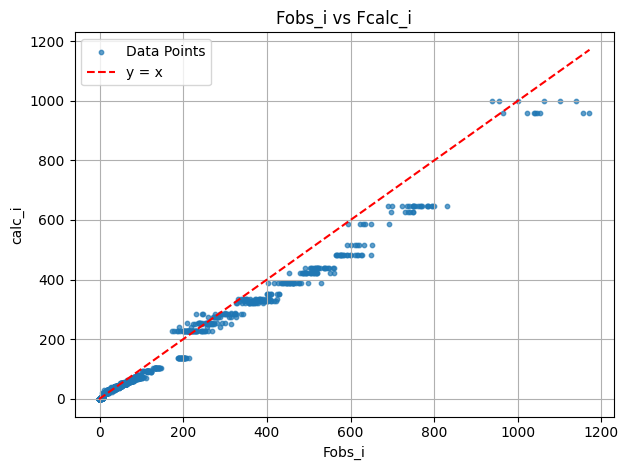

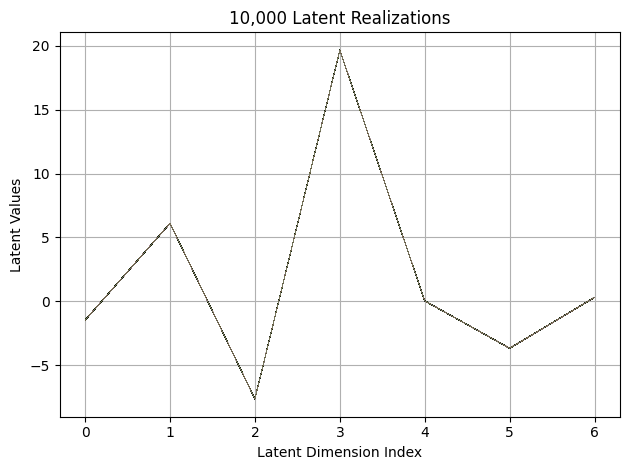

First 10 latent vectors from the VAE:
Sample 1: [-1.4510871171951294, 6.10950231552124, -7.616391658782959, 19.64357566833496, 0.052601151168346405, -3.6511056423187256, 0.3174816071987152]
Sample 2: [-1.4435245990753174, 6.108140468597412, -7.623516082763672, 19.652359008789062, 0.05168760195374489, -3.650782823562622, 0.31988492608070374]
Sample 3: [-1.454905390739441, 6.094343185424805, -7.61759614944458, 19.647705078125, 0.03297053650021553, -3.658381700515747, 0.32931774854660034]
Sample 4: [-1.4602689743041992, 6.106572151184082, -7.622974395751953, 19.654930114746094, 0.044841550290584564, -3.66245174407959, 0.314890056848526]
Sample 5: [-1.453308343887329, 6.103156089782715, -7.616379737854004, 19.637605667114258, 0.044839970767498016, -3.6673531532287598, 0.3286742568016052]
Sample 6: [-1.452010989189148, 6.0953049659729, -7.623884201049805, 19.643566131591797, 0.0410802997648716, -3.6570627689361572, 0.3260052800178528]
Sample 7: [-1.4544521570205688, 6.114108085632324, -7.61

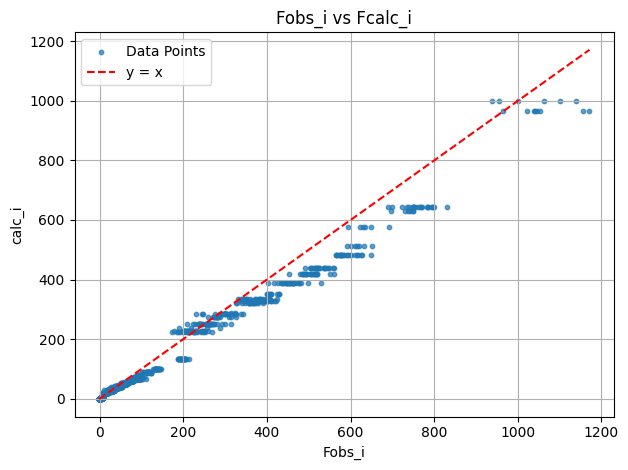

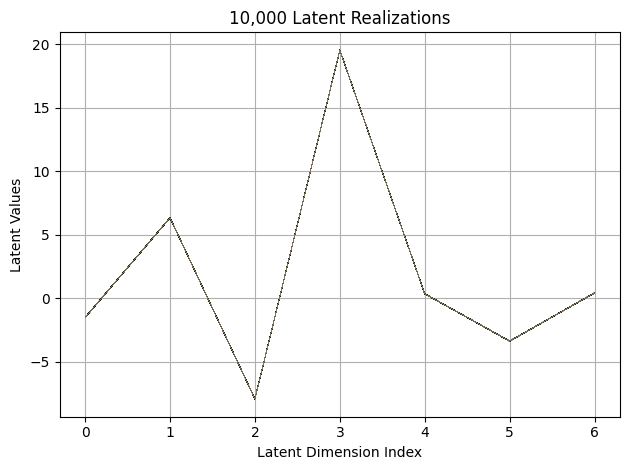

First 10 latent vectors from the VAE:
Sample 1: [-1.5367828607559204, 6.328811168670654, -7.9464921951293945, 19.543601989746094, 0.34616148471832275, -3.3925492763519287, 0.4031774699687958]
Sample 2: [-1.5264959335327148, 6.324288845062256, -7.96021032333374, 19.546199798583984, 0.33005291223526, -3.3973984718322754, 0.3975600600242615]
Sample 3: [-1.542593240737915, 6.328359127044678, -7.941005229949951, 19.538331985473633, 0.3328574001789093, -3.384495496749878, 0.3862478733062744]
Sample 4: [-1.5307008028030396, 6.33381462097168, -7.9584503173828125, 19.537261962890625, 0.34761059284210205, -3.390944004058838, 0.40146464109420776]
Sample 5: [-1.5249377489089966, 6.329139232635498, -7.946356296539307, 19.531028747558594, 0.3349738121032715, -3.399329423904419, 0.41299137473106384]
Sample 6: [-1.5305532217025757, 6.3275299072265625, -7.945725917816162, 19.543729782104492, 0.347878634929657, -3.3991575241088867, 0.39869076013565063]
Sample 7: [-1.5189837217330933, 6.327099323272705, 

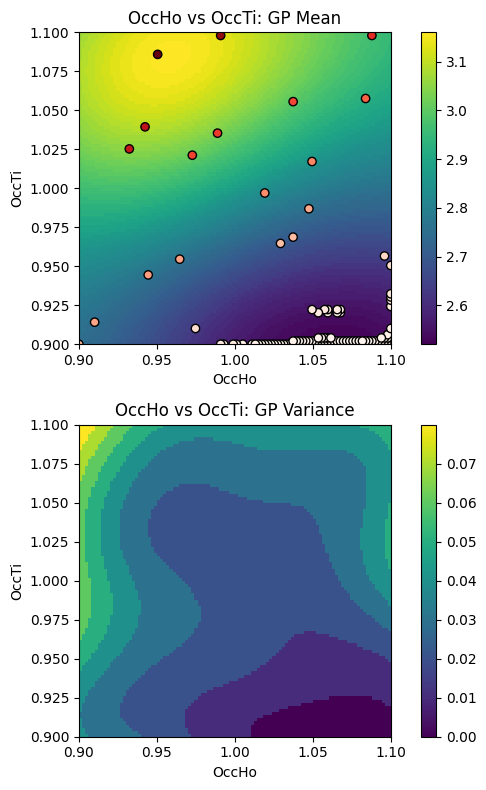

EI: [-1.00000000e+00  4.43402678e-03  4.36274894e-03 ...  3.63894040e-04
  4.19344520e-04  4.83799726e-04]
Function eval #130
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9222221970558167, 1.04747474193573]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4454
initial chi^2 1.5596e+06 with 2596 obs.
New scale: 0.4444
Cycle 0: 0.90s, Chi**2: 3.7003e+05 for 2596 obs., Lambda: 0,  Delta: 0.763, SVD=0
New scale: 0.4444
Maximum shift/esd = -225.42

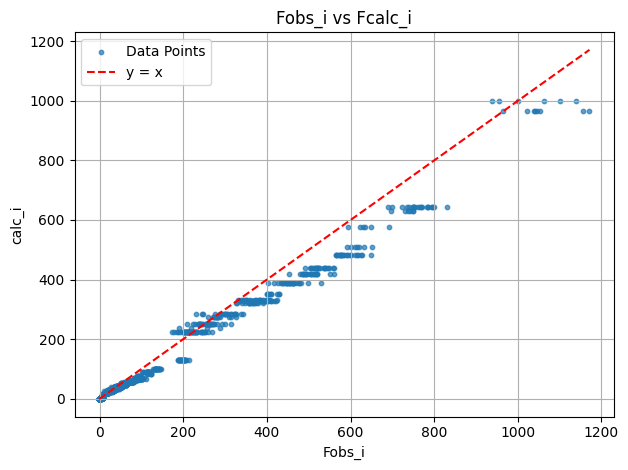

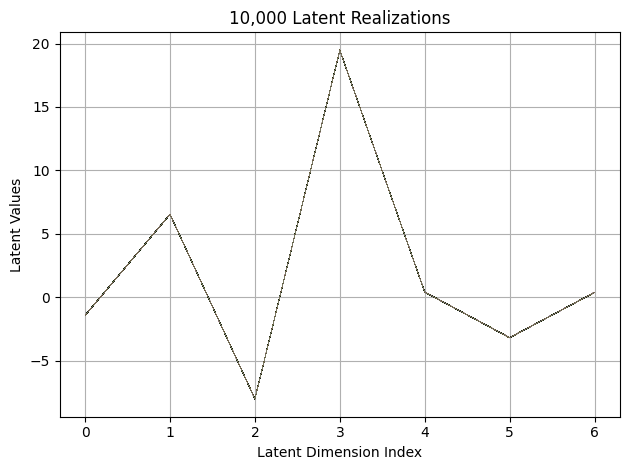

First 10 latent vectors from the VAE:
Sample 1: [-1.4178415536880493, 6.536865234375, -8.005955696105957, 19.47987174987793, 0.4118884205818176, -3.178807258605957, 0.39240556955337524]
Sample 2: [-1.4262104034423828, 6.548952102661133, -8.009257316589355, 19.474233627319336, 0.4017481505870819, -3.178591012954712, 0.38367435336112976]
Sample 3: [-1.423508882522583, 6.53663444519043, -8.006155014038086, 19.482200622558594, 0.4048534631729126, -3.1883063316345215, 0.3848435878753662]
Sample 4: [-1.421736240386963, 6.551156044006348, -8.018865585327148, 19.489042282104492, 0.39412811398506165, -3.188765048980713, 0.39217710494995117]
Sample 5: [-1.4316105842590332, 6.531001091003418, -8.026434898376465, 19.468122482299805, 0.41100966930389404, -3.201296091079712, 0.37534210085868835]
Sample 6: [-1.4209920167922974, 6.534415245056152, -8.010377883911133, 19.48679542541504, 0.3946984112262726, -3.1832101345062256, 0.3848198652267456]
Sample 7: [-1.424492359161377, 6.539699077606201, -8.015

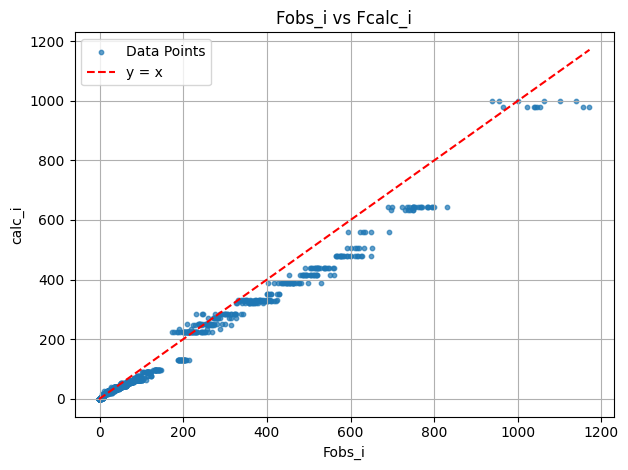

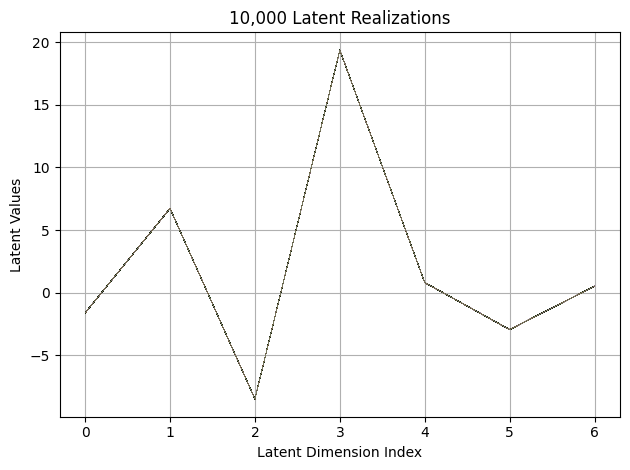

First 10 latent vectors from the VAE:
Sample 1: [-1.6053234338760376, 6.718465328216553, -8.4776611328125, 19.370595932006836, 0.8199431896209717, -2.934145450592041, 0.5192696452140808]
Sample 2: [-1.6028177738189697, 6.719513893127441, -8.474961280822754, 19.370479583740234, 0.8228691816329956, -2.9273409843444824, 0.5189871788024902]
Sample 3: [-1.6048811674118042, 6.733208656311035, -8.478458404541016, 19.363357543945312, 0.8295630812644958, -2.931161403656006, 0.5252606868743896]
Sample 4: [-1.5958174467086792, 6.725843906402588, -8.47614574432373, 19.360246658325195, 0.8206210732460022, -2.9400925636291504, 0.5139150619506836]
Sample 5: [-1.5957051515579224, 6.7333269119262695, -8.454998970031738, 19.36467933654785, 0.8164686560630798, -2.9312052726745605, 0.512768566608429]
Sample 6: [-1.5904444456100464, 6.723147392272949, -8.477458000183105, 19.371383666992188, 0.8144537210464478, -2.9251515865325928, 0.5101372003555298]
Sample 7: [-1.6092040538787842, 6.716466426849365, -8.46

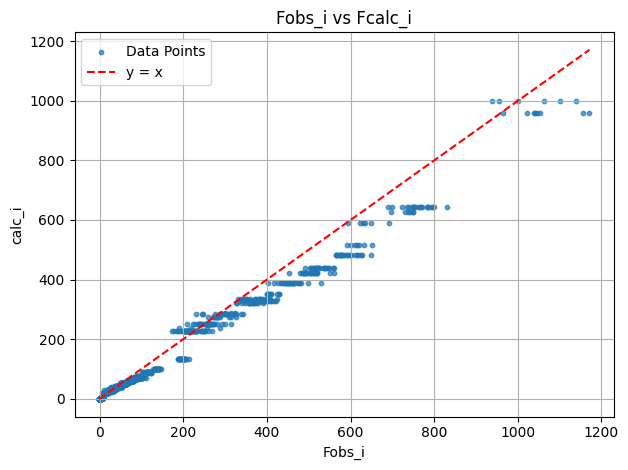

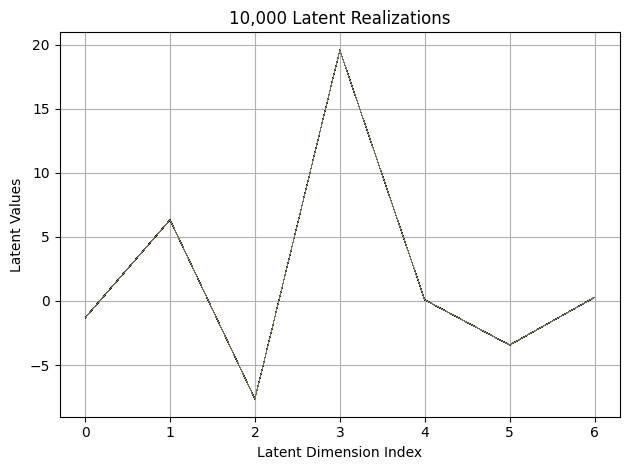

First 10 latent vectors from the VAE:
Sample 1: [-1.3174195289611816, 6.334158420562744, -7.639245986938477, 19.58885955810547, 0.0802873969078064, -3.4446394443511963, 0.276622474193573]
Sample 2: [-1.317886471748352, 6.32992696762085, -7.640636444091797, 19.57640266418457, 0.08614656329154968, -3.4456303119659424, 0.2868657112121582]
Sample 3: [-1.307091474533081, 6.335421085357666, -7.658914089202881, 19.578746795654297, 0.08098296076059341, -3.4465458393096924, 0.28696388006210327]
Sample 4: [-1.3231531381607056, 6.33378791809082, -7.644903659820557, 19.584918975830078, 0.0972854346036911, -3.445375442504883, 0.2769254744052887]
Sample 5: [-1.3085377216339111, 6.329089641571045, -7.631652355194092, 19.57675552368164, 0.08824208378791809, -3.4355978965759277, 0.28557682037353516]
Sample 6: [-1.326810598373413, 6.336100101470947, -7.645861625671387, 19.567758560180664, 0.09322071075439453, -3.4462244510650635, 0.27696874737739563]
Sample 7: [-1.3240289688110352, 6.339578151702881, -7

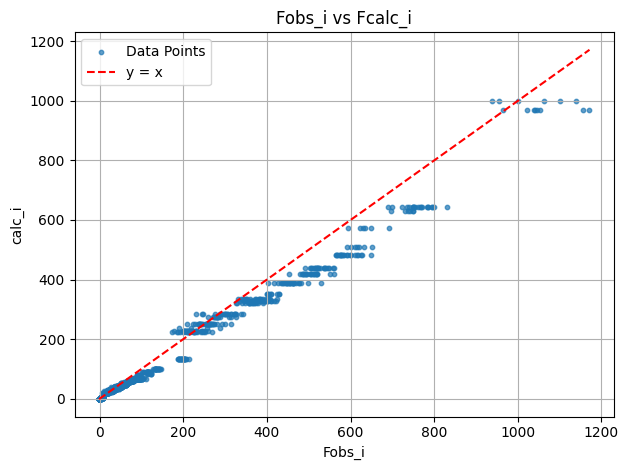

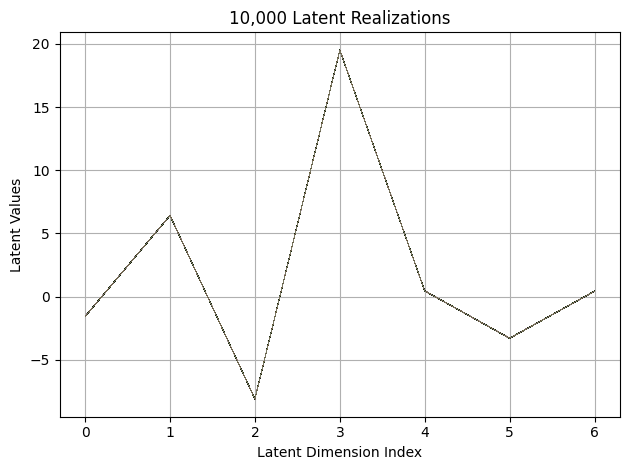

First 10 latent vectors from the VAE:
Sample 1: [-1.553880214691162, 6.414529800415039, -8.067855834960938, 19.501663208007812, 0.4603775441646576, -3.282200813293457, 0.4396730065345764]
Sample 2: [-1.5427814722061157, 6.422512531280518, -8.07767391204834, 19.494089126586914, 0.4598884880542755, -3.284996747970581, 0.4369930326938629]
Sample 3: [-1.5621672868728638, 6.413843631744385, -8.079941749572754, 19.496540069580078, 0.4536876976490021, -3.2879981994628906, 0.43750059604644775]
Sample 4: [-1.5628825426101685, 6.431469917297363, -8.080960273742676, 19.487346649169922, 0.4675680994987488, -3.2722957134246826, 0.44121450185775757]
Sample 5: [-1.5569075345993042, 6.4141316413879395, -8.088168144226074, 19.493497848510742, 0.462327778339386, -3.2844078540802, 0.44100844860076904]
Sample 6: [-1.5690191984176636, 6.413086414337158, -8.085186958312988, 19.498964309692383, 0.4652631878852844, -3.2892913818359375, 0.44206905364990234]
Sample 7: [-1.553402066230774, 6.415261268615723, -8.

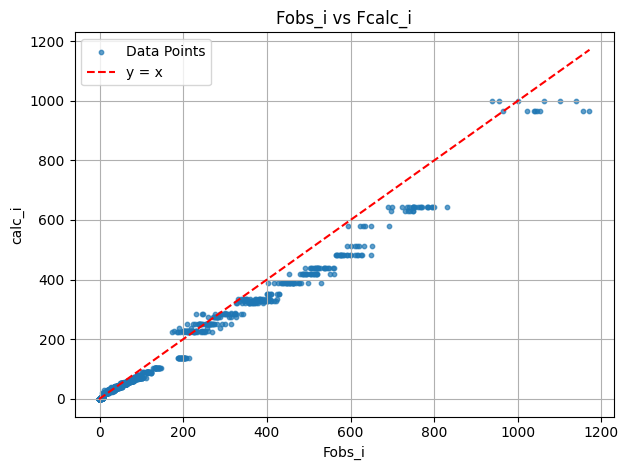

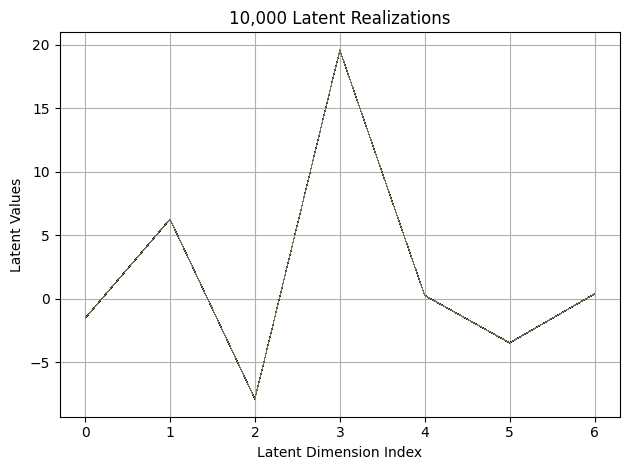

First 10 latent vectors from the VAE:
Sample 1: [-1.5336337089538574, 6.261600494384766, -7.876766681671143, 19.575664520263672, 0.262381911277771, -3.477647304534912, 0.3947393596172333]
Sample 2: [-1.534968376159668, 6.258037567138672, -7.868962287902832, 19.5640811920166, 0.2641054391860962, -3.458202600479126, 0.38951754570007324]
Sample 3: [-1.5375036001205444, 6.257849216461182, -7.856912612915039, 19.54952621459961, 0.27681964635849, -3.4677510261535645, 0.37729766964912415]
Sample 4: [-1.530543327331543, 6.265398025512695, -7.870872974395752, 19.564842224121094, 0.2716284692287445, -3.4784598350524902, 0.3914984464645386]
Sample 5: [-1.5280892848968506, 6.260933876037598, -7.8586344718933105, 19.560497283935547, 0.2624188959598541, -3.4652137756347656, 0.38795116543769836]
Sample 6: [-1.5263981819152832, 6.264726161956787, -7.864565849304199, 19.562530517578125, 0.2715155780315399, -3.4674668312072754, 0.3756455183029175]
Sample 7: [-1.5258820056915283, 6.28314208984375, -7.863

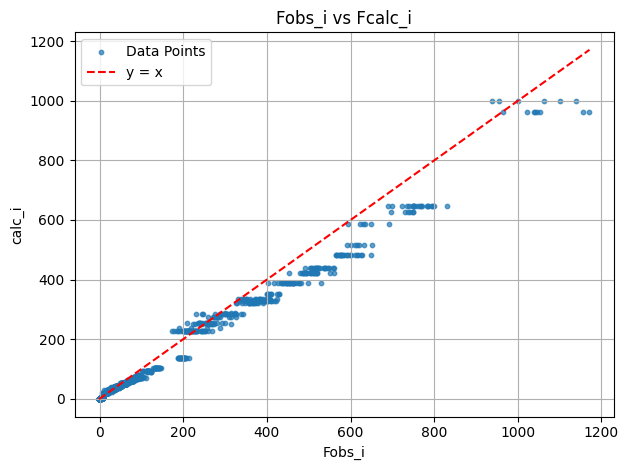

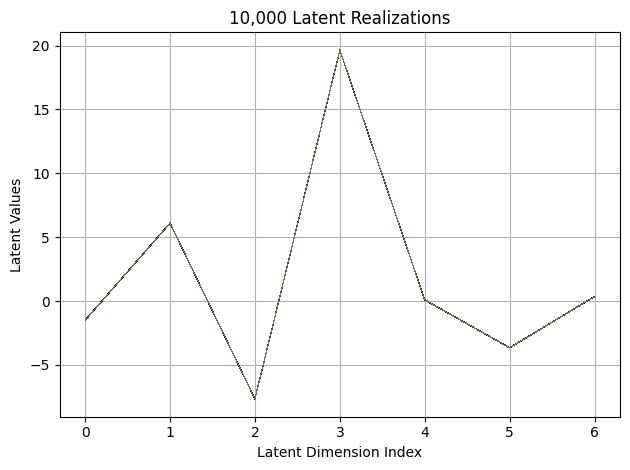

First 10 latent vectors from the VAE:
Sample 1: [-1.5013880729675293, 6.097973823547363, -7.680705547332764, 19.64714813232422, 0.08558257669210434, -3.6573362350463867, 0.351365327835083]
Sample 2: [-1.5140656232833862, 6.100739002227783, -7.667824745178223, 19.644845962524414, 0.0855097621679306, -3.6612277030944824, 0.3502865731716156]
Sample 3: [-1.5086798667907715, 6.092184543609619, -7.67421817779541, 19.623653411865234, 0.09118763357400894, -3.665013551712036, 0.34968236088752747]
Sample 4: [-1.5062071084976196, 6.085263252258301, -7.67432975769043, 19.645015716552734, 0.06966208666563034, -3.6679489612579346, 0.34602805972099304]
Sample 5: [-1.4988282918930054, 6.101945400238037, -7.658588886260986, 19.630048751831055, 0.0935753583908081, -3.6568288803100586, 0.3331429958343506]
Sample 6: [-1.5065546035766602, 6.082330226898193, -7.670322895050049, 19.641464233398438, 0.09038040786981583, -3.6513144969940186, 0.3460254669189453]
Sample 7: [-1.512076735496521, 6.087635040283203,

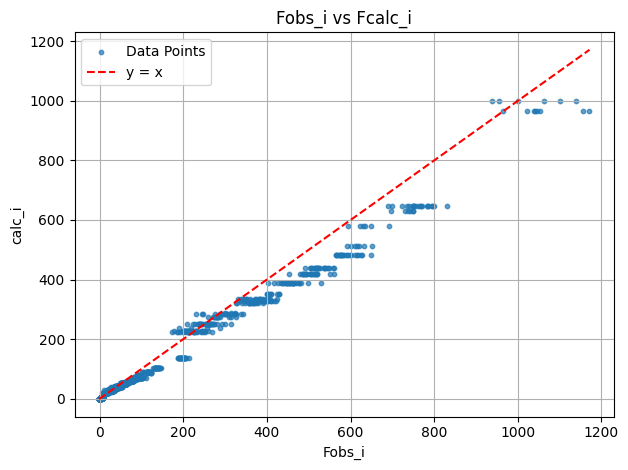

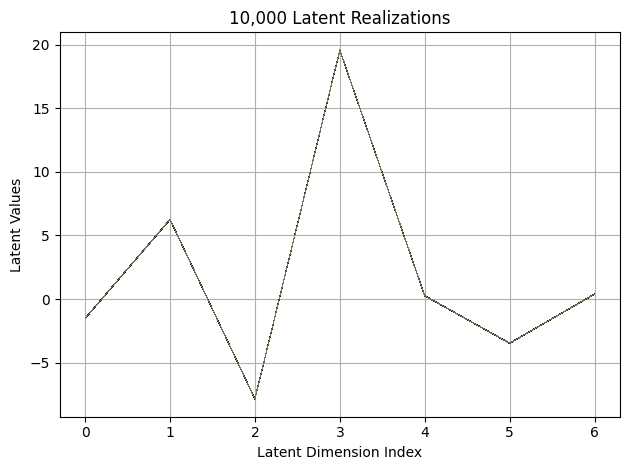

First 10 latent vectors from the VAE:
Sample 1: [-1.5217360258102417, 6.25015926361084, -7.865792274475098, 19.572994232177734, 0.2548421621322632, -3.4747018814086914, 0.38567039370536804]
Sample 2: [-1.5241155624389648, 6.240707874298096, -7.852564811706543, 19.573688507080078, 0.25887489318847656, -3.46708083152771, 0.3908325433731079]
Sample 3: [-1.5208308696746826, 6.266341686248779, -7.862086772918701, 19.575424194335938, 0.2565053403377533, -3.4741902351379395, 0.37470144033432007]
Sample 4: [-1.5365756750106812, 6.250899791717529, -7.852477550506592, 19.581581115722656, 0.2537499964237213, -3.4815237522125244, 0.38181427121162415]
Sample 5: [-1.5282739400863647, 6.244200706481934, -7.865767478942871, 19.571455001831055, 0.24160534143447876, -3.4686622619628906, 0.3895055949687958]
Sample 6: [-1.5254617929458618, 6.254280090332031, -7.8532562255859375, 19.578815460205078, 0.2611544132232666, -3.465251922607422, 0.3904321491718292]
Sample 7: [-1.5237617492675781, 6.24735641479492

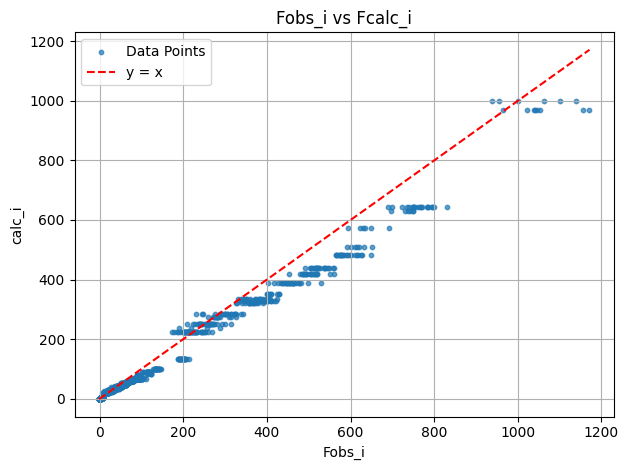

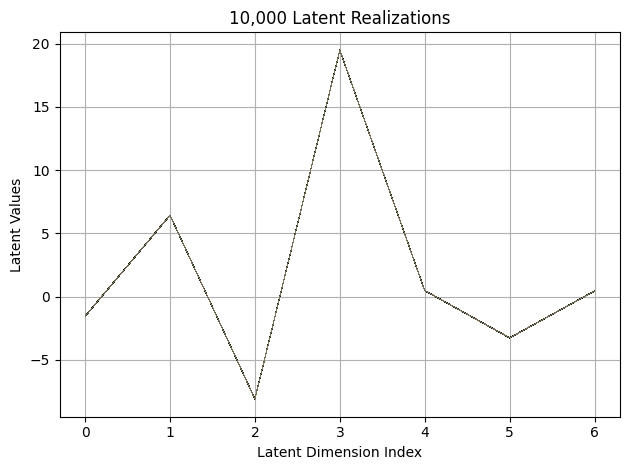

First 10 latent vectors from the VAE:
Sample 1: [-1.5591462850570679, 6.435986518859863, -8.096573829650879, 19.486141204833984, 0.4642248749732971, -3.2658212184906006, 0.4449916183948517]
Sample 2: [-1.5572916269302368, 6.435578346252441, -8.095272064208984, 19.483139038085938, 0.46522414684295654, -3.273014545440674, 0.43695732951164246]
Sample 3: [-1.557618260383606, 6.426753520965576, -8.093379020690918, 19.49639320373535, 0.4749521315097809, -3.2737057209014893, 0.4419596195220947]
Sample 4: [-1.5588141679763794, 6.429045677185059, -8.096437454223633, 19.499042510986328, 0.45795828104019165, -3.27856707572937, 0.4494268298149109]
Sample 5: [-1.566672921180725, 6.429108142852783, -8.09054946899414, 19.507898330688477, 0.47685182094573975, -3.2668609619140625, 0.4466915428638458]
Sample 6: [-1.5559285879135132, 6.432366371154785, -8.09999942779541, 19.496109008789062, 0.4743427336215973, -3.2664387226104736, 0.4395202100276947]
Sample 7: [-1.5556397438049316, 6.431578159332275, -8.

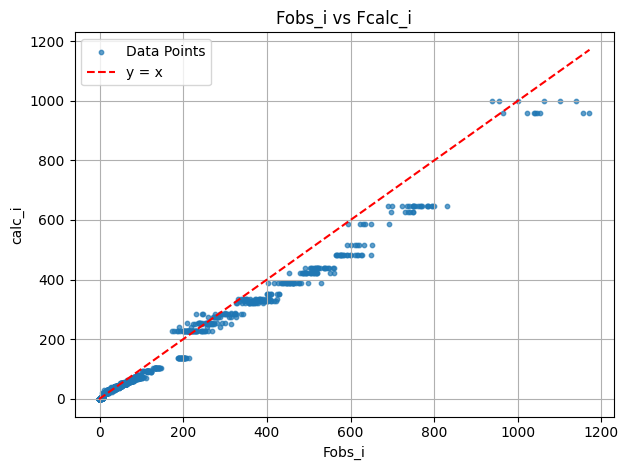

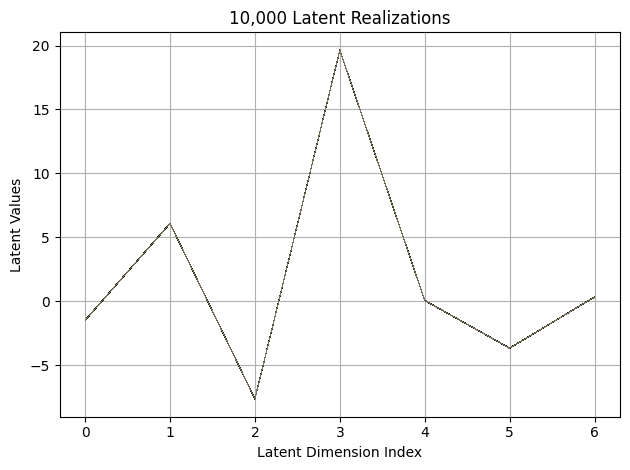

First 10 latent vectors from the VAE:
Sample 1: [-1.4837998151779175, 6.086530685424805, -7.6359663009643555, 19.627248764038086, 0.06517890095710754, -3.6672487258911133, 0.3290899693965912]
Sample 2: [-1.4824362993240356, 6.083576679229736, -7.631218910217285, 19.635719299316406, 0.062417879700660706, -3.6619040966033936, 0.3386341333389282]
Sample 3: [-1.486372470855713, 6.086524963378906, -7.6337056159973145, 19.640865325927734, 0.06128937005996704, -3.660871982574463, 0.33455294370651245]
Sample 4: [-1.4901355504989624, 6.088667392730713, -7.635273456573486, 19.636566162109375, 0.06018277630209923, -3.6590588092803955, 0.3373153805732727]
Sample 5: [-1.4910887479782104, 6.104497909545898, -7.640328884124756, 19.65728759765625, 0.05819233879446983, -3.6706016063690186, 0.33436092734336853]
Sample 6: [-1.4956945180892944, 6.098677158355713, -7.643860340118408, 19.648801803588867, 0.05800418555736542, -3.660189390182495, 0.3443313539028168]
Sample 7: [-1.489956021308899, 6.0891795158

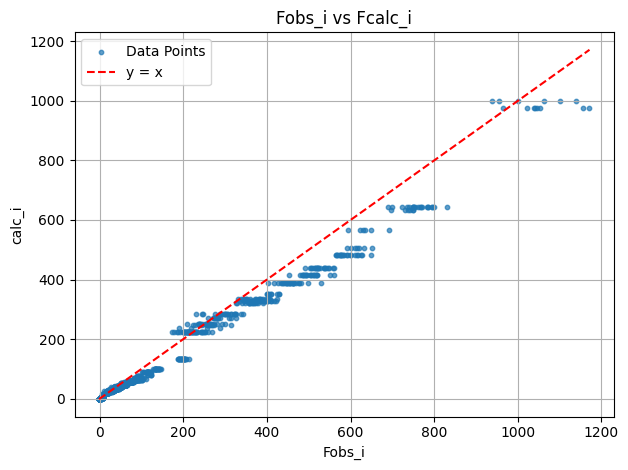

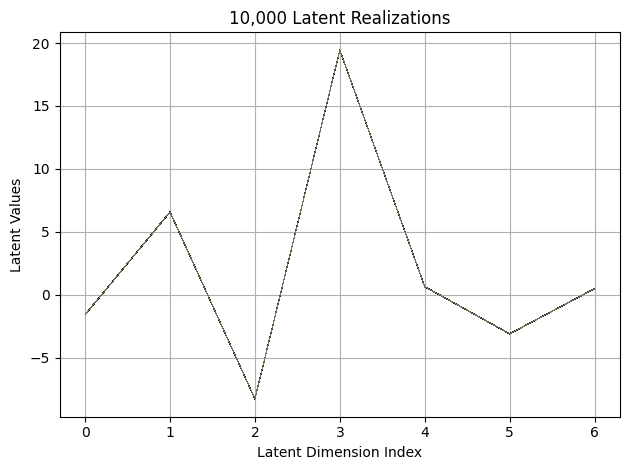

First 10 latent vectors from the VAE:
Sample 1: [-1.5874016284942627, 6.552117347717285, -8.273881912231445, 19.43301010131836, 0.6367762088775635, -3.104851484298706, 0.4897485673427582]
Sample 2: [-1.5927754640579224, 6.560162544250488, -8.284276008605957, 19.4351749420166, 0.637324333190918, -3.1107981204986572, 0.4815683662891388]
Sample 3: [-1.5883293151855469, 6.56948184967041, -8.275089263916016, 19.435325622558594, 0.6498497724533081, -3.1179420948028564, 0.48213520646095276]
Sample 4: [-1.5897976160049438, 6.568398952484131, -8.276823997497559, 19.435352325439453, 0.6420022249221802, -3.116530418395996, 0.4775940179824829]
Sample 5: [-1.5852351188659668, 6.579916000366211, -8.282635688781738, 19.433027267456055, 0.6517564654350281, -3.107673406600952, 0.4889954924583435]
Sample 6: [-1.5843207836151123, 6.5724873542785645, -8.27929401397705, 19.42656135559082, 0.6421921253204346, -3.1083297729492188, 0.49190887808799744]
Sample 7: [-1.592159390449524, 6.5655059814453125, -8.283

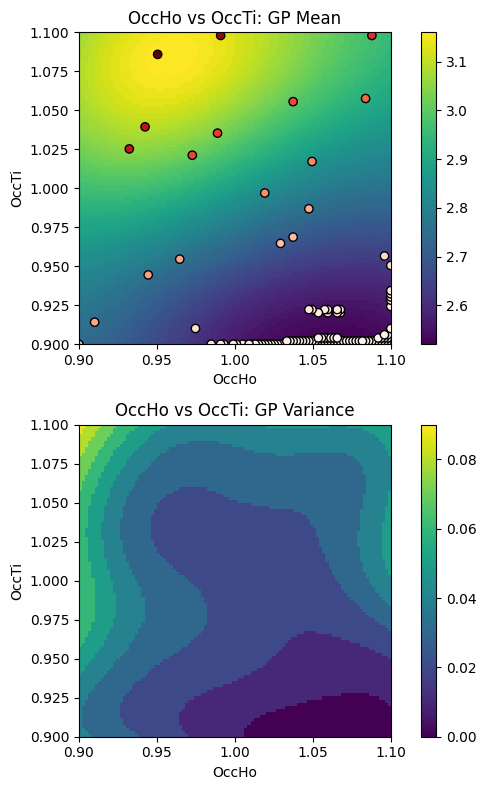

EI: [-1.00000000e+00  4.65037860e-03  4.56725247e-03 ...  3.99595825e-04
  4.60324110e-04  5.31001948e-04]
Function eval #140
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9040403962135315, 1.0676767826080322]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4304
initial chi^2 1.7911e+06 with 2596 obs.
New scale: 0.4295
Cycle 0: 0.81s, Chi**2: 3.8885e+05 for 2596 obs., Lambda: 0,  Delta: 0.783, SVD=0
New scale: 0.4295
Maximum shift/esd = -242.

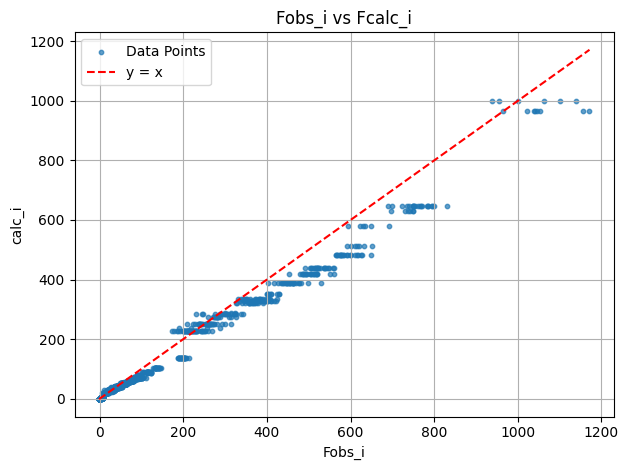

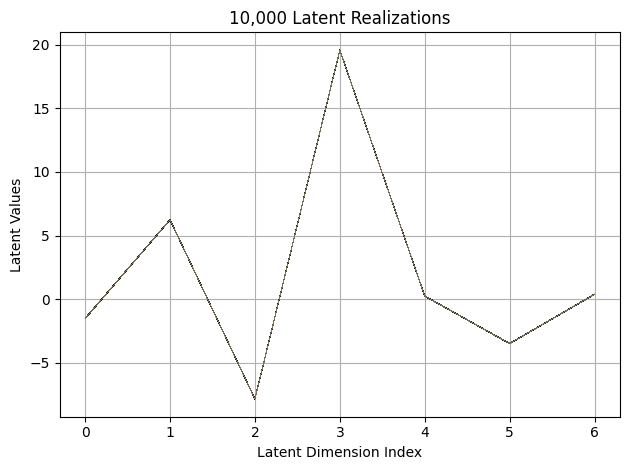

First 10 latent vectors from the VAE:
Sample 1: [-1.5143095254898071, 6.25037956237793, -7.840887546539307, 19.57771873474121, 0.2506799101829529, -3.497431516647339, 0.3937852382659912]
Sample 2: [-1.5092887878417969, 6.2520294189453125, -7.834286689758301, 19.57228660583496, 0.23414702713489532, -3.491461992263794, 0.3840855062007904]
Sample 3: [-1.5164638757705688, 6.230456352233887, -7.831519603729248, 19.574655532836914, 0.24103686213493347, -3.491088390350342, 0.39720046520233154]
Sample 4: [-1.5187681913375854, 6.247320175170898, -7.834454536437988, 19.584749221801758, 0.24729441106319427, -3.4906764030456543, 0.3828522861003876]
Sample 5: [-1.5210458040237427, 6.246410369873047, -7.8407392501831055, 19.570035934448242, 0.2520575225353241, -3.4895973205566406, 0.39046916365623474]
Sample 6: [-1.530598759651184, 6.245964050292969, -7.841810703277588, 19.556650161743164, 0.2408587783575058, -3.491743326187134, 0.3869188129901886]
Sample 7: [-1.521011471748352, 6.23615026473999, -7

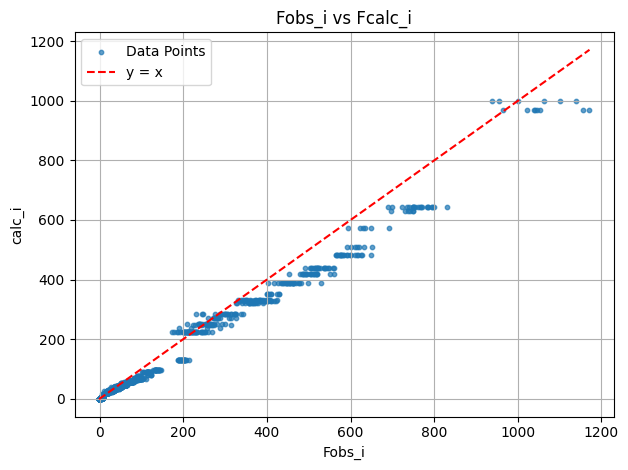

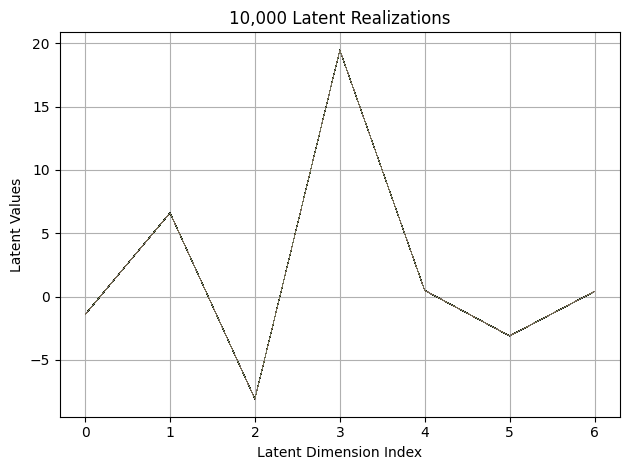

First 10 latent vectors from the VAE:
Sample 1: [-1.4284992218017578, 6.601052761077881, -8.09191608428955, 19.45330810546875, 0.4729982614517212, -3.1132466793060303, 0.40372535586357117]
Sample 2: [-1.4322280883789062, 6.612785339355469, -8.079720497131348, 19.46552848815918, 0.4727848172187805, -3.111283540725708, 0.3990723788738251]
Sample 3: [-1.423667073249817, 6.60845422744751, -8.096518516540527, 19.45417594909668, 0.4622644782066345, -3.1170055866241455, 0.404350608587265]
Sample 4: [-1.4202216863632202, 6.596498489379883, -8.088529586791992, 19.450836181640625, 0.48317593336105347, -3.119241952896118, 0.3906297981739044]
Sample 5: [-1.4208660125732422, 6.596114158630371, -8.094959259033203, 19.451499938964844, 0.47685152292251587, -3.107555389404297, 0.38774237036705017]
Sample 6: [-1.4295262098312378, 6.605123043060303, -8.092826843261719, 19.448585510253906, 0.4641386866569519, -3.1010324954986572, 0.38805344700813293]
Sample 7: [-1.4301433563232422, 6.606890678405762, -8.0

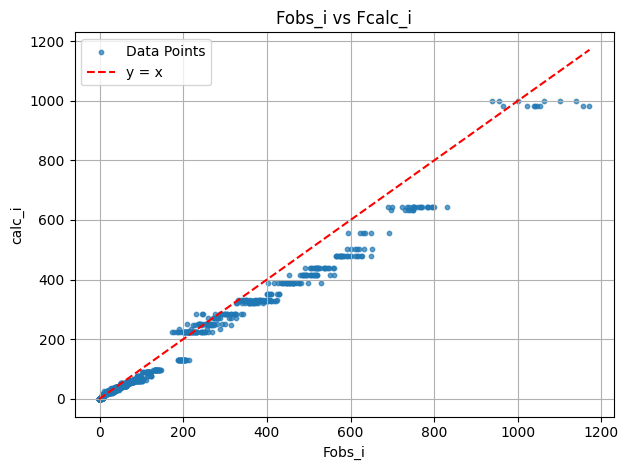

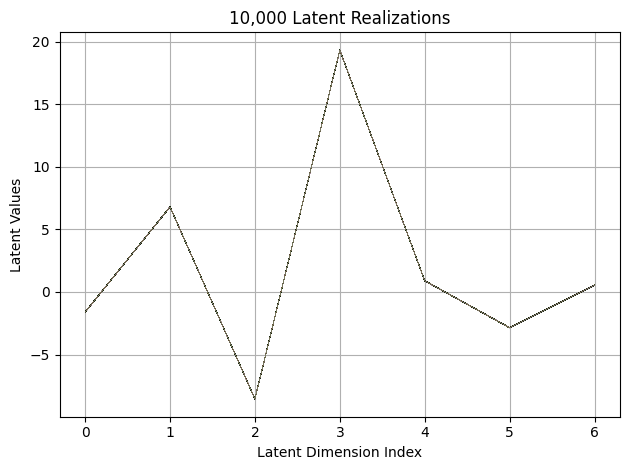

First 10 latent vectors from the VAE:
Sample 1: [-1.5998789072036743, 6.809995651245117, -8.552717208862305, 19.333694458007812, 0.8959636688232422, -2.8692641258239746, 0.533012866973877]
Sample 2: [-1.618051528930664, 6.811062335968018, -8.562826156616211, 19.339223861694336, 0.8948835730552673, -2.865419626235962, 0.5290474891662598]
Sample 3: [-1.6118268966674805, 6.799753665924072, -8.556100845336914, 19.33823013305664, 0.893994927406311, -2.8628063201904297, 0.5366254448890686]
Sample 4: [-1.6199665069580078, 6.7889180183410645, -8.54297161102295, 19.336936950683594, 0.8888408541679382, -2.867438316345215, 0.530046284198761]
Sample 5: [-1.6100515127182007, 6.792487621307373, -8.550955772399902, 19.339693069458008, 0.8878799676895142, -2.8620383739471436, 0.5292612314224243]
Sample 6: [-1.6123898029327393, 6.798048973083496, -8.544490814208984, 19.352506637573242, 0.8949222564697266, -2.853740930557251, 0.5258857607841492]
Sample 7: [-1.620270848274231, 6.795536041259766, -8.54703

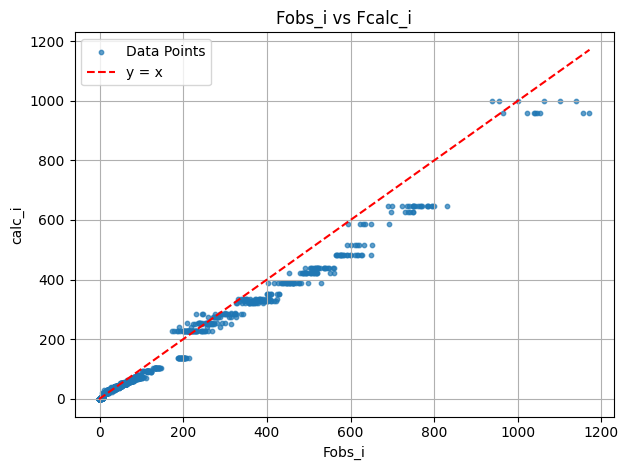

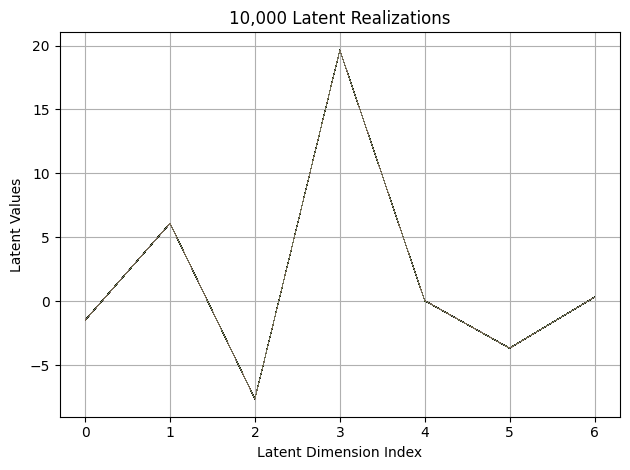

First 10 latent vectors from the VAE:
Sample 1: [-1.4723790884017944, 6.103593826293945, -7.637057304382324, 19.651138305664062, 0.05716437101364136, -3.6490800380706787, 0.32181844115257263]
Sample 2: [-1.4779613018035889, 6.100170135498047, -7.628389358520508, 19.646610260009766, 0.05636182054877281, -3.6639461517333984, 0.33324143290519714]
Sample 3: [-1.4736785888671875, 6.099881172180176, -7.627134323120117, 19.63654327392578, 0.04966407269239426, -3.6631462574005127, 0.3240038752555847]
Sample 4: [-1.467382550239563, 6.102153778076172, -7.624985218048096, 19.652156829833984, 0.035669632256031036, -3.669705629348755, 0.32272475957870483]
Sample 5: [-1.4704495668411255, 6.0916619300842285, -7.622988700866699, 19.644283294677734, 0.05704168975353241, -3.6564979553222656, 0.33267873525619507]
Sample 6: [-1.485838532447815, 6.087583541870117, -7.626849174499512, 19.64130973815918, 0.0565241239964962, -3.654160499572754, 0.32992827892303467]
Sample 7: [-1.480525255203247, 6.09663105010

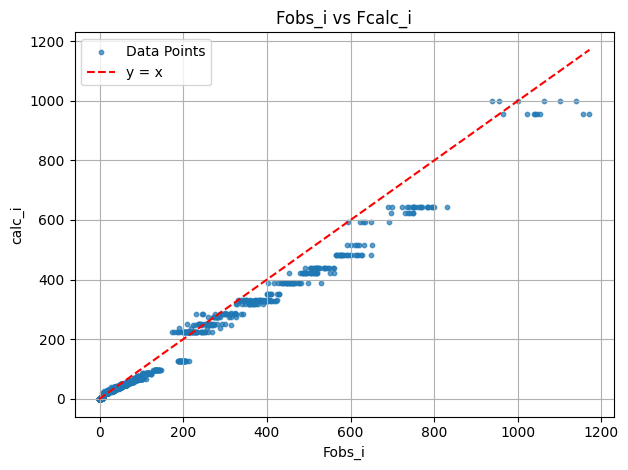

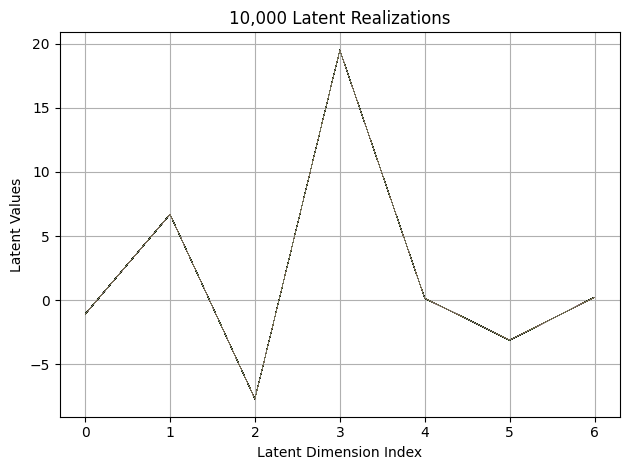

First 10 latent vectors from the VAE:
Sample 1: [-1.0917840003967285, 6.686905860900879, -7.687730312347412, 19.491580963134766, 0.162319153547287, -3.1100196838378906, 0.21353742480278015]
Sample 2: [-1.0876727104187012, 6.686977386474609, -7.695539951324463, 19.49300193786621, 0.15852026641368866, -3.1099793910980225, 0.22220930457115173]
Sample 3: [-1.0946124792099, 6.687541961669922, -7.69270658493042, 19.49280548095703, 0.15902602672576904, -3.1041507720947266, 0.22043301165103912]
Sample 4: [-1.08381986618042, 6.679251670837402, -7.700454235076904, 19.490718841552734, 0.15134049952030182, -3.1023764610290527, 0.20903310179710388]
Sample 5: [-1.0927939414978027, 6.687966346740723, -7.691190719604492, 19.493669509887695, 0.15239757299423218, -3.1182377338409424, 0.21990761160850525]
Sample 6: [-1.0956602096557617, 6.691565990447998, -7.683784008026123, 19.49594497680664, 0.16616232693195343, -3.1108665466308594, 0.23650774359703064]
Sample 7: [-1.081784725189209, 6.694791793823242,

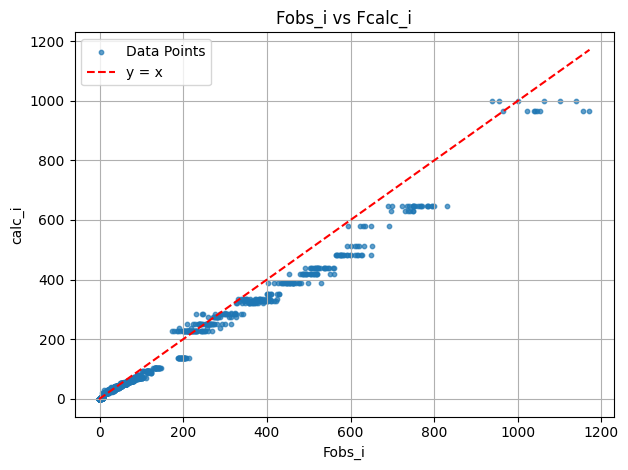

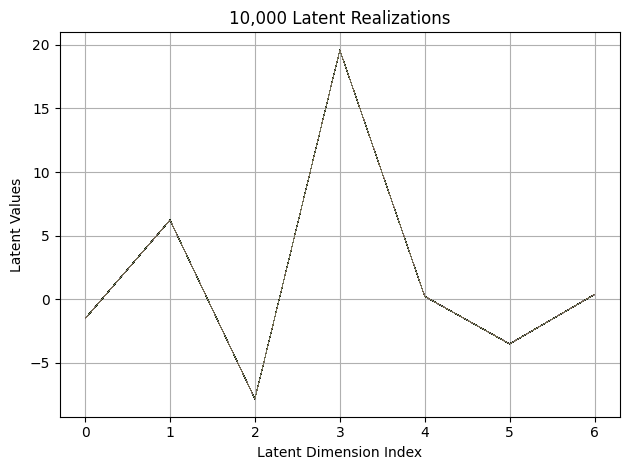

First 10 latent vectors from the VAE:
Sample 1: [-1.525195837020874, 6.217112064361572, -7.8359174728393555, 19.583280563354492, 0.21865057945251465, -3.5008506774902344, 0.3762945830821991]
Sample 2: [-1.513061285018921, 6.2226243019104, -7.821071147918701, 19.58379364013672, 0.2321281135082245, -3.4913270473480225, 0.38011595606803894]
Sample 3: [-1.5253666639328003, 6.225564479827881, -7.846519947052002, 19.575876235961914, 0.23197132349014282, -3.4987988471984863, 0.36972576379776]
Sample 4: [-1.5269348621368408, 6.234930515289307, -7.832438945770264, 19.58127212524414, 0.2267005890607834, -3.5105197429656982, 0.3787296712398529]
Sample 5: [-1.5174177885055542, 6.228600025177002, -7.819476127624512, 19.594772338867188, 0.23684734106063843, -3.5081727504730225, 0.3842166066169739]
Sample 6: [-1.5107065439224243, 6.229593276977539, -7.82044792175293, 19.582141876220703, 0.24166665971279144, -3.492732524871826, 0.3781284689903259]
Sample 7: [-1.5242583751678467, 6.225251197814941, -7.

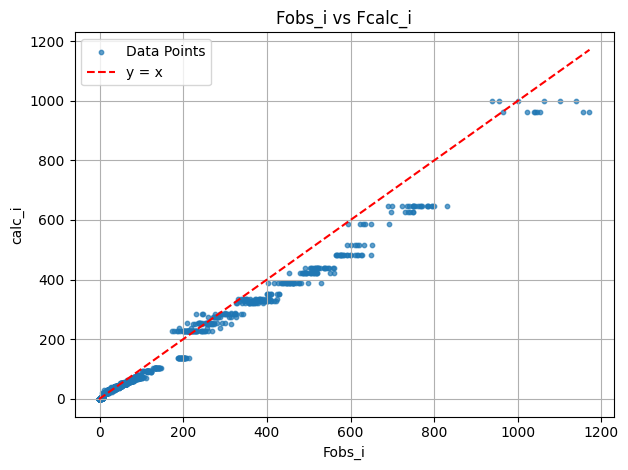

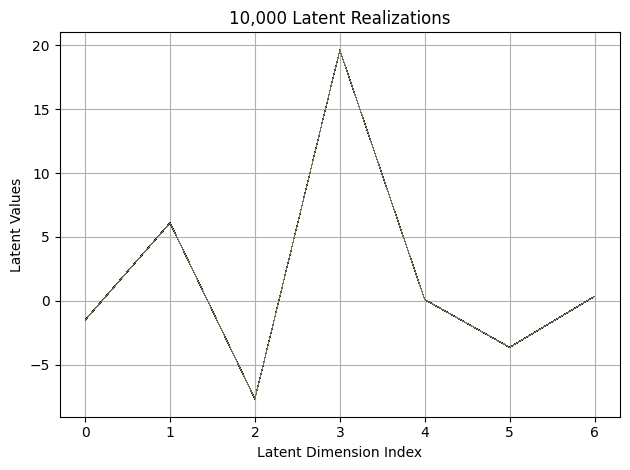

First 10 latent vectors from the VAE:
Sample 1: [-1.5044318437576294, 6.1123881340026855, -7.680315017700195, 19.631200790405273, 0.08351272344589233, -3.6491401195526123, 0.338348388671875]
Sample 2: [-1.4840749502182007, 6.109934329986572, -7.679232120513916, 19.63311195373535, 0.09877237677574158, -3.642287015914917, 0.34664300084114075]
Sample 3: [-1.4976907968521118, 6.102533340454102, -7.667911529541016, 19.6181697845459, 0.10632102936506271, -3.6487457752227783, 0.3599647581577301]
Sample 4: [-1.5072771310806274, 6.113252639770508, -7.6892194747924805, 19.62559700012207, 0.10943734645843506, -3.6433699131011963, 0.3517380952835083]
Sample 5: [-1.5135414600372314, 6.104349136352539, -7.6794939041137695, 19.62925148010254, 0.09781951457262039, -3.647813320159912, 0.34905093908309937]
Sample 6: [-1.4964098930358887, 6.111729621887207, -7.675532817840576, 19.63104820251465, 0.09173684567213058, -3.647590160369873, 0.34371671080589294]
Sample 7: [-1.514334797859192, 6.104461193084717

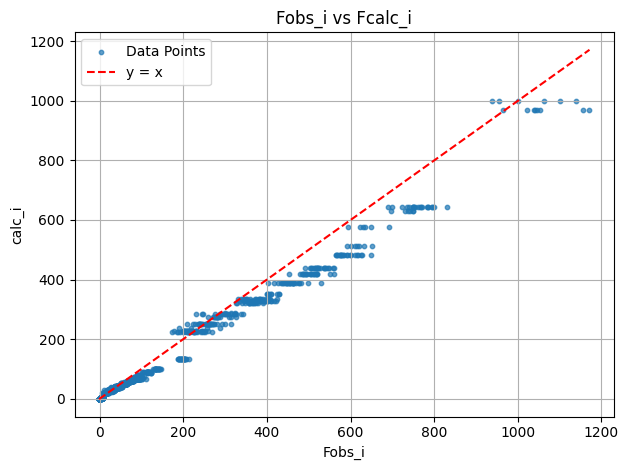

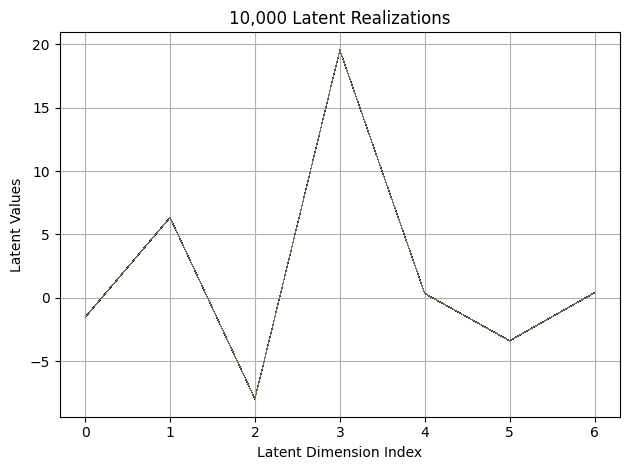

First 10 latent vectors from the VAE:
Sample 1: [-1.5364190340042114, 6.343326568603516, -7.96195650100708, 19.54361915588379, 0.3450446128845215, -3.374868869781494, 0.4124395251274109]
Sample 2: [-1.522636890411377, 6.329426288604736, -7.969712257385254, 19.528898239135742, 0.34979403018951416, -3.3792471885681152, 0.40764763951301575]
Sample 3: [-1.5249979496002197, 6.3372273445129395, -7.966744422912598, 19.534692764282227, 0.34909841418266296, -3.374696969985962, 0.40625107288360596]
Sample 4: [-1.5289573669433594, 6.340537071228027, -7.9521660804748535, 19.529821395874023, 0.3530232608318329, -3.367863655090332, 0.40992170572280884]
Sample 5: [-1.5330947637557983, 6.336905002593994, -7.960748672485352, 19.528404235839844, 0.34225764870643616, -3.3699867725372314, 0.4071360230445862]
Sample 6: [-1.536113977432251, 6.3285627365112305, -7.961785793304443, 19.532785415649414, 0.3529367446899414, -3.3782927989959717, 0.41132161021232605]
Sample 7: [-1.5221976041793823, 6.3421931266784

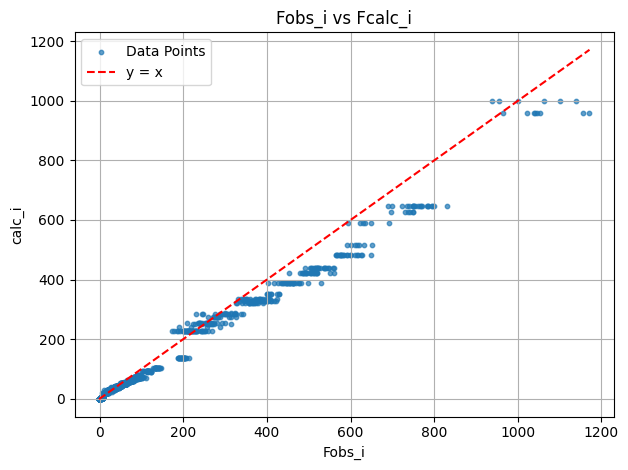

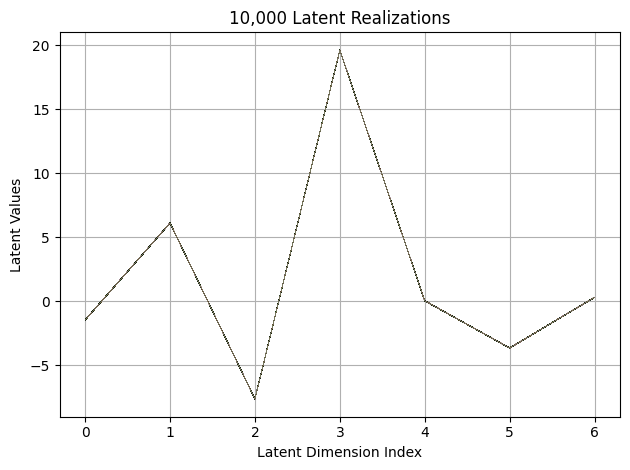

First 10 latent vectors from the VAE:
Sample 1: [-1.4346022605895996, 6.121784687042236, -7.621747970581055, 19.648082733154297, 0.043274372816085815, -3.645014762878418, 0.31331560015678406]
Sample 2: [-1.4435533285140991, 6.112156867980957, -7.615067958831787, 19.627588272094727, 0.053148023784160614, -3.638239622116089, 0.32243189215660095]
Sample 3: [-1.440179705619812, 6.126993179321289, -7.614072322845459, 19.62259864807129, 0.033528879284858704, -3.63132381439209, 0.324749231338501]
Sample 4: [-1.4654377698898315, 6.1142497062683105, -7.6258978843688965, 19.637020111083984, 0.042792536318302155, -3.641556739807129, 0.32010361552238464]
Sample 5: [-1.4478389024734497, 6.124404430389404, -7.624212741851807, 19.637557983398438, 0.03779873251914978, -3.649552345275879, 0.32196298241615295]
Sample 6: [-1.4449788331985474, 6.121562480926514, -7.623171329498291, 19.631038665771484, 0.04618420451879501, -3.6445555686950684, 0.3243439793586731]
Sample 7: [-1.4595286846160889, 6.119432926

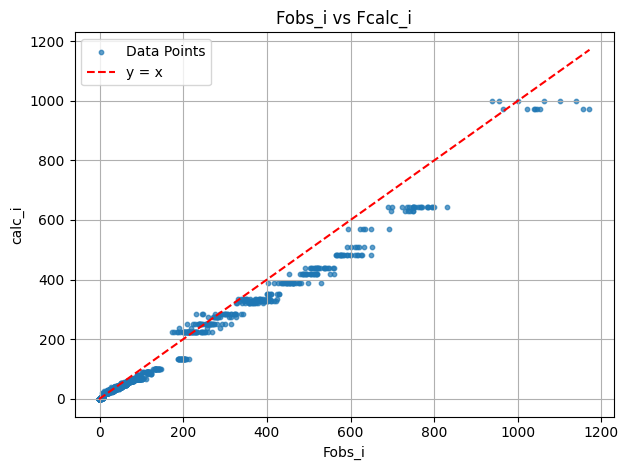

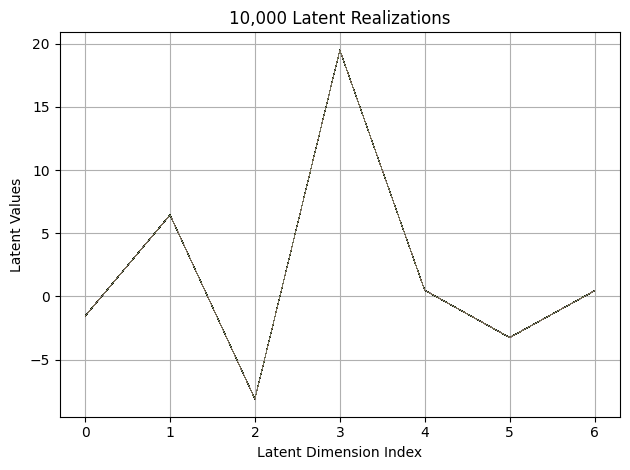

First 10 latent vectors from the VAE:
Sample 1: [-1.5579942464828491, 6.449743270874023, -8.120234489440918, 19.483461380004883, 0.4984029233455658, -3.2586703300476074, 0.44191256165504456]
Sample 2: [-1.5605403184890747, 6.447714805603027, -8.10045337677002, 19.47677230834961, 0.49445676803588867, -3.2636122703552246, 0.450460821390152]
Sample 3: [-1.5715471506118774, 6.451580047607422, -8.111119270324707, 19.485990524291992, 0.4906570613384247, -3.2572169303894043, 0.45068830251693726]
Sample 4: [-1.5518836975097656, 6.441258907318115, -8.10929012298584, 19.490449905395508, 0.4792153537273407, -3.2615272998809814, 0.4525340497493744]
Sample 5: [-1.552921175956726, 6.443610191345215, -8.10483455657959, 19.484786987304688, 0.48466309905052185, -3.248311996459961, 0.45525044202804565]
Sample 6: [-1.5685640573501587, 6.447172164916992, -8.102337837219238, 19.493724822998047, 0.48661816120147705, -3.2662925720214844, 0.43936529755592346]
Sample 7: [-1.556061029434204, 6.440353870391846, 

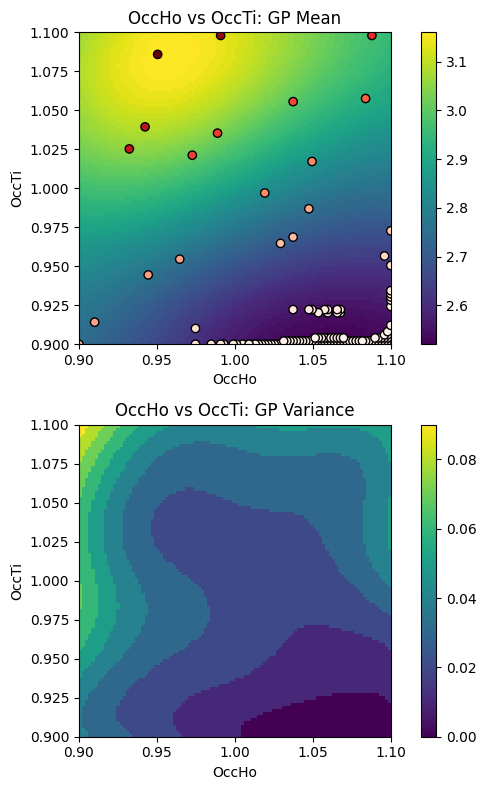

EI: [-1.00000000e+00  4.77267988e-03  4.66998667e-03 ...  4.25999984e-04
  4.91078245e-04  5.66923525e-04]
Function eval #150
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9040403962135315, 1.0717171430587769]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4273
initial chi^2 1.8431e+06 with 2596 obs.
New scale: 0.4264
Cycle 0: 0.82s, Chi**2: 3.9293e+05 for 2596 obs., Lambda: 0,  Delta: 0.787, SVD=0
New scale: 0.4264
Maximum shift/esd = -245.

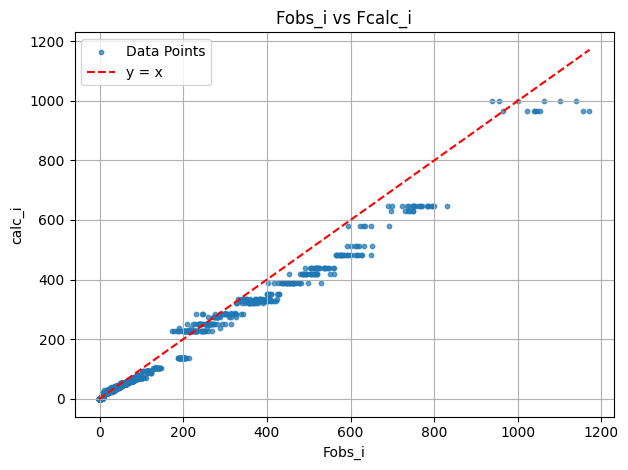

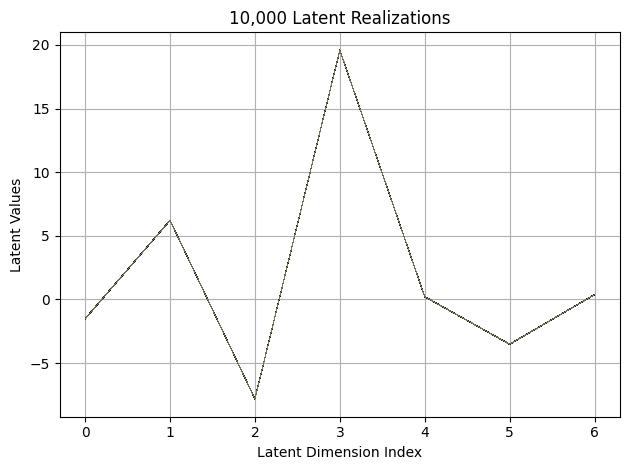

First 10 latent vectors from the VAE:
Sample 1: [-1.515326976776123, 6.222119331359863, -7.811504364013672, 19.579402923583984, 0.21091529726982117, -3.5144383907318115, 0.3671930730342865]
Sample 2: [-1.5234811305999756, 6.211594104766846, -7.807002544403076, 19.5823917388916, 0.21294230222702026, -3.5116019248962402, 0.37044355273246765]
Sample 3: [-1.5186229944229126, 6.206478595733643, -7.8151469230651855, 19.5889835357666, 0.21175020933151245, -3.514298677444458, 0.3704701066017151]
Sample 4: [-1.525844693183899, 6.218445301055908, -7.809053421020508, 19.594675064086914, 0.21518628299236298, -3.5292844772338867, 0.37701332569122314]
Sample 5: [-1.5173472166061401, 6.20317268371582, -7.827014923095703, 19.594724655151367, 0.2187080681324005, -3.519862174987793, 0.37677839398384094]
Sample 6: [-1.5053943395614624, 6.214296817779541, -7.806326866149902, 19.57508659362793, 0.2162509709596634, -3.5141186714172363, 0.36589327454566956]
Sample 7: [-1.532935619354248, 6.208415508270264, -

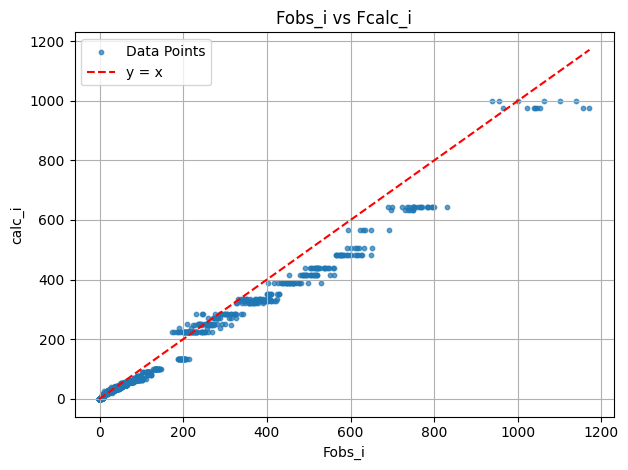

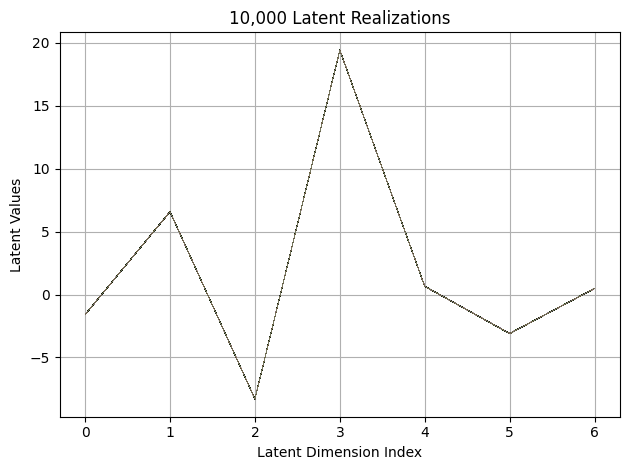

First 10 latent vectors from the VAE:
Sample 1: [-1.5952935218811035, 6.5988593101501465, -8.300028800964355, 19.421228408813477, 0.6643577218055725, -3.099217653274536, 0.48379620909690857]
Sample 2: [-1.5930911302566528, 6.577791690826416, -8.307195663452148, 19.42877197265625, 0.6498246192932129, -3.0903759002685547, 0.4846837520599365]
Sample 3: [-1.586362361907959, 6.577200889587402, -8.283672332763672, 19.43313980102539, 0.6717123985290527, -3.09867000579834, 0.49503105878829956]
Sample 4: [-1.587796926498413, 6.58034610748291, -8.298826217651367, 19.43537139892578, 0.653503954410553, -3.0973479747772217, 0.4945772886276245]
Sample 5: [-1.5982519388198853, 6.581338405609131, -8.283570289611816, 19.424196243286133, 0.6654467582702637, -3.0950281620025635, 0.49829035997390747]
Sample 6: [-1.5845881700515747, 6.578269958496094, -8.305273056030273, 19.425376892089844, 0.6538030505180359, -3.092438220977783, 0.4813525676727295]
Sample 7: [-1.5947610139846802, 6.588239669799805, -8.302

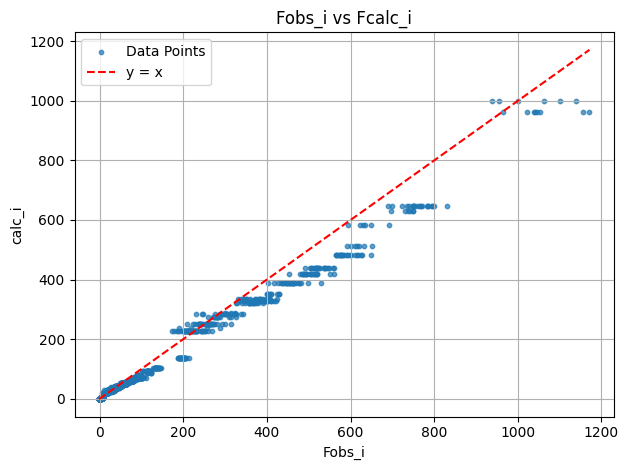

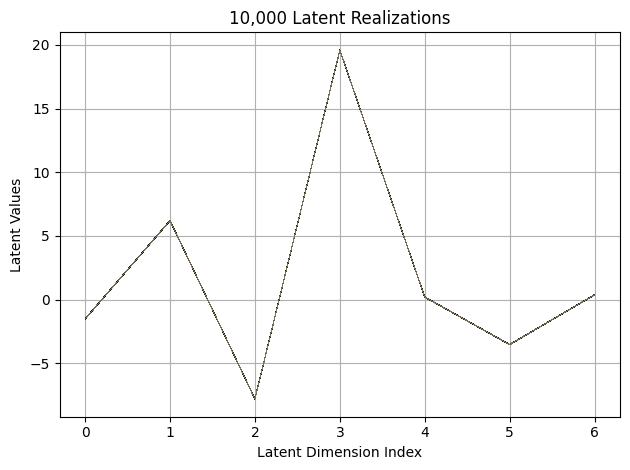

First 10 latent vectors from the VAE:
Sample 1: [-1.5210384130477905, 6.196532249450684, -7.800027370452881, 19.583114624023438, 0.20366092026233673, -3.528308153152466, 0.3692760467529297]
Sample 2: [-1.5048805475234985, 6.209668159484863, -7.802675247192383, 19.5815372467041, 0.20289815962314606, -3.524940013885498, 0.38097551465034485]
Sample 3: [-1.5041084289550781, 6.203546047210693, -7.795409202575684, 19.588699340820312, 0.19857163727283478, -3.5336673259735107, 0.3871864974498749]
Sample 4: [-1.5186628103256226, 6.197129249572754, -7.798773288726807, 19.596576690673828, 0.2001865804195404, -3.5474793910980225, 0.37276795506477356]
Sample 5: [-1.507142424583435, 6.2119245529174805, -7.7909746170043945, 19.593713760375977, 0.1968463957309723, -3.5398945808410645, 0.3776997923851013]
Sample 6: [-1.5317585468292236, 6.196590900421143, -7.793982028961182, 19.58954620361328, 0.18848241865634918, -3.523252248764038, 0.3620656430721283]
Sample 7: [-1.5118334293365479, 6.210844993591309

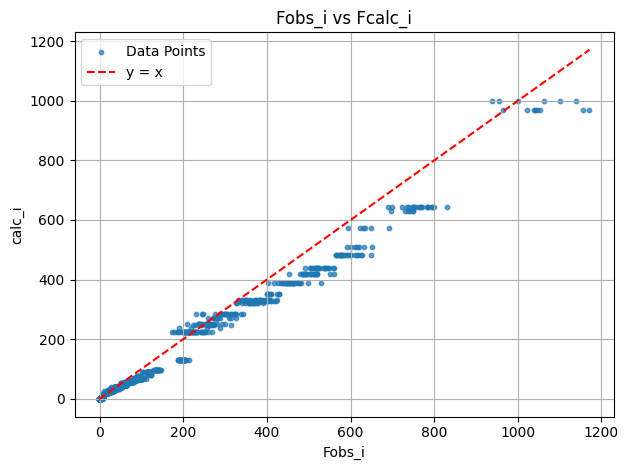

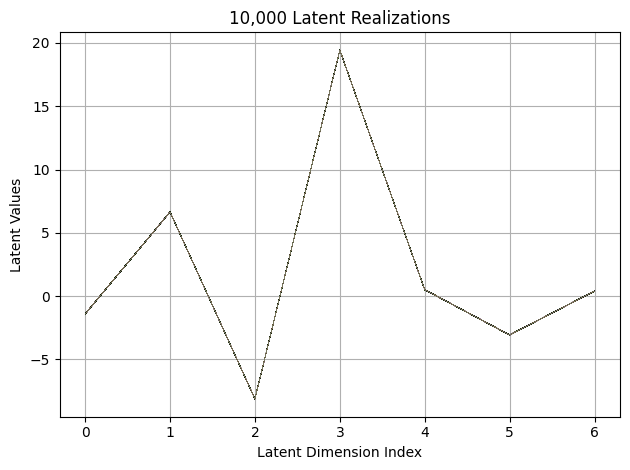

First 10 latent vectors from the VAE:
Sample 1: [-1.4130501747131348, 6.639320373535156, -8.101936340332031, 19.426013946533203, 0.5140317678451538, -3.066103458404541, 0.39867857098579407]
Sample 2: [-1.4174778461456299, 6.647797107696533, -8.111902236938477, 19.42571258544922, 0.5084871649742126, -3.058424472808838, 0.3904527425765991]
Sample 3: [-1.4088538885116577, 6.657979488372803, -8.114494323730469, 19.433902740478516, 0.5086246132850647, -3.0570666790008545, 0.40332984924316406]
Sample 4: [-1.4150722026824951, 6.658148288726807, -8.121482849121094, 19.434703826904297, 0.5063732862472534, -3.0552432537078857, 0.40266433358192444]
Sample 5: [-1.4238454103469849, 6.655728340148926, -8.119470596313477, 19.43768310546875, 0.51143878698349, -3.0697381496429443, 0.4062345325946808]
Sample 6: [-1.4166561365127563, 6.654973983764648, -8.117500305175781, 19.43067741394043, 0.506013810634613, -3.0724294185638428, 0.41167378425598145]
Sample 7: [-1.4306310415267944, 6.646477222442627, -8.

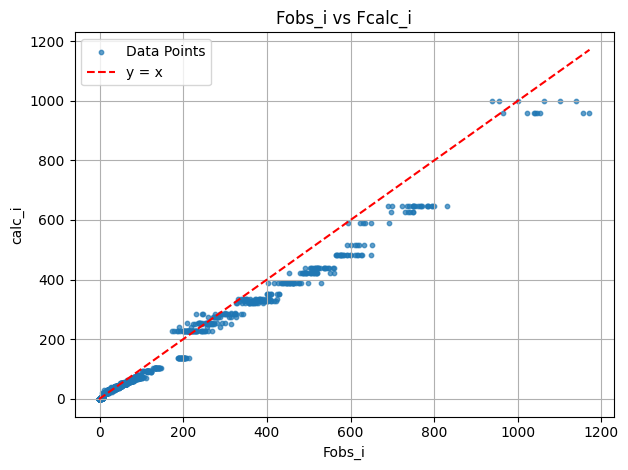

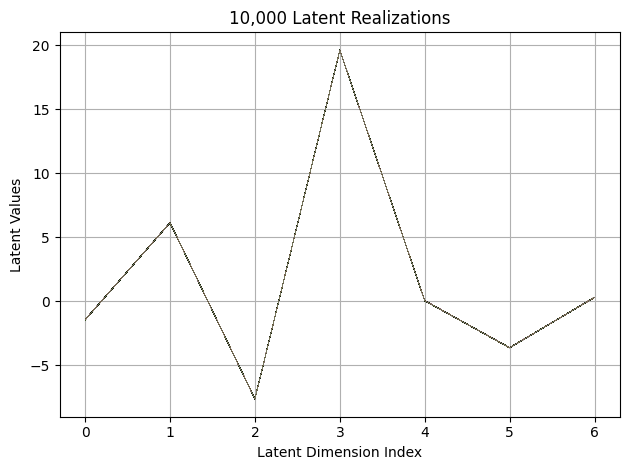

First 10 latent vectors from the VAE:
Sample 1: [-1.4456572532653809, 6.132598876953125, -7.623958110809326, 19.641345977783203, 0.03968524932861328, -3.6299455165863037, 0.3219928741455078]
Sample 2: [-1.4425760507583618, 6.140645980834961, -7.631656646728516, 19.638938903808594, 0.05618984252214432, -3.6041579246520996, 0.3207698166370392]
Sample 3: [-1.4329928159713745, 6.136385440826416, -7.631145000457764, 19.640390396118164, 0.051004569977521896, -3.6236348152160645, 0.3109290599822998]
Sample 4: [-1.4374403953552246, 6.149205207824707, -7.623314380645752, 19.633522033691406, 0.04922543093562126, -3.625359296798706, 0.3068018853664398]
Sample 5: [-1.4428125619888306, 6.152339935302734, -7.6239213943481445, 19.625280380249023, 0.056519001722335815, -3.6378676891326904, 0.31797781586647034]
Sample 6: [-1.4392805099487305, 6.134306907653809, -7.621837615966797, 19.619688034057617, 0.055699605494737625, -3.614022970199585, 0.3100230395793915]
Sample 7: [-1.4444565773010254, 6.1357049

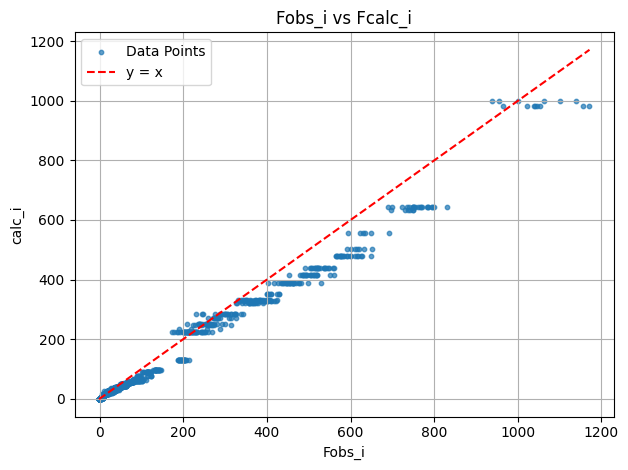

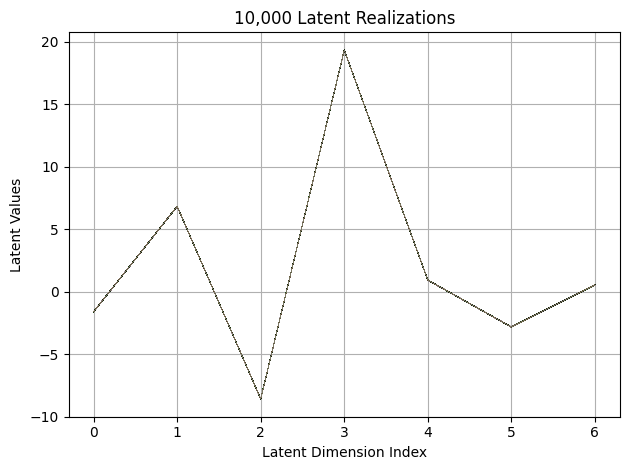

First 10 latent vectors from the VAE:
Sample 1: [-1.6036055088043213, 6.825292110443115, -8.591041564941406, 19.334035873413086, 0.9277025461196899, -2.8288705348968506, 0.5538079142570496]
Sample 2: [-1.6244994401931763, 6.818619728088379, -8.591622352600098, 19.320356369018555, 0.9260010123252869, -2.8388867378234863, 0.5379409790039062]
Sample 3: [-1.6072700023651123, 6.818227767944336, -8.584728240966797, 19.320781707763672, 0.9256499409675598, -2.821502208709717, 0.5463848114013672]
Sample 4: [-1.6124141216278076, 6.8351616859436035, -8.578255653381348, 19.322467803955078, 0.9219132661819458, -2.8406429290771484, 0.5454277992248535]
Sample 5: [-1.6096469163894653, 6.830537796020508, -8.577759742736816, 19.319433212280273, 0.9233879446983337, -2.838585138320923, 0.5357415080070496]
Sample 6: [-1.6010032892227173, 6.837016582489014, -8.597267150878906, 19.33055305480957, 0.9200266003608704, -2.8327276706695557, 0.5444158911705017]
Sample 7: [-1.609952449798584, 6.8242878913879395, -

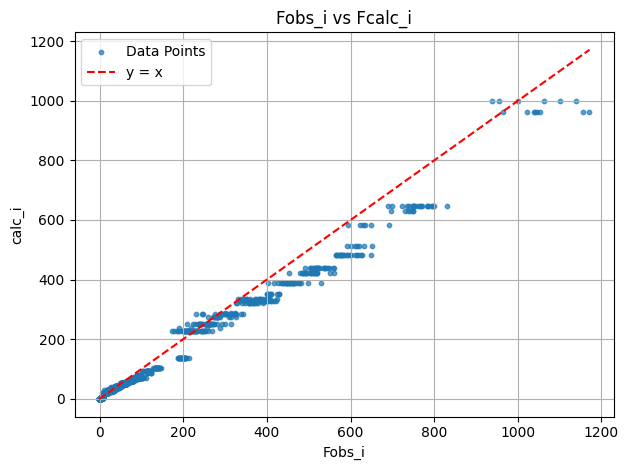

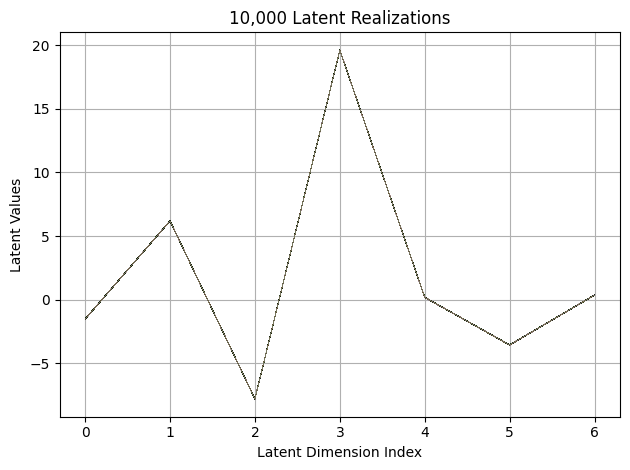

First 10 latent vectors from the VAE:
Sample 1: [-1.5113016366958618, 6.194707870483398, -7.784688949584961, 19.5902156829834, 0.18243394792079926, -3.5406248569488525, 0.36916548013687134]
Sample 2: [-1.5168877840042114, 6.183706760406494, -7.778771877288818, 19.583723068237305, 0.18861925601959229, -3.5494253635406494, 0.36499080061912537]
Sample 3: [-1.517493724822998, 6.183769226074219, -7.787757396697998, 19.607608795166016, 0.1878834217786789, -3.5383589267730713, 0.3777000606060028]
Sample 4: [-1.5302163362503052, 6.191233158111572, -7.777276515960693, 19.599639892578125, 0.19515055418014526, -3.543851137161255, 0.3748624324798584]
Sample 5: [-1.5291736125946045, 6.198615074157715, -7.783927917480469, 19.592491149902344, 0.19617226719856262, -3.5540850162506104, 0.3632427155971527]
Sample 6: [-1.5207570791244507, 6.204013347625732, -7.784365653991699, 19.612651824951172, 0.178762748837471, -3.556685209274292, 0.36465445160865784]
Sample 7: [-1.507154107093811, 6.188763618469238,

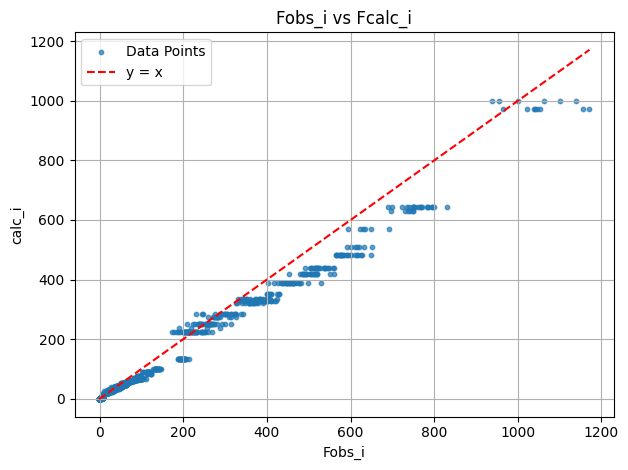

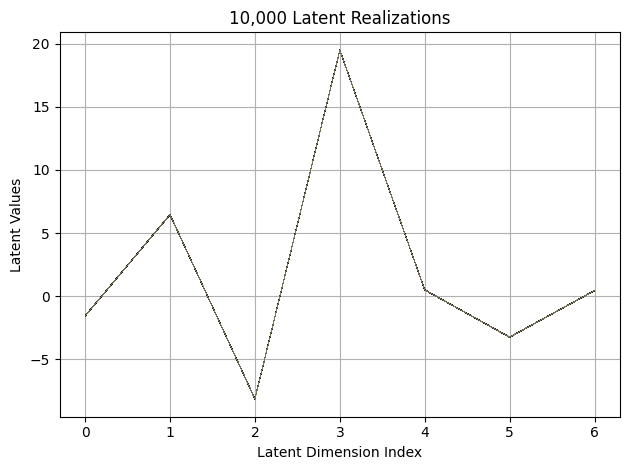

First 10 latent vectors from the VAE:
Sample 1: [-1.57527494430542, 6.4566216468811035, -8.119213104248047, 19.485502243041992, 0.5044428706169128, -3.2406797409057617, 0.4384789764881134]
Sample 2: [-1.5650607347488403, 6.4492316246032715, -8.135611534118652, 19.48009490966797, 0.5004905462265015, -3.239569664001465, 0.4451606571674347]
Sample 3: [-1.5546669960021973, 6.4524006843566895, -8.122234344482422, 19.484350204467773, 0.5018149018287659, -3.233262062072754, 0.4373004734516144]
Sample 4: [-1.5710469484329224, 6.46219539642334, -8.119986534118652, 19.48236083984375, 0.4989531338214874, -3.253345012664795, 0.45777156949043274]
Sample 5: [-1.5594960451126099, 6.4500651359558105, -8.137796401977539, 19.483623504638672, 0.508723258972168, -3.241837501525879, 0.4421835243701935]
Sample 6: [-1.5597376823425293, 6.465469837188721, -8.13101863861084, 19.48086166381836, 0.505143404006958, -3.2373201847076416, 0.45427438616752625]
Sample 7: [-1.5630929470062256, 6.4552459716796875, -8.12

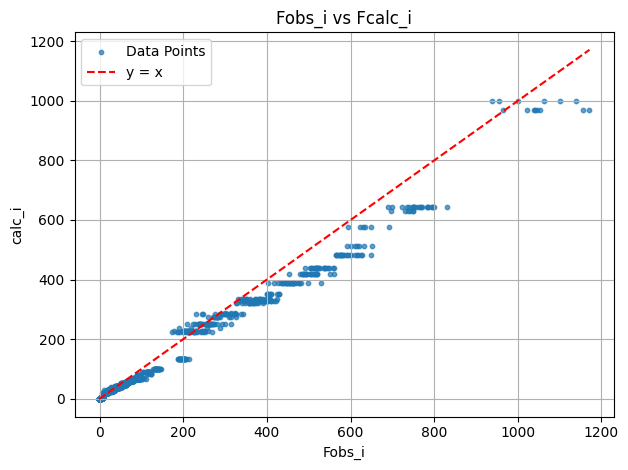

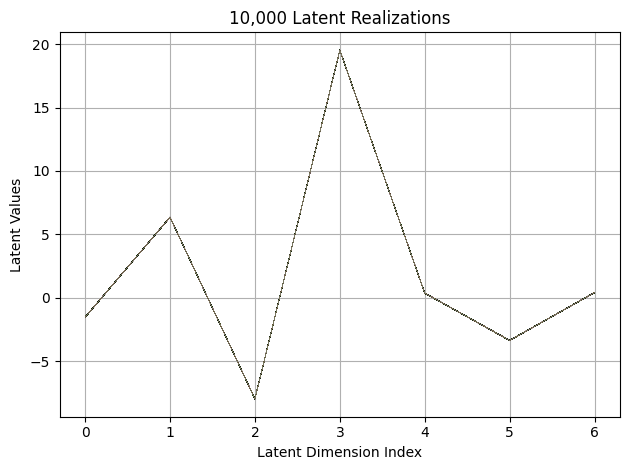

First 10 latent vectors from the VAE:
Sample 1: [-1.5401760339736938, 6.352604866027832, -7.969189167022705, 19.527463912963867, 0.3591454029083252, -3.368990659713745, 0.4098188579082489]
Sample 2: [-1.530478835105896, 6.352081298828125, -7.974398612976074, 19.535503387451172, 0.36448851227760315, -3.3753209114074707, 0.41114506125450134]
Sample 3: [-1.5316505432128906, 6.343336582183838, -7.965635776519775, 19.522869110107422, 0.3673911392688751, -3.3586480617523193, 0.40316930413246155]
Sample 4: [-1.5319324731826782, 6.347643852233887, -7.958563804626465, 19.52506446838379, 0.3650325834751129, -3.3678722381591797, 0.4038277864456177]
Sample 5: [-1.5395867824554443, 6.359206199645996, -7.994143486022949, 19.535322189331055, 0.3519931137561798, -3.363387107849121, 0.41119036078453064]
Sample 6: [-1.5332132577896118, 6.3603949546813965, -7.964771747589111, 19.53369903564453, 0.3746614456176758, -3.3724961280822754, 0.40801069140434265]
Sample 7: [-1.5410196781158447, 6.354354381561279

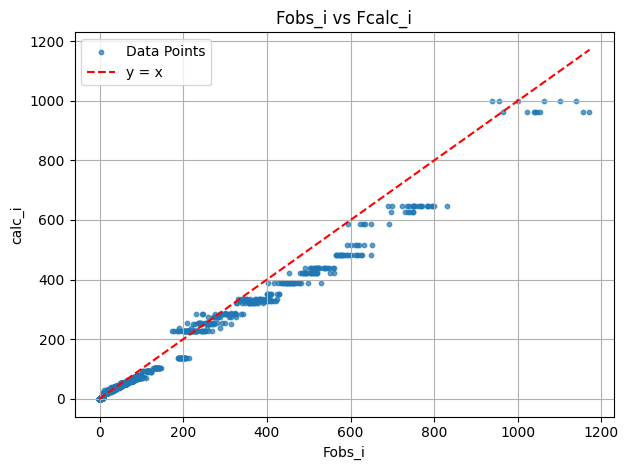

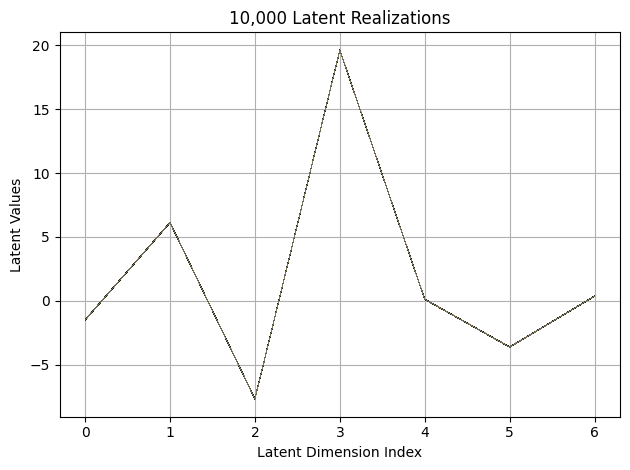

First 10 latent vectors from the VAE:
Sample 1: [-1.509338140487671, 6.10952091217041, -7.704250335693359, 19.614395141601562, 0.1119687557220459, -3.629452705383301, 0.3609393835067749]
Sample 2: [-1.5133453607559204, 6.114761829376221, -7.691308975219727, 19.63188362121582, 0.11138845235109329, -3.6249849796295166, 0.35272231698036194]
Sample 3: [-1.505269169807434, 6.115728855133057, -7.69923734664917, 19.629737854003906, 0.1052975133061409, -3.6212968826293945, 0.35416290163993835]
Sample 4: [-1.5149344205856323, 6.115861892700195, -7.699079990386963, 19.613758087158203, 0.11442328989505768, -3.6358702182769775, 0.3575911521911621]
Sample 5: [-1.5043598413467407, 6.119697570800781, -7.7018208503723145, 19.63437843322754, 0.108575738966465, -3.622438669204712, 0.3627639710903168]
Sample 6: [-1.5093011856079102, 6.118916034698486, -7.685613632202148, 19.626026153564453, 0.10787157714366913, -3.6244394779205322, 0.3435494601726532]
Sample 7: [-1.5101239681243896, 6.1143951416015625, -

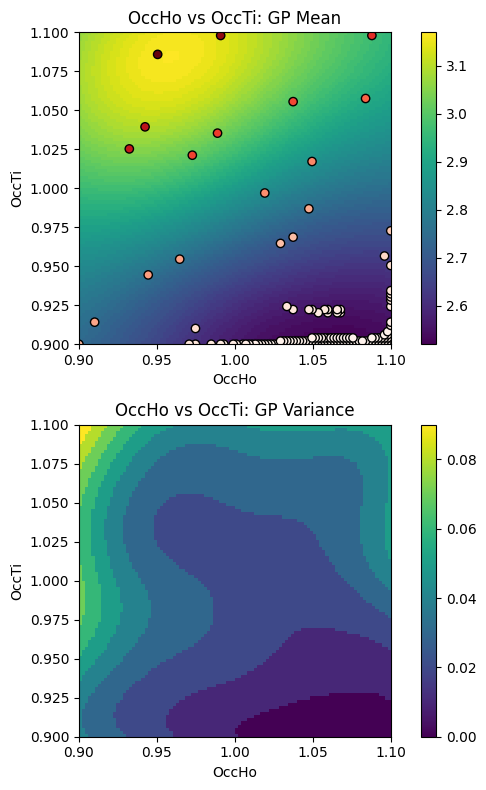

EI: [-1.00000000e+00  4.93462570e-03  4.81148995e-03 ...  4.60842857e-04
  5.31150028e-04  6.13184180e-04]
Function eval #160
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9060605764389038, 1.0939394235610962]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4111
initial chi^2 2.124e+06 with 2596 obs.
New scale: 0.4101
Cycle 0: 0.88s, Chi**2: 4.1444e+05 for 2596 obs., Lambda: 0,  Delta: 0.805, SVD=0
New scale: 0.4101
Maximum shift/esd = -266.0

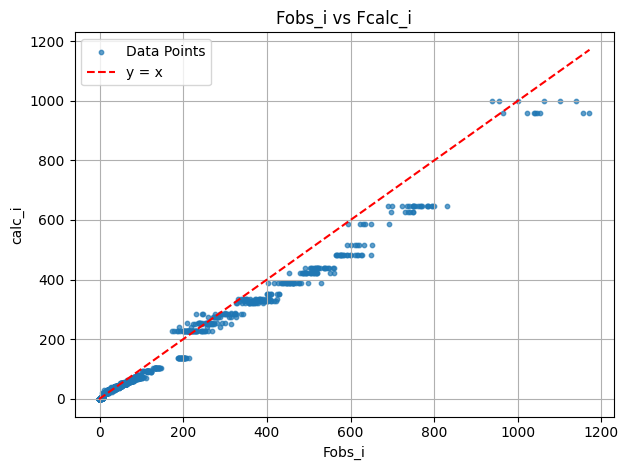

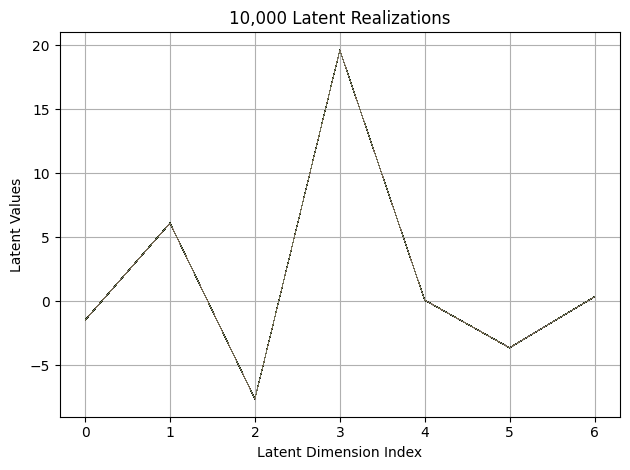

First 10 latent vectors from the VAE:
Sample 1: [-1.4926339387893677, 6.1079325675964355, -7.653358459472656, 19.63726234436035, 0.07903825491666794, -3.656754493713379, 0.33140960335731506]
Sample 2: [-1.475955605506897, 6.113222599029541, -7.658142566680908, 19.634572982788086, 0.059161361306905746, -3.656691312789917, 0.34734097123146057]
Sample 3: [-1.5051385164260864, 6.107080936431885, -7.660550594329834, 19.630985260009766, 0.07630530744791031, -3.655141592025757, 0.3340078592300415]
Sample 4: [-1.4858886003494263, 6.101624488830566, -7.6510419845581055, 19.651628494262695, 0.08023421466350555, -3.6719162464141846, 0.33396124839782715]
Sample 5: [-1.4943406581878662, 6.101129531860352, -7.648616313934326, 19.634347915649414, 0.07099167257547379, -3.653672695159912, 0.34226804971694946]
Sample 6: [-1.4800570011138916, 6.103064060211182, -7.645998477935791, 19.625259399414062, 0.07002896070480347, -3.65077543258667, 0.33459824323654175]
Sample 7: [-1.4912341833114624, 6.1002721786

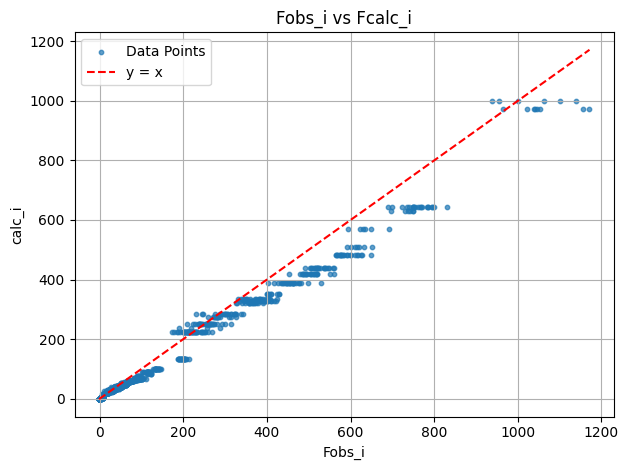

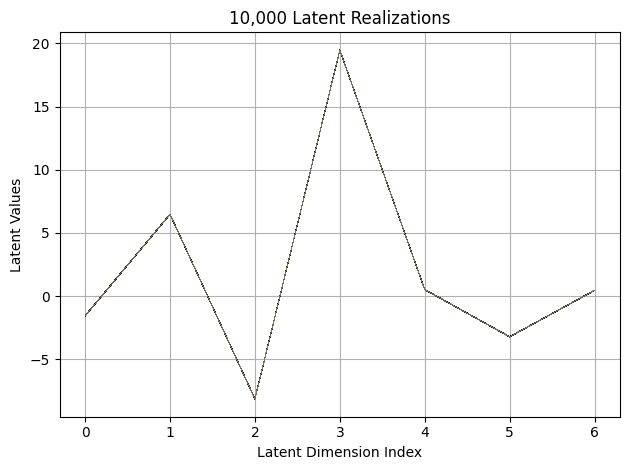

First 10 latent vectors from the VAE:
Sample 1: [-1.5638165473937988, 6.479040622711182, -8.141953468322754, 19.477672576904297, 0.5135173797607422, -3.228898525238037, 0.4473245143890381]
Sample 2: [-1.5672197341918945, 6.467353343963623, -8.140172004699707, 19.480627059936523, 0.5088638067245483, -3.228475570678711, 0.4630677103996277]
Sample 3: [-1.5731031894683838, 6.475283622741699, -8.139721870422363, 19.47804832458496, 0.5179970860481262, -3.2259068489074707, 0.44646430015563965]
Sample 4: [-1.5543761253356934, 6.482977390289307, -8.14425277709961, 19.481586456298828, 0.5084801912307739, -3.219829559326172, 0.45567047595977783]
Sample 5: [-1.5599205493927002, 6.467491149902344, -8.15206527709961, 19.479999542236328, 0.522356390953064, -3.2291007041931152, 0.4524914622306824]
Sample 6: [-1.5573046207427979, 6.474916934967041, -8.147562980651855, 19.462970733642578, 0.51772540807724, -3.222581624984741, 0.4478444457054138]
Sample 7: [-1.5604050159454346, 6.468572616577148, -8.1409

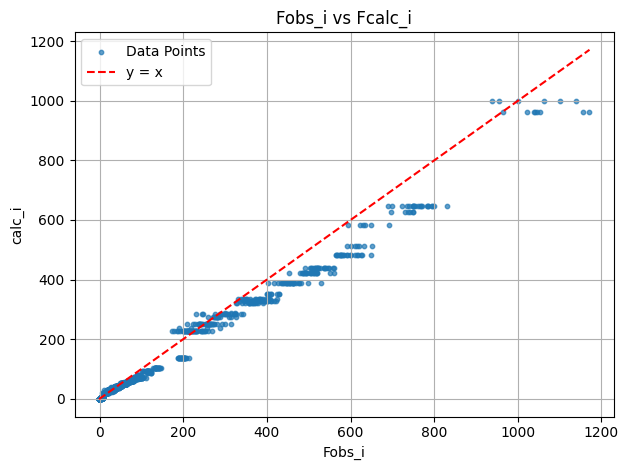

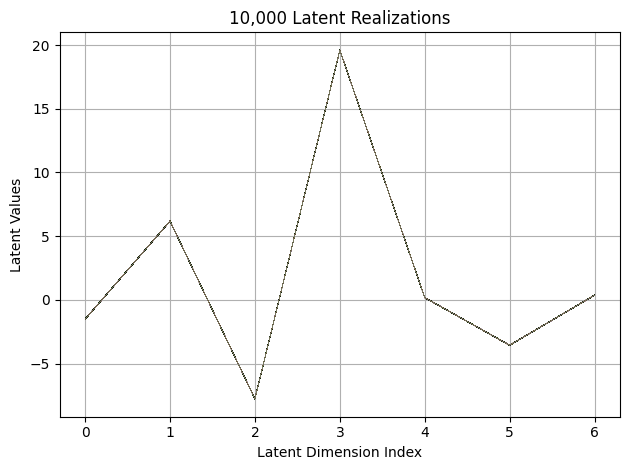

First 10 latent vectors from the VAE:
Sample 1: [-1.5094184875488281, 6.165280818939209, -7.781367778778076, 19.60445213317871, 0.18434114754199982, -3.5578296184539795, 0.3775911033153534]
Sample 2: [-1.5212304592132568, 6.176220893859863, -7.768955230712891, 19.599414825439453, 0.16264022886753082, -3.5471982955932617, 0.35881781578063965]
Sample 3: [-1.513863205909729, 6.174163818359375, -7.769594192504883, 19.605073928833008, 0.17488667368888855, -3.5589606761932373, 0.3723921775817871]
Sample 4: [-1.5210089683532715, 6.180722236633301, -7.764042854309082, 19.60442543029785, 0.17407897114753723, -3.563610792160034, 0.3627854287624359]
Sample 5: [-1.5102790594100952, 6.180591106414795, -7.773434162139893, 19.587841033935547, 0.17561158537864685, -3.5600695610046387, 0.36266759037971497]
Sample 6: [-1.5143576860427856, 6.167151927947998, -7.765185356140137, 19.593482971191406, 0.17828567326068878, -3.561281204223633, 0.370108038187027]
Sample 7: [-1.5214104652404785, 6.18073463439941

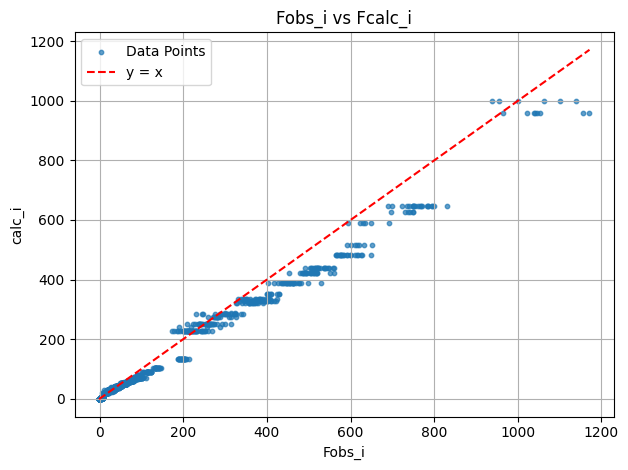

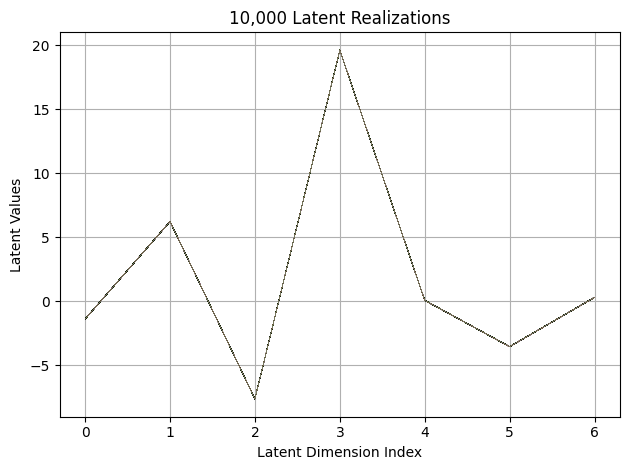

First 10 latent vectors from the VAE:
Sample 1: [-1.3806036710739136, 6.226777076721191, -7.626771450042725, 19.597957611083984, 0.07758993655443192, -3.5457990169525146, 0.3019018769264221]
Sample 2: [-1.3868365287780762, 6.223552227020264, -7.632031440734863, 19.613189697265625, 0.06191859394311905, -3.5531985759735107, 0.3045719265937805]
Sample 3: [-1.3865852355957031, 6.219099998474121, -7.6356048583984375, 19.617298126220703, 0.06829550862312317, -3.551213502883911, 0.30558642745018005]
Sample 4: [-1.3923617601394653, 6.219792366027832, -7.62739372253418, 19.609411239624023, 0.05163218453526497, -3.5475618839263916, 0.3047706186771393]
Sample 5: [-1.3889398574829102, 6.225688934326172, -7.634122371673584, 19.616260528564453, 0.07076624780893326, -3.5534403324127197, 0.3142264783382416]
Sample 6: [-1.3938122987747192, 6.229813575744629, -7.6345534324646, 19.618518829345703, 0.07497191429138184, -3.5376033782958984, 0.3007552921772003]
Sample 7: [-1.4001203775405884, 6.217944622039

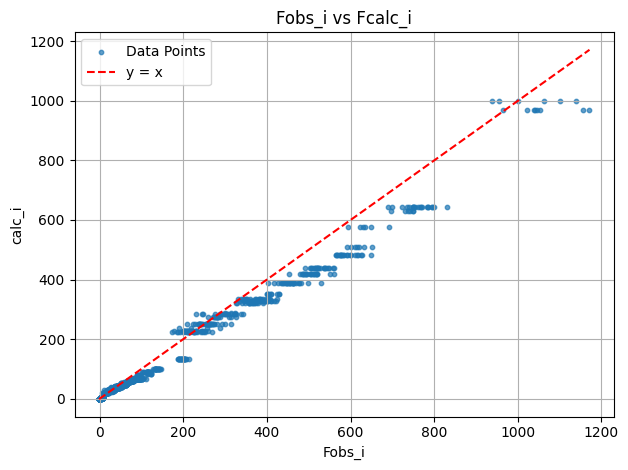

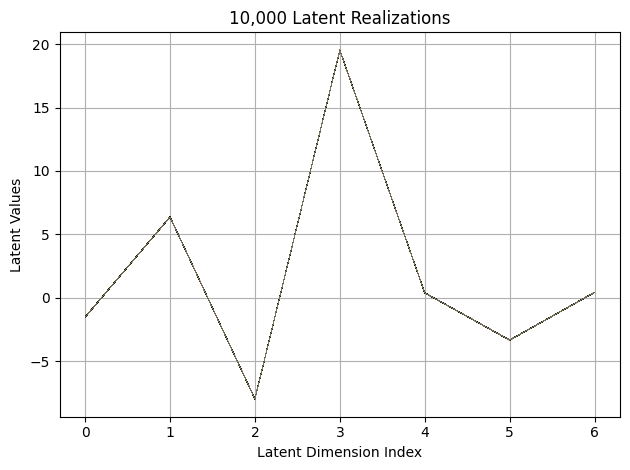

First 10 latent vectors from the VAE:
Sample 1: [-1.5334960222244263, 6.378392696380615, -7.993842124938965, 19.520265579223633, 0.3629084825515747, -3.3490030765533447, 0.41728276014328003]
Sample 2: [-1.5416158437728882, 6.361996650695801, -7.997687339782715, 19.53213882446289, 0.3948899209499359, -3.351712942123413, 0.42659205198287964]
Sample 3: [-1.5289242267608643, 6.356320858001709, -7.988827705383301, 19.522361755371094, 0.3843182921409607, -3.3475985527038574, 0.40570834279060364]
Sample 4: [-1.5542094707489014, 6.360438346862793, -7.993209362030029, 19.51572036743164, 0.37162846326828003, -3.3438327312469482, 0.4175342321395874]
Sample 5: [-1.5353267192840576, 6.3727192878723145, -7.987918853759766, 19.551544189453125, 0.386453241109848, -3.3570969104766846, 0.43562090396881104]
Sample 6: [-1.5299909114837646, 6.371751308441162, -7.985562324523926, 19.511917114257812, 0.39078253507614136, -3.3487372398376465, 0.41201114654541016]
Sample 7: [-1.5287935733795166, 6.356134414672

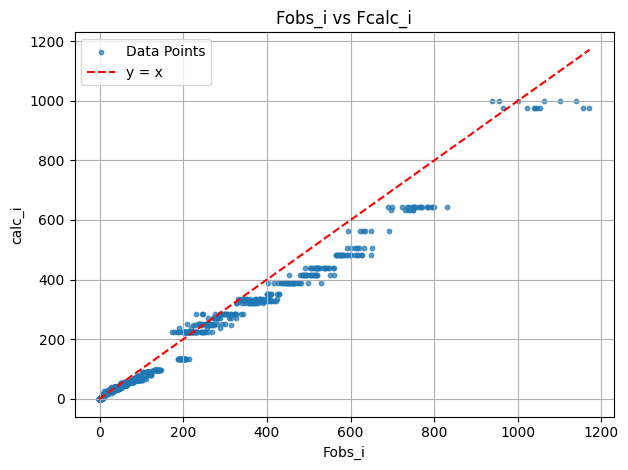

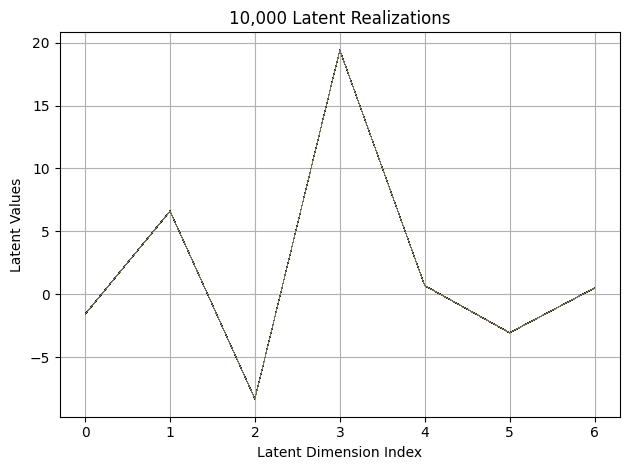

First 10 latent vectors from the VAE:
Sample 1: [-1.5975703001022339, 6.605284690856934, -8.324591636657715, 19.4206485748291, 0.6814025044441223, -3.061589241027832, 0.5032033324241638]
Sample 2: [-1.5992302894592285, 6.604008197784424, -8.32949447631836, 19.411426544189453, 0.6981446743011475, -3.0744245052337646, 0.4825928211212158]
Sample 3: [-1.590891718864441, 6.60795783996582, -8.328378677368164, 19.408430099487305, 0.6834974884986877, -3.07205867767334, 0.49565809965133667]
Sample 4: [-1.5898356437683105, 6.611313819885254, -8.318394660949707, 19.41447639465332, 0.6872091293334961, -3.0620031356811523, 0.48852676153182983]
Sample 5: [-1.5871760845184326, 6.612451553344727, -8.324943542480469, 19.424039840698242, 0.6799910664558411, -3.070769786834717, 0.4925374984741211]
Sample 6: [-1.5912694931030273, 6.608948707580566, -8.328380584716797, 19.41800880432129, 0.6861290335655212, -3.0651133060455322, 0.495707631111145]
Sample 7: [-1.5903894901275635, 6.61669921875, -8.3423070907

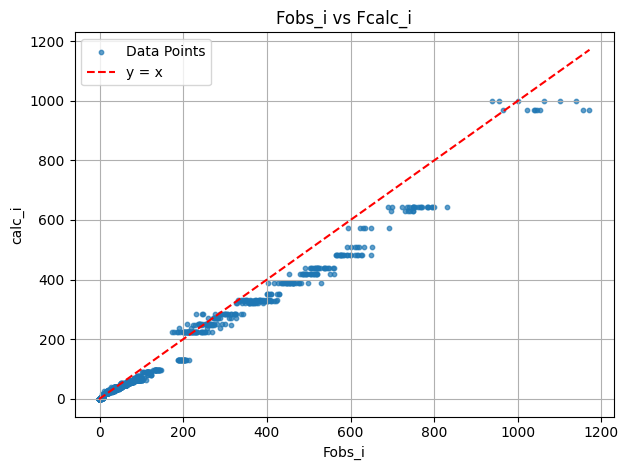

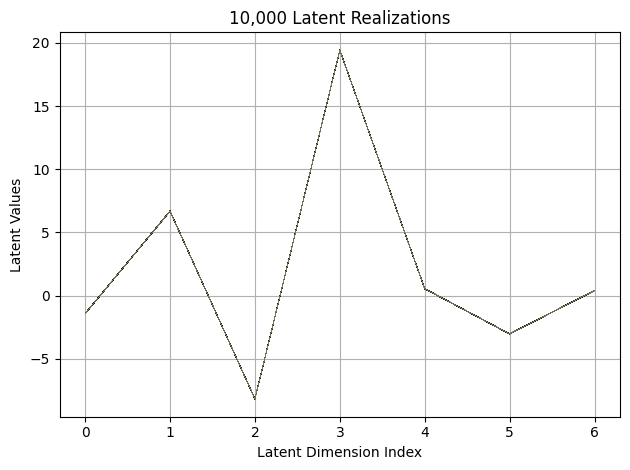

First 10 latent vectors from the VAE:
Sample 1: [-1.4198107719421387, 6.684877395629883, -8.174917221069336, 19.417415618896484, 0.5552547574043274, -3.01696515083313, 0.4190548062324524]
Sample 2: [-1.4263336658477783, 6.677437782287598, -8.165288925170898, 19.4278507232666, 0.5471585988998413, -3.025141477584839, 0.40778109431266785]
Sample 3: [-1.4237685203552246, 6.676599502563477, -8.154996871948242, 19.420379638671875, 0.5364513993263245, -3.0264363288879395, 0.40379491448402405]
Sample 4: [-1.4174247980117798, 6.690406799316406, -8.16141414642334, 19.423511505126953, 0.5561316609382629, -3.0235979557037354, 0.41250985860824585]
Sample 5: [-1.4202176332473755, 6.688122749328613, -8.169743537902832, 19.418766021728516, 0.5511340498924255, -3.0276122093200684, 0.4054778218269348]
Sample 6: [-1.4191555976867676, 6.6802496910095215, -8.1639404296875, 19.418155670166016, 0.5578004121780396, -3.028291940689087, 0.40505269169807434]
Sample 7: [-1.4205446243286133, 6.678253650665283, -8.

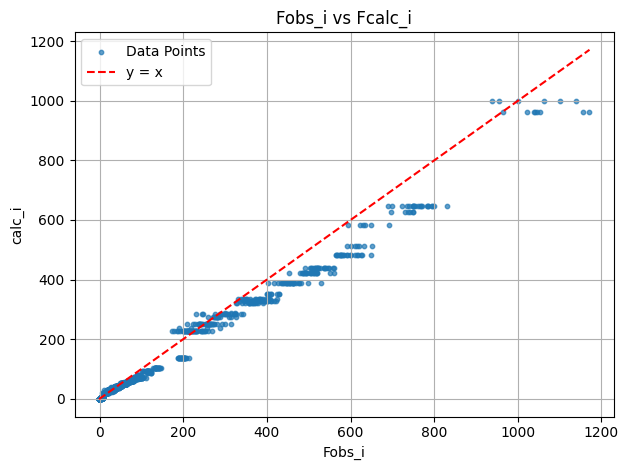

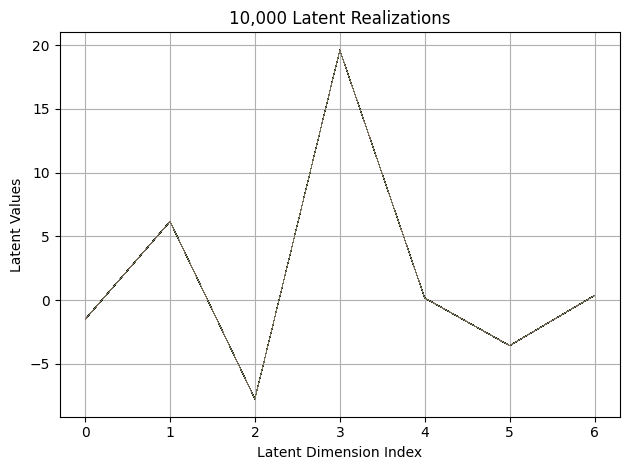

First 10 latent vectors from the VAE:
Sample 1: [-1.5152610540390015, 6.1715826988220215, -7.752204418182373, 19.600200653076172, 0.16441813111305237, -3.5811502933502197, 0.36615926027297974]
Sample 2: [-1.50496244430542, 6.162817001342773, -7.750448226928711, 19.599374771118164, 0.1640447974205017, -3.571542501449585, 0.3673723638057709]
Sample 3: [-1.5193358659744263, 6.159098148345947, -7.750371932983398, 19.586563110351562, 0.16449260711669922, -3.5745089054107666, 0.35550621151924133]
Sample 4: [-1.5183722972869873, 6.168261528015137, -7.766530990600586, 19.60527992248535, 0.16653317213058472, -3.584153413772583, 0.3620120584964752]
Sample 5: [-1.5157482624053955, 6.17186164855957, -7.755355358123779, 19.605907440185547, 0.1686931997537613, -3.567614793777466, 0.36831071972846985]
Sample 6: [-1.506142020225525, 6.165279388427734, -7.755123138427734, 19.6096248626709, 0.1576257199048996, -3.574043035507202, 0.37650418281555176]
Sample 7: [-1.5082029104232788, 6.165957927703857, -7

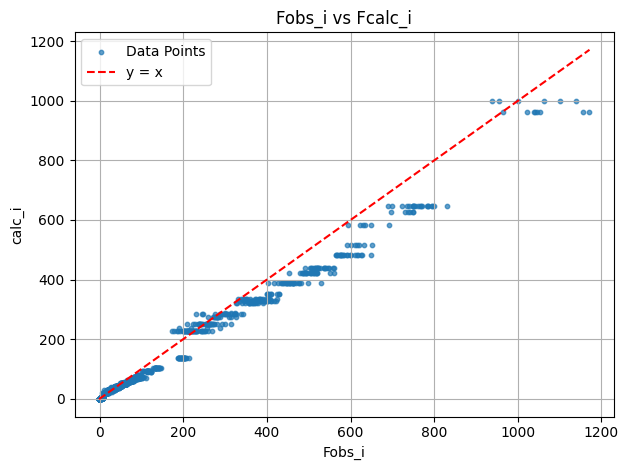

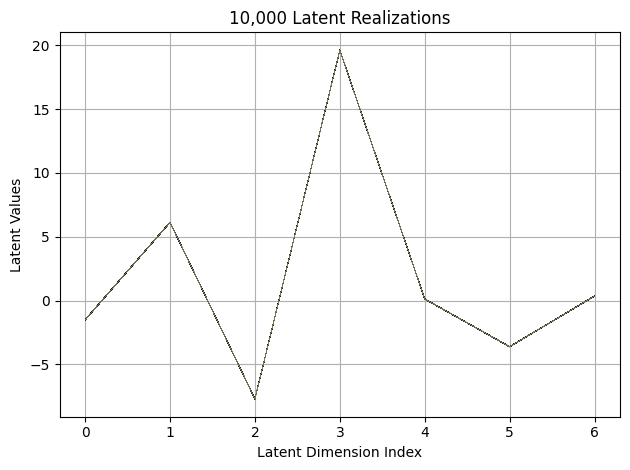

First 10 latent vectors from the VAE:
Sample 1: [-1.5050326585769653, 6.129735469818115, -7.714633941650391, 19.637617111206055, 0.12487234175205231, -3.609553575515747, 0.3621389865875244]
Sample 2: [-1.5068176984786987, 6.127018928527832, -7.7027106285095215, 19.62410545349121, 0.11348751932382584, -3.613259792327881, 0.3576471507549286]
Sample 3: [-1.499922513961792, 6.1189775466918945, -7.717523097991943, 19.613988876342773, 0.10884672403335571, -3.6237218379974365, 0.34273815155029297]
Sample 4: [-1.5134254693984985, 6.1470184326171875, -7.713770866394043, 19.62449073791504, 0.12982061505317688, -3.618594169616699, 0.3527950048446655]
Sample 5: [-1.5053573846817017, 6.123727798461914, -7.710287094116211, 19.624025344848633, 0.1256193220615387, -3.6190061569213867, 0.35288140177726746]
Sample 6: [-1.5168899297714233, 6.128696918487549, -7.70997428894043, 19.627334594726562, 0.1252087652683258, -3.6243324279785156, 0.35140806436538696]
Sample 7: [-1.5149847269058228, 6.1358795166015

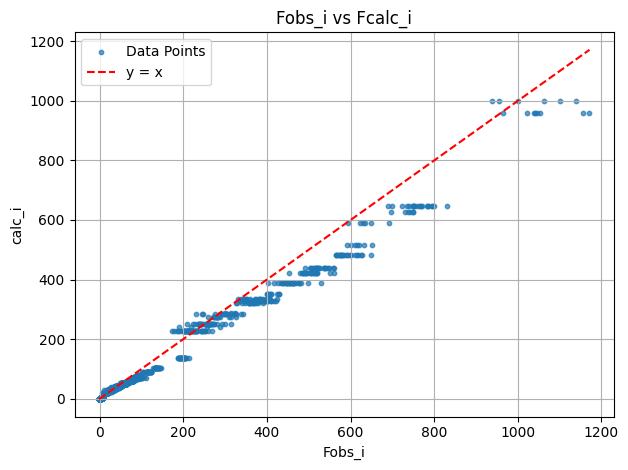

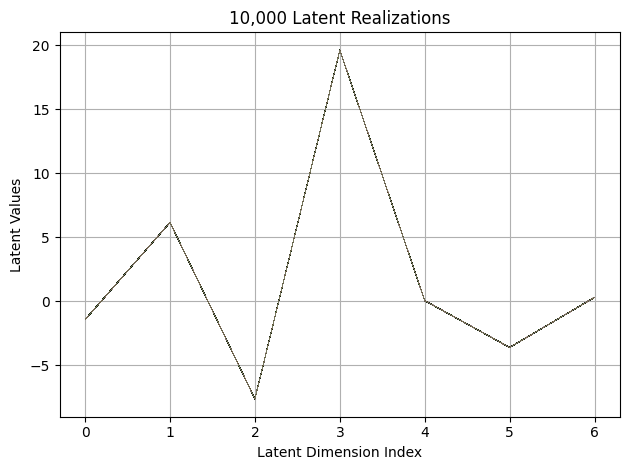

First 10 latent vectors from the VAE:
Sample 1: [-1.4235615730285645, 6.160817623138428, -7.62612771987915, 19.62453269958496, 0.03378771245479584, -3.6037333011627197, 0.3159835934638977]
Sample 2: [-1.428596019744873, 6.154648303985596, -7.6249871253967285, 19.626041412353516, 0.051181551069021225, -3.6106767654418945, 0.3294079005718231]
Sample 3: [-1.4358679056167603, 6.161402702331543, -7.620814323425293, 19.623741149902344, 0.052416544407606125, -3.6010890007019043, 0.31883782148361206]
Sample 4: [-1.4272819757461548, 6.161056041717529, -7.622962951660156, 19.620325088500977, 0.05624866858124733, -3.6046078205108643, 0.3120247423648834]
Sample 5: [-1.4196898937225342, 6.159804821014404, -7.614411354064941, 19.619606018066406, 0.060164403170347214, -3.609956741333008, 0.313602089881897]
Sample 6: [-1.4254708290100098, 6.159012317657471, -7.614991664886475, 19.624717712402344, 0.05136490985751152, -3.6011319160461426, 0.31918537616729736]
Sample 7: [-1.4204670190811157, 6.168952941

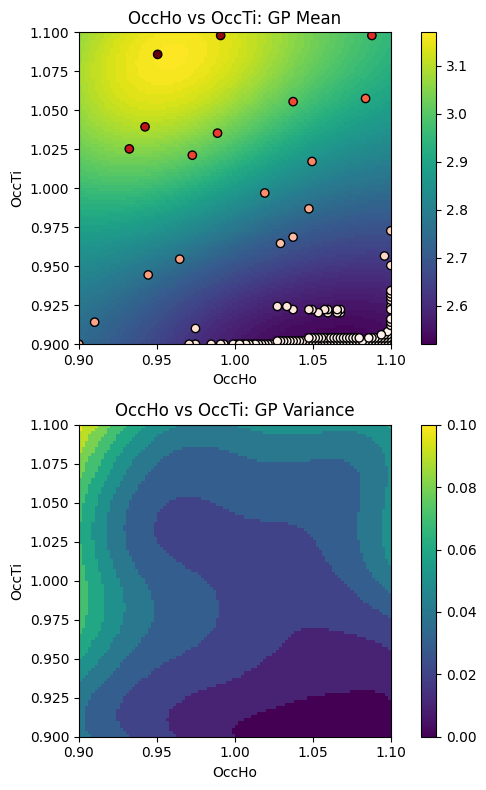

EI: [-1.00000000e+00  5.14727272e-03  5.01833111e-03 ...  4.97610774e-04
  5.73536847e-04  6.62289560e-04]
Function eval #170
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 0.9626262784004211]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.5221
initial chi^2 8.1465e+05 with 2596 obs.
New scale: 0.5221
Cycle 0: 0.70s, Chi**2: 2.8344e+05 for 2596 obs., Lambda: 0,  Delta: 0.652, SVD=0
New scale: 0.5221
Maximum shift/esd = -160.

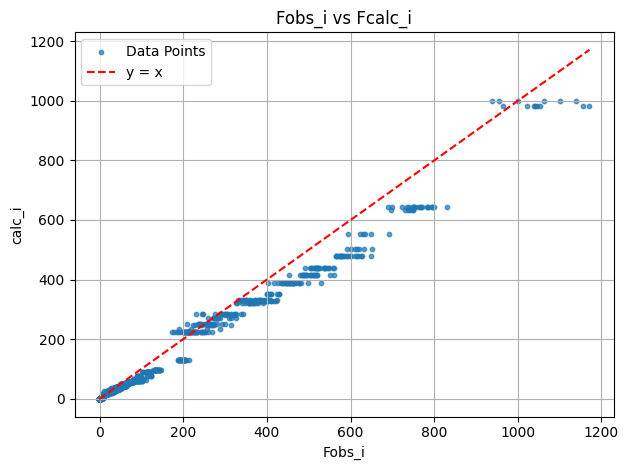

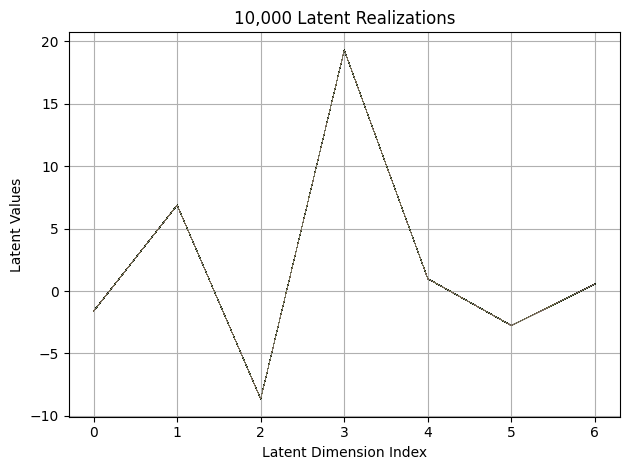

First 10 latent vectors from the VAE:
Sample 1: [-1.6245388984680176, 6.873337745666504, -8.647363662719727, 19.299100875854492, 0.9768790602684021, -2.775357484817505, 0.5608123540878296]
Sample 2: [-1.6010966300964355, 6.872053146362305, -8.648229598999023, 19.301607131958008, 0.9803463816642761, -2.7742984294891357, 0.5535184741020203]
Sample 3: [-1.622926115989685, 6.881499290466309, -8.654640197753906, 19.30389976501465, 0.9806417226791382, -2.763070821762085, 0.5669551491737366]
Sample 4: [-1.6121128797531128, 6.87518835067749, -8.647640228271484, 19.296260833740234, 0.9826876521110535, -2.7685046195983887, 0.5479109287261963]
Sample 5: [-1.6280832290649414, 6.876026153564453, -8.643477439880371, 19.30246925354004, 0.971372127532959, -2.7540643215179443, 0.5513086318969727]
Sample 6: [-1.6099046468734741, 6.870848178863525, -8.648704528808594, 19.290451049804688, 0.9835740327835083, -2.774509906768799, 0.5569711327552795]
Sample 7: [-1.6129045486450195, 6.870260715484619, -8.6449

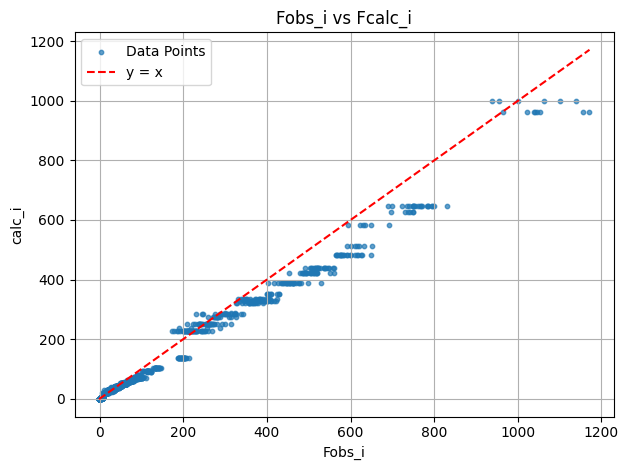

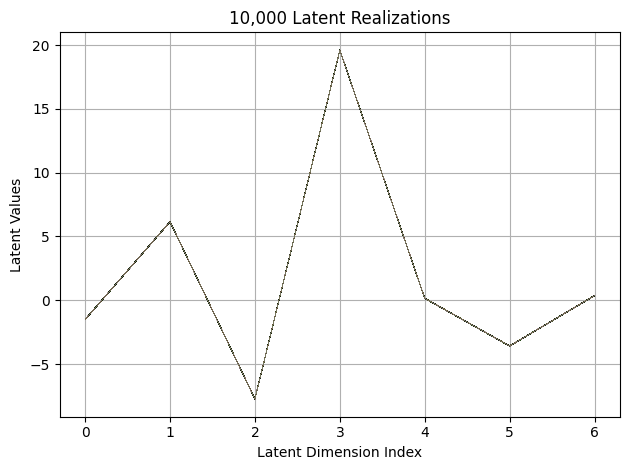

First 10 latent vectors from the VAE:
Sample 1: [-1.5140674114227295, 6.151828289031982, -7.74342679977417, 19.610097885131836, 0.16386736929416656, -3.583714723587036, 0.3572064936161041]
Sample 2: [-1.5221554040908813, 6.151074409484863, -7.729334831237793, 19.60616111755371, 0.150234192609787, -3.584303379058838, 0.3574654161930084]
Sample 3: [-1.5163708925247192, 6.151465892791748, -7.741543292999268, 19.61329460144043, 0.14189162850379944, -3.5900328159332275, 0.3586852252483368]
Sample 4: [-1.5130099058151245, 6.15273380279541, -7.738449573516846, 19.621417999267578, 0.151793971657753, -3.5878124237060547, 0.3556548058986664]
Sample 5: [-1.5087765455245972, 6.155764102935791, -7.731653213500977, 19.615386962890625, 0.14677225053310394, -3.602722406387329, 0.354736328125]
Sample 6: [-1.5052354335784912, 6.160892486572266, -7.7364349365234375, 19.60845375061035, 0.15940919518470764, -3.5891754627227783, 0.3643054664134979]
Sample 7: [-1.5015987157821655, 6.150247097015381, -7.74956

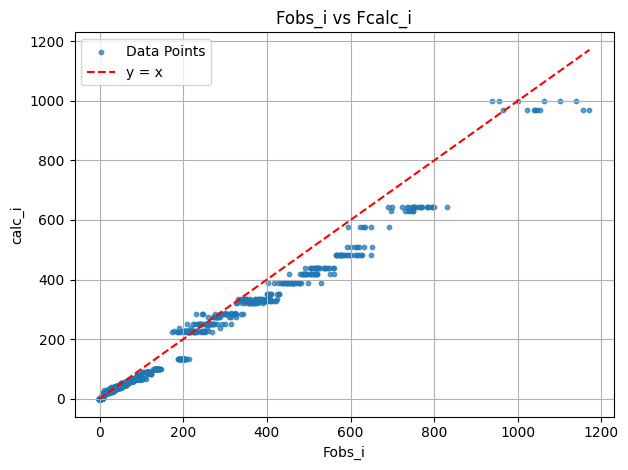

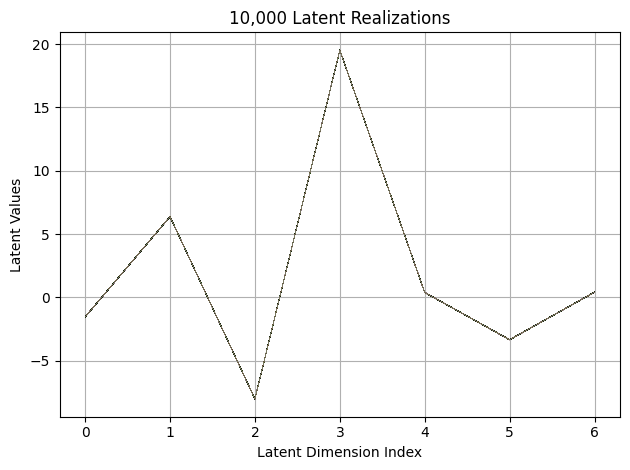

First 10 latent vectors from the VAE:
Sample 1: [-1.5474380254745483, 6.371081352233887, -8.019243240356445, 19.530567169189453, 0.39073893427848816, -3.349414348602295, 0.4236065447330475]
Sample 2: [-1.531197190284729, 6.363194942474365, -8.014911651611328, 19.516300201416016, 0.3862917423248291, -3.339430332183838, 0.41840291023254395]
Sample 3: [-1.5306707620620728, 6.381028175354004, -7.996611595153809, 19.532737731933594, 0.39598265290260315, -3.3310179710388184, 0.41223081946372986]
Sample 4: [-1.5332274436950684, 6.371544361114502, -7.999303340911865, 19.506816864013672, 0.4027792811393738, -3.3385303020477295, 0.4235306680202484]
Sample 5: [-1.5466519594192505, 6.379685401916504, -8.00587272644043, 19.512540817260742, 0.3943055272102356, -3.3428733348846436, 0.418145090341568]
Sample 6: [-1.5375539064407349, 6.357982635498047, -7.999067783355713, 19.53006935119629, 0.3951377272605896, -3.3368358612060547, 0.40465885400772095]
Sample 7: [-1.5287885665893555, 6.373723983764648, 

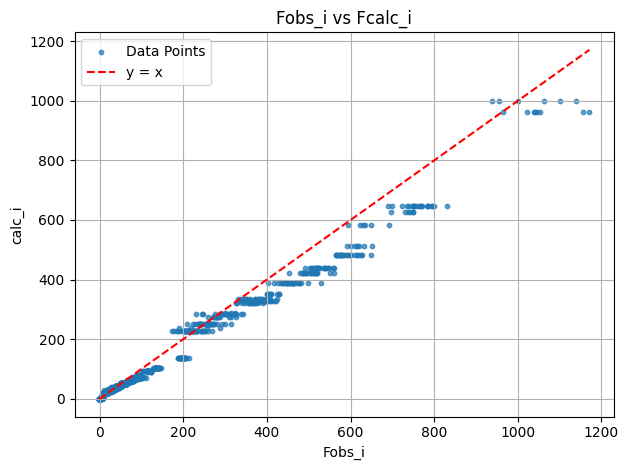

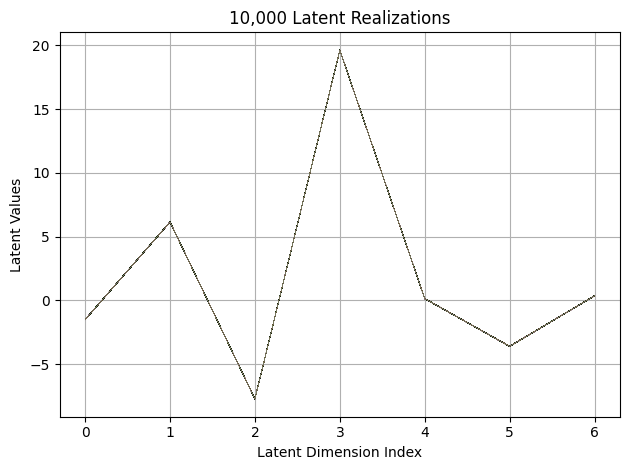

First 10 latent vectors from the VAE:
Sample 1: [-1.5214974880218506, 6.137476921081543, -7.714366436004639, 19.607372283935547, 0.1380484402179718, -3.59801983833313, 0.3561229705810547]
Sample 2: [-1.511277198791504, 6.143433094024658, -7.718539714813232, 19.628238677978516, 0.13958370685577393, -3.6067981719970703, 0.3619552552700043]
Sample 3: [-1.5125014781951904, 6.142158031463623, -7.7268171310424805, 19.62325096130371, 0.1402827501296997, -3.604278087615967, 0.36558881402015686]
Sample 4: [-1.5073155164718628, 6.140411376953125, -7.705677032470703, 19.625295639038086, 0.1358020007610321, -3.5938503742218018, 0.35347771644592285]
Sample 5: [-1.511025071144104, 6.13664436340332, -7.714219093322754, 19.6204776763916, 0.14139991998672485, -3.6063191890716553, 0.3548431098461151]
Sample 6: [-1.5092475414276123, 6.142946720123291, -7.722766876220703, 19.620454788208008, 0.13410453498363495, -3.5996809005737305, 0.3536299467086792]
Sample 7: [-1.5131793022155762, 6.140120029449463, -7

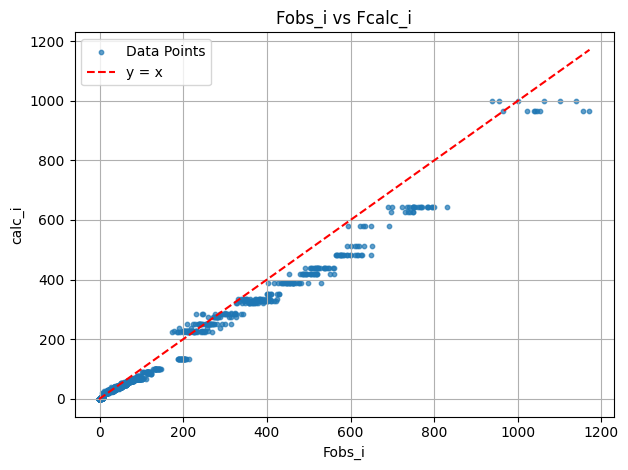

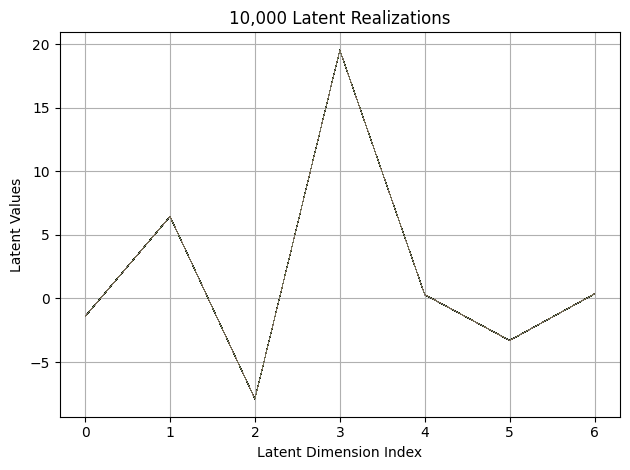

First 10 latent vectors from the VAE:
Sample 1: [-1.4147893190383911, 6.445516586303711, -7.903363227844238, 19.519315719604492, 0.2910831868648529, -3.300318956375122, 0.35796794295310974]
Sample 2: [-1.406096339225769, 6.432765483856201, -7.902623653411865, 19.525056838989258, 0.30382633209228516, -3.29756498336792, 0.3608589470386505]
Sample 3: [-1.3972684144973755, 6.428048610687256, -7.88512659072876, 19.520418167114258, 0.30119478702545166, -3.2841410636901855, 0.35357898473739624]
Sample 4: [-1.4150007963180542, 6.4431281089782715, -7.891146659851074, 19.52079963684082, 0.3098754584789276, -3.301569938659668, 0.3715064227581024]
Sample 5: [-1.4165633916854858, 6.448278427124023, -7.904837608337402, 19.524982452392578, 0.2888837456703186, -3.2793617248535156, 0.36702054738998413]
Sample 6: [-1.4121966361999512, 6.4380950927734375, -7.896921157836914, 19.52474021911621, 0.3009743094444275, -3.2896621227264404, 0.3608207106590271]
Sample 7: [-1.4030731916427612, 6.431223392486572, 

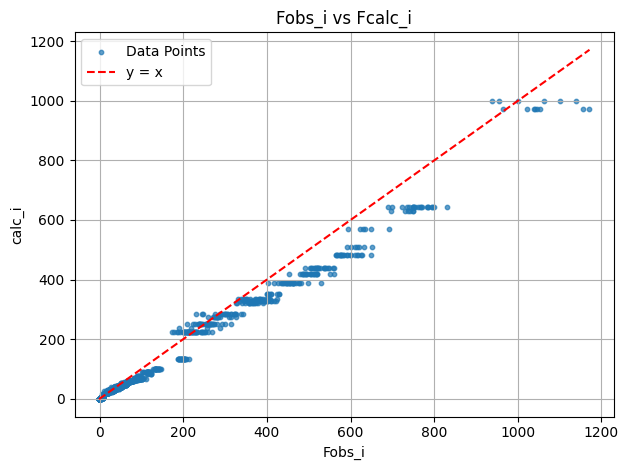

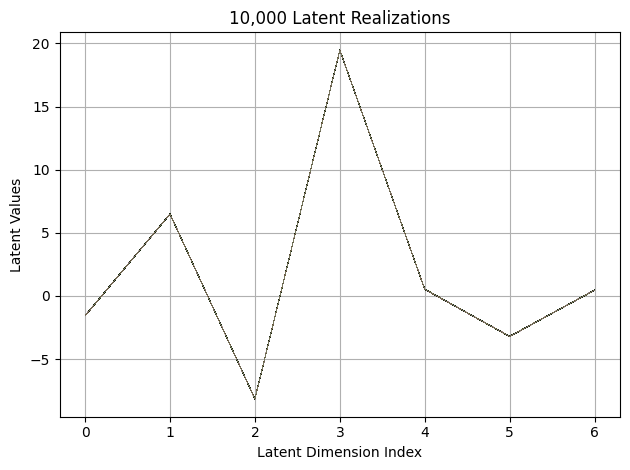

First 10 latent vectors from the VAE:
Sample 1: [-1.5679917335510254, 6.485985279083252, -8.157203674316406, 19.475589752197266, 0.537672221660614, -3.221651792526245, 0.45054149627685547]
Sample 2: [-1.555050015449524, 6.486659049987793, -8.153645515441895, 19.45867347717285, 0.5306580066680908, -3.2010459899902344, 0.450043648481369]
Sample 3: [-1.5698552131652832, 6.486420154571533, -8.168516159057617, 19.474212646484375, 0.5400357246398926, -3.209197521209717, 0.45590728521347046]
Sample 4: [-1.5691015720367432, 6.497725009918213, -8.169510841369629, 19.472057342529297, 0.5284016728401184, -3.219989776611328, 0.4527011513710022]
Sample 5: [-1.5599117279052734, 6.485140800476074, -8.150647163391113, 19.47608184814453, 0.5234301686286926, -3.222825765609741, 0.4406992197036743]
Sample 6: [-1.5574620962142944, 6.494568347930908, -8.16731071472168, 19.470779418945312, 0.52955162525177, -3.202338457107544, 0.448606938123703]
Sample 7: [-1.5718612670898438, 6.477713108062744, -8.15965080

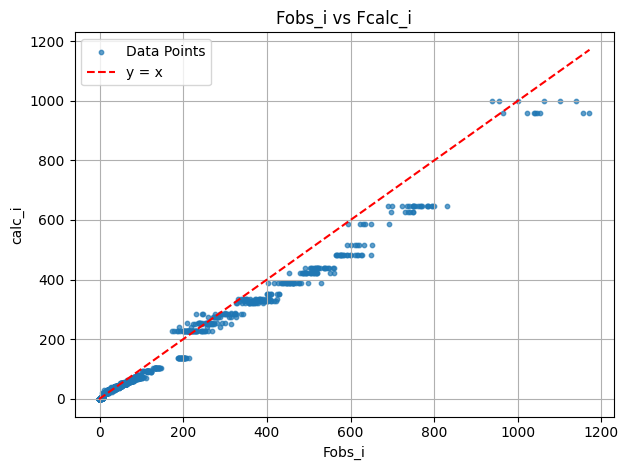

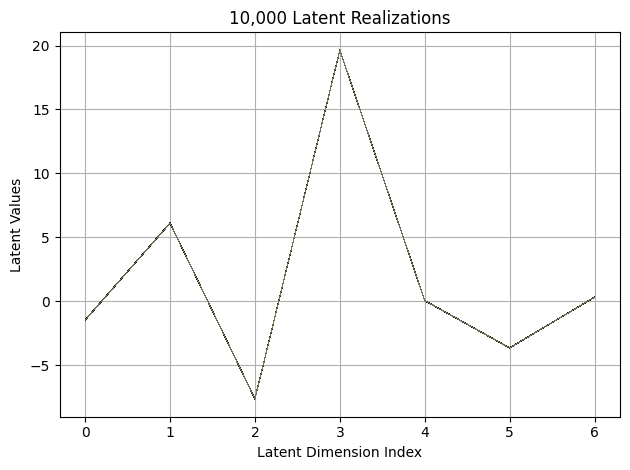

First 10 latent vectors from the VAE:
Sample 1: [-1.4773986339569092, 6.108273029327393, -7.627123832702637, 19.62621307373047, 0.056449081748723984, -3.6321542263031006, 0.32790425419807434]
Sample 2: [-1.4659886360168457, 6.1131815910339355, -7.631381034851074, 19.6263484954834, 0.07218297570943832, -3.6358096599578857, 0.3242555558681488]
Sample 3: [-1.464401125907898, 6.121997833251953, -7.622859477996826, 19.641721725463867, 0.06427981704473495, -3.644690990447998, 0.3311627507209778]
Sample 4: [-1.4716711044311523, 6.114636421203613, -7.635186195373535, 19.63938331604004, 0.054556846618652344, -3.652304172515869, 0.3187001049518585]
Sample 5: [-1.4488548040390015, 6.11148738861084, -7.613308429718018, 19.636884689331055, 0.06610971689224243, -3.62964129447937, 0.3234822452068329]
Sample 6: [-1.466933250427246, 6.116502285003662, -7.6370439529418945, 19.637365341186523, 0.062212757766246796, -3.650855541229248, 0.33094480633735657]
Sample 7: [-1.4648871421813965, 6.109453678131103

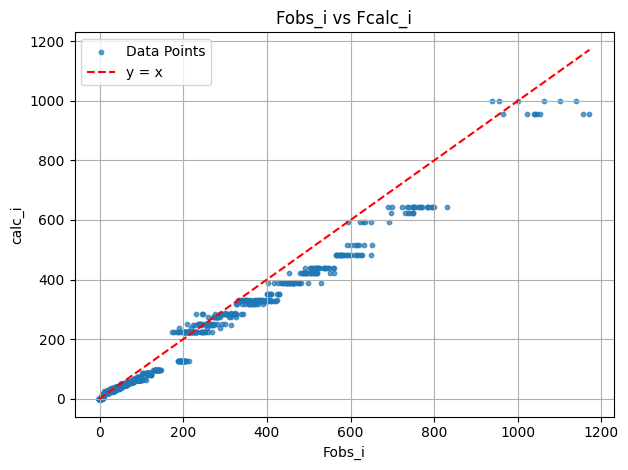

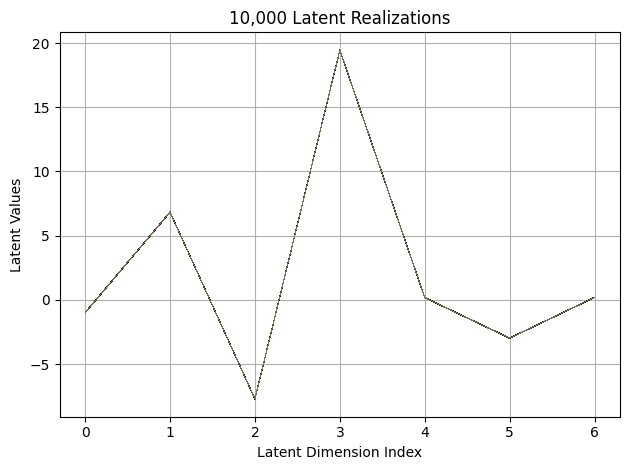

First 10 latent vectors from the VAE:
Sample 1: [-0.997973620891571, 6.833542823791504, -7.7121992111206055, 19.45054817199707, 0.18705473840236664, -2.977712631225586, 0.19891370832920074]
Sample 2: [-0.9932000637054443, 6.83904504776001, -7.7076945304870605, 19.44222068786621, 0.18023602664470673, -2.9705135822296143, 0.1938209980726242]
Sample 3: [-0.9923616051673889, 6.838409900665283, -7.717895030975342, 19.447898864746094, 0.18242686986923218, -2.9797255992889404, 0.19449816644191742]
Sample 4: [-0.983291745185852, 6.819159030914307, -7.717051029205322, 19.45220184326172, 0.18302451074123383, -2.9706830978393555, 0.2049802541732788]
Sample 5: [-1.0062828063964844, 6.826385021209717, -7.706111431121826, 19.44269561767578, 0.18011119961738586, -2.975489854812622, 0.1937781423330307]
Sample 6: [-0.9939553141593933, 6.824835300445557, -7.708332061767578, 19.455121994018555, 0.1727946400642395, -2.972783088684082, 0.19809475541114807]
Sample 7: [-0.9852740168571472, 6.838515281677246,

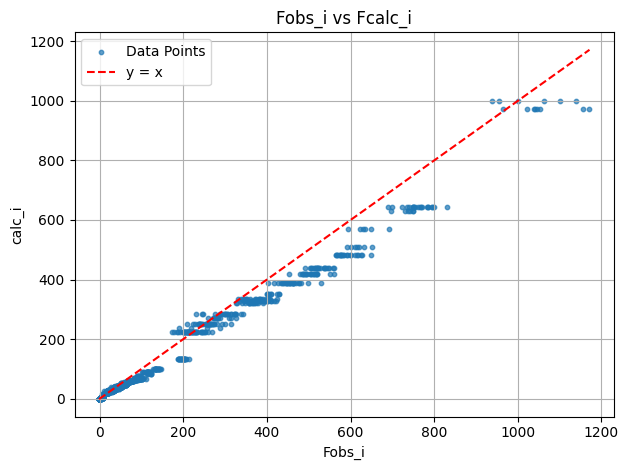

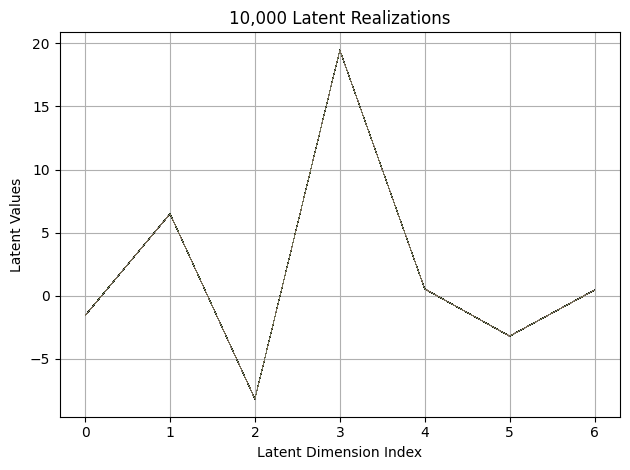

First 10 latent vectors from the VAE:
Sample 1: [-1.5621269941329956, 6.495650768280029, -8.173583030700684, 19.467605590820312, 0.5491713881492615, -3.1912248134613037, 0.45680198073387146]
Sample 2: [-1.5617274045944214, 6.484612941741943, -8.171838760375977, 19.464923858642578, 0.5511159896850586, -3.2023375034332275, 0.460039883852005]
Sample 3: [-1.5542309284210205, 6.49351692199707, -8.170882225036621, 19.460365295410156, 0.5508666634559631, -3.198503017425537, 0.4592052400112152]
Sample 4: [-1.5661665201187134, 6.484542369842529, -8.176689147949219, 19.454273223876953, 0.5402428507804871, -3.1854565143585205, 0.45351219177246094]
Sample 5: [-1.5747874975204468, 6.490676403045654, -8.163719177246094, 19.457183837890625, 0.5414280295372009, -3.1898396015167236, 0.4757363200187683]
Sample 6: [-1.5593103170394897, 6.49223518371582, -8.17092227935791, 19.4653263092041, 0.5444819927215576, -3.2024283409118652, 0.4528438150882721]
Sample 7: [-1.5605868101119995, 6.496615409851074, -8.1

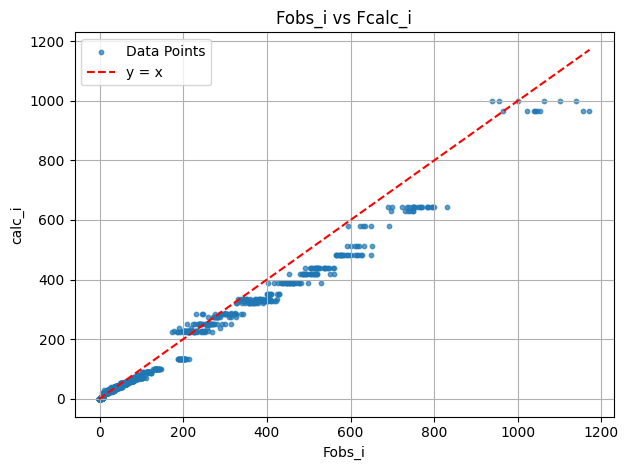

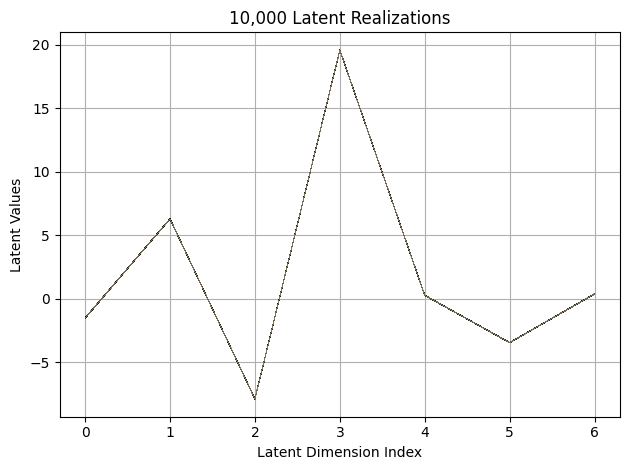

First 10 latent vectors from the VAE:
Sample 1: [-1.5220105648040771, 6.2815165519714355, -7.8800153732299805, 19.544612884521484, 0.2634265720844269, -3.4440629482269287, 0.38732099533081055]
Sample 2: [-1.4957107305526733, 6.272748947143555, -7.865753650665283, 19.559053421020508, 0.2635654807090759, -3.447979211807251, 0.38570713996887207]
Sample 3: [-1.515438437461853, 6.288055896759033, -7.865715980529785, 19.565811157226562, 0.26644766330718994, -3.4395291805267334, 0.3832062780857086]
Sample 4: [-1.5051206350326538, 6.287219047546387, -7.872170925140381, 19.562891006469727, 0.26616978645324707, -3.4493496417999268, 0.38337257504463196]
Sample 5: [-1.5116552114486694, 6.285411357879639, -7.874020576477051, 19.561885833740234, 0.2661791443824768, -3.4505443572998047, 0.38492530584335327]
Sample 6: [-1.5013989210128784, 6.277121067047119, -7.868255615234375, 19.569616317749023, 0.2744574248790741, -3.446842670440674, 0.38969922065734863]
Sample 7: [-1.5075174570083618, 6.2777366638

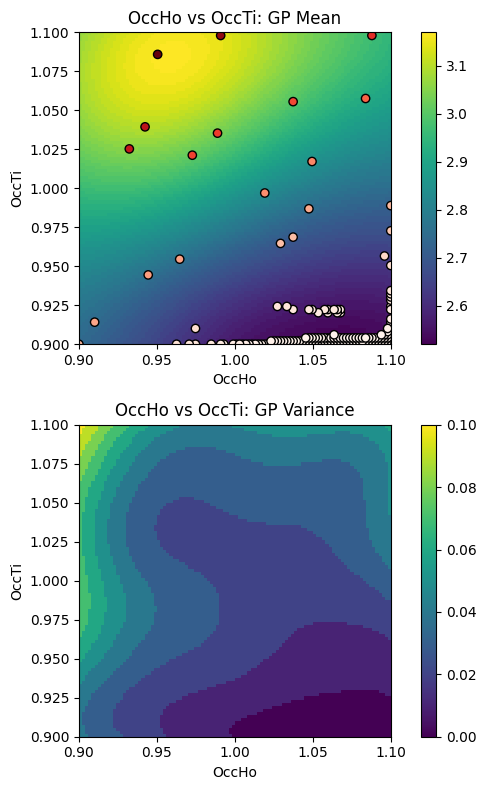

EI: [-1.00000000e+00  5.15247323e-03  4.99566272e-03 ...  5.22468705e-04
  6.02492131e-04  6.96111005e-04]
Function eval #180
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 0.9020201563835144]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.5893
initial chi^2 4.4794e+05 with 2596 obs.
New scale: 0.5893
Cycle 0: 0.70s, Chi**2: 2.2088e+05 for 2596 obs., Lambda: 0,  Delta: 0.507, SVD=0
New scale: 0.5893
Maximum shift/esd = -121.

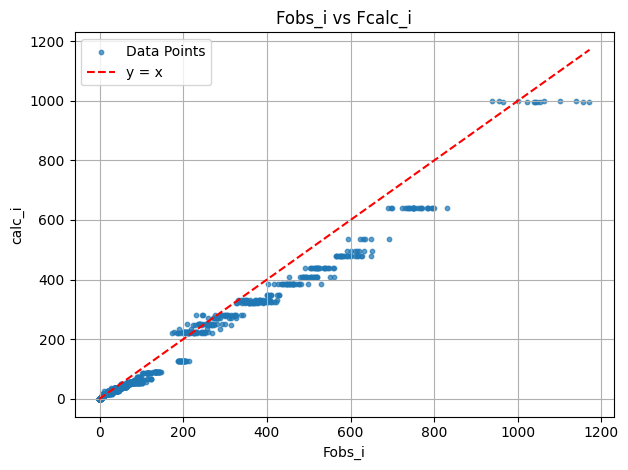

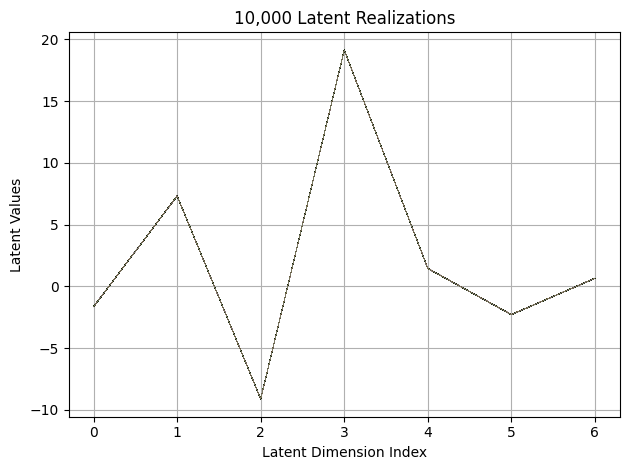

First 10 latent vectors from the VAE:
Sample 1: [-1.6519819498062134, 7.311230659484863, -9.114279747009277, 19.124183654785156, 1.4539768695831299, -2.304914712905884, 0.6465290784835815]
Sample 2: [-1.6391654014587402, 7.319820404052734, -9.108187675476074, 19.122661590576172, 1.457980990409851, -2.280987024307251, 0.6496201753616333]
Sample 3: [-1.6559473276138306, 7.313126087188721, -9.110616683959961, 19.118194580078125, 1.438712239265442, -2.2962400913238525, 0.6503086686134338]
Sample 4: [-1.6601194143295288, 7.318172931671143, -9.122736930847168, 19.125276565551758, 1.4390190839767456, -2.2813892364501953, 0.6588453650474548]
Sample 5: [-1.647570013999939, 7.325282573699951, -9.108981132507324, 19.124372482299805, 1.441899299621582, -2.2905516624450684, 0.6563718914985657]
Sample 6: [-1.6528406143188477, 7.304742336273193, -9.124884605407715, 19.12950897216797, 1.4495596885681152, -2.295077323913574, 0.656161367893219]
Sample 7: [-1.64268159866333, 7.313921928405762, -9.1178207

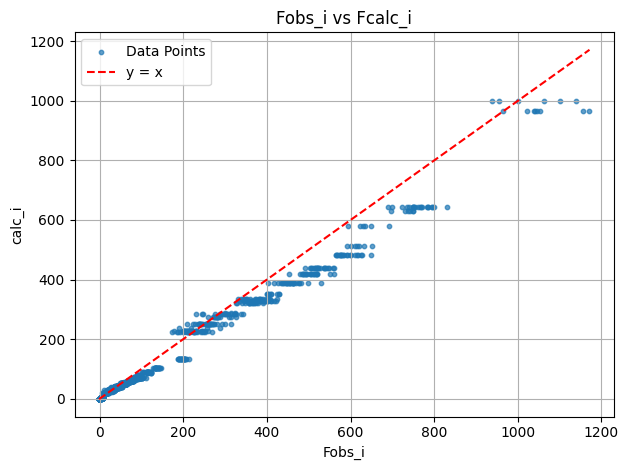

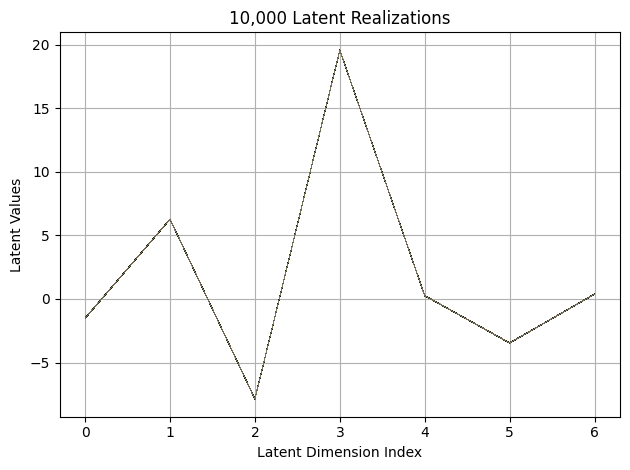

First 10 latent vectors from the VAE:
Sample 1: [-1.513218879699707, 6.277401447296143, -7.863680362701416, 19.566505432128906, 0.2602514624595642, -3.451899290084839, 0.3833625912666321]
Sample 2: [-1.4952157735824585, 6.271720886230469, -7.863715171813965, 19.56556510925293, 0.25843116641044617, -3.453815460205078, 0.3850306570529938]
Sample 3: [-1.5108442306518555, 6.279207706451416, -7.860282897949219, 19.561052322387695, 0.25090768933296204, -3.4594671726226807, 0.38340985774993896]
Sample 4: [-1.5085060596466064, 6.275012969970703, -7.857650279998779, 19.559602737426758, 0.25924938917160034, -3.457289695739746, 0.3872304856777191]
Sample 5: [-1.5095891952514648, 6.275583267211914, -7.863866806030273, 19.563255310058594, 0.2512802183628082, -3.4520082473754883, 0.39090919494628906]
Sample 6: [-1.5255292654037476, 6.274165153503418, -7.8473615646362305, 19.556598663330078, 0.24965952336788177, -3.454665422439575, 0.3732725977897644]
Sample 7: [-1.5183806419372559, 6.265040397644043

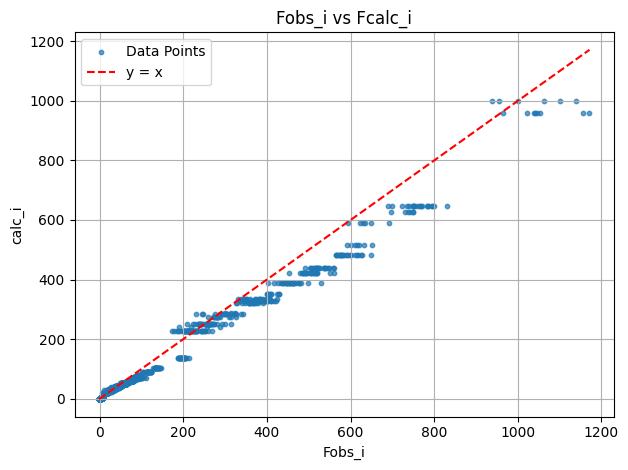

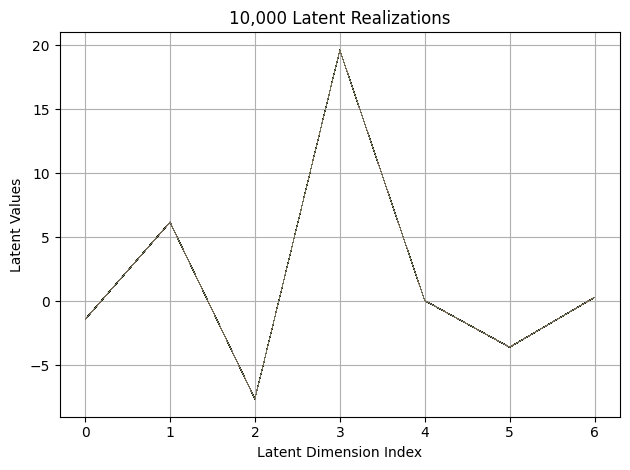

First 10 latent vectors from the VAE:
Sample 1: [-1.4137892723083496, 6.172769546508789, -7.635636329650879, 19.628931045532227, 0.054204437881708145, -3.5860273838043213, 0.300464004278183]
Sample 2: [-1.412925362586975, 6.18061637878418, -7.616206645965576, 19.615352630615234, 0.05513467267155647, -3.593742609024048, 0.31014183163642883]
Sample 3: [-1.4162921905517578, 6.186669826507568, -7.634646892547607, 19.622846603393555, 0.060227710753679276, -3.580219268798828, 0.3061286211013794]
Sample 4: [-1.4131150245666504, 6.183099746704102, -7.629411697387695, 19.614503860473633, 0.042907241731882095, -3.5811400413513184, 0.31529557704925537]
Sample 5: [-1.4084376096725464, 6.183272361755371, -7.617251873016357, 19.61788558959961, 0.06584581732749939, -3.5952982902526855, 0.3051184117794037]
Sample 6: [-1.4184433221817017, 6.176729679107666, -7.63591194152832, 19.62120246887207, 0.04841713607311249, -3.582855224609375, 0.3048451542854309]
Sample 7: [-1.4119455814361572, 6.18716001510620

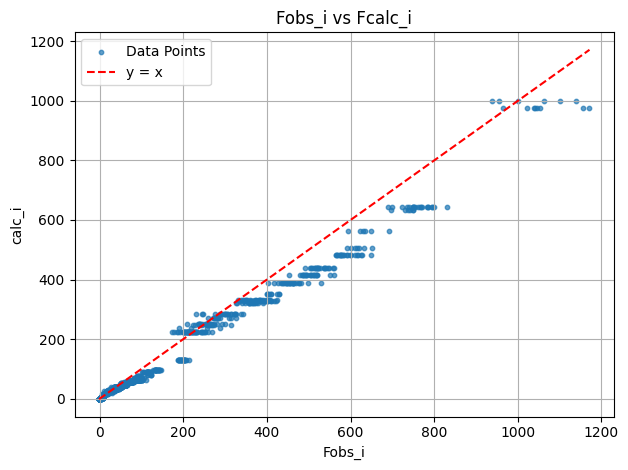

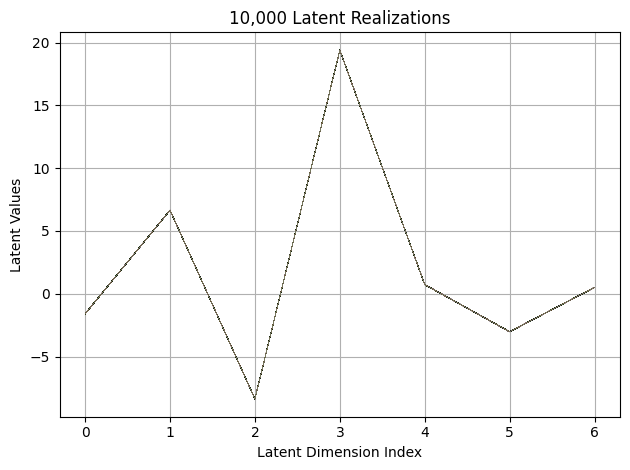

First 10 latent vectors from the VAE:
Sample 1: [-1.5952752828598022, 6.652656078338623, -8.366912841796875, 19.394346237182617, 0.7240712642669678, -3.017289876937866, 0.4988929033279419]
Sample 2: [-1.5960639715194702, 6.652284622192383, -8.365392684936523, 19.400135040283203, 0.7182356715202332, -3.0231118202209473, 0.5048496723175049]
Sample 3: [-1.591622233390808, 6.661624431610107, -8.383074760437012, 19.38690948486328, 0.7293084263801575, -3.025923728942871, 0.5020183324813843]
Sample 4: [-1.5968016386032104, 6.637681007385254, -8.37394905090332, 19.40433692932129, 0.7319746017456055, -3.0312492847442627, 0.5027952194213867]
Sample 5: [-1.6001551151275635, 6.636283874511719, -8.38926887512207, 19.39695930480957, 0.7279906868934631, -3.0159337520599365, 0.5089328289031982]
Sample 6: [-1.5977929830551147, 6.644310474395752, -8.367241859436035, 19.407041549682617, 0.7268176078796387, -3.017383337020874, 0.5039527416229248]
Sample 7: [-1.5937749147415161, 6.651345729827881, -8.36890

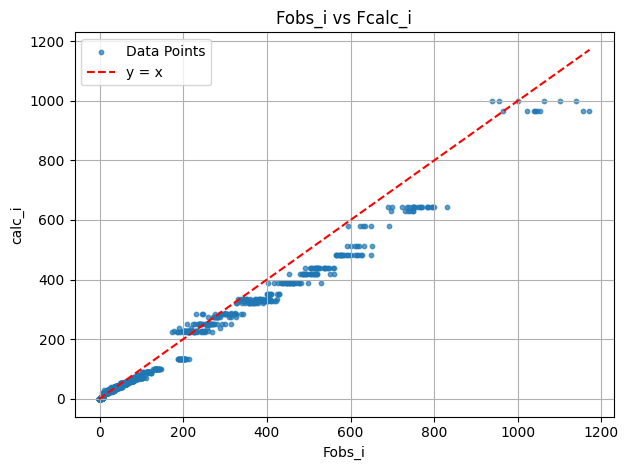

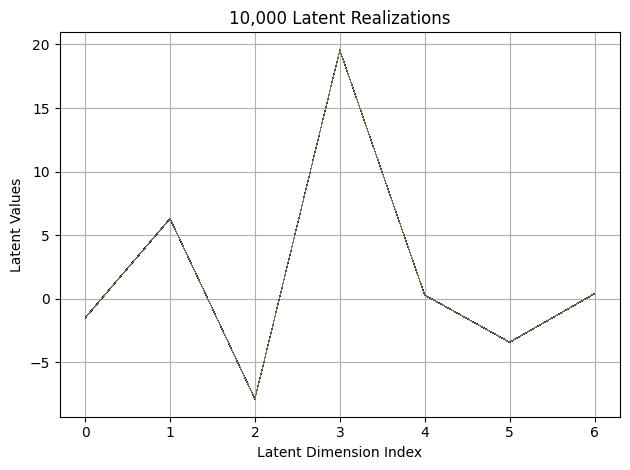

First 10 latent vectors from the VAE:
Sample 1: [-1.509701132774353, 6.2877607345581055, -7.885011196136475, 19.54971694946289, 0.2891188859939575, -3.4300971031188965, 0.3773328959941864]
Sample 2: [-1.5163164138793945, 6.290287017822266, -7.881771564483643, 19.5592041015625, 0.28523552417755127, -3.440351724624634, 0.39380884170532227]
Sample 3: [-1.528512954711914, 6.302484035491943, -7.88592004776001, 19.564241409301758, 0.28459858894348145, -3.428030014038086, 0.39166969060897827]
Sample 4: [-1.5121288299560547, 6.296658992767334, -7.901323318481445, 19.55768394470215, 0.2840859293937683, -3.4226396083831787, 0.3865405023097992]
Sample 5: [-1.5251274108886719, 6.291502952575684, -7.894397735595703, 19.556142807006836, 0.2911619544029236, -3.4298160076141357, 0.39259102940559387]
Sample 6: [-1.5178090333938599, 6.303007125854492, -7.888628005981445, 19.562023162841797, 0.2829735577106476, -3.4352147579193115, 0.3768869936466217]
Sample 7: [-1.5138591527938843, 6.293157577514648, -7

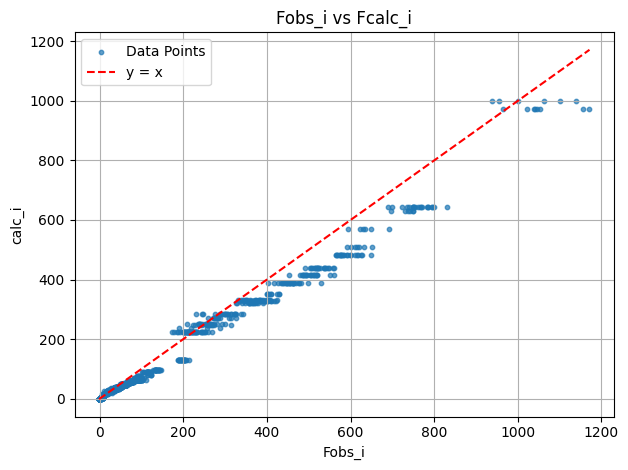

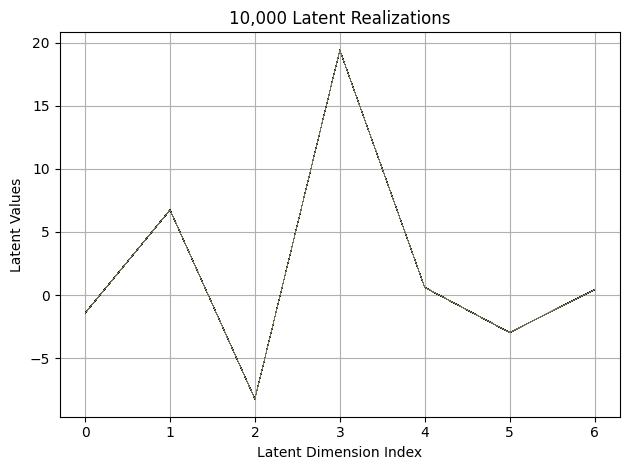

First 10 latent vectors from the VAE:
Sample 1: [-1.4306014776229858, 6.731576442718506, -8.223648071289062, 19.398693084716797, 0.5984560251235962, -2.9618966579437256, 0.4278435707092285]
Sample 2: [-1.4353885650634766, 6.738479137420654, -8.23924446105957, 19.390975952148438, 0.6021742820739746, -2.9687790870666504, 0.4268847405910492]
Sample 3: [-1.410282850265503, 6.745662689208984, -8.22188949584961, 19.391460418701172, 0.6099118590354919, -2.9589691162109375, 0.43468746542930603]
Sample 4: [-1.4253504276275635, 6.731046199798584, -8.224837303161621, 19.391132354736328, 0.592919111251831, -2.9688031673431396, 0.42524465918540955]
Sample 5: [-1.4146111011505127, 6.736703872680664, -8.222158432006836, 19.385601043701172, 0.6062287092208862, -2.959038734436035, 0.42411261796951294]
Sample 6: [-1.4263973236083984, 6.758548736572266, -8.215892791748047, 19.392492294311523, 0.603564441204071, -2.9703667163848877, 0.4173755645751953]
Sample 7: [-1.4070287942886353, 6.727792739868164, -8

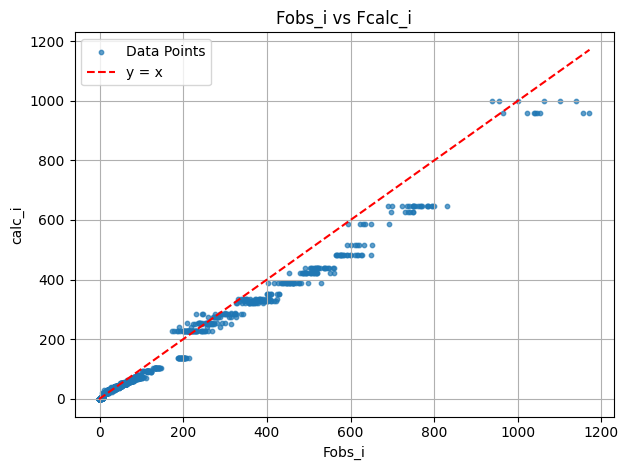

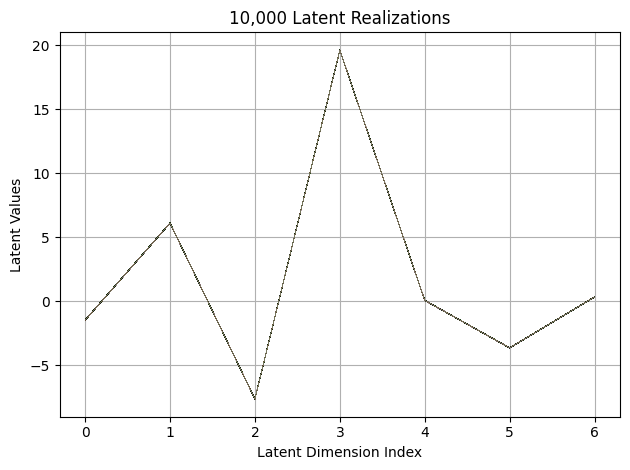

First 10 latent vectors from the VAE:
Sample 1: [-1.471197247505188, 6.122464656829834, -7.648475170135498, 19.63782501220703, 0.06409496068954468, -3.6652309894561768, 0.3304291367530823]
Sample 2: [-1.4683754444122314, 6.101462364196777, -7.647012233734131, 19.636863708496094, 0.057443298399448395, -3.6556780338287354, 0.3373282253742218]
Sample 3: [-1.4635719060897827, 6.114618301391602, -7.650931358337402, 19.638347625732422, 0.06307804584503174, -3.6582980155944824, 0.3314952850341797]
Sample 4: [-1.485130786895752, 6.105650901794434, -7.635397434234619, 19.643781661987305, 0.0647730678319931, -3.6400632858276367, 0.32969045639038086]
Sample 5: [-1.486122727394104, 6.101091384887695, -7.63533878326416, 19.630523681640625, 0.06270813941955566, -3.644561290740967, 0.322449654340744]
Sample 6: [-1.4801514148712158, 6.109017372131348, -7.6371893882751465, 19.63475227355957, 0.07577496767044067, -3.646747589111328, 0.3295305073261261]
Sample 7: [-1.4851864576339722, 6.124122619628906, 

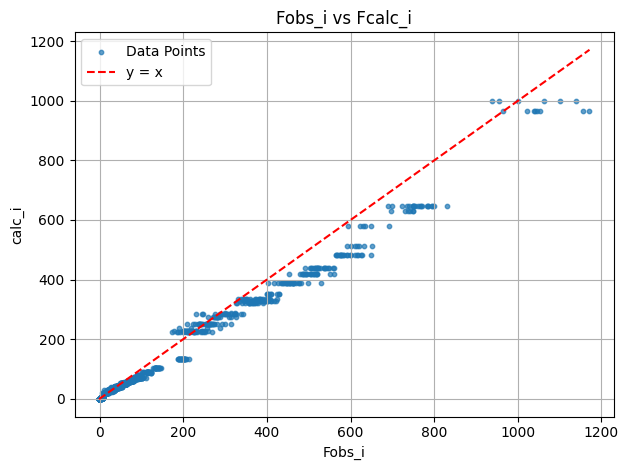

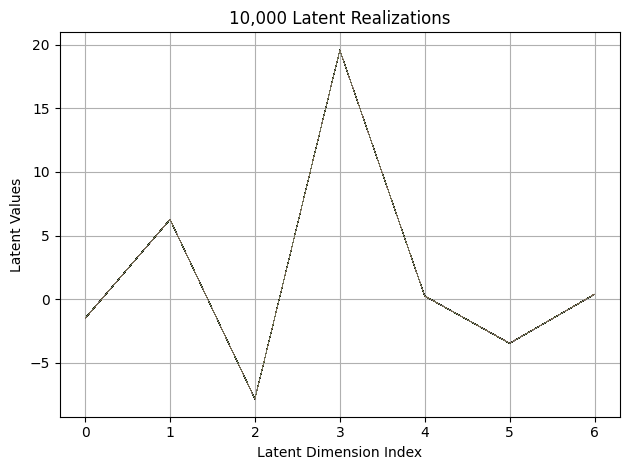

First 10 latent vectors from the VAE:
Sample 1: [-1.5176705121994019, 6.259515762329102, -7.837863922119141, 19.569477081298828, 0.23895271122455597, -3.4632627964019775, 0.37823763489723206]
Sample 2: [-1.5129271745681763, 6.243281364440918, -7.84644889831543, 19.575651168823242, 0.24374374747276306, -3.476677656173706, 0.3828924000263214]
Sample 3: [-1.507167935371399, 6.250848770141602, -7.846207618713379, 19.578697204589844, 0.2327580451965332, -3.471207618713379, 0.39507192373275757]
Sample 4: [-1.5106850862503052, 6.256200313568115, -7.840647220611572, 19.566003799438477, 0.24815914034843445, -3.4722073078155518, 0.37578722834587097]
Sample 5: [-1.5164674520492554, 6.261643886566162, -7.835254669189453, 19.572080612182617, 0.2504104673862457, -3.4536218643188477, 0.3803724944591522]
Sample 6: [-1.5076048374176025, 6.253520965576172, -7.8369221687316895, 19.569854736328125, 0.24093735218048096, -3.4712822437286377, 0.372455894947052]
Sample 7: [-1.505355715751648, 6.25827550888061

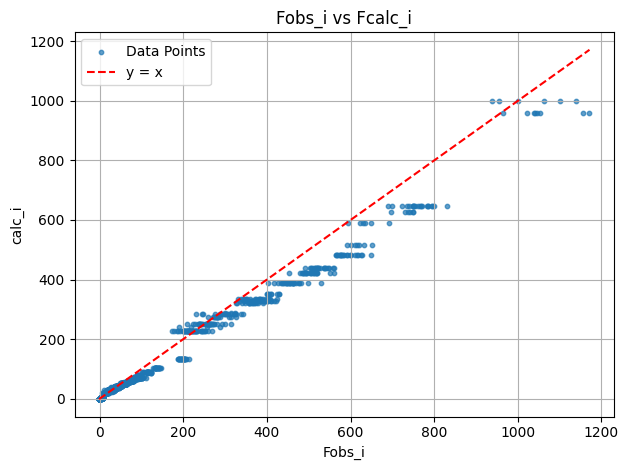

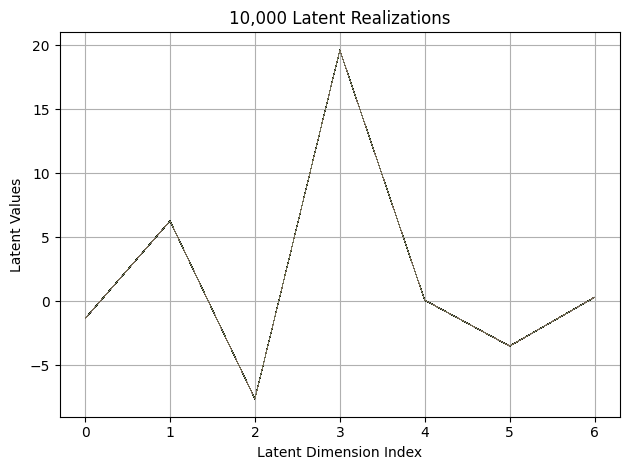

First 10 latent vectors from the VAE:
Sample 1: [-1.3552279472351074, 6.2609076499938965, -7.645473957061768, 19.59328269958496, 0.07360377162694931, -3.5053980350494385, 0.30712369084358215]
Sample 2: [-1.3587603569030762, 6.25722599029541, -7.6358232498168945, 19.609277725219727, 0.06536998599767685, -3.5192086696624756, 0.28902581334114075]
Sample 3: [-1.3623510599136353, 6.265790939331055, -7.62031364440918, 19.61012840270996, 0.06977574527263641, -3.4933578968048096, 0.2964412569999695]
Sample 4: [-1.3615797758102417, 6.258086681365967, -7.648004055023193, 19.607973098754883, 0.08771037310361862, -3.526212215423584, 0.2914517819881439]
Sample 5: [-1.3630412817001343, 6.24546480178833, -7.635231018066406, 19.60284996032715, 0.07154801487922668, -3.519564390182495, 0.30255454778671265]
Sample 6: [-1.376029372215271, 6.258235454559326, -7.6486124992370605, 19.598384857177734, 0.07688690721988678, -3.516383647918701, 0.30487874150276184]
Sample 7: [-1.361038327217102, 6.26203727722168

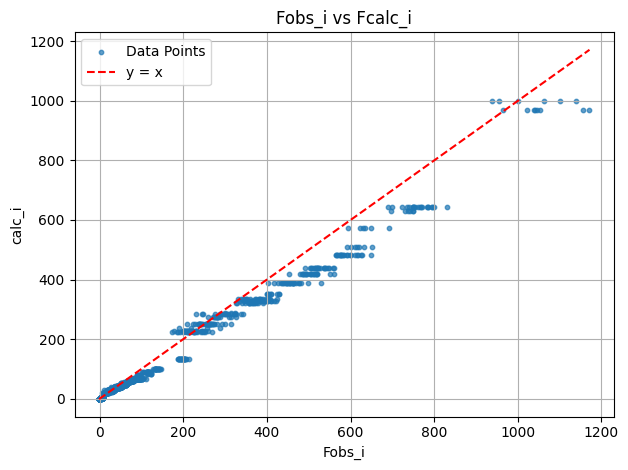

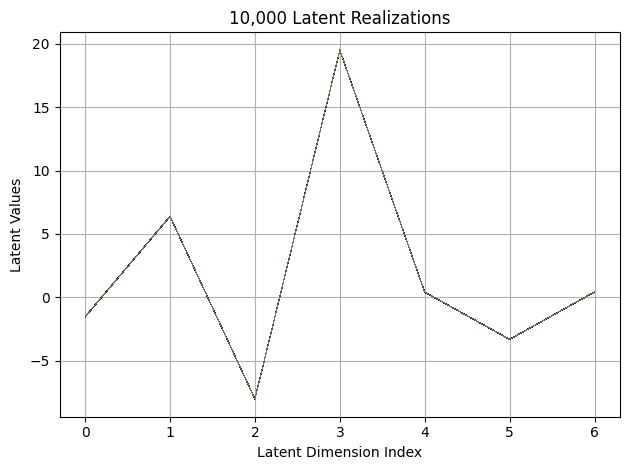

First 10 latent vectors from the VAE:
Sample 1: [-1.535042643547058, 6.381739139556885, -8.010618209838867, 19.518539428710938, 0.40724653005599976, -3.324946880340576, 0.4189431071281433]
Sample 2: [-1.5465507507324219, 6.387386798858643, -8.034543991088867, 19.502853393554688, 0.3962777554988861, -3.3176515102386475, 0.42728862166404724]
Sample 3: [-1.5452743768692017, 6.38269567489624, -8.032621383666992, 19.51953125, 0.40950438380241394, -3.3234379291534424, 0.418958455324173]
Sample 4: [-1.5489205121994019, 6.392727851867676, -8.009820938110352, 19.516977310180664, 0.40501976013183594, -3.3316378593444824, 0.4200935959815979]
Sample 5: [-1.529348611831665, 6.384502410888672, -8.032610893249512, 19.510202407836914, 0.3998870253562927, -3.3154404163360596, 0.41352927684783936]
Sample 6: [-1.5373167991638184, 6.382708549499512, -8.032862663269043, 19.51386833190918, 0.4046708643436432, -3.3374385833740234, 0.4128730595111847]
Sample 7: [-1.5385699272155762, 6.393793106079102, -8.0232

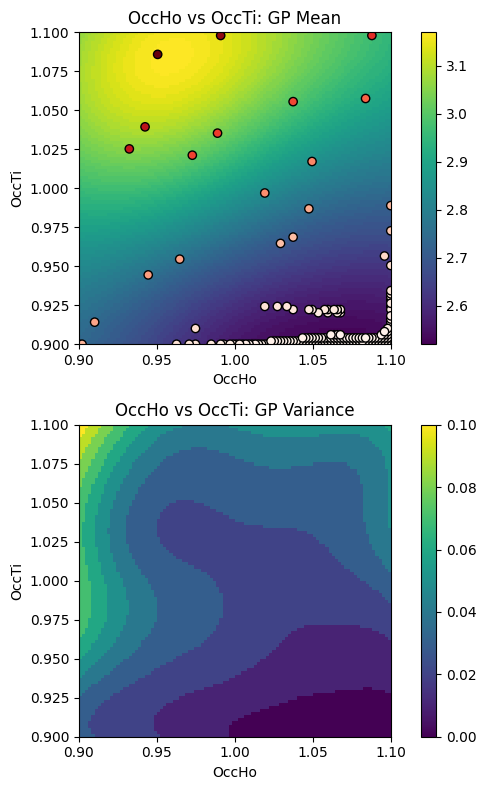

EI: [-1.00000000e+00 -1.00000000e+00  2.58219894e-03 ...  5.49041666e-04
  6.33137766e-04  7.31638167e-04]
Function eval #190
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9060605764389038, 1.0696970224380493]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4288
initial chi^2 1.8149e+06 with 2596 obs.
New scale: 0.4279
Cycle 0: 0.72s, Chi**2: 3.9099e+05 for 2596 obs., Lambda: 0,  Delta: 0.785, SVD=0
New scale: 0.4279
Maximum shift/esd = -243.

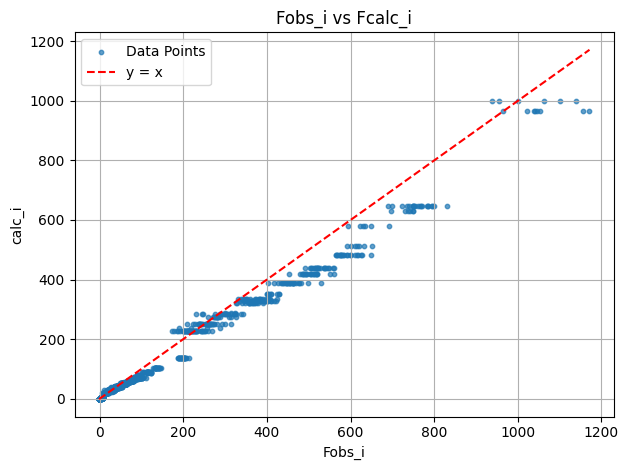

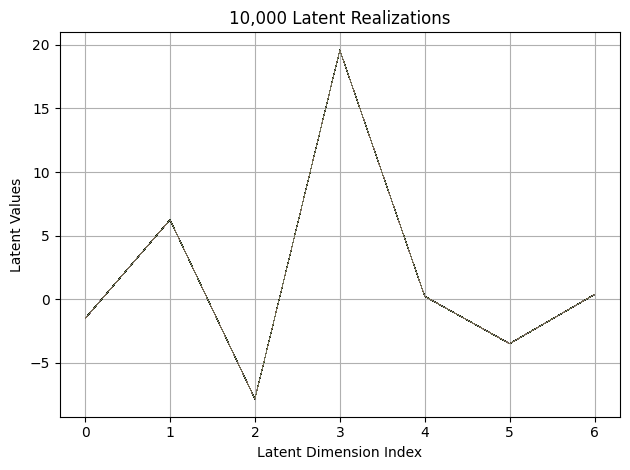

First 10 latent vectors from the VAE:
Sample 1: [-1.5049867630004883, 6.244323253631592, -7.814925670623779, 19.577253341674805, 0.23163685202598572, -3.4928085803985596, 0.38483163714408875]
Sample 2: [-1.4982013702392578, 6.239985942840576, -7.830597400665283, 19.577489852905273, 0.23069430887699127, -3.4817330837249756, 0.36335915327072144]
Sample 3: [-1.4944719076156616, 6.248201370239258, -7.839268207550049, 19.569658279418945, 0.2370963990688324, -3.4819469451904297, 0.3763660192489624]
Sample 4: [-1.5058269500732422, 6.2361555099487305, -7.838346481323242, 19.568456649780273, 0.2316238433122635, -3.480736255645752, 0.37167584896087646]
Sample 5: [-1.5085335969924927, 6.241533279418945, -7.835232257843018, 19.576862335205078, 0.24149392545223236, -3.482799768447876, 0.3770864009857178]
Sample 6: [-1.5047261714935303, 6.248178482055664, -7.824270248413086, 19.577775955200195, 0.23458822071552277, -3.4970574378967285, 0.3774551749229431]
Sample 7: [-1.4997366666793823, 6.2364325523

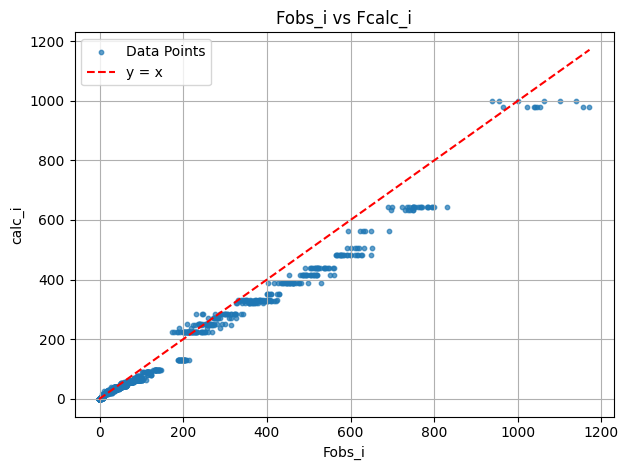

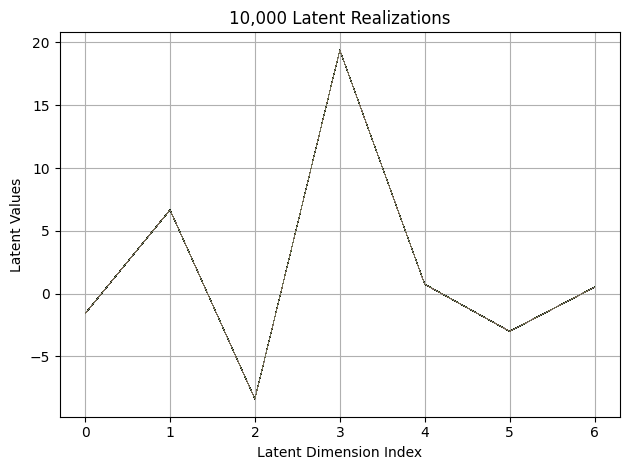

First 10 latent vectors from the VAE:
Sample 1: [-1.593509554862976, 6.659173965454102, -8.394343376159668, 19.393800735473633, 0.7419989705085754, -3.015958547592163, 0.5115678310394287]
Sample 2: [-1.586521863937378, 6.668395042419434, -8.399091720581055, 19.399168014526367, 0.7554659247398376, -3.0084660053253174, 0.5114310383796692]
Sample 3: [-1.5993423461914062, 6.648386001586914, -8.376117706298828, 19.380468368530273, 0.7555435299873352, -3.0070595741271973, 0.49949222803115845]
Sample 4: [-1.598971962928772, 6.656219482421875, -8.38211441040039, 19.39463233947754, 0.7477246522903442, -3.001617670059204, 0.4984285831451416]
Sample 5: [-1.5953670740127563, 6.664380073547363, -8.382875442504883, 19.398988723754883, 0.7442792654037476, -3.0127906799316406, 0.4941439628601074]
Sample 6: [-1.5970726013183594, 6.672863006591797, -8.39214038848877, 19.396682739257812, 0.7369251251220703, -3.0193092823028564, 0.5025361180305481]
Sample 7: [-1.6086536645889282, 6.656114101409912, -8.394

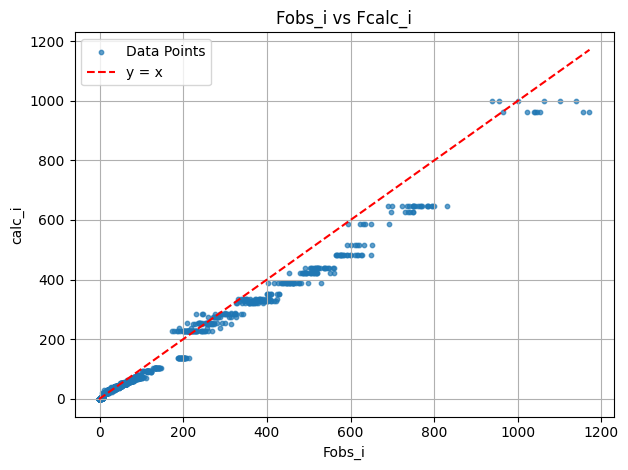

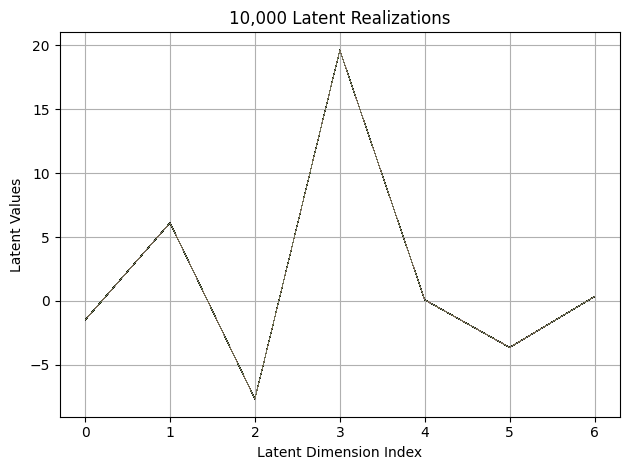

First 10 latent vectors from the VAE:
Sample 1: [-1.5021462440490723, 6.125292778015137, -7.668722152709961, 19.621641159057617, 0.0829802006483078, -3.6318705081939697, 0.34148287773132324]
Sample 2: [-1.4916059970855713, 6.115427017211914, -7.667608737945557, 19.631620407104492, 0.0861109271645546, -3.6301183700561523, 0.3338441550731659]
Sample 3: [-1.4859118461608887, 6.1087446212768555, -7.663630962371826, 19.635021209716797, 0.09504678845405579, -3.6422805786132812, 0.3392326831817627]
Sample 4: [-1.4820659160614014, 6.113803386688232, -7.673624515533447, 19.635395050048828, 0.09648941457271576, -3.6403064727783203, 0.3365877866744995]
Sample 5: [-1.487160563468933, 6.117669582366943, -7.673341274261475, 19.645769119262695, 0.09453107416629791, -3.6354312896728516, 0.33906224370002747]
Sample 6: [-1.4947147369384766, 6.114437580108643, -7.673252105712891, 19.651086807250977, 0.08570893853902817, -3.6407856941223145, 0.3483602702617645]
Sample 7: [-1.4760695695877075, 6.1131296157

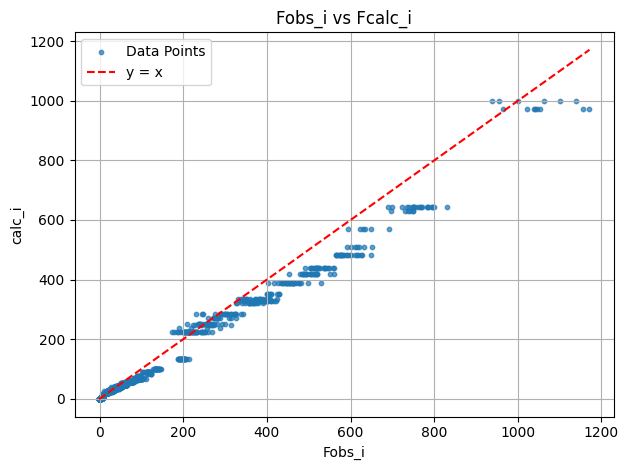

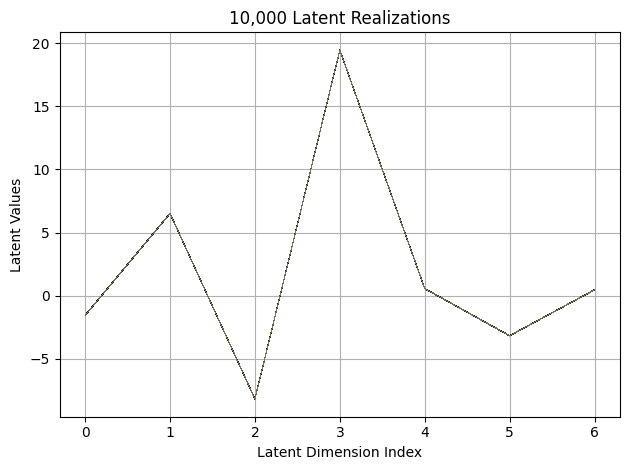

First 10 latent vectors from the VAE:
Sample 1: [-1.5636824369430542, 6.514153003692627, -8.189679145812988, 19.453203201293945, 0.5664645433425903, -3.1743807792663574, 0.4612906873226166]
Sample 2: [-1.5600965023040771, 6.500491142272949, -8.18608283996582, 19.454967498779297, 0.5517558455467224, -3.1961286067962646, 0.46296703815460205]
Sample 3: [-1.5680816173553467, 6.509919166564941, -8.194653511047363, 19.45926284790039, 0.5510162115097046, -3.170668125152588, 0.45243674516677856]
Sample 4: [-1.568252444267273, 6.516261100769043, -8.194597244262695, 19.461238861083984, 0.5493136048316956, -3.185933828353882, 0.46239766478538513]
Sample 5: [-1.5716050863265991, 6.506509304046631, -8.192546844482422, 19.461870193481445, 0.5582475662231445, -3.1957244873046875, 0.4532293677330017]
Sample 6: [-1.5597258806228638, 6.506220817565918, -8.190690040588379, 19.44265365600586, 0.570142924785614, -3.170086622238159, 0.44963711500167847]
Sample 7: [-1.5620636940002441, 6.514217853546143, -8.

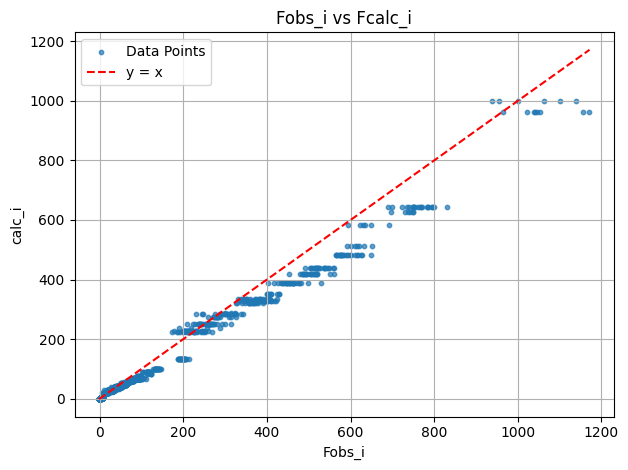

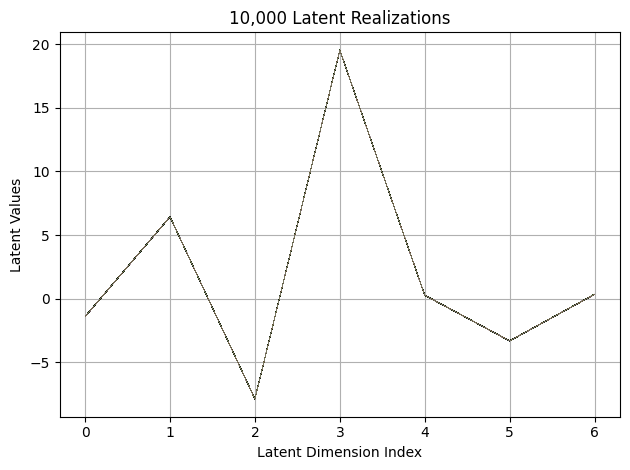

First 10 latent vectors from the VAE:
Sample 1: [-1.3941752910614014, 6.436986446380615, -7.862752437591553, 19.520893096923828, 0.2819748520851135, -3.3071980476379395, 0.34373196959495544]
Sample 2: [-1.3994544744491577, 6.437261581420898, -7.864007949829102, 19.53105926513672, 0.2859184443950653, -3.3059275150299072, 0.3539808392524719]
Sample 3: [-1.3969944715499878, 6.443704605102539, -7.867107391357422, 19.523632049560547, 0.2822098731994629, -3.3068034648895264, 0.3556514382362366]
Sample 4: [-1.3997344970703125, 6.4403862953186035, -7.874092102050781, 19.524091720581055, 0.28397366404533386, -3.3106610774993896, 0.3602926433086395]
Sample 5: [-1.4004069566726685, 6.434571743011475, -7.879759788513184, 19.523698806762695, 0.2855510413646698, -3.298717498779297, 0.348821759223938]
Sample 6: [-1.4009357690811157, 6.438640594482422, -7.861744403839111, 19.53652000427246, 0.2661581039428711, -3.314291000366211, 0.35574454069137573]
Sample 7: [-1.39206063747406, 6.441598415374756, -7

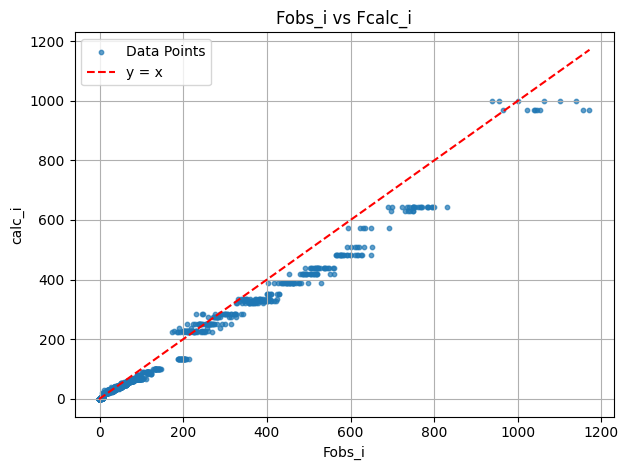

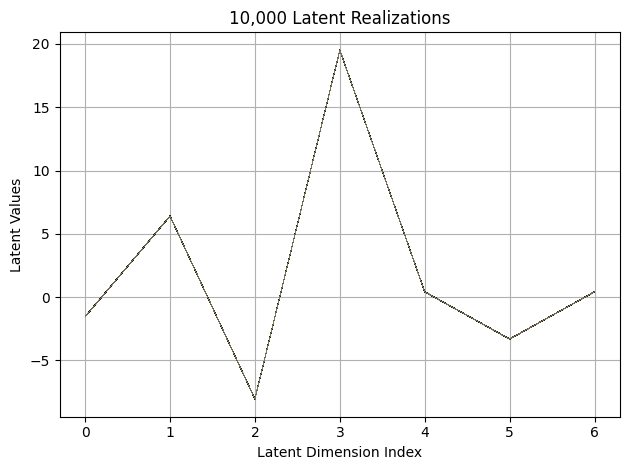

First 10 latent vectors from the VAE:
Sample 1: [-1.5406826734542847, 6.4084038734436035, -8.04047966003418, 19.5196533203125, 0.4159407913684845, -3.2988433837890625, 0.4251749813556671]
Sample 2: [-1.5367791652679443, 6.403841495513916, -8.041199684143066, 19.50852394104004, 0.41385695338249207, -3.3048439025878906, 0.42251333594322205]
Sample 3: [-1.5397802591323853, 6.386178016662598, -8.041386604309082, 19.497547149658203, 0.43294209241867065, -3.3074347972869873, 0.4278102517127991]
Sample 4: [-1.5307234525680542, 6.409445762634277, -8.02170467376709, 19.505056381225586, 0.4168952405452728, -3.314901828765869, 0.43182748556137085]
Sample 5: [-1.5376429557800293, 6.399739742279053, -8.042198181152344, 19.514535903930664, 0.42935702204704285, -3.305544376373291, 0.43243303894996643]
Sample 6: [-1.5319901704788208, 6.393731594085693, -8.036962509155273, 19.503591537475586, 0.4102953374385834, -3.313509225845337, 0.42937323451042175]
Sample 7: [-1.5364277362823486, 6.402212142944336,

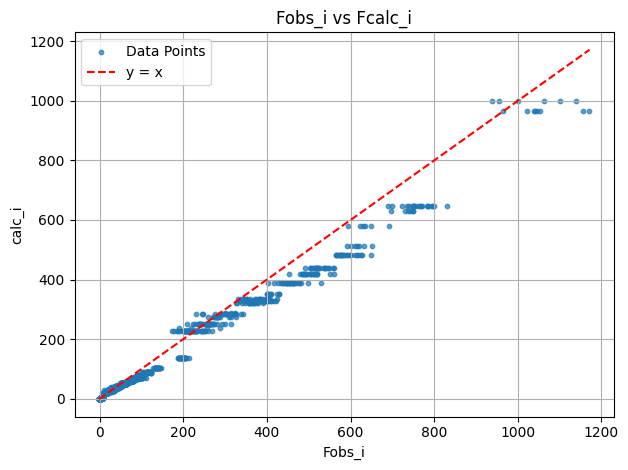

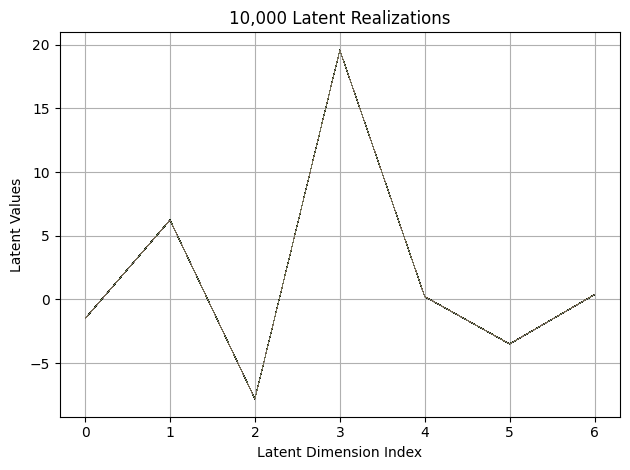

First 10 latent vectors from the VAE:
Sample 1: [-1.5086729526519775, 6.236776828765869, -7.818805694580078, 19.588119506835938, 0.2216688096523285, -3.5049731731414795, 0.3646373450756073]
Sample 2: [-1.505977988243103, 6.241191864013672, -7.813414573669434, 19.580001831054688, 0.21933093667030334, -3.5056192874908447, 0.3680837154388428]
Sample 3: [-1.5173157453536987, 6.232864856719971, -7.809607982635498, 19.587326049804688, 0.22426311671733856, -3.4972314834594727, 0.37826016545295715]
Sample 4: [-1.498115062713623, 6.236954212188721, -7.813235759735107, 19.59126091003418, 0.20615388453006744, -3.4958910942077637, 0.37565869092941284]
Sample 5: [-1.523084282875061, 6.234852313995361, -7.8096089363098145, 19.576108932495117, 0.22254395484924316, -3.514716625213623, 0.3736460506916046]
Sample 6: [-1.511884093284607, 6.230950832366943, -7.810339450836182, 19.57103729248047, 0.23033970594406128, -3.4925975799560547, 0.36659929156303406]
Sample 7: [-1.4993911981582642, 6.24258899688720

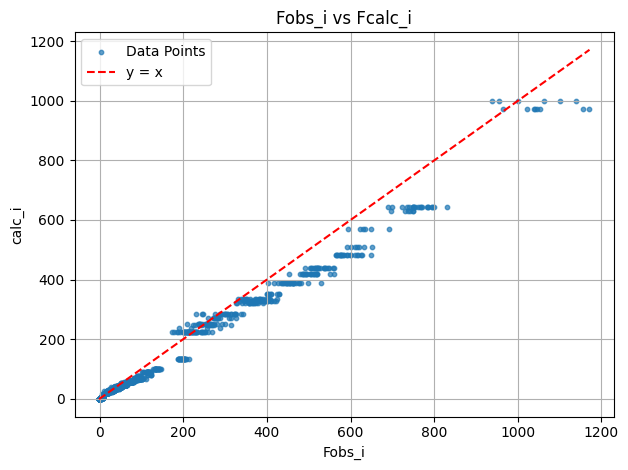

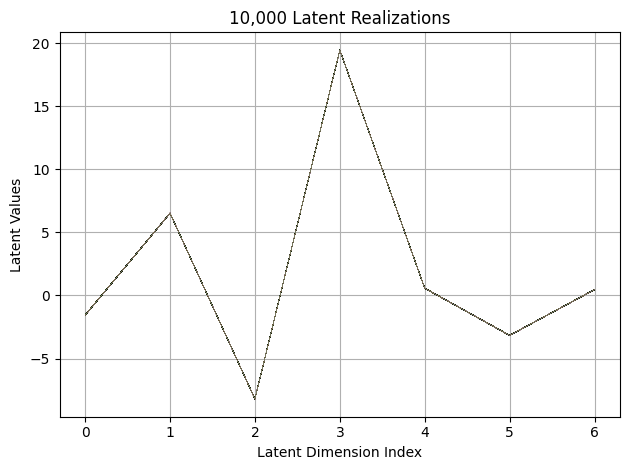

First 10 latent vectors from the VAE:
Sample 1: [-1.5721007585525513, 6.528998374938965, -8.203373908996582, 19.446496963500977, 0.5816603899002075, -3.169138193130493, 0.45705196261405945]
Sample 2: [-1.5671037435531616, 6.52583646774292, -8.198827743530273, 19.453636169433594, 0.5672385692596436, -3.164497137069702, 0.46725305914878845]
Sample 3: [-1.5650405883789062, 6.527838230133057, -8.196805000305176, 19.454944610595703, 0.5753186345100403, -3.164867877960205, 0.4614403247833252]
Sample 4: [-1.5763421058654785, 6.526424407958984, -8.20688533782959, 19.464754104614258, 0.5621644258499146, -3.155646562576294, 0.4689401686191559]
Sample 5: [-1.5615626573562622, 6.528589725494385, -8.196065902709961, 19.458553314208984, 0.573762834072113, -3.171506881713867, 0.46257731318473816]
Sample 6: [-1.579071283340454, 6.537637710571289, -8.194786071777344, 19.446508407592773, 0.5719475150108337, -3.1661860942840576, 0.4721342921257019]
Sample 7: [-1.5664275884628296, 6.51425313949585, -8.195

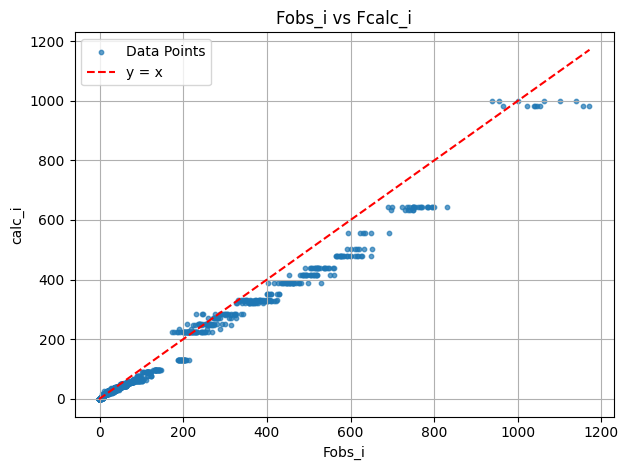

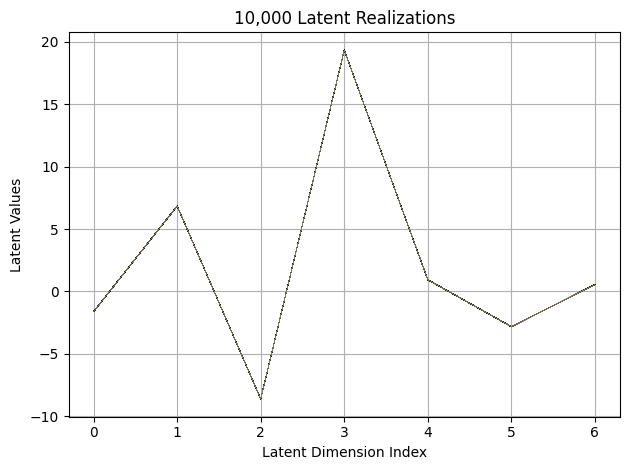

First 10 latent vectors from the VAE:
Sample 1: [-1.6202497482299805, 6.842674732208252, -8.58944034576416, 19.325008392333984, 0.946546196937561, -2.8237502574920654, 0.542430579662323]
Sample 2: [-1.6236867904663086, 6.848073482513428, -8.59783935546875, 19.31787109375, 0.9358855485916138, -2.8208792209625244, 0.5420026779174805]
Sample 3: [-1.620939016342163, 6.849588871002197, -8.589751243591309, 19.310192108154297, 0.9465095400810242, -2.81581449508667, 0.5533018112182617]
Sample 4: [-1.637182593345642, 6.839167594909668, -8.599686622619629, 19.313617706298828, 0.9435325264930725, -2.8037285804748535, 0.5508923530578613]
Sample 5: [-1.6117427349090576, 6.83311128616333, -8.590950965881348, 19.3241024017334, 0.9456229209899902, -2.806088924407959, 0.5438769459724426]
Sample 6: [-1.600846290588379, 6.834958076477051, -8.610700607299805, 19.317459106445312, 0.9401808381080627, -2.8102245330810547, 0.5509467124938965]
Sample 7: [-1.6090457439422607, 6.836933612823486, -8.5975570678710

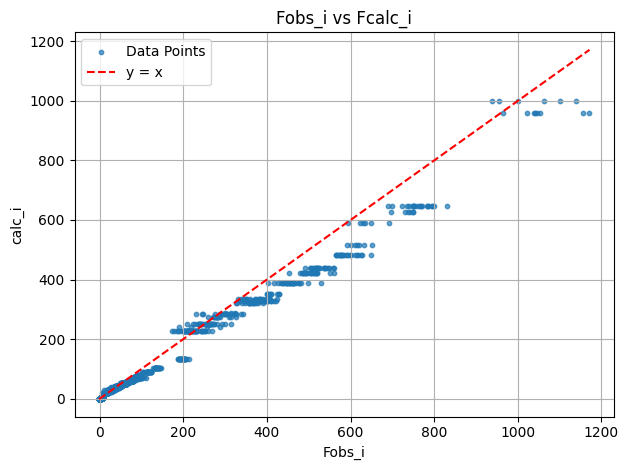

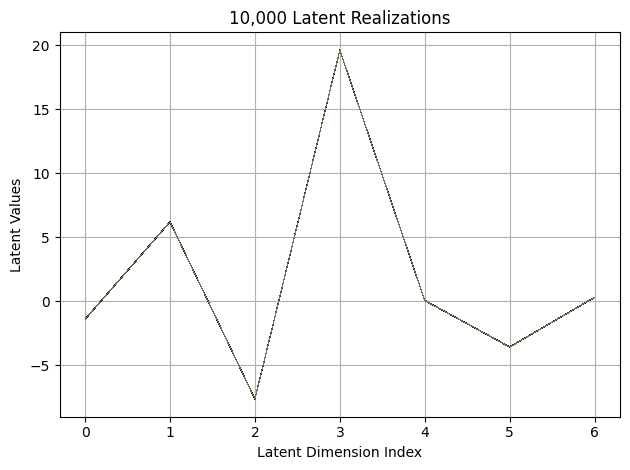

First 10 latent vectors from the VAE:
Sample 1: [-1.388964056968689, 6.195560932159424, -7.64444637298584, 19.61785888671875, 0.07129175961017609, -3.56451153755188, 0.29887792468070984]
Sample 2: [-1.4044334888458252, 6.210150718688965, -7.6240081787109375, 19.596235275268555, 0.05268215388059616, -3.559910774230957, 0.2976245880126953]
Sample 3: [-1.3845336437225342, 6.195981502532959, -7.62615966796875, 19.617280960083008, 0.0644834116101265, -3.564411163330078, 0.29470255970954895]
Sample 4: [-1.3985549211502075, 6.208465099334717, -7.619349002838135, 19.60839080810547, 0.0592789500951767, -3.557544469833374, 0.3017267882823944]
Sample 5: [-1.397214651107788, 6.21475887298584, -7.6213226318359375, 19.6080265045166, 0.06603875011205673, -3.574655055999756, 0.3129481375217438]
Sample 6: [-1.4104150533676147, 6.200892925262451, -7.6346235275268555, 19.612438201904297, 0.05462489649653435, -3.566105842590332, 0.3011951744556427]
Sample 7: [-1.4044058322906494, 6.194494724273682, -7.623

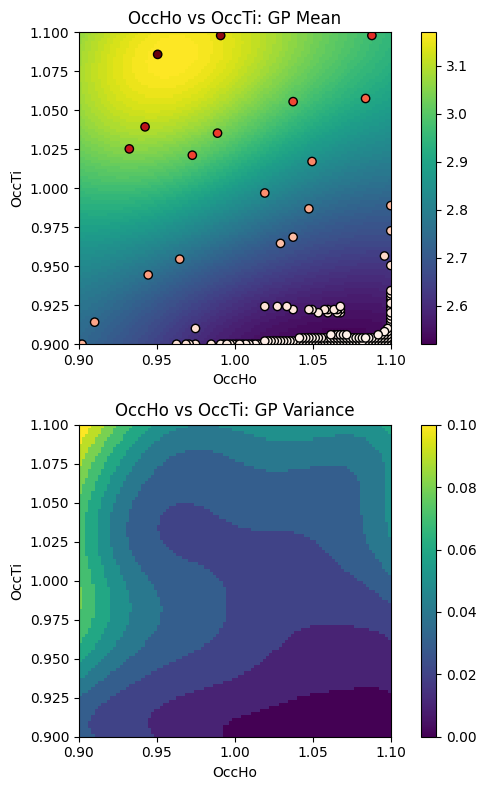

EI: [-1.00000000e+00 -1.00000000e+00  2.62141228e-03 ...  5.83343673e-04
  6.72725495e-04  7.77556561e-04]
Function eval #200
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9060605764389038, 1.0595959424972534]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4365
initial chi^2 1.7179e+06 with 2596 obs.
New scale: 0.4356
Cycle 0: 1.02s, Chi**2: 3.8114e+05 for 2596 obs., Lambda: 0,  Delta: 0.778, SVD=0
New scale: 0.4356
Maximum shift/esd = -236.

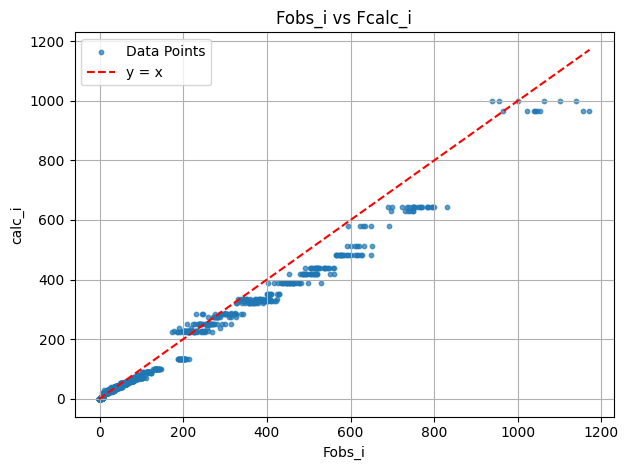

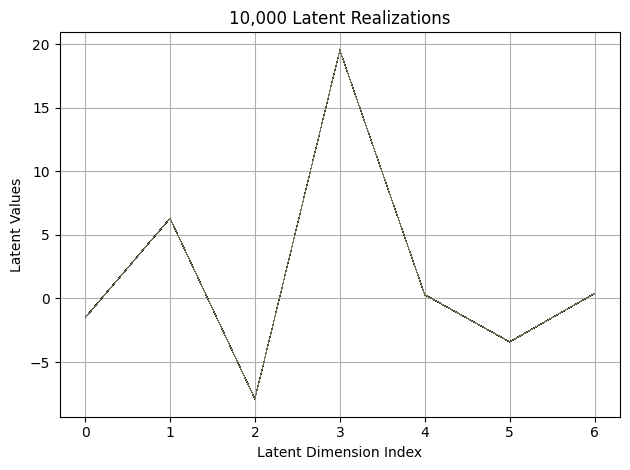

First 10 latent vectors from the VAE:
Sample 1: [-1.5212610960006714, 6.291560649871826, -7.910527229309082, 19.54842758178711, 0.3059960901737213, -3.4239492416381836, 0.3866881728172302]
Sample 2: [-1.5342113971710205, 6.304673671722412, -7.900476932525635, 19.553300857543945, 0.31523048877716064, -3.4167282581329346, 0.3967761993408203]
Sample 3: [-1.518843173980713, 6.305140018463135, -7.897510528564453, 19.546649932861328, 0.30020180344581604, -3.424400568008423, 0.39442363381385803]
Sample 4: [-1.507420301437378, 6.314411163330078, -7.902543544769287, 19.565994262695312, 0.3006075620651245, -3.4125070571899414, 0.3905807137489319]
Sample 5: [-1.5120320320129395, 6.309168338775635, -7.8957109451293945, 19.55206298828125, 0.2976647615432739, -3.4181504249572754, 0.3959268629550934]
Sample 6: [-1.5099401473999023, 6.32263708114624, -7.902062892913818, 19.545536041259766, 0.29931941628456116, -3.4140543937683105, 0.3931664228439331]
Sample 7: [-1.527282476425171, 6.312204360961914, -

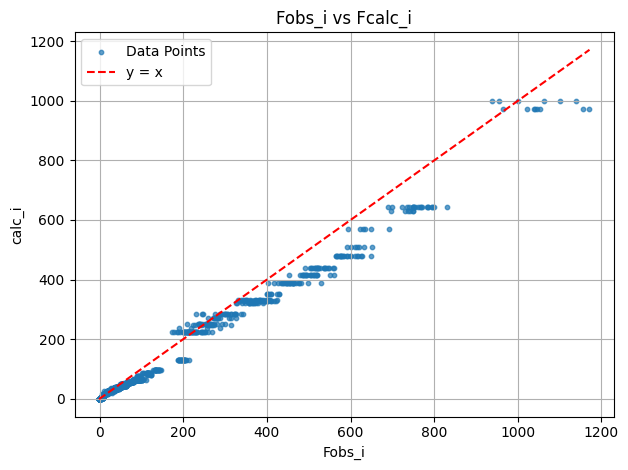

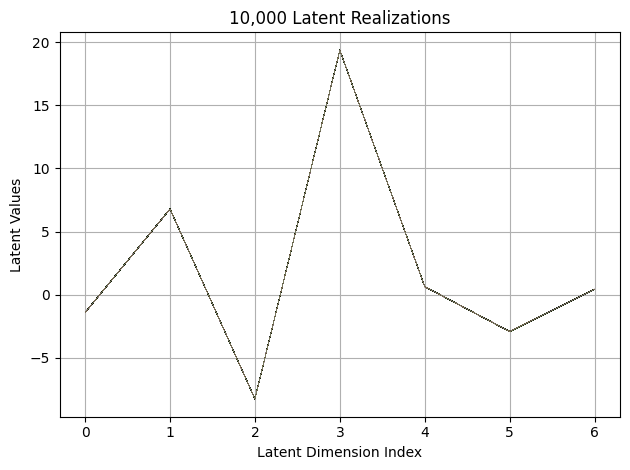

First 10 latent vectors from the VAE:
Sample 1: [-1.408190369606018, 6.790462017059326, -8.252549171447754, 19.369600296020508, 0.6444188356399536, -2.932753086090088, 0.4235544204711914]
Sample 2: [-1.426322340965271, 6.793006896972656, -8.24783706665039, 19.3867130279541, 0.6346866488456726, -2.9212424755096436, 0.4233512878417969]
Sample 3: [-1.409365177154541, 6.796483516693115, -8.259432792663574, 19.380720138549805, 0.6439478397369385, -2.9299800395965576, 0.42200008034706116]
Sample 4: [-1.4088281393051147, 6.787906169891357, -8.25920295715332, 19.37339210510254, 0.6469713449478149, -2.9169211387634277, 0.42204251885414124]
Sample 5: [-1.4202048778533936, 6.784335136413574, -8.25742244720459, 19.388628005981445, 0.6499801874160767, -2.917781352996826, 0.4297301471233368]
Sample 6: [-1.4106085300445557, 6.7906174659729, -8.259989738464355, 19.38751220703125, 0.6363133192062378, -2.914224147796631, 0.4202065169811249]
Sample 7: [-1.4080995321273804, 6.793758392333984, -8.265225410

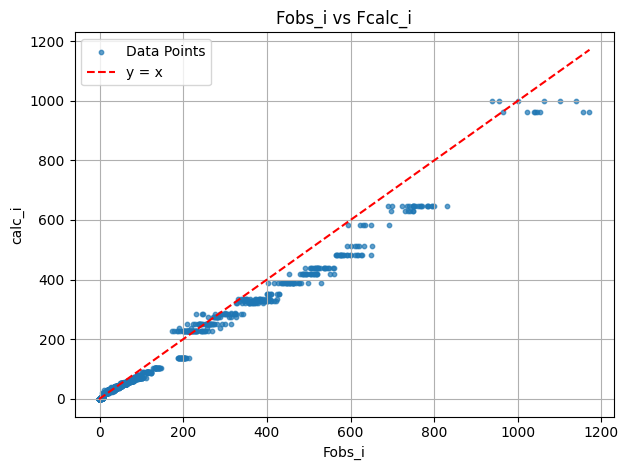

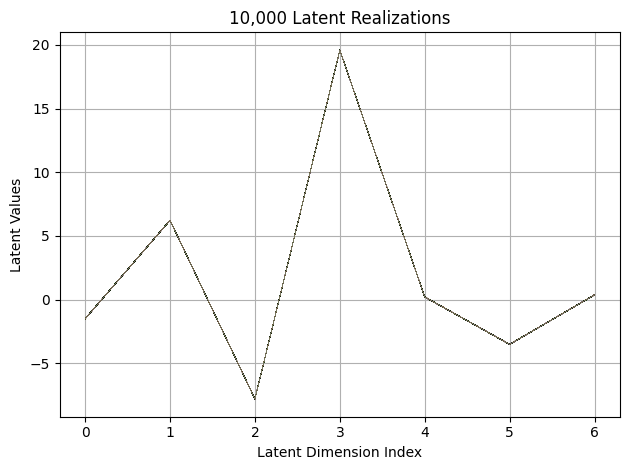

First 10 latent vectors from the VAE:
Sample 1: [-1.5047144889831543, 6.213901042938232, -7.795441150665283, 19.59910774230957, 0.21117499470710754, -3.514780044555664, 0.36710119247436523]
Sample 2: [-1.5148611068725586, 6.219636917114258, -7.792080879211426, 19.587038040161133, 0.2022855579853058, -3.5079398155212402, 0.36561062932014465]
Sample 3: [-1.4919705390930176, 6.226470947265625, -7.7990593910217285, 19.58858299255371, 0.20244650542736053, -3.501091241836548, 0.3700902760028839]
Sample 4: [-1.49578058719635, 6.22319221496582, -7.800978183746338, 19.599098205566406, 0.21397431194782257, -3.500689744949341, 0.3696250319480896]
Sample 5: [-1.5147881507873535, 6.233692646026611, -7.798211097717285, 19.588565826416016, 0.20527806878089905, -3.535752058029175, 0.3585585355758667]
Sample 6: [-1.5057064294815063, 6.220068454742432, -7.798286437988281, 19.582172393798828, 0.20750020444393158, -3.511685848236084, 0.36967185139656067]
Sample 7: [-1.4926276206970215, 6.228326320648193, 

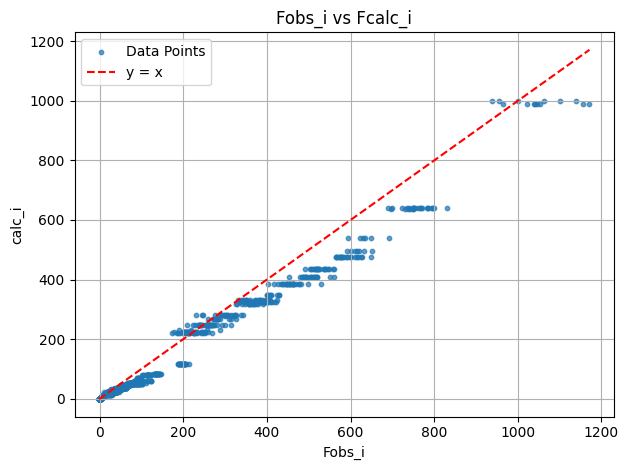

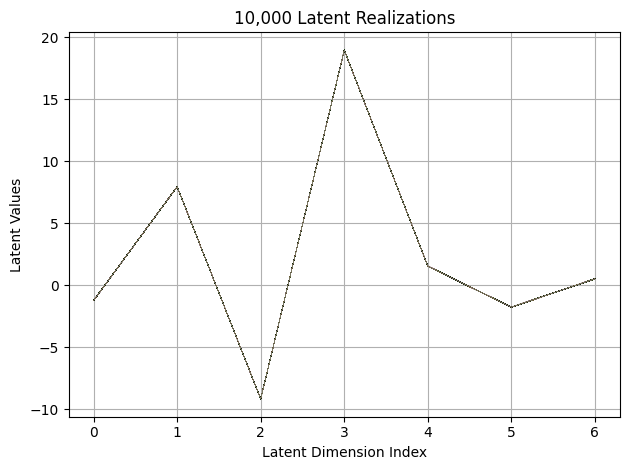

First 10 latent vectors from the VAE:
Sample 1: [-1.2414530515670776, 7.943351745605469, -9.175456047058105, 18.945951461791992, 1.526146411895752, -1.788034200668335, 0.5134760141372681]
Sample 2: [-1.2397300004959106, 7.936977386474609, -9.189726829528809, 18.950532913208008, 1.528156042098999, -1.776153326034546, 0.4929354190826416]
Sample 3: [-1.2530667781829834, 7.940822124481201, -9.181325912475586, 18.95761489868164, 1.5257090330123901, -1.781310796737671, 0.5123550891876221]
Sample 4: [-1.2372699975967407, 7.938988208770752, -9.18249225616455, 18.962181091308594, 1.5344929695129395, -1.777613878250122, 0.5090819001197815]
Sample 5: [-1.2334786653518677, 7.952855587005615, -9.183981895446777, 18.94466209411621, 1.5318557024002075, -1.773554801940918, 0.4885808825492859]
Sample 6: [-1.2389771938323975, 7.929697036743164, -9.175750732421875, 18.948976516723633, 1.525434970855713, -1.7808120250701904, 0.5106461048126221]
Sample 7: [-1.249699592590332, 7.926321029663086, -9.18888664

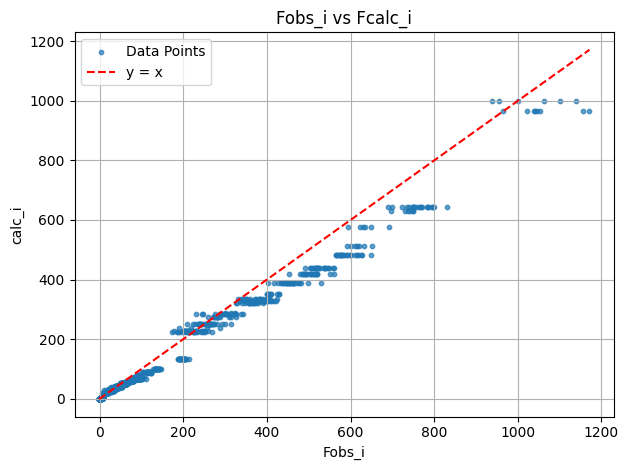

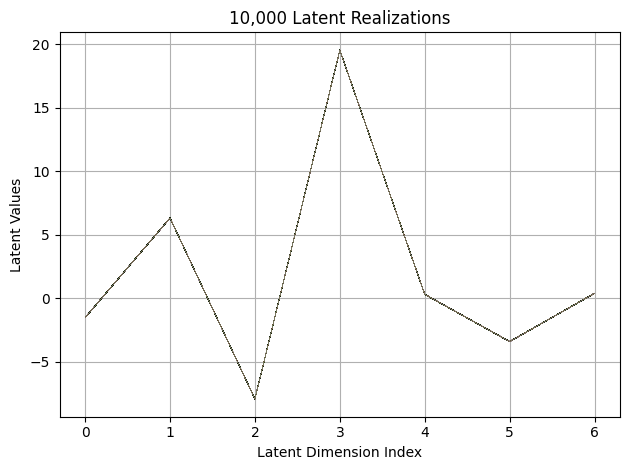

First 10 latent vectors from the VAE:
Sample 1: [-1.523849368095398, 6.330410003662109, -7.907183647155762, 19.548614501953125, 0.31694087386131287, -3.4072258472442627, 0.37911558151245117]
Sample 2: [-1.512810230255127, 6.3264617919921875, -7.916287899017334, 19.54148292541504, 0.31825265288352966, -3.400949716567993, 0.41609838604927063]
Sample 3: [-1.52466881275177, 6.3137006759643555, -7.910758972167969, 19.53893280029297, 0.31972193717956543, -3.4059901237487793, 0.38512590527534485]
Sample 4: [-1.516613245010376, 6.313713073730469, -7.922173023223877, 19.53995704650879, 0.3088044822216034, -3.4069626331329346, 0.38387826085090637]
Sample 5: [-1.505833625793457, 6.320333480834961, -7.922270774841309, 19.54594612121582, 0.3138168454170227, -3.41072416305542, 0.39391055703163147]
Sample 6: [-1.5130378007888794, 6.313380241394043, -7.914583683013916, 19.556564331054688, 0.30412670969963074, -3.3949291706085205, 0.39461275935173035]
Sample 7: [-1.522676706314087, 6.320796012878418, -

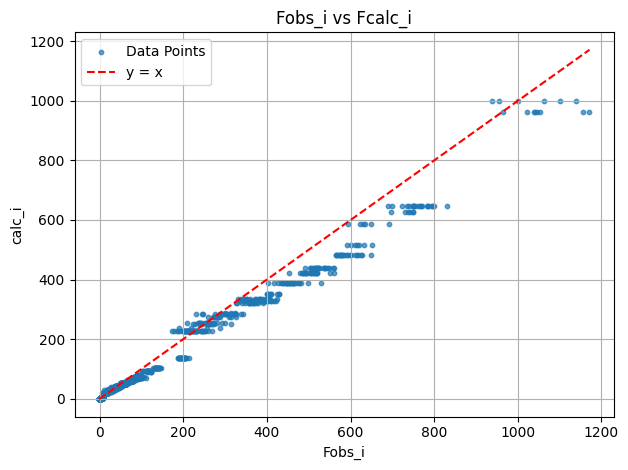

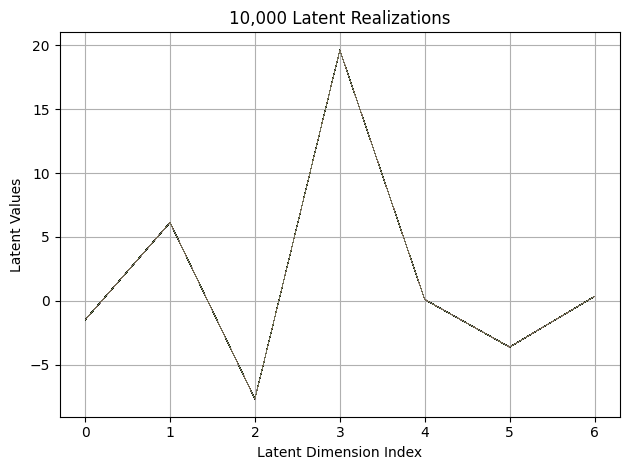

First 10 latent vectors from the VAE:
Sample 1: [-1.482677936553955, 6.138885974884033, -7.681482791900635, 19.625892639160156, 0.10580667853355408, -3.6226296424865723, 0.3442375957965851]
Sample 2: [-1.479758858680725, 6.126701354980469, -7.687371253967285, 19.633399963378906, 0.09903256595134735, -3.619472026824951, 0.34378576278686523]
Sample 3: [-1.4914127588272095, 6.120906829833984, -7.683847427368164, 19.61103630065918, 0.1050112172961235, -3.607194185256958, 0.3387618064880371]
Sample 4: [-1.5054445266723633, 6.126923561096191, -7.688884735107422, 19.613056182861328, 0.10640151053667068, -3.634967565536499, 0.34485113620758057]
Sample 5: [-1.4931315183639526, 6.129644393920898, -7.67500114440918, 19.627574920654297, 0.09729564189910889, -3.624793529510498, 0.34413447976112366]
Sample 6: [-1.5048227310180664, 6.127321720123291, -7.672044277191162, 19.63094139099121, 0.0964745357632637, -3.630000352859497, 0.3605133295059204]
Sample 7: [-1.4926434755325317, 6.139278411865234, -7

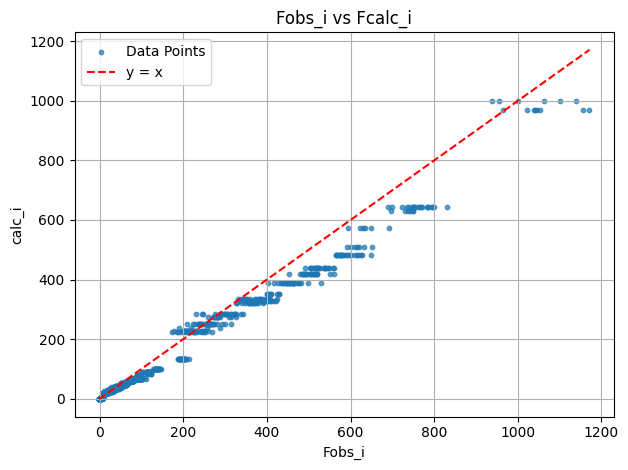

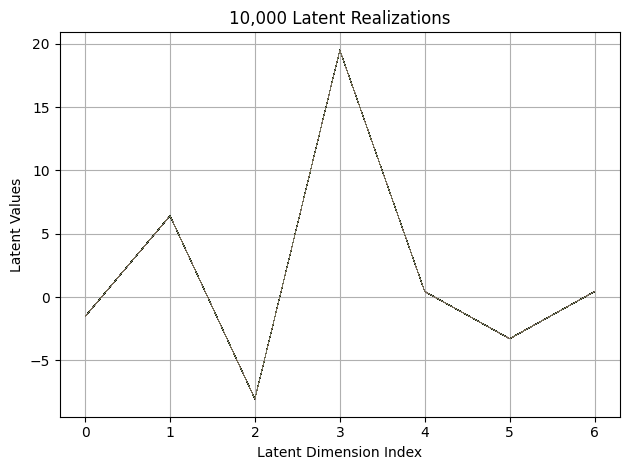

First 10 latent vectors from the VAE:
Sample 1: [-1.5368587970733643, 6.412319660186768, -8.060673713684082, 19.503015518188477, 0.4389294683933258, -3.275766372680664, 0.42854100465774536]
Sample 2: [-1.528059959411621, 6.412791728973389, -8.057165145874023, 19.48910903930664, 0.42976054549217224, -3.2912285327911377, 0.4450269341468811]
Sample 3: [-1.5627093315124512, 6.425474643707275, -8.061300277709961, 19.514894485473633, 0.4301173686981201, -3.29972243309021, 0.43440452218055725]
Sample 4: [-1.5465387105941772, 6.4054951667785645, -8.0609712600708, 19.50858497619629, 0.4265972375869751, -3.2945339679718018, 0.4211399257183075]
Sample 5: [-1.5487130880355835, 6.424226760864258, -8.050890922546387, 19.500333786010742, 0.43229052424430847, -3.2980868816375732, 0.43140241503715515]
Sample 6: [-1.5435309410095215, 6.41675329208374, -8.04959774017334, 19.50853729248047, 0.4356790781021118, -3.2816998958587646, 0.42674195766448975]
Sample 7: [-1.544259786605835, 6.3992509841918945, -8.

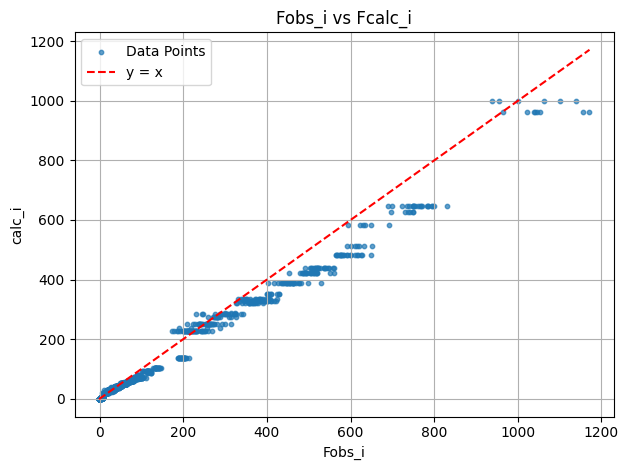

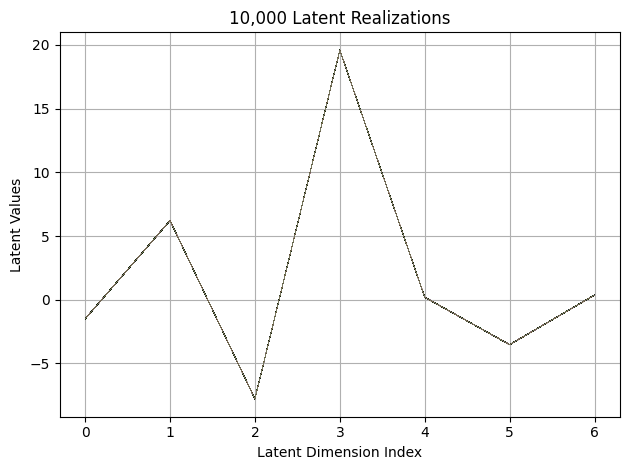

First 10 latent vectors from the VAE:
Sample 1: [-1.5156419277191162, 6.216475963592529, -7.787991523742676, 19.585853576660156, 0.20164258778095245, -3.5375332832336426, 0.36415231227874756]
Sample 2: [-1.4974229335784912, 6.216900825500488, -7.786291122436523, 19.60211753845215, 0.1951344758272171, -3.5257692337036133, 0.37098729610443115]
Sample 3: [-1.5059303045272827, 6.205044269561768, -7.793690204620361, 19.588647842407227, 0.19299311935901642, -3.513901710510254, 0.3694949150085449]
Sample 4: [-1.5015114545822144, 6.208628177642822, -7.785820960998535, 19.59478759765625, 0.1934543251991272, -3.5366387367248535, 0.36598795652389526]
Sample 5: [-1.5051926374435425, 6.212085723876953, -7.793447971343994, 19.594541549682617, 0.20157812535762787, -3.5089030265808105, 0.36564457416534424]
Sample 6: [-1.5138907432556152, 6.206223487854004, -7.779106616973877, 19.593677520751953, 0.1924474686384201, -3.5314862728118896, 0.3729303479194641]
Sample 7: [-1.523462176322937, 6.2154006958007

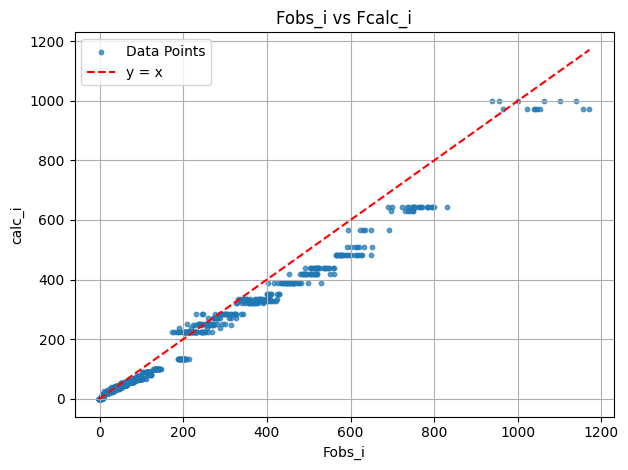

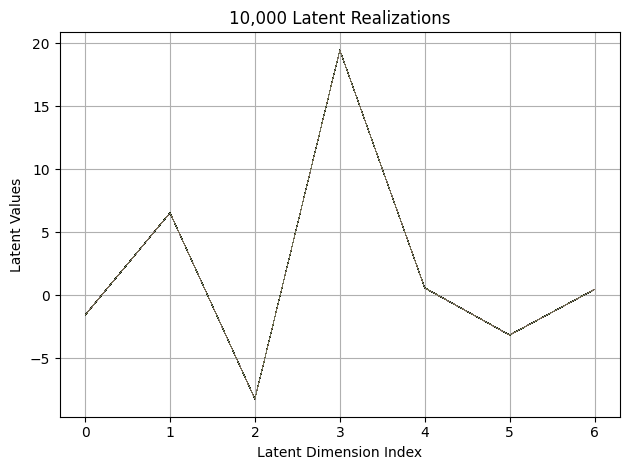

First 10 latent vectors from the VAE:
Sample 1: [-1.5795938968658447, 6.54887580871582, -8.227179527282715, 19.453161239624023, 0.582068145275116, -3.147205114364624, 0.45716017484664917]
Sample 2: [-1.5749765634536743, 6.525344371795654, -8.22420597076416, 19.437349319458008, 0.5900681018829346, -3.1520137786865234, 0.4691103994846344]
Sample 3: [-1.567866325378418, 6.544425010681152, -8.199695587158203, 19.456872940063477, 0.5890458822250366, -3.1379971504211426, 0.4539700448513031]
Sample 4: [-1.5606188774108887, 6.540779113769531, -8.213621139526367, 19.44577407836914, 0.5845628380775452, -3.1421961784362793, 0.4717641770839691]
Sample 5: [-1.5745773315429688, 6.5309224128723145, -8.21597671508789, 19.449779510498047, 0.5841771364212036, -3.146693468093872, 0.4557265341281891]
Sample 6: [-1.58870530128479, 6.539417743682861, -8.225700378417969, 19.44876480102539, 0.5861166715621948, -3.1578257083892822, 0.4714609980583191]
Sample 7: [-1.562127947807312, 6.5264811515808105, -8.21629

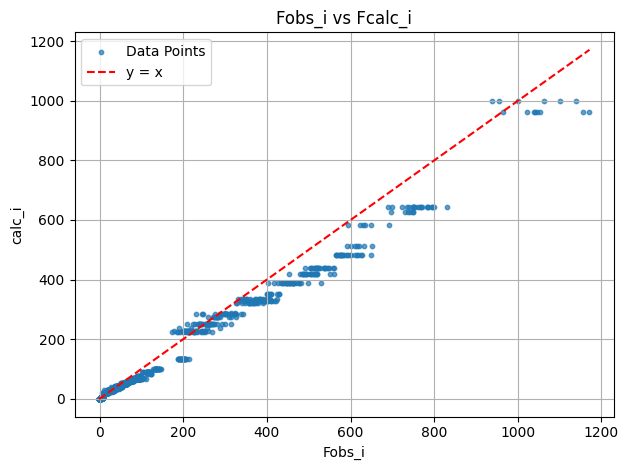

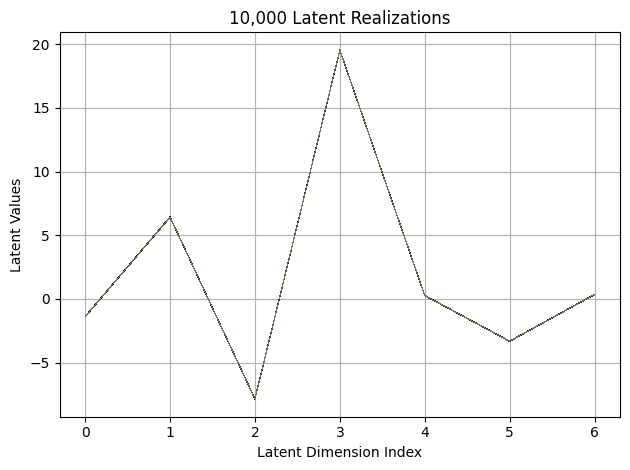

First 10 latent vectors from the VAE:
Sample 1: [-1.3985875844955444, 6.422916889190674, -7.856716632843018, 19.536840438842773, 0.2694481313228607, -3.330353021621704, 0.34639689326286316]
Sample 2: [-1.3951395750045776, 6.434815406799316, -7.846088409423828, 19.52669906616211, 0.25567832589149475, -3.321934938430786, 0.3382387161254883]
Sample 3: [-1.397684931755066, 6.414831161499023, -7.851131439208984, 19.5349063873291, 0.25841817259788513, -3.3236050605773926, 0.3433079123497009]
Sample 4: [-1.40782630443573, 6.420525550842285, -7.8503875732421875, 19.53028106689453, 0.265310138463974, -3.3256125450134277, 0.3479582667350769]
Sample 5: [-1.39754056930542, 6.422788619995117, -7.85296106338501, 19.52071189880371, 0.26065585017204285, -3.3252503871917725, 0.3537790775299072]
Sample 6: [-1.3929005861282349, 6.430497169494629, -7.855202674865723, 19.548049926757812, 0.25672784447669983, -3.325300455093384, 0.3509643077850342]
Sample 7: [-1.388527274131775, 6.422683238983154, -7.834540

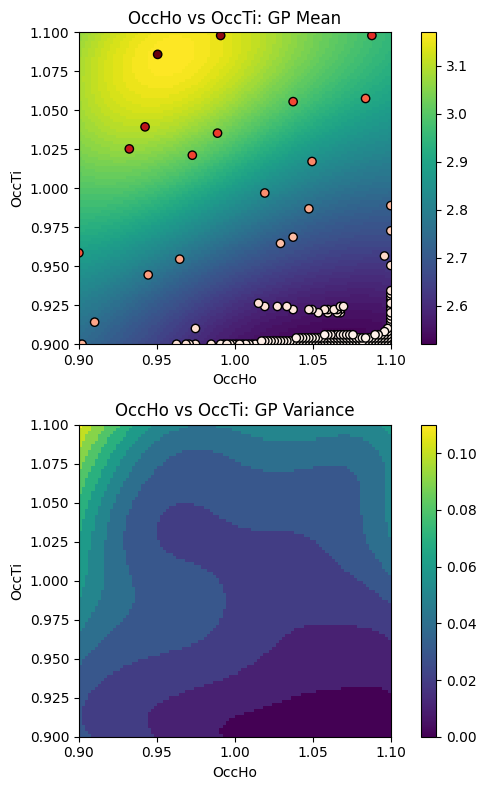

EI: [-1.00000000e+00 -1.00000000e+00  2.16353033e-03 ...  5.77179249e-04
  6.66424166e-04  7.71272462e-04]
Function eval #210
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9121211767196655, 1.0979797840118408]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4081
initial chi^2 2.1744e+06 with 2596 obs.
New scale: 0.4070
Cycle 0: 1.46s, Chi**2: 4.1863e+05 for 2596 obs., Lambda: 0,  Delta: 0.807, SVD=0
New scale: 0.4070
Maximum shift/esd = -269.

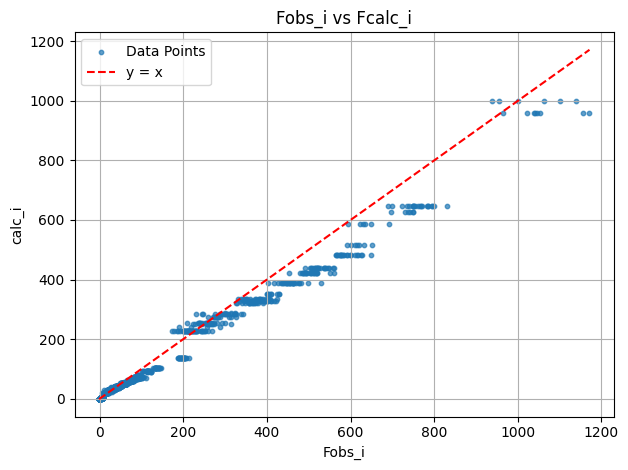

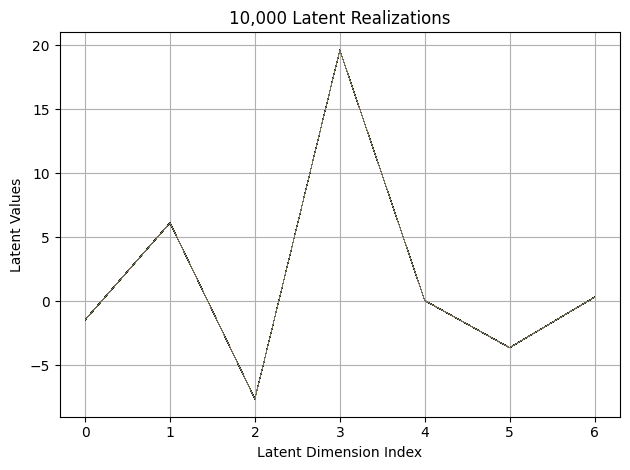

First 10 latent vectors from the VAE:
Sample 1: [-1.4589694738388062, 6.129261016845703, -7.637834548950195, 19.640750885009766, 0.05648268759250641, -3.6332569122314453, 0.3197278678417206]
Sample 2: [-1.4629048109054565, 6.1481828689575195, -7.638057708740234, 19.626846313476562, 0.0525403767824173, -3.6354870796203613, 0.31862619519233704]
Sample 3: [-1.4480458498001099, 6.13483190536499, -7.634686470031738, 19.635665893554688, 0.05816958472132683, -3.62335467338562, 0.3156315088272095]
Sample 4: [-1.4378207921981812, 6.138788223266602, -7.6324357986450195, 19.628992080688477, 0.06457564234733582, -3.6156091690063477, 0.3239094614982605]
Sample 5: [-1.4578166007995605, 6.1302337646484375, -7.637714385986328, 19.626632690429688, 0.0649871677160263, -3.623723030090332, 0.31979867815971375]
Sample 6: [-1.4490995407104492, 6.134863376617432, -7.627517223358154, 19.62929344177246, 0.057875778526067734, -3.6292665004730225, 0.3158104419708252]
Sample 7: [-1.4639227390289307, 6.13024950027

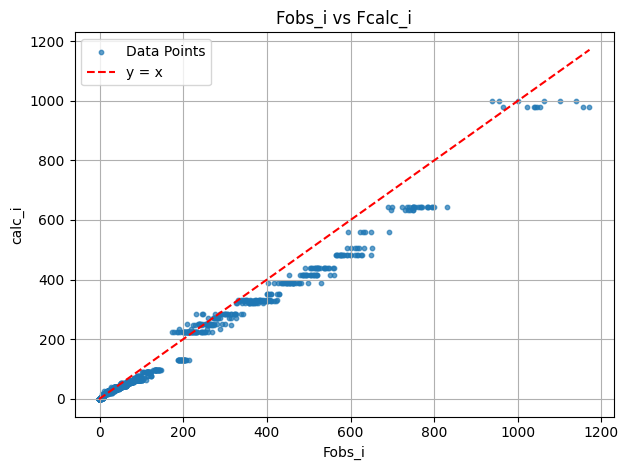

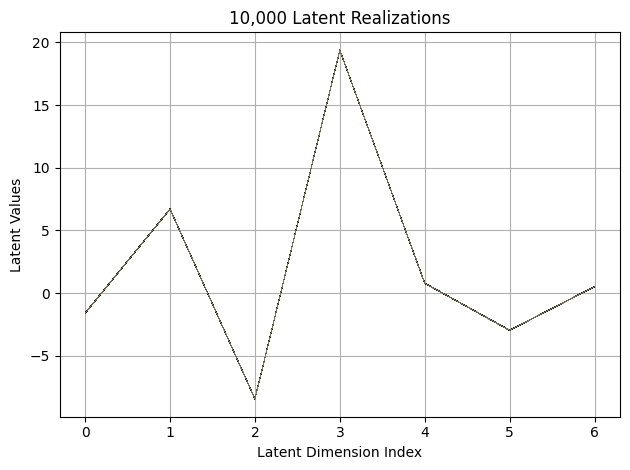

First 10 latent vectors from the VAE:
Sample 1: [-1.5960546731948853, 6.699483394622803, -8.44914722442627, 19.368148803710938, 0.7905325889587402, -2.9594905376434326, 0.5133739709854126]
Sample 2: [-1.6093088388442993, 6.70095157623291, -8.450597763061523, 19.371999740600586, 0.7832123041152954, -2.964388847351074, 0.5270518660545349]
Sample 3: [-1.6038379669189453, 6.703299522399902, -8.431633949279785, 19.379024505615234, 0.7904796004295349, -2.9534847736358643, 0.5195850133895874]
Sample 4: [-1.5956674814224243, 6.695444583892822, -8.43630313873291, 19.376070022583008, 0.7914944887161255, -2.9568543434143066, 0.5177208185195923]
Sample 5: [-1.6076031923294067, 6.7135396003723145, -8.439505577087402, 19.366601943969727, 0.7916039824485779, -2.969205856323242, 0.5214459300041199]
Sample 6: [-1.5927255153656006, 6.707894802093506, -8.446391105651855, 19.36871910095215, 0.7985257506370544, -2.9688730239868164, 0.526524007320404]
Sample 7: [-1.5964300632476807, 6.694873809814453, -8.44

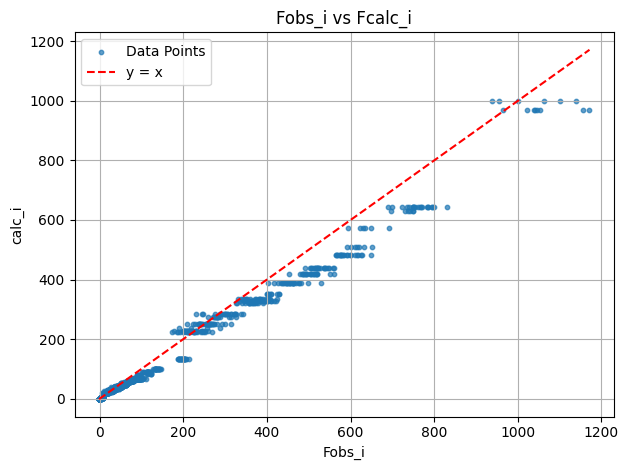

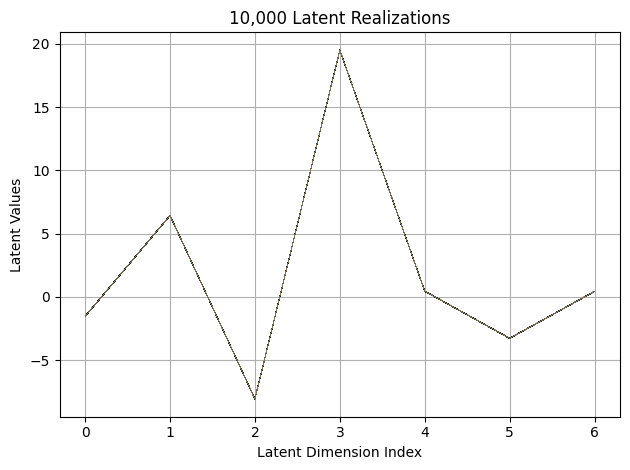

First 10 latent vectors from the VAE:
Sample 1: [-1.540170669555664, 6.418065547943115, -8.066499710083008, 19.500587463378906, 0.4615367650985718, -3.2757182121276855, 0.43694859743118286]
Sample 2: [-1.5414460897445679, 6.432334899902344, -8.065960884094238, 19.500595092773438, 0.45106521248817444, -3.284498691558838, 0.4412563145160675]
Sample 3: [-1.5542141199111938, 6.434978485107422, -8.078511238098145, 19.50139617919922, 0.4544336795806885, -3.2684030532836914, 0.4320273995399475]
Sample 4: [-1.5370134115219116, 6.424389839172363, -8.075477600097656, 19.495227813720703, 0.4551280736923218, -3.2740156650543213, 0.43307095766067505]
Sample 5: [-1.5269768238067627, 6.427493572235107, -8.059558868408203, 19.493610382080078, 0.4481925666332245, -3.2726314067840576, 0.42557665705680847]
Sample 6: [-1.5501242876052856, 6.430693626403809, -8.06885051727295, 19.490524291992188, 0.43596115708351135, -3.2810282707214355, 0.44330263137817383]
Sample 7: [-1.53839111328125, 6.431034088134766,

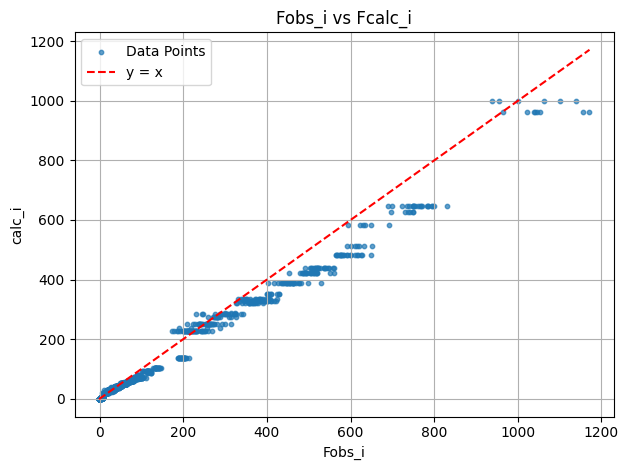

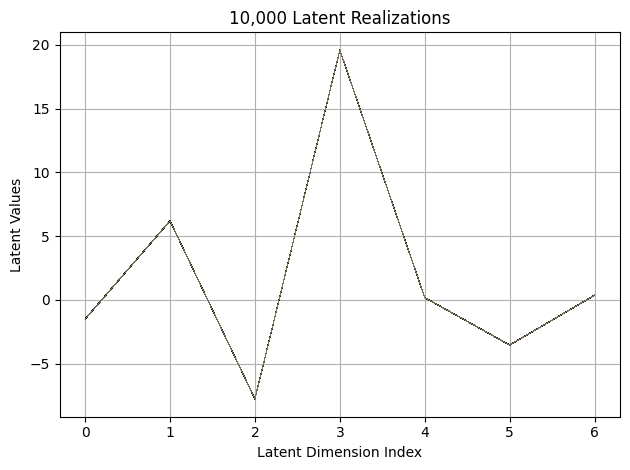

First 10 latent vectors from the VAE:
Sample 1: [-1.5108214616775513, 6.200153827667236, -7.764308929443359, 19.60114288330078, 0.18670280277729034, -3.55590558052063, 0.354306697845459]
Sample 2: [-1.4967821836471558, 6.205447196960449, -7.783791542053223, 19.603126525878906, 0.19038625061511993, -3.531172752380371, 0.3626452088356018]
Sample 3: [-1.4982532262802124, 6.196951866149902, -7.759804725646973, 19.602399826049805, 0.18625159561634064, -3.5406150817871094, 0.3661261200904846]
Sample 4: [-1.4992742538452148, 6.20530366897583, -7.768615245819092, 19.606164932250977, 0.19096390902996063, -3.538456916809082, 0.3701518177986145]
Sample 5: [-1.4981886148452759, 6.197826862335205, -7.7735090255737305, 19.594133377075195, 0.18004582822322845, -3.5255682468414307, 0.3652469217777252]
Sample 6: [-1.5043390989303589, 6.201253890991211, -7.770730495452881, 19.609655380249023, 0.17745648324489594, -3.5472214221954346, 0.3602500557899475]
Sample 7: [-1.4981884956359863, 6.207072734832764,

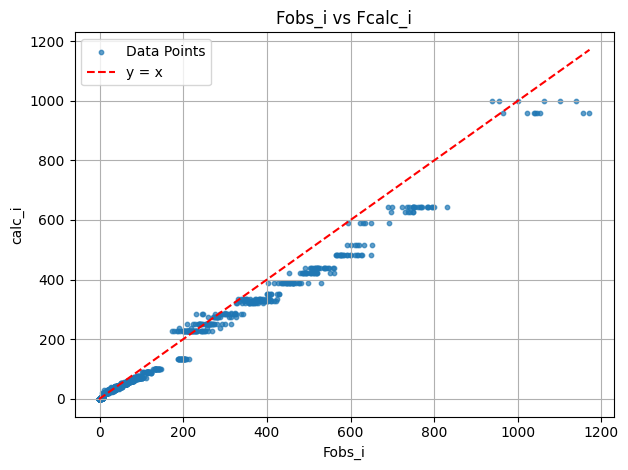

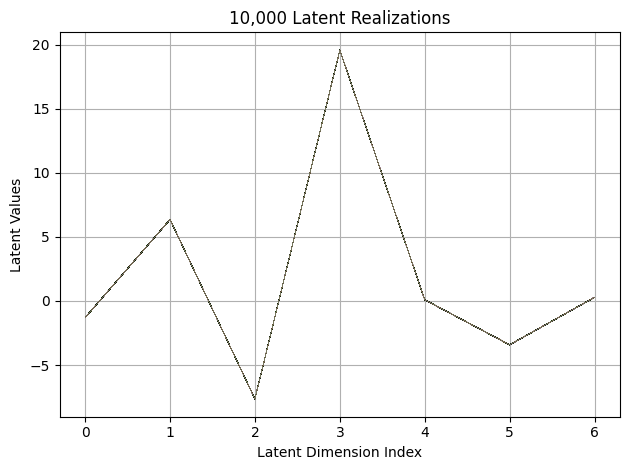

First 10 latent vectors from the VAE:
Sample 1: [-1.3064531087875366, 6.358056545257568, -7.656363010406494, 19.58010482788086, 0.08593907207250595, -3.4254262447357178, 0.2826826572418213]
Sample 2: [-1.2909648418426514, 6.3378119468688965, -7.657110691070557, 19.58038330078125, 0.10069730877876282, -3.424359083175659, 0.27769169211387634]
Sample 3: [-1.314043402671814, 6.351138114929199, -7.646170616149902, 19.57886505126953, 0.09613198786973953, -3.4171814918518066, 0.28604549169540405]
Sample 4: [-1.3010191917419434, 6.3597412109375, -7.651301383972168, 19.579505920410156, 0.09340539574623108, -3.4437685012817383, 0.27836665511131287]
Sample 5: [-1.306373953819275, 6.33961820602417, -7.634370803833008, 19.569032669067383, 0.08756682276725769, -3.414273262023926, 0.28285646438598633]
Sample 6: [-1.3092197179794312, 6.3482279777526855, -7.642934322357178, 19.577943801879883, 0.0984487235546112, -3.4160895347595215, 0.2818075716495514]
Sample 7: [-1.3130868673324585, 6.351064682006836

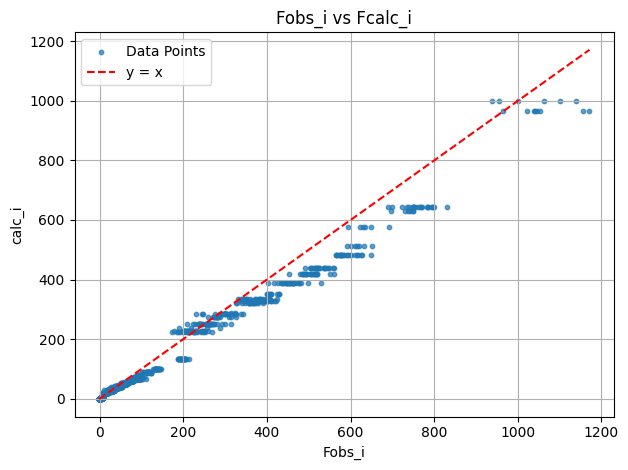

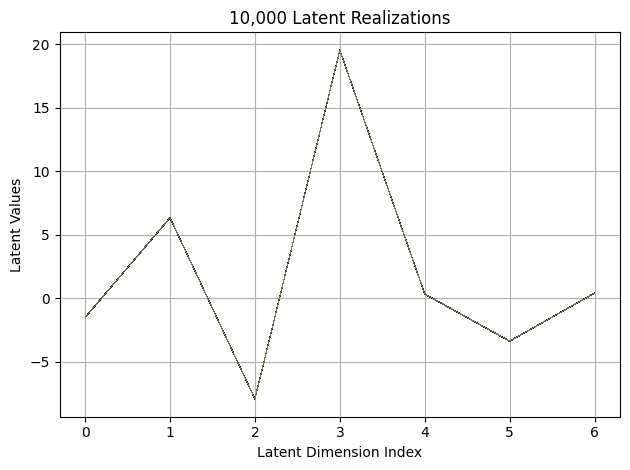

First 10 latent vectors from the VAE:
Sample 1: [-1.5165753364562988, 6.334492206573486, -7.931517124176025, 19.534652709960938, 0.3293626308441162, -3.392670154571533, 0.39408913254737854]
Sample 2: [-1.518628478050232, 6.331196308135986, -7.939651012420654, 19.539134979248047, 0.33050546050071716, -3.385695695877075, 0.3920702636241913]
Sample 3: [-1.5352306365966797, 6.3328423500061035, -7.935754299163818, 19.538379669189453, 0.3340846002101898, -3.3915953636169434, 0.3913533687591553]
Sample 4: [-1.4985295534133911, 6.330195426940918, -7.927886962890625, 19.530988693237305, 0.3151664733886719, -3.3822968006134033, 0.4012266993522644]
Sample 5: [-1.5271803140640259, 6.340463161468506, -7.938914775848389, 19.530866622924805, 0.3295416831970215, -3.390024185180664, 0.39347395300865173]
Sample 6: [-1.5255093574523926, 6.343050003051758, -7.9320292472839355, 19.545316696166992, 0.34071528911590576, -3.378938674926758, 0.40496256947517395]
Sample 7: [-1.5148367881774902, 6.31993103027343

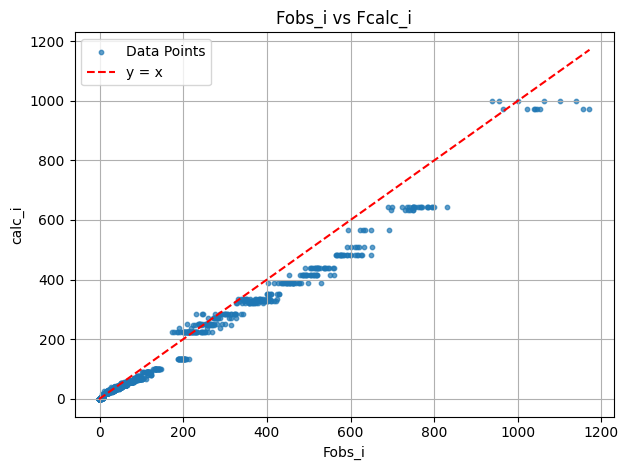

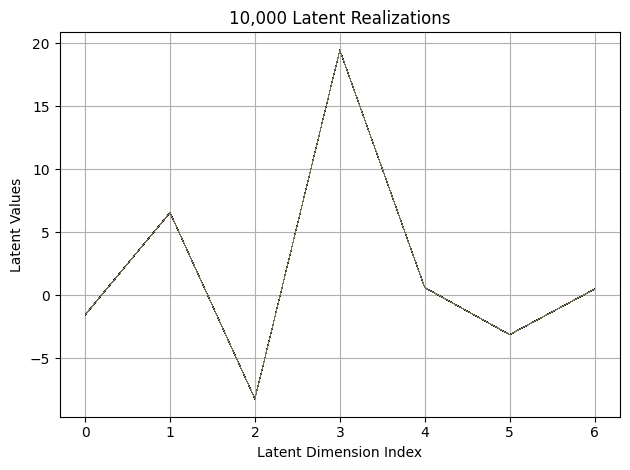

First 10 latent vectors from the VAE:
Sample 1: [-1.5794610977172852, 6.550838470458984, -8.23359489440918, 19.448474884033203, 0.5907667875289917, -3.129824161529541, 0.47448962926864624]
Sample 2: [-1.5856488943099976, 6.547813415527344, -8.241486549377441, 19.438278198242188, 0.6059342622756958, -3.135843515396118, 0.46540147066116333]
Sample 3: [-1.568366289138794, 6.545900344848633, -8.245573043823242, 19.450275421142578, 0.5973911881446838, -3.150919198989868, 0.46355780959129333]
Sample 4: [-1.561240315437317, 6.543848037719727, -8.22760009765625, 19.45504379272461, 0.6131027340888977, -3.1445302963256836, 0.4763990640640259]
Sample 5: [-1.5789146423339844, 6.544562816619873, -8.239489555358887, 19.445322036743164, 0.5875312089920044, -3.1400625705718994, 0.47347205877304077]
Sample 6: [-1.5675370693206787, 6.555912971496582, -8.237828254699707, 19.430421829223633, 0.6099644303321838, -3.1294846534729004, 0.4748324453830719]
Sample 7: [-1.5604239702224731, 6.542994976043701, -8.

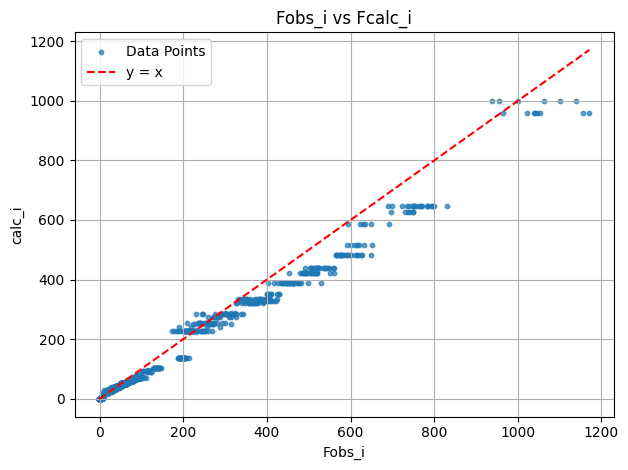

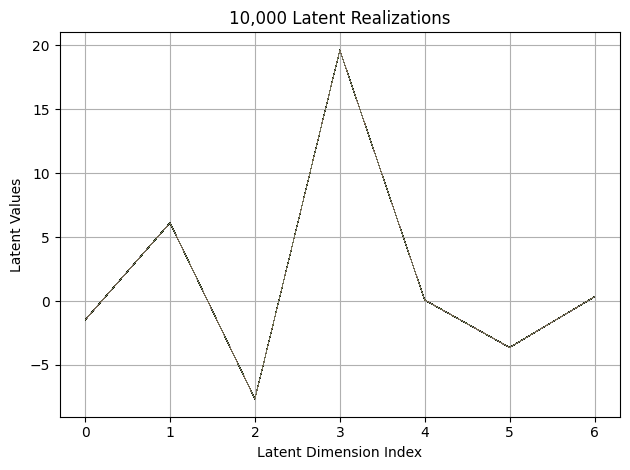

First 10 latent vectors from the VAE:
Sample 1: [-1.4813398122787476, 6.114596843719482, -7.656375408172607, 19.627941131591797, 0.07922300696372986, -3.6342530250549316, 0.34455788135528564]
Sample 2: [-1.4845727682113647, 6.130615234375, -7.6667656898498535, 19.643451690673828, 0.07810112833976746, -3.640951633453369, 0.33459895849227905]
Sample 3: [-1.482574462890625, 6.127617359161377, -7.663384437561035, 19.628154754638672, 0.07547873258590698, -3.633058786392212, 0.3347751796245575]
Sample 4: [-1.4833638668060303, 6.112612724304199, -7.660617351531982, 19.6198787689209, 0.07300548255443573, -3.639320135116577, 0.33277323842048645]
Sample 5: [-1.4815431833267212, 6.117439270019531, -7.6583638191223145, 19.617652893066406, 0.08402176201343536, -3.63430118560791, 0.32580333948135376]
Sample 6: [-1.4784268140792847, 6.120940685272217, -7.662862777709961, 19.627195358276367, 0.07494558393955231, -3.632627248764038, 0.33624041080474854]
Sample 7: [-1.4808220863342285, 6.131958484649658

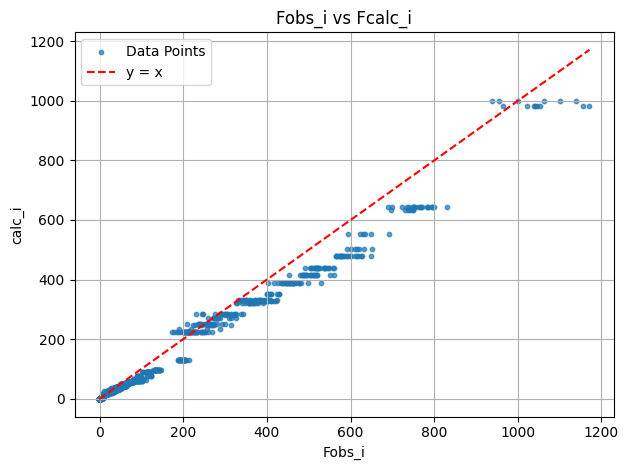

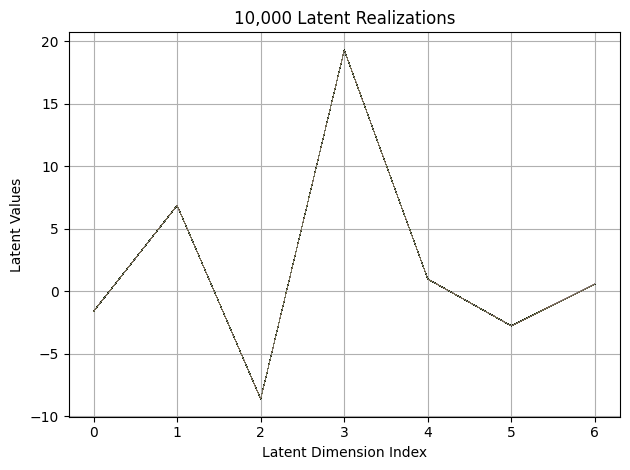

First 10 latent vectors from the VAE:
Sample 1: [-1.621749758720398, 6.878944396972656, -8.633530616760254, 19.31043243408203, 0.9707218408584595, -2.7712388038635254, 0.5571760535240173]
Sample 2: [-1.6187664270401, 6.865016937255859, -8.625349044799805, 19.304590225219727, 0.9705605506896973, -2.7800886631011963, 0.5510771870613098]
Sample 3: [-1.6179548501968384, 6.8676676750183105, -8.628560066223145, 19.30304527282715, 0.9775128960609436, -2.78796124458313, 0.5606518387794495]
Sample 4: [-1.6167830228805542, 6.864765167236328, -8.63317584991455, 19.29387855529785, 0.969857931137085, -2.7754008769989014, 0.5688725113868713]
Sample 5: [-1.6175485849380493, 6.860532283782959, -8.633489608764648, 19.30471420288086, 0.9678594470024109, -2.785022497177124, 0.5612074732780457]
Sample 6: [-1.6150286197662354, 6.877211093902588, -8.626891136169434, 19.306930541992188, 0.9786770939826965, -2.7837157249450684, 0.545077383518219]
Sample 7: [-1.622409701347351, 6.861535549163818, -8.6289987564

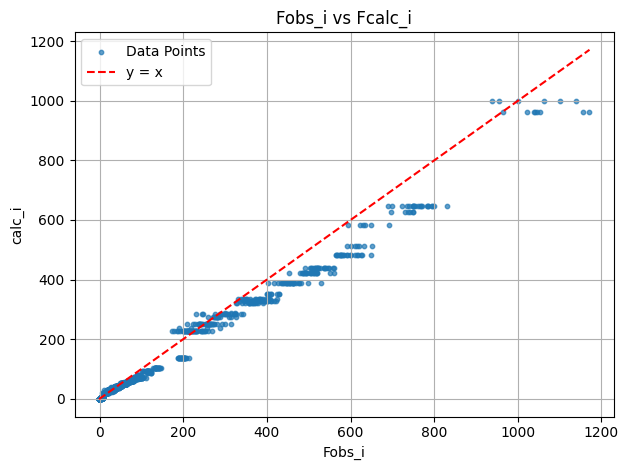

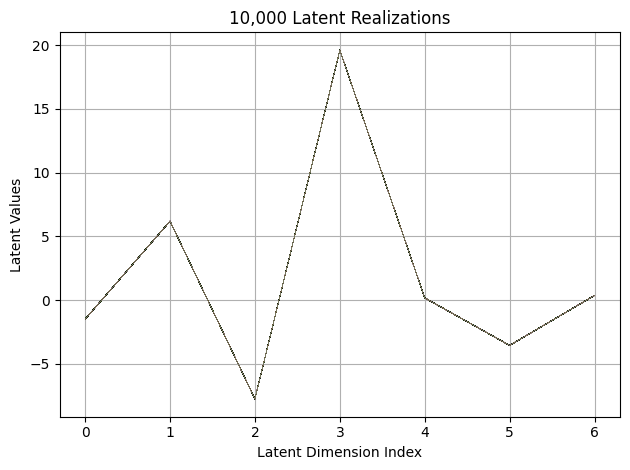

First 10 latent vectors from the VAE:
Sample 1: [-1.495180368423462, 6.175563812255859, -7.7564167976379395, 19.597280502319336, 0.16257882118225098, -3.5574734210968018, 0.36011040210723877]
Sample 2: [-1.5046987533569336, 6.1926679611206055, -7.759190559387207, 19.606904983520508, 0.1619080752134323, -3.564486265182495, 0.3722217082977295]
Sample 3: [-1.5056934356689453, 6.185858249664307, -7.750792503356934, 19.595552444458008, 0.1519274264574051, -3.5515692234039307, 0.35474905371665955]
Sample 4: [-1.5020253658294678, 6.1762189865112305, -7.762547969818115, 19.604827880859375, 0.16861672699451447, -3.5540249347686768, 0.35394492745399475]
Sample 5: [-1.5061644315719604, 6.187998294830322, -7.752195835113525, 19.608055114746094, 0.16550292074680328, -3.550154447555542, 0.3622414171695709]
Sample 6: [-1.5039843320846558, 6.177511215209961, -7.752629280090332, 19.60068702697754, 0.1733759194612503, -3.556610345840454, 0.3529389500617981]
Sample 7: [-1.5010995864868164, 6.182288169860

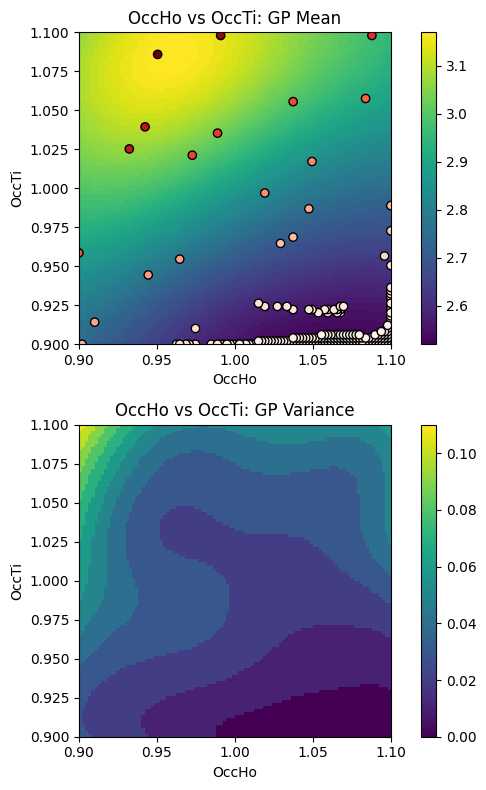

EI: [-1.00000000e+00 -1.00000000e+00  2.20697001e-03 ...  6.09877985e-04
  7.04283826e-04  8.15337524e-04]
Function eval #220
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9040403962135315, 1.0353535413742065]
[0.421597, 0.920386, 0.008262, 0.00325, 0.0, 0.0]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4561
initial chi^2 1.4461e+06 with 2596 obs.
New scale: 0.4552
Cycle 0: 2.19s, Chi**2: 3.5655e+05 for 2596 obs., Lambda: 0,  Delta: 0.753, SVD=0
New scale: 0.4552
Maximum shift/esd = -215.

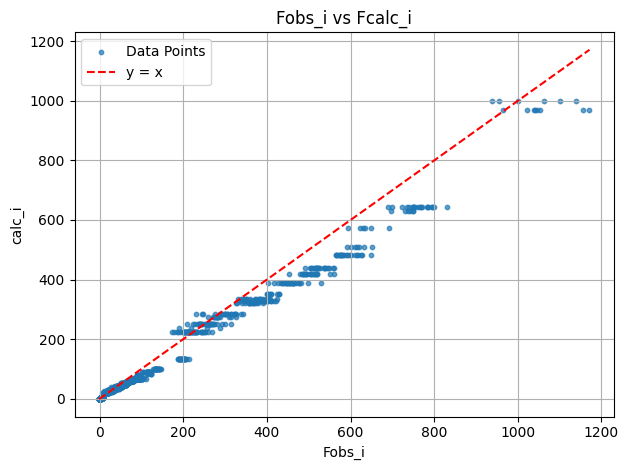

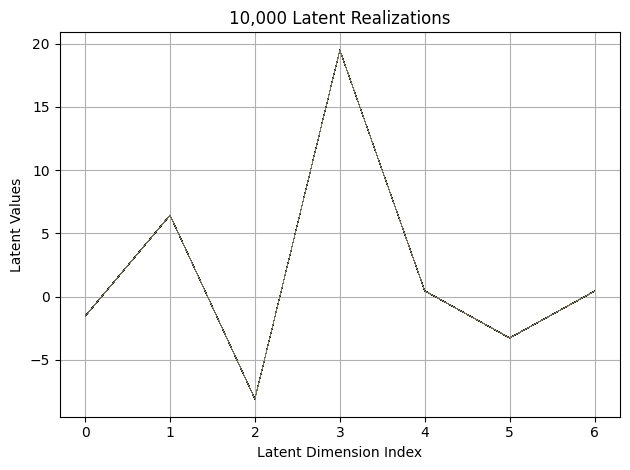

First 10 latent vectors from the VAE:
Sample 1: [-1.5629199743270874, 6.431942939758301, -8.083900451660156, 19.49396324157715, 0.4713074564933777, -3.2687997817993164, 0.4263789653778076]
Sample 2: [-1.521477222442627, 6.436324596405029, -8.08519172668457, 19.490100860595703, 0.4653030335903168, -3.2672457695007324, 0.426690936088562]
Sample 3: [-1.5419963598251343, 6.442107677459717, -8.087958335876465, 19.496932983398438, 0.4623495936393738, -3.2516331672668457, 0.4441864490509033]
Sample 4: [-1.555501937866211, 6.443045616149902, -8.073807716369629, 19.488739013671875, 0.46326255798339844, -3.268321990966797, 0.41262781620025635]
Sample 5: [-1.550966739654541, 6.442728519439697, -8.082937240600586, 19.4896183013916, 0.45746302604675293, -3.266946792602539, 0.42756417393684387]
Sample 6: [-1.550357460975647, 6.434263229370117, -8.087950706481934, 19.47648048400879, 0.4681212306022644, -3.261662006378174, 0.4498163163661957]
Sample 7: [-1.5408506393432617, 6.4413676261901855, -8.0892

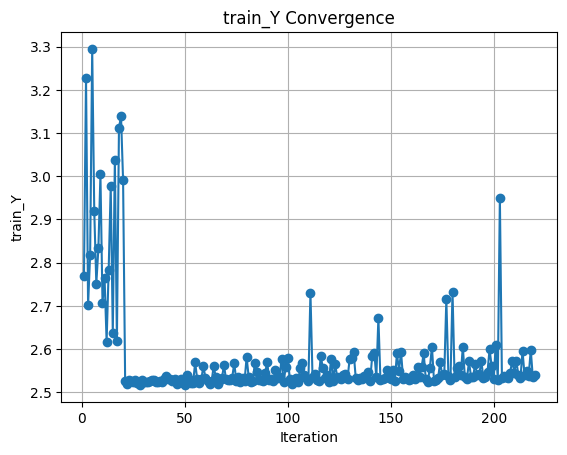

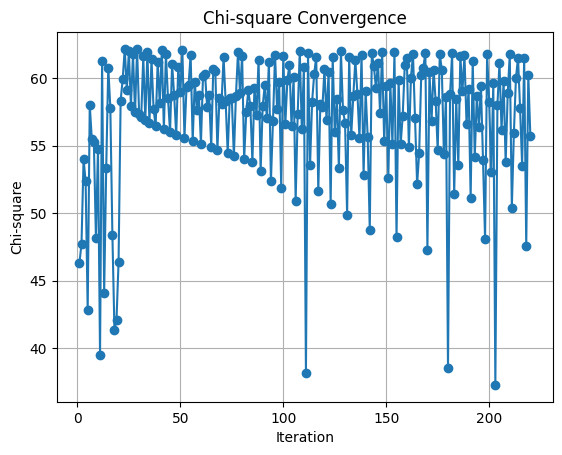

#########################################################
Current best solutions at iteration: 200
Best params among evaluated samples: tensor([[0.9000, 1.0515]]) tensor(2.5200)
Best params from GP map: tensor([[0.9000, 1.0677]]) tensor(2.5200)


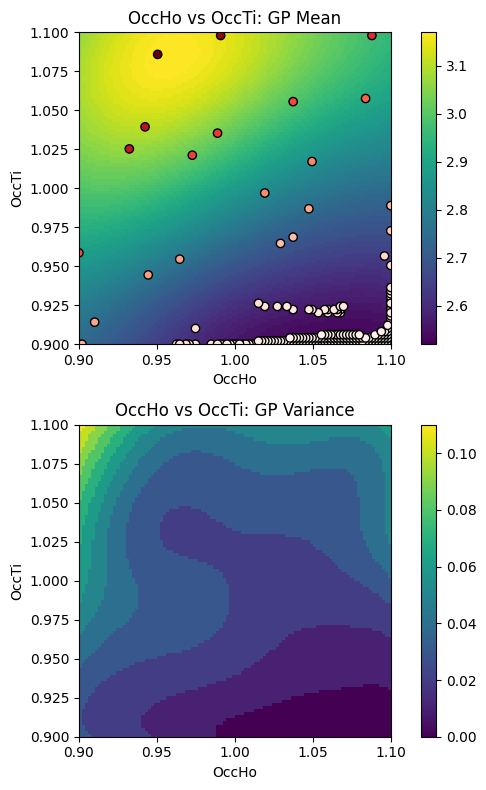

In [ ]:
#Initialize for BO
num_start =20  # Starting samples
N = 200 # Total BO iteration

#Define parameter space
x1 = torch.linspace(0.9, 1.1, 100) #OccTi
# x2 = torch.linspace(0, 0.01, 11) #UTi
x3 = torch.linspace(0.9, 1.1, 100) #OccHo
# x4 = torch.linspace(0, 0.01, 11) #UHo



#x1 = torch.linspace(0.5, 0.8, 100) #OccTi
# x2 = torch.linspace(0, 0.01, 11) #UTi
#x3 = torch.linspace(0.8, 1.1, 100) #OccHo
# x4 = torch.linspace(0, 0.01, 11) #UHo
X = [x1, x3]


# GSAS arrays
Fobs = []
Fcalc = []
iteration = 0

#Fixed parameters of experimental setup

# To change what parameters are varied, edit the gsas.py script
fix_params = [
    0.421597, # xO1
    0.920386, # OccO2
    0.008262, # UO1
    0.00325, #UO2
    0.00, #UTi
    0.00 #UHo
    ]

#BO
X_opt, X_opt_GP, train_X, train_Y, train_chisq, y_pred_means, y_pred_vars = BO_SpinIce(X, fix_params, num_start, N)
#print(X)